In [1]:
library(biomaRt)

In [4]:
library(BiocManager)
library(GEOquery)
library(limma)
library(umap)
library(ggplot2)
library(biomaRt)
library(stringi)
library(stringr)
library(msigdbr)
library(data.table)
library(org.Hs.eg.db)

Bioconductor version 3.10 (BiocManager 1.30.10), ?BiocManager::install for help

Bioconductor version '3.10' is out-of-date; the current release version '3.15'
  is available with R version '4.2'; see https://bioconductor.org/install

Loading required package: Biobase

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.

In [5]:
# Background set of genes
background_set <- fread("../data/background_set.txt")

In [6]:
nrow(background_set)

[1] 38280

In [7]:
### make sure to create the necessary folders
# regen_genes - repository for genes  associated  with  regeneration

In [8]:
# biomart variables
ensembl <- useMart("ensembl")

# annotation list
annotations <- list()
human <- useDataset(dataset="hsapiens_gene_ensembl", mart=ensembl)
zebrafish <- useMart("ensembl", dataset="drerio_gene_ensembl")
# no annotation on biomart
#xlaevis <- useMart("ensembl", dataset="xlaevis_gene_ensembl")
#xtropicalis <- useMart("ensembl", dataset="xtropicalis_gene_ensembl")
dmelanogaster <- useMart("ensembl", dataset="dmelanogaster_gene_ensembl")
mmusculus <- useMart("ensembl", dataset="mmusculus_gene_ensembl")
ssalar <- useMart("ensembl", dataset="ssalar_gene_ensembl")
scerevisiae <- useMart("ensembl", dataset="scerevisiae_gene_ensembl")
sscrofa <- useMart("ensembl", dataset="sscrofa_gene_ensembl")
rnorvegicus <- useMart("ensembl", dataset="rnorvegicus_gene_ensembl")
ecaballus <- useMart("ensembl", dataset="ecaballus_gene_ensembl")
clfamiliaris <- useMart("ensembl", dataset="clfamiliaris_gene_ensembl")
oaries <- useMart("ensembl", dataset="oaries_gene_ensembl")
ggallus <- useMart("ensembl", dataset="ggallus_gene_ensembl")
celegans <- useMart("ensembl", dataset="celegans_gene_ensembl")

ERROR: Error in curl::curl_fetch_memory(url, handle = handle): Operation was aborted by an application callback


In [9]:
human_drerio <- fread("../data/biomart_orthologs/human_drerio.txt.gz")
human_dmelanogaster <- fread("../data/biomart_orthologs/human_dmelanogaster.txt.gz")
human_celegans <- fread("../data/biomart_orthologs/human_celegans.txt.gz")
human_mmusculus <- fread("../data/biomart_orthologs/human_mmusculus.txt.gz")
human_rnorvegicus <- fread("../data/biomart_orthologs/human_rnorvegicus.txt.gz")
human_sscrofa <- fread("../data/biomart_orthologs/human_sscrofa.txt.gz")
human_cfamiliaris <- fread("../data/biomart_orthologs/human_cfamiliaris.txt.gz")

In [10]:
# global variables
topSigGenes <- 250

In [11]:
# Regeneration data sets
# GSE120962 - Danio rerio 
# GSE79299 - Ambystoma mexicanum 
# GSE168303 - Homo Sapiens 

# Functions

In [12]:
# function to download and get DEGs
getDEG <- function(geoAccession, geoProcessor, gsms, tT_add_columns, annotation, exp_design) {
    # list to return items
    qrList <- list()

    # download
    gset <- getGEO(geoAccession, GSEMatrix =TRUE, AnnotGPL=annotation)
    if (length(gset) > 1) idx <- grep(geoPlatform, attr(gset, "names")) else idx <- 1
    gset <- gset[[idx]]
    
    # make proper column names to match toptable 
    fvarLabels(gset) <- make.names(fvarLabels(gset))
    
    # group membership for all samples
    sml <- strsplit(gsms, split="")[[1]]
    
    # filter out excluded samples (marked as "X")
    sel <- which(sml != "X")
    sml <- sml[sel]
    gset <- gset[ ,sel]

    
    # auto-detect feature to determine if the values are or are not in log space 
    # if not log2 transformation
    # if qx[5] > 100 is true than at least 1% of the data is bigger than 100.
    # A value of 100 or bigger can not be the result of log transformation
    # because the reverse 2-log (2^100) is so big that you cannot even calculate it! 
    # sources biostars and GEO2R
    ex <- exprs(gset)
    qx <- as.numeric(quantile(ex, c(0., 0.25, 0.5, 0.75, 0.99, 1.0), na.rm=T))
    LogC <- (qx[5] > 100) || (qx[6]-qx[1] > 50 && qx[2] > 0)

    if (LogC) { ex[which(ex <= 0)] <- NaN
      exprs(gset) <- log2(ex) }
    
    # assign samples to groups and set up design matrix
    gs <- factor(sml)
    groups <- make.names(exp_design)
    levels(gs) <- groups
    gset$group <- gs
    design <- model.matrix(~group + 0, gset)
    colnames(design) <- levels(gs)

    fit <- lmFit(gset, design)  # fit linear model

    # set up contrasts of interest and recalculate model coefficients
    if(length(exp_design) > 2) {
        cts <- character(0)
        for(i in 1:(length(groups)-1)) {
            for(j in (i+1):length(groups)) {
                if(j <= length(groups))
                    cts<- append(cts,paste(groups[i], groups[j],sep="-"), length(cts))
            }
        }
        tT_colnames <- c("ID","adj.P.Val","P.Value","F")
    } else {
       cts <- paste(groups[1], groups[2], sep="-") 
        tT_colnames <- c("ID","adj.P.Val","P.Value","t","B","logFC")
    }
    cont.matrix <- makeContrasts(contrasts=cts, levels=design)
    fit2 <- contrasts.fit(fit, cont.matrix)

    # compute statistics and table of top significant genes
    fit2 <- eBayes(fit2, 0.01)
    tT <- topTable(fit2, adjust="fdr", sort.by="B", number=250)
    
    tT_colnames <- append(tT_colnames, tT_add_columns, after = length(tT_colnames))
    tT <- subset(tT, select=tT_colnames)
    
    # Visualize and quality control test results.
    # Build histogram of P-values for all genes. Normal test
    # assumption is that most genes are not differentially expressed.
    tT2 <- topTable(fit2, adjust="fdr", sort.by="B", number=Inf)
    
    hist(tT2$adj.P.Val, col = "grey", border = "white", xlab = "P-adj",
                                                 ylab = "Number of genes", main = "P-adj value distribution")
    
    # summarize test results as "up", "down" or "not expressed"
    dT <- decideTests(fit2, adjust.method="fdr", p.value=0.05)

    # Venn diagram of results
    if(length(cts) < 5)
        vennDiagram(dT, circle.col=palette())

    # create Q-Q plot for t-statistic
    t.good <- which(!is.na(fit2$F)) # filter out bad probes
    qqt(fit2$t[t.good], fit2$df.total[t.good], main="Moderated t statistic")

    # volcano plot (log P-value vs log fold change)
    colnames(fit2) # list contrast names
    ct <- 1        # choose contrast of interest
    volcanoplot(fit2, coef=ct, main=colnames(fit2)[ct], pch=20,
      highlight=length(which(dT[,ct]!=0)), names=rep('+', nrow(fit2)))

    # MD plot (log fold change vs mean log expression)
    # highlight statistically significant (p-adj < 0.05) probes
    plotMD(fit2, column=ct, status=dT[,ct], legend=F, pch=20, cex=1)
    abline(h=0)
    
    return(list("gset" = gset, "gsetExprs" = exprs(gset),
                "sampleGroups" = gs, "DEGs" = subset(tT2, select=tT_colnames), "fit2" = fit2, "tT2" = tT2))
}

In [13]:
#plot functions for geo data
# box-and-whisker plot
box_and_whisker_gset <- function(geoAccession, gset, gs, ex, xs) {
    if(xs){
        ex <- ex[ , colSums(is.na(ex)) == 0]
    }
    ord <- order(gs)[1:ncol(ex)]  # order samples by group
    palette(c("#1B9E77", "#7570B3", "#E7298A", "#E6AB02", "#D95F02",
              "#66A61E", "#A6761D", "#B32424", "#B324B3", "#666666"))
    par(mar=c(7,4,2,1))
    title <- paste(geoAccession, "/", annotation(gset), sep ="")
    boxplot(ex[,ord], boxwex=0.6, notch=T, main=title, outline=FALSE, las=2, col=gs[ord])
    legend("topleft", levels(gs), fill=palette(), bty="n")
}

#### expression value distribution
exp_val_dist_gset <- function(geoAccession, gset, gs, ex, xs) {
    if(xs){
        ex <- ex[ , colSums(is.na(ex)) == 0]
    }
    par(mar=c(4,4,2,1))
    title <- paste (geoAccession, "/", annotation(gset), " value distribution", sep ="")
    plotDensities(ex, group=gs, main=title, legend ="topright")
}

#### UMAP plot
getUMAP_gset <- function(ex, neighbors, gs, xs) {
    if(xs){
        ex <- ex[ , colSums(is.na(ex)) == 0]
    }
    ex <- na.omit(ex) # eliminate rows with NAs
    ex <- ex[!duplicated(ex), ]  # remove duplicates
    ump <- umap(t(ex), n_neighbors = neighbors, random_state = 123)
    par(mar=c(3,3,2,6), xpd=TRUE)
    plot(ump$layout, main=paste("UMAP plot, nbrs=", neighbors, sep=""), xlab="", ylab="", col=gs, pch=20, cex=1.5)
    legend("topright", inset=c(-0.15,0), legend=levels(gs), pch=20,
    col=1:nlevels(gs), title="Group", pt.cex=1.5)
    library("maptools")  # point labels without overlaps
    pointLabel(ump$layout, labels = rownames(ump$layout), method="SANN", cex=0.6)
}

In [14]:
# filtering code

filter_transcripts <- function(geo_obj, transcript_to_gene_dict, organism_name,
                               attrbts, geo_code, experiments, pval,
                               human_orthologs){
    # extract correct human ortholog symbol
    #ensembl <- useMart("ensembl")
    #human <- useDataset("hsapiens_gene_ensembl", mart=ensembl)
    
    
    significant_transcripts <- geo_obj$tT2[(geo_obj$tT2$adj.P.Val < pval),]
    print(paste("Total significant transcripts:",
                nrow(significant_transcripts),
                sep = " "))
    
    total_exp_list <- list()
    for(i in 1:length(experiments)) {
        print("################################")
        print(paste(experiments[i], "LogFC", sep = " "))
        
        # separate into downregulated and upregulated with a cut off of logFC
        neg_significant_transcripts <- significant_transcripts[significant_transcripts[,experiments[i]]< -1,]
        pos_significant_transcripts <- significant_transcripts[significant_transcripts[,experiments[i]]> 1,]

        final_neg_human_orthologs <- map_ortholog("downregulated", organism_name, neg_significant_transcripts,
                                                  human_orthologs, experiments[i], geo_code, transcript_to_gene_dict)
        final_pos_human_orthologs <- map_ortholog("upregulated", organism_name, pos_significant_transcripts,
                                                  human_orthologs, experiments[i], geo_code, transcript_to_gene_dict)
        
        total_exp_list[[experiments[i]]] <- list("downregulated" = final_neg_human_orthologs,
                                                 "upregulated" = final_pos_human_orthologs,
                                                 "transcript_qvals"=significant_transcripts)
    }
    
    return(total_exp_list)

}

In [15]:
map_ortholog <- function(type, organism_name, significant_transcripts,
                         human_orthologs, experiment, geo_code, transcript_to_gene_dict) {
    labels <- c("downregulated" = "negative",
                "upregulated" = "positive")
    
    print(paste("Total transcripts with", labels[type],"logFC vals:",
                    nrow(significant_transcripts),
                    sep = " "))
    significant_genes <- unique(transcript_to_gene_dict[transcript_to_gene_dict$transcriptIDS %in% significant_transcripts$ID,]$transcriptGenes)
    
    print(paste("Total Significant", labels[type],"genes:",
                    length(significant_genes),
                    sep = " "))

    orthologous_significant_genes <- human_orthologs$human_gene[human_orthologs$organism_gene %in% significant_genes]

    print(paste("Total significant", type, organism_name, "genes after orthologous mapping and filtering:",
                    length(orthologous_significant_genes),
                    sep = " "))
    
    final_human_orthologs <- background_set$gene[background_set$gene %in% orthologous_significant_genes]
    
    print(paste("Total significant Final", type, "human othologs:",
                length(unique(final_human_orthologs)),
                sep = " "))
    # remove empty names and NAs
    # saveto the right  repository
    if(length(final_human_orthologs) > 0) {
    write.table(data.frame("HGNC" = unique(final_human_orthologs)),
                file = paste("./geo_degs/", organism_name, "_", geo_code, "_", experiment,
                             "_", type,".txt", sep=""), quote = FALSE, sep = "\t",
                row.names = FALSE, col.names = FALSE)
    }
    
    print(paste("./geo_degs/", organism_name, "_", geo_code, "_", experiment,
                             "_", type,".txt", sep=""))
    
    return(final_human_orthologs)
}

In [16]:
getDataRanges <- function(qval_object, column) {
    print(paste("adj.P.Val range: ",range(na.omit(qval_object$adj.P.Val))[1],
                " - ", range(na.omit(qval_object$adj.P.Val))[2], sep =""))
    print(paste("adj.P.Val neg logfc range: ",range(na.omit(qval_object[,column][qval_object[,column] < 0]))[1],
                " - ", range(na.omit(qval_object[,column][qval_object[,column] < 0]))[2], sep=""))
    print(paste("adj.P.Val pos logfc range: ",range(na.omit(qval_object[,column][qval_object[,column] > 0]))[1],
                " - ", range(na.omit(qval_object[,column][qval_object[,column] > 0]))[2], sep=""))
}

# Regeneration 

## Expression Data

### GSE120962 - drerio - heart

#### Data Download and Normalization

Found 1 file(s)

GSE120962_series_matrix.txt.gz

Using locally cached version: /lscratch/37391301/Rtmp1Rr7vR/GSE120962_series_matrix.txt.gz


── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  ID_REF = col_double(),
  GSM3422473 = col_double(),
  GSM3422474 = col_double(),
  GSM3422475 = col_double(),
  GSM3422476 = col_double(),
  GSM3422477 = col_double(),
  GSM3422478 = col_double(),
  GSM3422479 = col_double(),
  GSM3422480 = col_double(),
  GSM3422481 = col_double(),
  GSM3422482 = col_double(),
  GSM3422483 = col_double(),
  GSM3422484 = col_double(),
  GSM3422485 = col_double(),
  GSM3422486 = col_double(),
  GSM3422487 = col_double()
)


Warning message in download.file(myurl, destfile, mode = mode, quiet = TRUE, method = getOption("download.file.method.GEOquery")):
“cannot open URL 'https://ftp.ncbi.nlm.nih.gov/geo/platforms/GPL16nnn/GPL16933/annot/GPL16933.annot.gz': HTTP status was '404 Not 

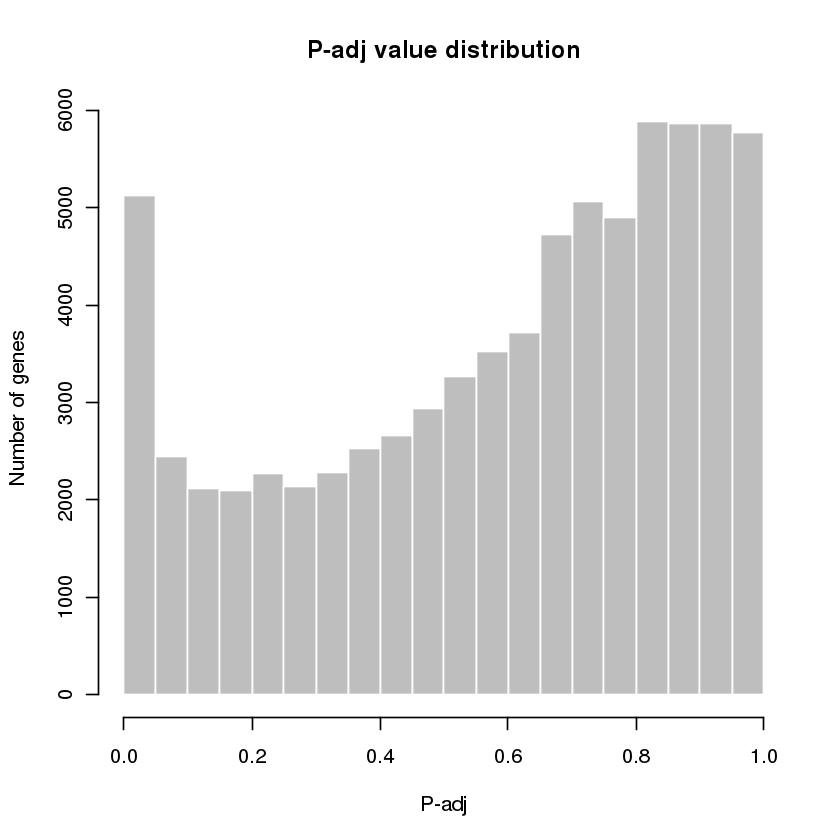

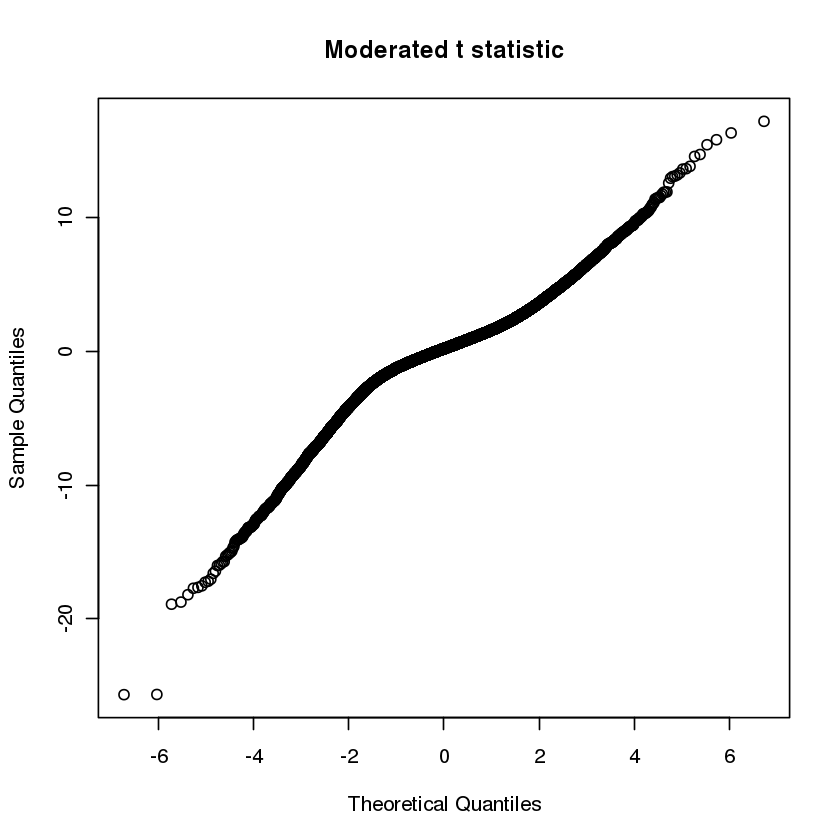

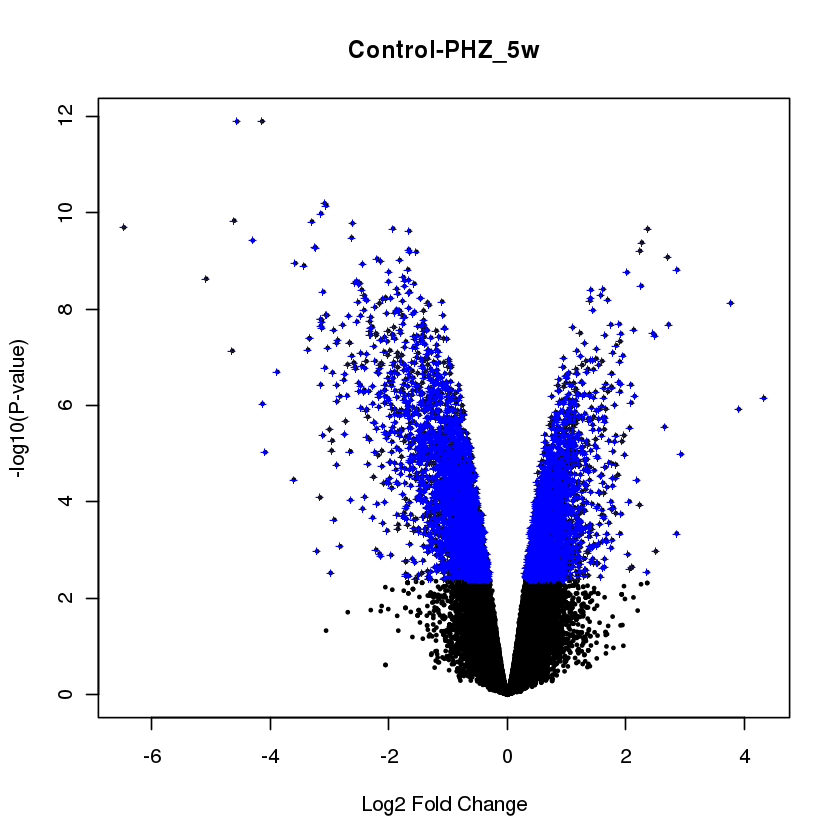

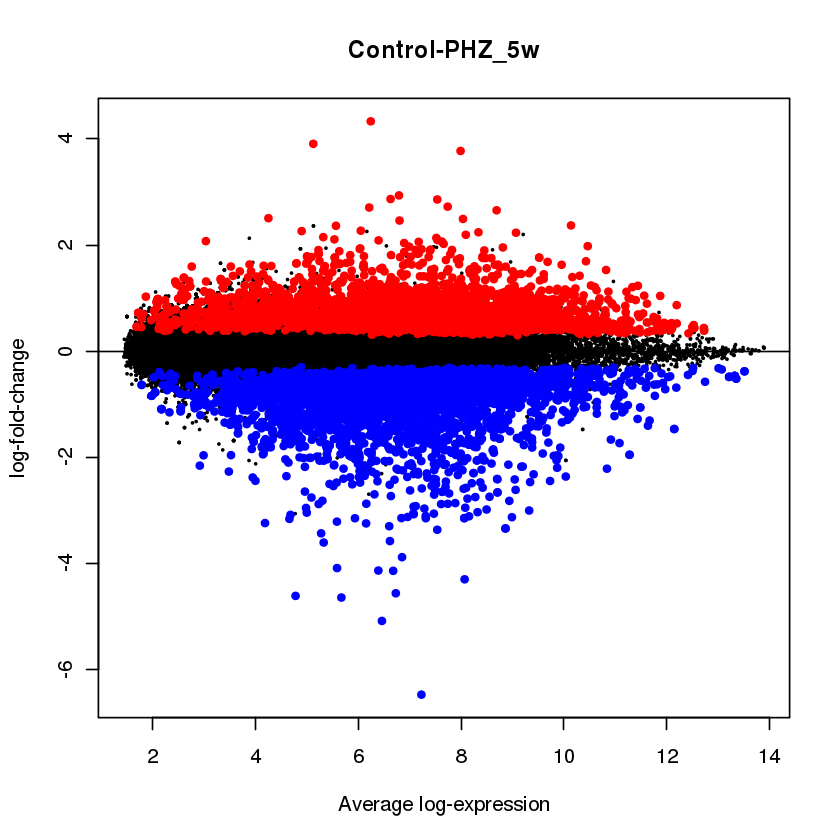

In [19]:
GSE120962_obj <- getDEG("GSE120962", "GPL16933", "000111222333444", "SPOT_ID", T,
                        c("Control","PHZ_5w","PHZ_5w_2d","PHZ_5w_5d","PHZ_5w_9d"))

#### Gene Expression data analysis

##### box-and-whisker plot

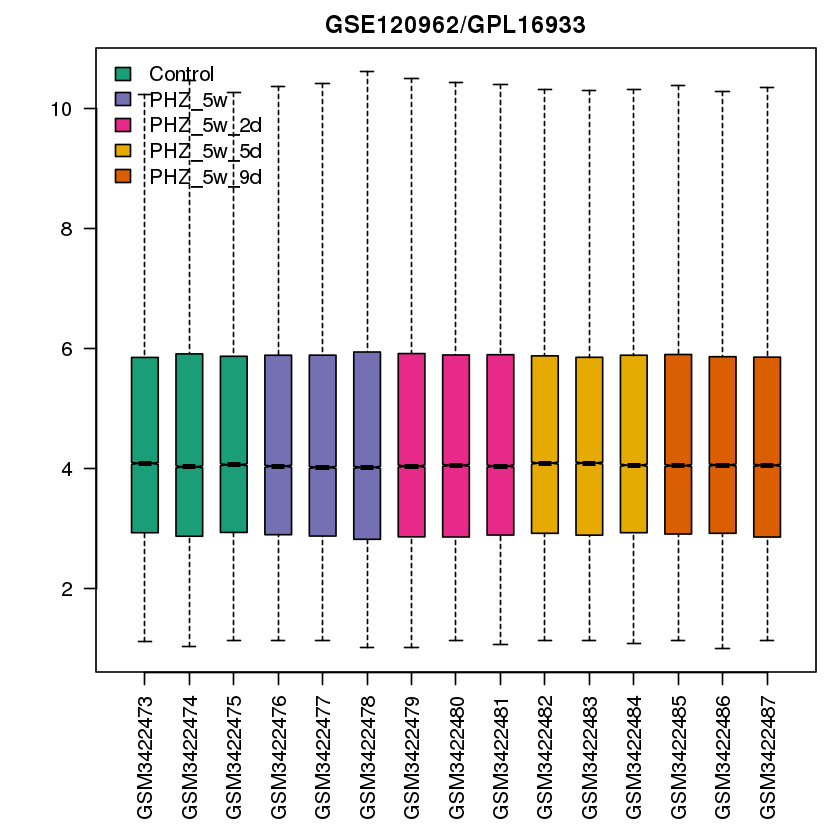

In [14]:
box_and_whisker_gset("GSE120962", GSE120962_obj$gset, GSE120962_obj$sampleGroups, GSE120962_obj$gsetExprs, F)

##### expression value distribution

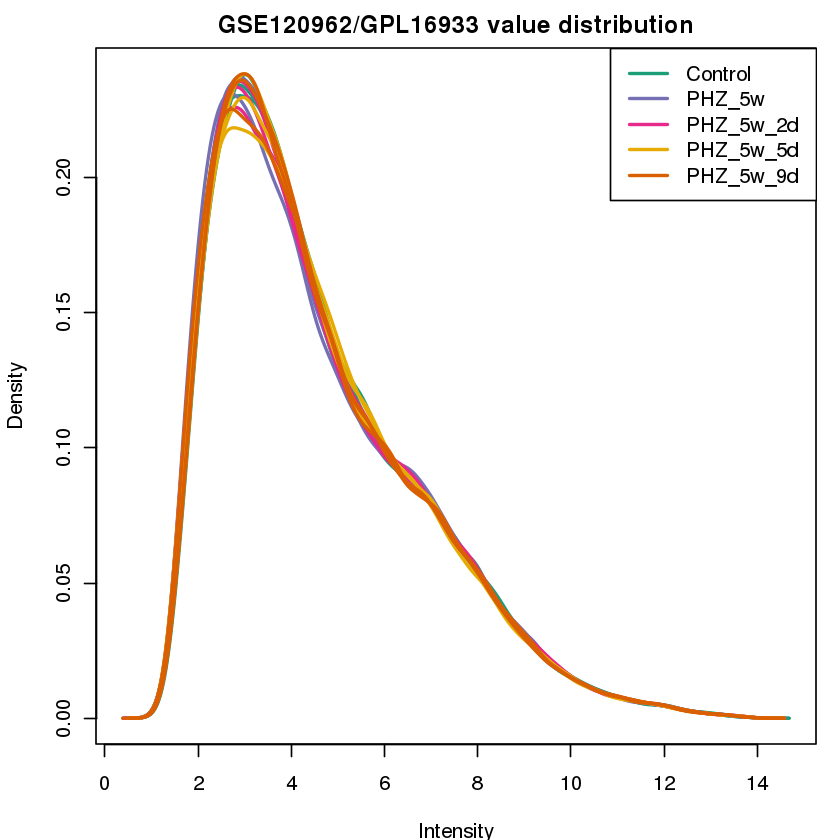

In [15]:
exp_val_dist_gset("GSE120962", GSE120962_obj$gset, GSE120962_obj$sampleGroups, GSE120962_obj$gsetExprs, F)

##### UMAP plot

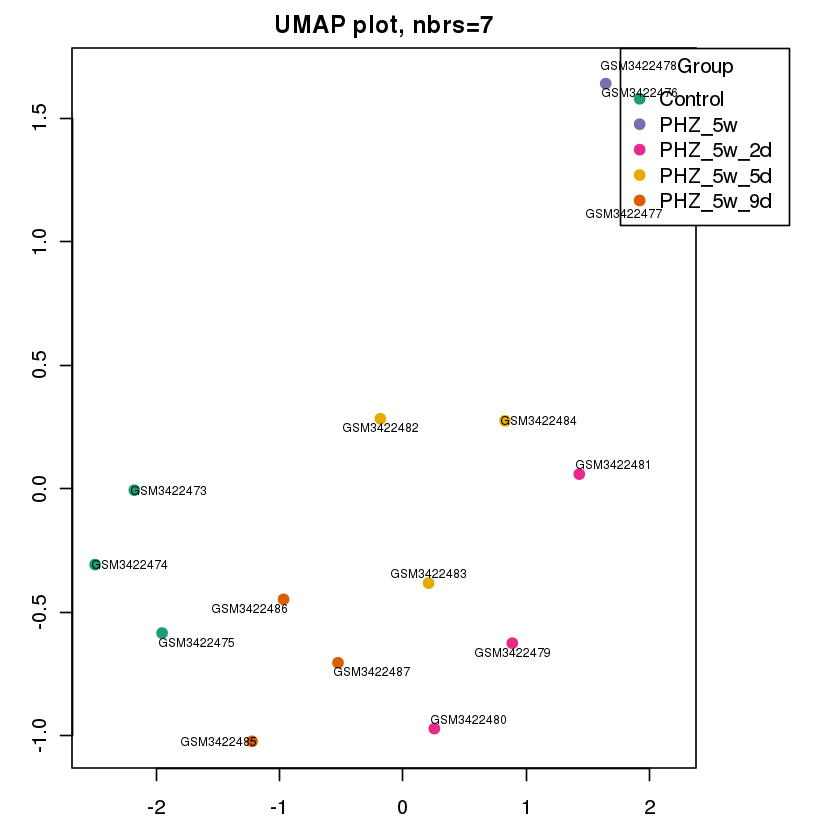

In [102]:
getUMAP_gset(GSE120962_obj$gsetExprs, 7, GSE120962_obj$sampleGroups, F)

##### mean-variance trend

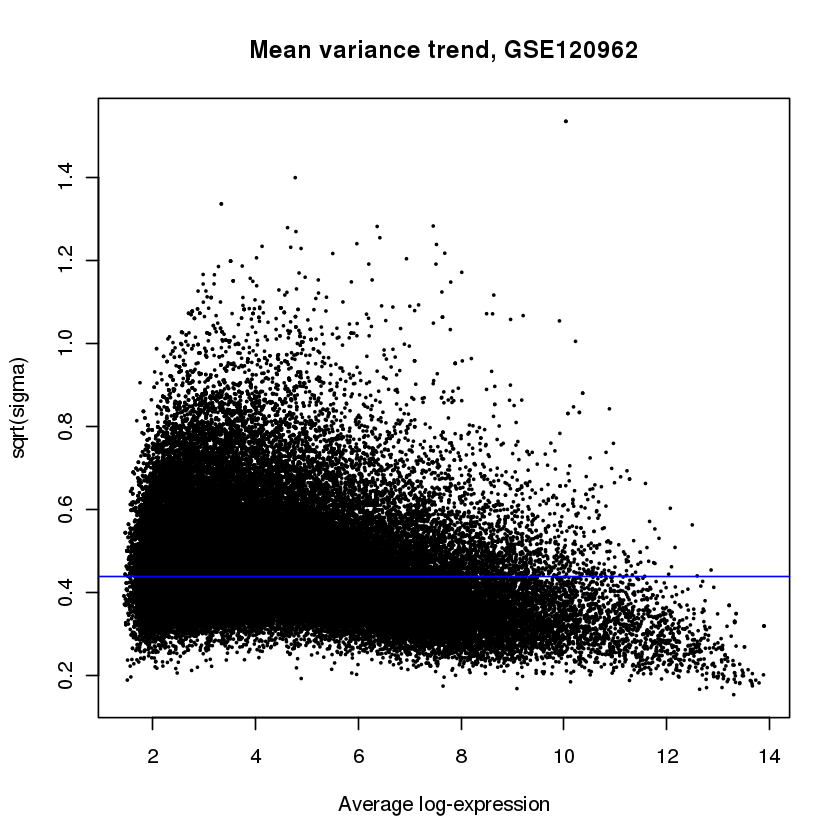

In [103]:
plotSA(GSE120962_obj$fit2, main=paste("Mean variance trend, ", "GSE120962", sep=""))

#### Extracting Human Orthologs of DEGs

In [20]:
names(GSE120962_obj$tT2)

[1] "ID"                    "seqname"               "strand"               
 [4] "start"                 "stop"                  "total_probes"         
 [7] "gene_assignment"       "mrna_assignment"       "swissprot"            
[10] "unigene"               "GO_biological_process" "GO_cellular_component"
[13] "GO_molecular_function" "pathway"               "protein_domains"      
[16] "crosshyb_type"         "category"              "SPOT_ID"              
[19] "Control.PHZ_5w"        "Control.PHZ_5w_2d"     "Control.PHZ_5w_5d"    
[22] "Control.PHZ_5w_9d"     "PHZ_5w.PHZ_5w_2d"      "PHZ_5w.PHZ_5w_5d"     
[25] "PHZ_5w.PHZ_5w_9d"      "PHZ_5w_2d.PHZ_5w_5d"   "PHZ_5w_2d.PHZ_5w_9d"  
[28] "PHZ_5w_5d.PHZ_5w_9d"   "AveExpr"               "F"                    
[31] "P.Value"               "adj.P.Val"

In [21]:
head(human_drerio)

Gene stable ID,Transcript stable ID,Gene name,Zebrafish gene stable ID,Zebrafish gene name,Zebrafish protein or transcript stable ID,"Zebrafish orthology confidence [0 low, 1 high]"
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
ENSG00000210049,ENST00000387314,MT-TF,,,,NA
ENSG00000211459,ENST00000389680,MT-RNR1,,,,NA
ENSG00000210077,ENST00000387342,MT-TV,,,,NA
ENSG00000210082,ENST00000387347,MT-RNR2,,,,NA
ENSG00000209082,ENST00000386347,MT-TL1,,,,NA
ENSG00000198888,ENST00000361390,MT-ND1,ENSDARG00000063895,mt-nd1,ENSDARP00000087869,1


In [73]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE120962_obj$tT2), sep=" "))
transcriptToGene <- pData(featureData(GSE120962_obj$gset))
totalGenes <- transcriptToGene[as.character(GSE120962_obj$tT2$ID),]

viable_transcripts <- 0
viable_transcripts_ids <- character(0)
total_transcript_genes <- character(0)
for(i in 1:nrow(totalGenes)) {
    current_string <- totalGenes$'gene_assignment'[i]
    if(length(current_string) == 1 & current_string == "---") {next}
    
    unlist1 <- unlist(strsplit(current_string, "/// "))
    unlist2 <- unlist(strsplit(unlist1, " // "))
    gene_symbols <- unlist2[2]
    
    if(is.null(gene_symbols)) {next}
    if(length(gene_symbols) < 1) {next}
    viable_transcripts <- viable_transcripts+1
    viable_transcripts_ids <- append(viable_transcripts_ids, rep(totalGenes$ID[i],
                                                                 length(gene_symbols)), length(viable_transcripts_ids))
    total_transcript_genes <- append(total_transcript_genes, gene_symbols, length(total_transcript_genes))
}

transcript_id_dict <- data.frame("transcriptGenes" = total_transcript_genes, "transcriptIDS" = viable_transcripts_ids)

print(paste("Total transcripts with an associated zebrafish gene:", viable_transcripts, sep=" "))
print(paste("Total associated zebrafish genes:", length(total_transcript_genes), sep=" "))


GSE120962_lfc_columns<- c('Control.PHZ_5w','Control.PHZ_5w_2d','Control.PHZ_5w_5d',
                          'Control.PHZ_5w_9d','PHZ_5w.PHZ_5w_2d','PHZ_5w.PHZ_5w_5d',
                          'PHZ_5w.PHZ_5w_9d','PHZ_5w_2d.PHZ_5w_5d','PHZ_5w_2d.PHZ_5w_9d',
                          'PHZ_5w_5d.PHZ_5w_9d')
GSE120962_lfc_genes <- filter_transcripts(GSE120962_obj, transcript_id_dict, "drerio_regen_GSE120962", 
                                          "ensembl_transcript_id", "GSE120962",
                                          GSE120962_lfc_columns, pval = 0.05,
                                          data.frame("human_gene"=human_drerio$`Gene name`,
                                                     "organism_gene"=human_drerio$`Zebrafish gene name`))

[1] "Total Transcripts: 75212"
[1] "Total transcripts with an associated zebrafish gene: 24851"
[1] "Total associated zebrafish genes: 24851"
[1] "Total significant transcripts: 5123"
[1] "################################"
[1] "Control.PHZ_5w LogFC"
[1] "Total transcripts with negative logFC vals: 992"
[1] "Total Significant negative genes: 629"
[1] "Total significant downregulated drerio_regen_GSE120962 genes after orthologous mapping and filtering: 3750"
[1] "Total significant Final downregulated human othologs: 344"
[1] "./geo_degs/drerio_regen_GSE120962_GSE120962_Control.PHZ_5w_downregulated.txt"
[1] "Total transcripts with positive logFC vals: 439"
[1] "Total Significant positive genes: 197"
[1] "Total significant upregulated drerio_regen_GSE120962 genes after orthologous mapping and filtering: 955"
[1] "Total significant Final upregulated human othologs: 112"
[1] "./geo_degs/drerio_regen_GSE120962_GSE120962_Control.PHZ_5w_upregulated.txt"
[1] "################################"
[1

### GSE79299 Amexicanum - Spinal cord

#### Data Download and Normalization

Found 1 file(s)

GSE79299_series_matrix.txt.gz


── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  ID_REF = col_character(),
  GSM2091077 = col_double(),
  GSM2091078 = col_double(),
  GSM2091079 = col_double(),
  GSM2091080 = col_double(),
  GSM2091081 = col_double(),
  GSM2091082 = col_double(),
  GSM2091083 = col_double(),
  GSM2091084 = col_double(),
  GSM2091085 = col_double(),
  GSM2091086 = col_double(),
  GSM2091087 = col_double(),
  GSM2091088 = col_double()
)


Warning message in download.file(myurl, destfile, mode = mode, quiet = TRUE, method = getOption("download.file.method.GEOquery")):
“cannot open URL 'https://ftp.ncbi.nlm.nih.gov/geo/platforms/GPL15nnn/GPL15153/annot/GPL15153.annot.gz': HTTP status was '404 Not Found'”
Annotation GPL not available, so will use submitter GPL instead

File stored at: 

/lscratch/37391301/Rtmp1Rr7vR/GPL15153.soft



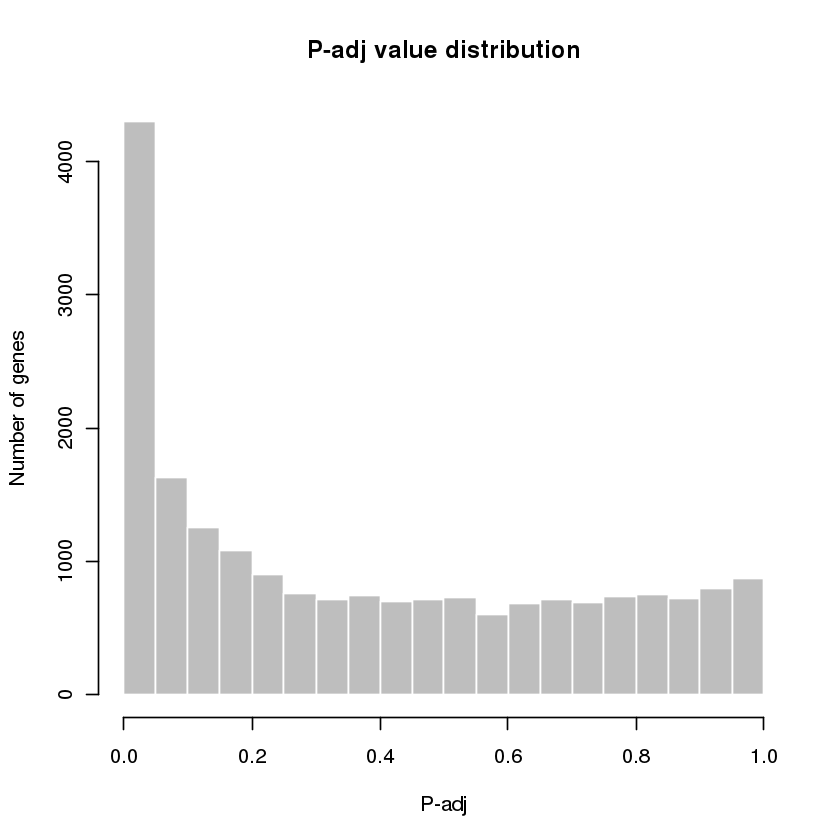

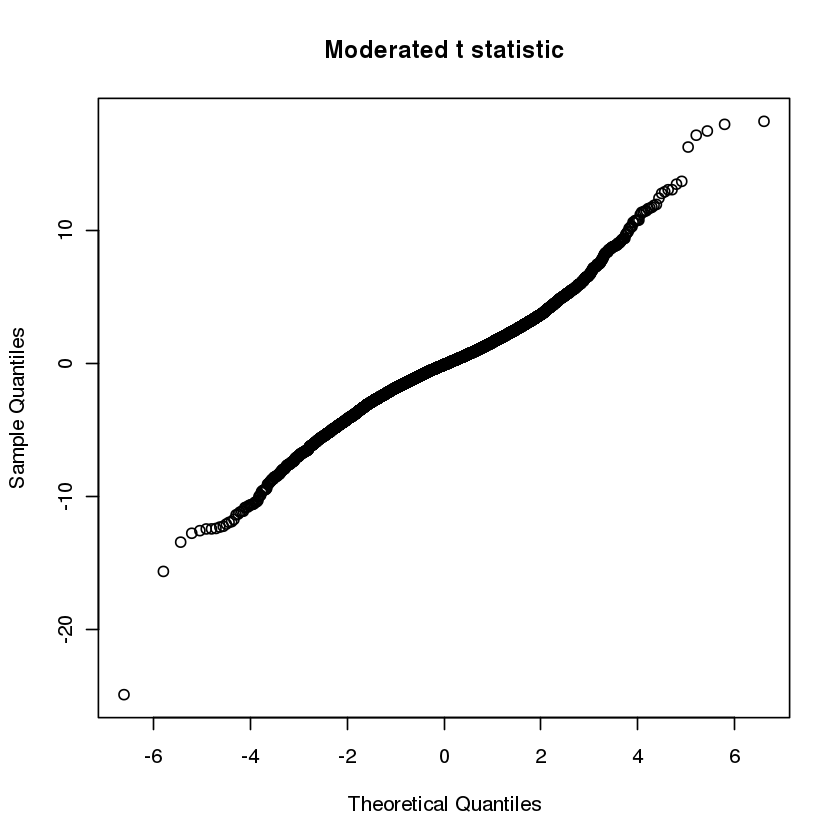

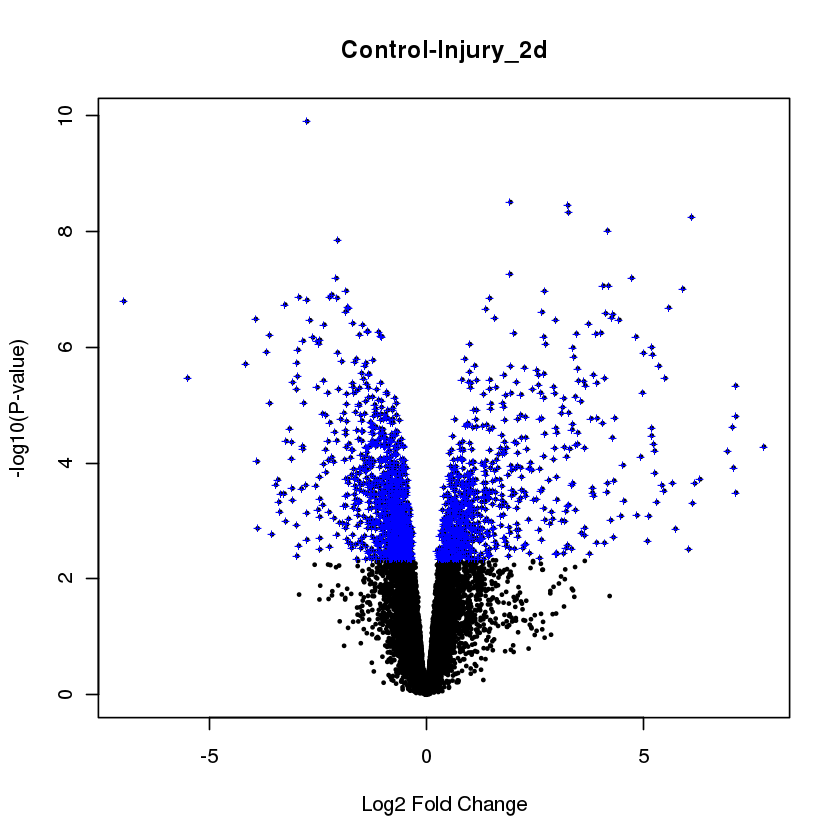

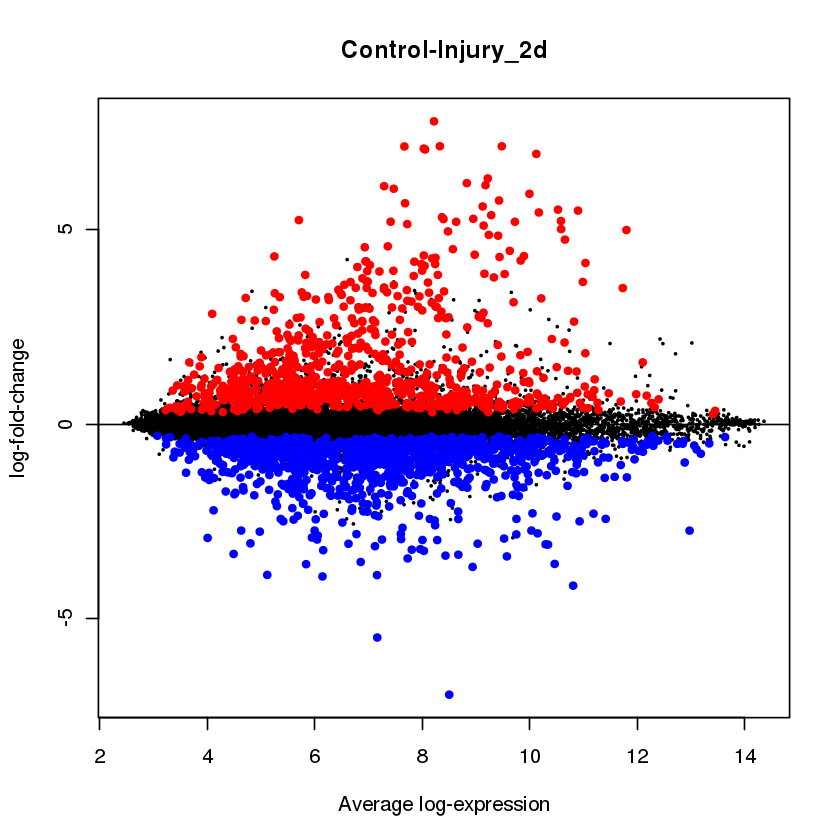

In [74]:
GSE79299_obj <- getDEG("GSE79299", "GPL15153", "000111222333", "SPOT_ID", T,
                      c("Control","Injury_2d","Injury_14d","Injury_21d"))

#### Gene Expression data analysis

##### box-and-whisker plot

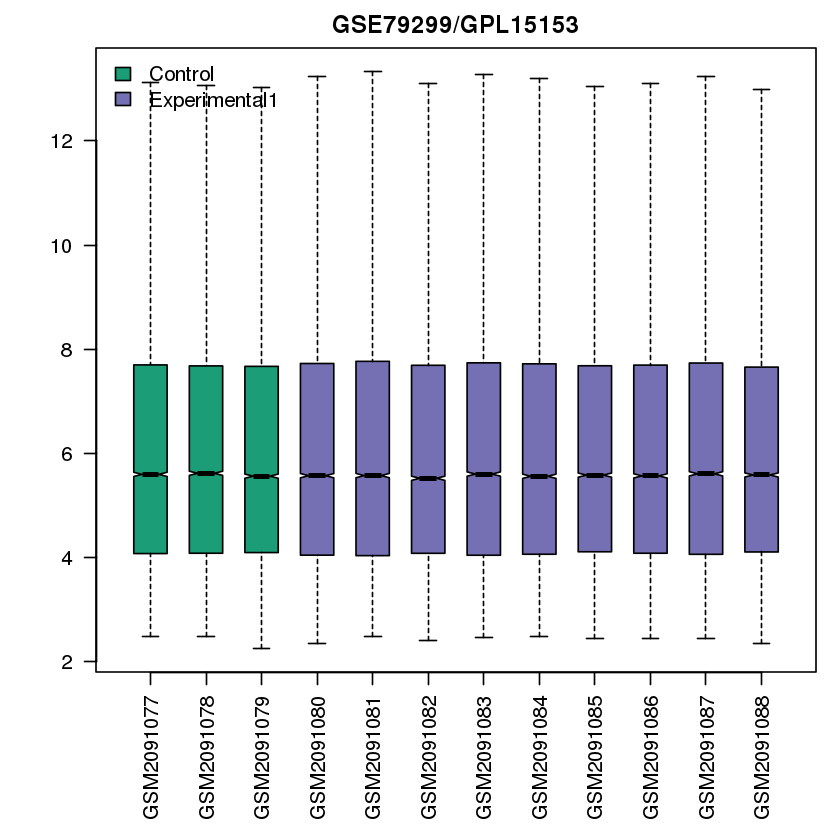

In [71]:
box_and_whisker_gset("GSE79299", GSE79299_obj$gset, GSE79299_obj$sampleGroups, GSE79299_obj$gsetExprs,F)

##### expression value distribution

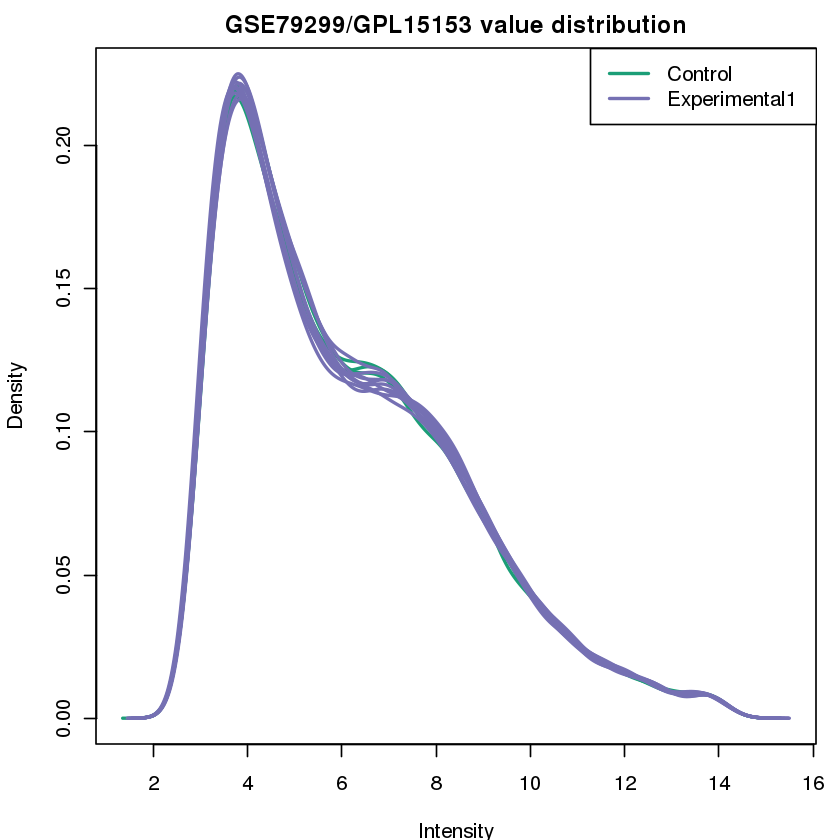

In [72]:
exp_val_dist_gset("GSE79299", GSE79299_obj$gset, GSE79299_obj$sampleGroups, GSE79299_obj$gsetExprs,F)

##### UMAP plot

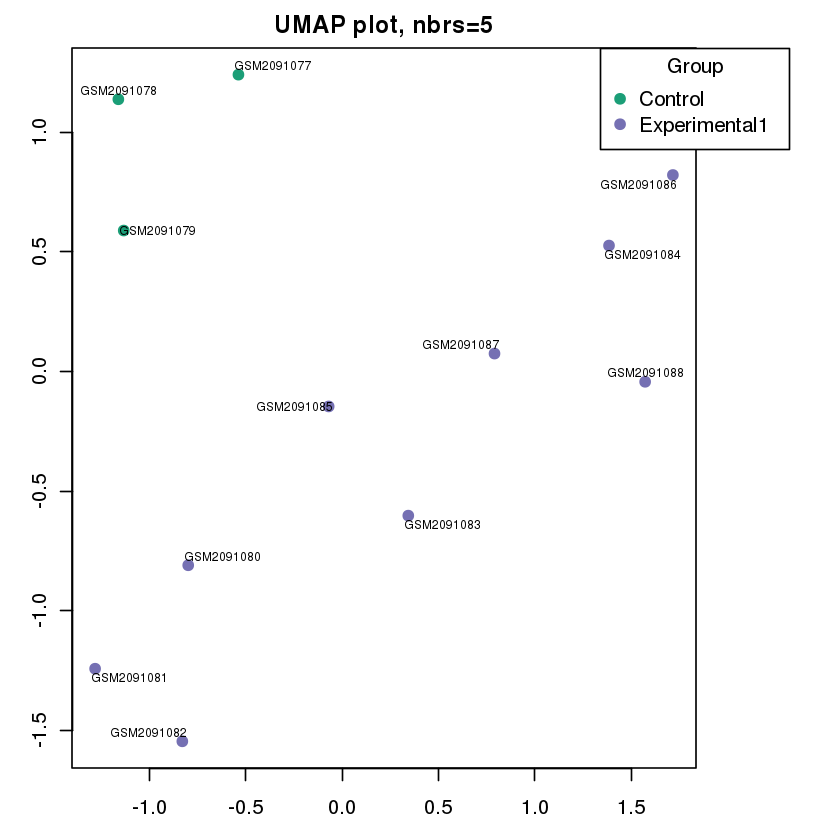

In [73]:
getUMAP_gset(GSE79299_obj$gsetExprs, 5, GSE79299_obj$sampleGroups,F)

##### mean-variance trend

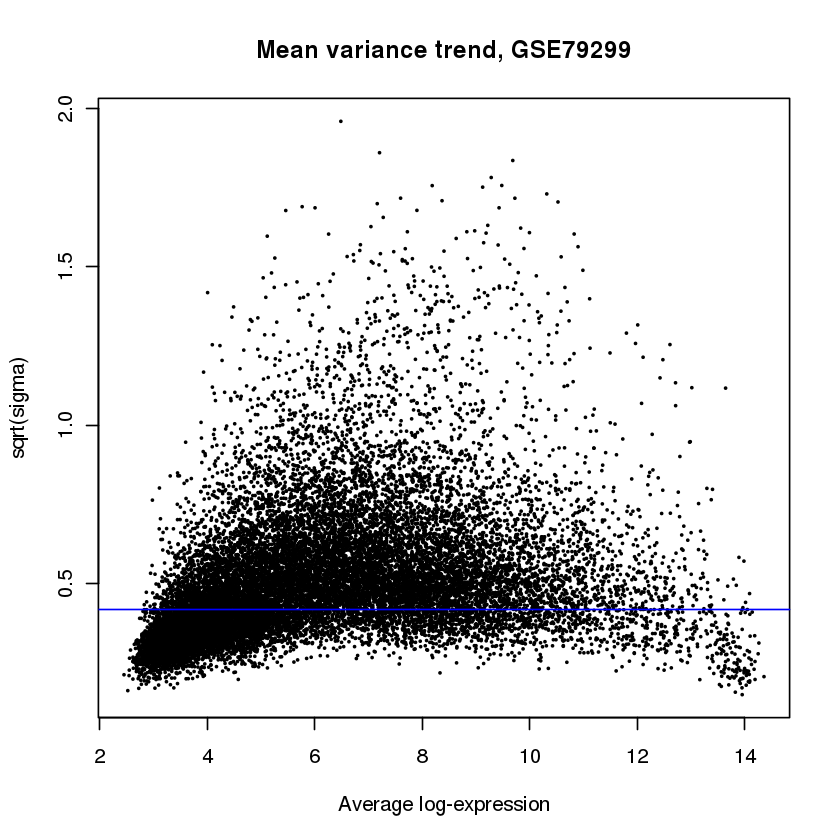

In [74]:
plotSA(GSE79299_obj$fit2, main=paste("Mean variance trend, ", "GSE79299", sep=""))

#### Extracting Human Orthologs of DEGs

In [75]:
names(GSE79299_obj$tT2)

[1] "ID"                    "Contig_ID"             "GeneName"             
 [4] "GeneSymbol"            "SPOT_ID"               "Control.Injury_2d"    
 [7] "Control.Injury_14d"    "Control.Injury_21d"    "Injury_2d.Injury_14d" 
[10] "Injury_2d.Injury_21d"  "Injury_14d.Injury_21d" "AveExpr"              
[13] "F"                     "P.Value"               "adj.P.Val"

In [76]:
head(GSE79299_obj$tT2)

,ID,Contig_ID,GeneName,GeneSymbol,SPOT_ID,Control.Injury_2d,Control.Injury_14d,Control.Injury_21d,Injury_2d.Injury_14d,Injury_2d.Injury_21d,Injury_14d.Injury_21d,AveExpr,F,P.Value,adj.P.Val
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
axo00770-f_at,axo00770-f_at,contig38543,collagen triple helix repeat containing 1 [Homo sapiens],CTHRC1,axo00770-f_at,-2.7405147,-4.7343437,-5.266645,-1.993829,-2.5261307,-0.5323018,10.032962,940.4852,5.601265e-13,1.124734e-08
axo04567-r_at,axo04567-r_at,contig15919,cubilin [Homo sapiens],CUBN,axo04567-r_at,-0.2534585,-4.1383799,-3.091182,-3.884921,-2.8377232,1.0471981,6.661614,383.4400,5.849711e-11,5.873110e-07
axo00376-f_at,axo00376-f_at,contig81611,alpha 1 type XI collagen isoform B preproprotein [Homo sapiens],COL11A1,axo00376-f_at,-1.2596396,-4.6302156,-5.445779,-3.370576,-4.1861399,-0.8155639,7.047282,227.0905,8.676940e-10,5.807765e-06
axo01322-r_at,axo01322-r_at,contig39889,high mobility group AT-hook 1 isoform b [Homo sapiens],HMGA1,axo01322-r_at,-2.0651281,0.7539407,1.198807,2.819069,3.2639348,0.4448659,6.987574,177.1517,3.093194e-09,1.552783e-05
axo08099-f_at,axo08099-f_at,contig81275,lysyl oxidase-like 2 precursor [Homo sapiens],LOXL2,axo08099-f_at,-0.1261821,-2.0675080,-2.787962,-1.941326,-2.6617801,-0.7204542,9.108706,156.9752,5.730673e-09,1.716148e-05
axo28043-f_at,axo28043-f_at,contig38891,No Hit,,axo28043-f_at,-1.7825709,-3.1007739,-1.991357,-1.318203,-0.2087857,1.1094172,7.236959,146.9984,8.004305e-09,1.716148e-05


In [79]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE79299_obj$tT2), sep=" "))
GSE79299_transcriptToGene <- pData(featureData(GSE79299_obj$gset))
GSE79299_totalGenes <- GSE79299_transcriptToGene[as.character(GSE79299_obj$tT2$ID),]
GSE79299_avail_symbols <- GSE79299_totalGenes[GSE79299_totalGenes$GeneSymbol !=  "",]
print(paste("Total Transcripts with available symbols:", nrow(GSE79299_avail_symbols), sep=" "))

GSE79299_transcript_id_to_ho_dict <- data.frame("transcriptGenes" = GSE79299_avail_symbols$GeneSymbol,
                                 "transcriptIDS" = GSE79299_avail_symbols$ID)

GSE79299_lfc_columns<- c('Control.Injury_2d','Control.Injury_14d','Control.Injury_21d',
                          'Injury_2d.Injury_14d','Injury_2d.Injury_21d','Injury_14d.Injury_21d')
GSE79299_lfc_genes <- filter_transcripts(GSE79299_obj, GSE79299_transcript_id_to_ho_dict,
                                         "amexicanum_regen_GSE79299", "hgnc_symbol", "GSE79299",
                                         GSE79299_lfc_columns, pval=.05,
                                        data.frame("human_gene"=human_drerio$`Gene name`,
                                                     "organism_gene"=human_drerio$`Gene name`))

[1] "Total Transcripts: 20080"
[1] "Total Transcripts with available symbols: 14744"
[1] "Total significant transcripts: 4302"
[1] "################################"
[1] "Control.Injury_2d LogFC"
[1] "Total transcripts with negative logFC vals: 380"
[1] "Total Significant negative genes: 267"
[1] "Total significant downregulated amexicanum_regen_GSE79299 genes after orthologous mapping and filtering: 3661"
[1] "Total significant Final downregulated human othologs: 247"
[1] "./geo_degs/amexicanum_regen_GSE79299_GSE79299_Control.Injury_2d_downregulated.txt"
[1] "Total transcripts with positive logFC vals: 428"
[1] "Total Significant positive genes: 306"
[1] "Total significant upregulated amexicanum_regen_GSE79299 genes after orthologous mapping and filtering: 4061"
[1] "Total significant Final upregulated human othologs: 288"
[1] "./geo_degs/amexicanum_regen_GSE79299_GSE79299_Control.Injury_2d_upregulated.txt"
[1] "################################"
[1] "Control.Injury_14d LogFC"
[1] "Tot

### GSE168303 Hsapiens - osteoblast

#### Data Download and Normalization

Found 1 file(s)

GSE168303_series_matrix.txt.gz


── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  ID_REF = col_character(),
  GSM5136231 = col_double(),
  GSM5136232 = col_double(),
  GSM5136233 = col_double(),
  GSM5136234 = col_double(),
  GSM5136235 = col_double(),
  GSM5136236 = col_double()
)


Warning message in download.file(myurl, destfile, mode = mode, quiet = TRUE, method = getOption("download.file.method.GEOquery")):
“cannot open URL 'https://ftp.ncbi.nlm.nih.gov/geo/platforms/GPL13nnn/GPL13369/annot/GPL13369.annot.gz': HTTP status was '404 Not Found'”
Annotation GPL not available, so will use submitter GPL instead

File stored at: 

/lscratch/37391301/Rtmp1Rr7vR/GPL13369.soft

Warning message:
“3270 parsing failures.
  row        col           expected    actual         file
13356 UNIGENE_ID 1/0/T/F/TRUE/FALSE Hs.100261 literal data
13357 UNIGENE_ID 1/0/T/F/TRUE/FALSE Hs.101139 literal d

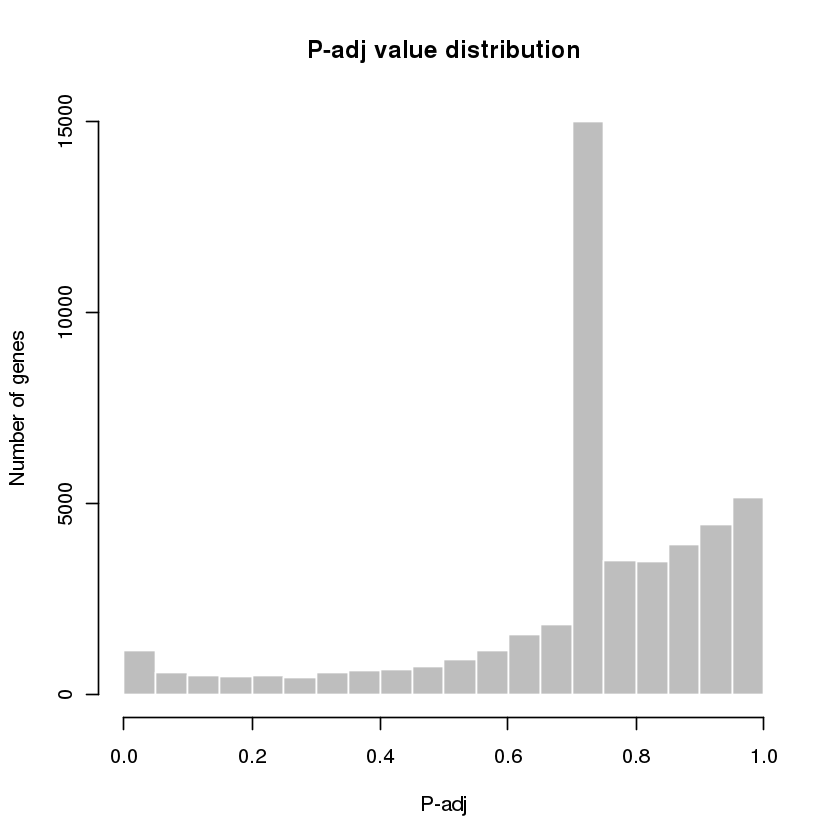

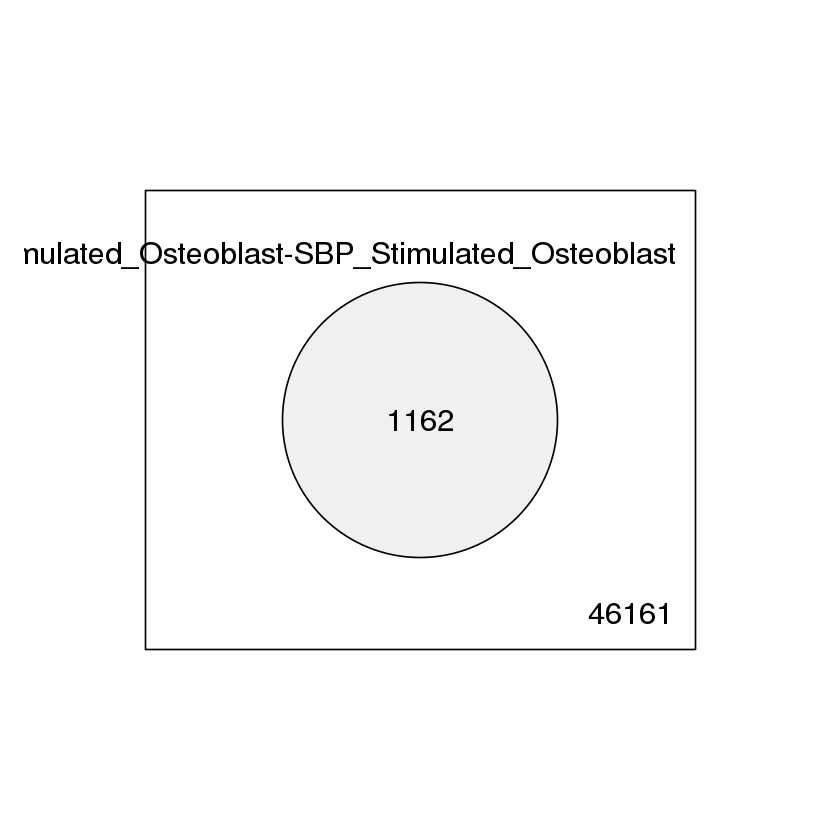

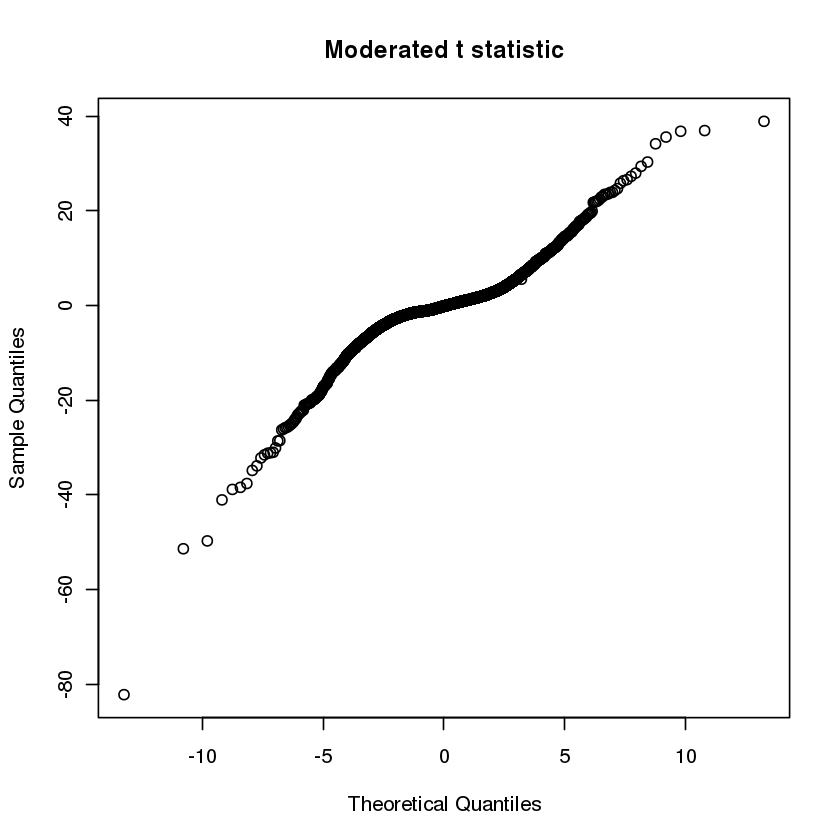

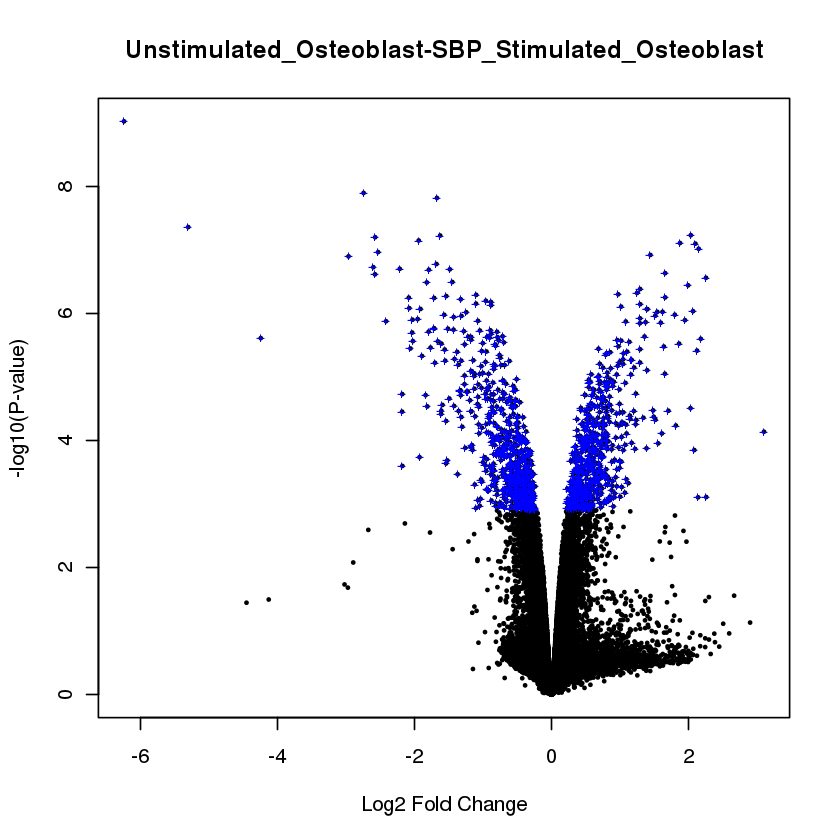

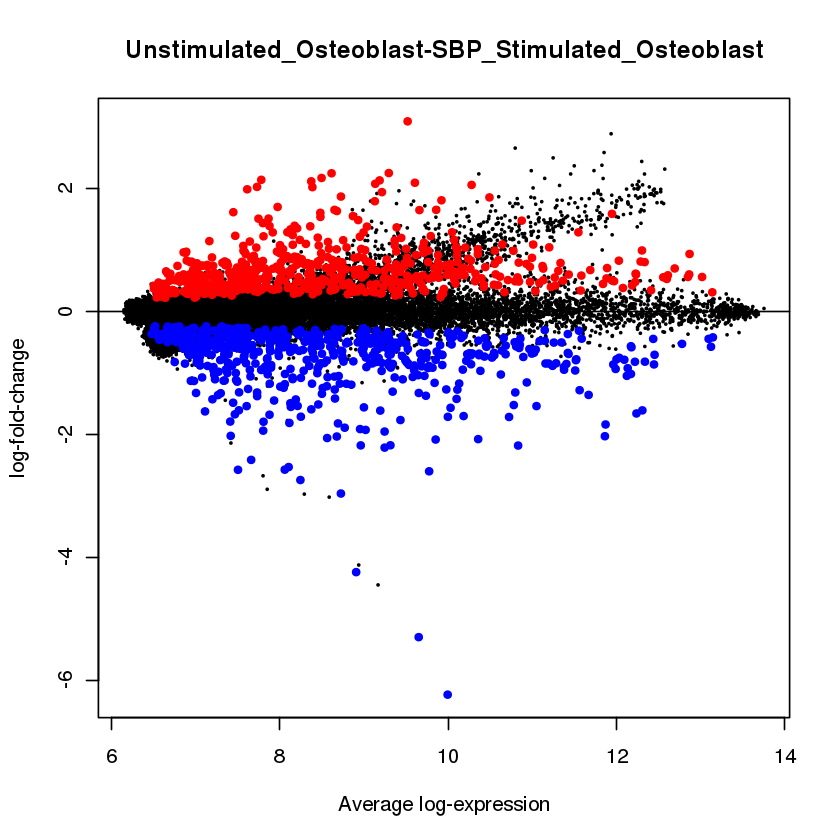

In [80]:
GSE168303_obj <- getDEG("GSE168303", "GPL13369", "111000", "SYMBOL", T,
                       c("Unstimulated_Osteoblast","SBP_Stimulated_Osteoblast"))

#### Gene Expression data analysis

##### box-and-whisker plot

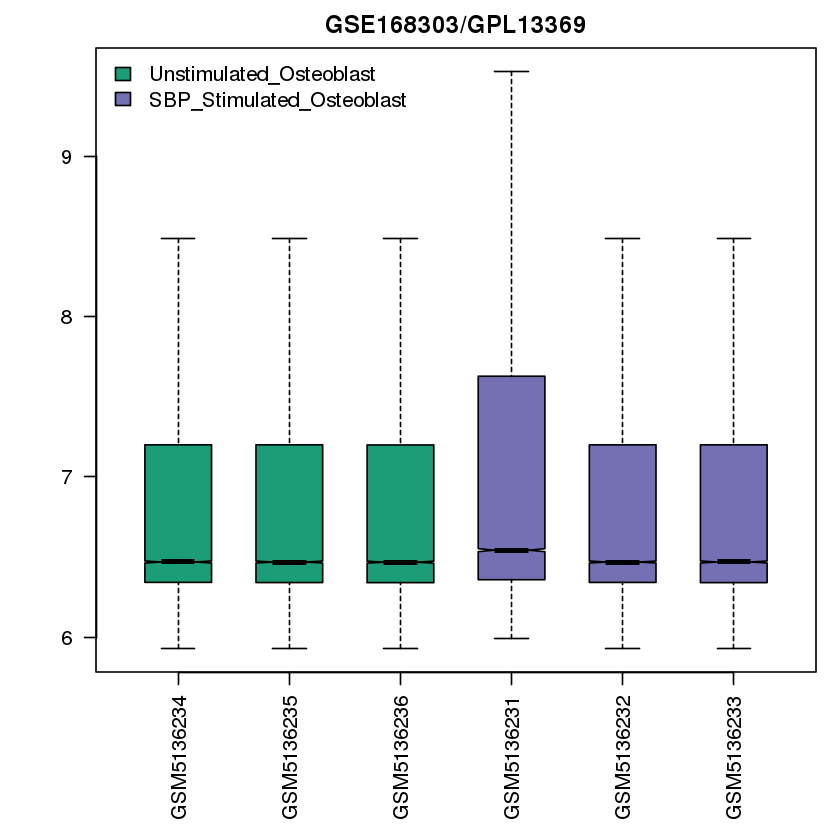

In [24]:
box_and_whisker_gset("GSE168303", GSE168303_obj$gset, GSE168303_obj$sampleGroups, GSE168303_obj$gsetExprs,F)

##### expression value distribution

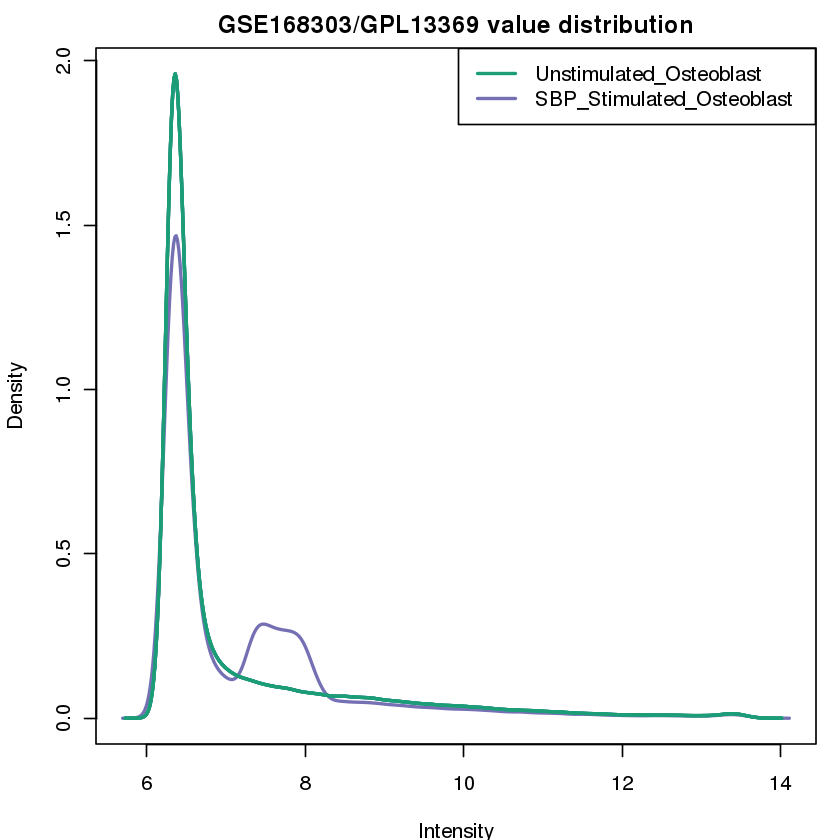

In [25]:
exp_val_dist_gset("GSE168303", GSE168303_obj$gset, GSE168303_obj$sampleGroups, GSE168303_obj$gsetExprs,F)

##### UMAP plot

Loading required package: sp


Attaching package: ‘sp’


The following object is masked from ‘package:IRanges’:

    %over%


Checking rgeos availability: TRUE



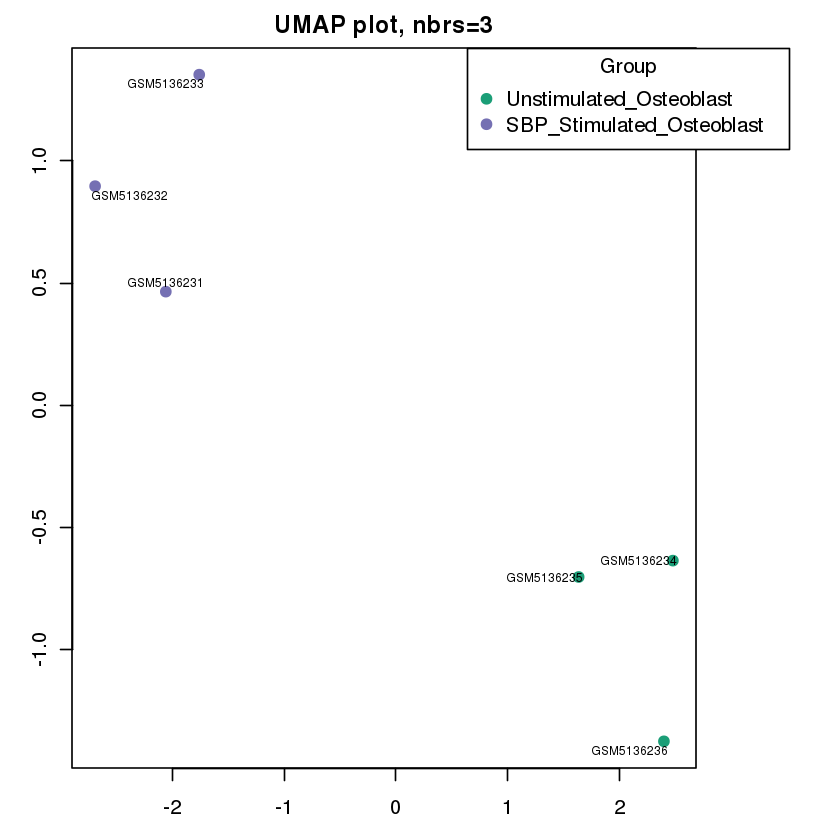

In [26]:
getUMAP_gset(GSE168303_obj$gsetExprs, 3, GSE168303_obj$sampleGroups,F)

##### mean-variance trend

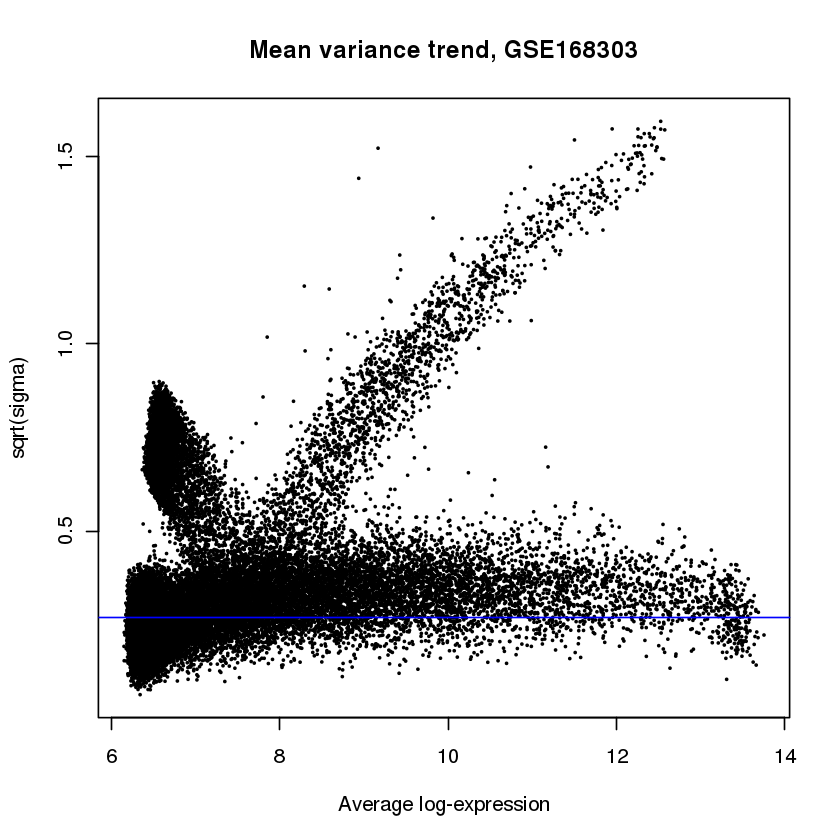

In [27]:
plotSA(GSE168303_obj$fit2, main=paste("Mean variance trend, ", "GSE168303", sep=""))

#### Extracting Human Orthologs of DEGs

In [81]:
head(GSE168303_obj$tT2)

,ID,SPECIES,SOURCE,SEARCH_KEY,TRANSCRIPT,ILMN_GENE,SOURCE_REFERENCE_ID,REFSEQ_ID,UNIGENE_ID,ENTREZ_GENE_ID,⋯,SYNONYMS,OBSOLETE_PROBE_ID,GB_ACC,SPOT_ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<dbl>,⋯,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ILMN_1784459,ILMN_1784459,Homo sapiens,RefSeq,NM_002422.3,ILMN_1300,MMP3,NM_002422.3,NM_002422.3,NA,4314,⋯,STR1; STMY; MGC126102; STMY1; SL-1; MGC126103; MGC126104; MMP-3,STR1; STMY; MGC126102; STMY1; SL-1; MGC126103; MGC126104; MMP-3,NM_002422.3,,-6.235600,9.994926,-82.21978,9.240190e-10,4.372735e-05,9.440572
ILMN_2389506,ILMN_2389506,Homo sapiens,RefSeq,NM_181755.1,ILMN_799,HSD11B1,NM_181755.1,NM_181755.1,NA,3290,⋯,MGC13539; HSD11B; HDL; HSD11L; HSD11; 11-beta-HSD1; 11-DH,MGC13539; HSD11B; HDL; HSD11L; HSD11; 11-beta-HSD1; 11-DH,NM_181755.1,,-2.741023,8.246213,-51.38949,1.242462e-08,2.350068e-04,8.825596
ILMN_1732538,ILMN_1732538,Homo sapiens,RefSeq,NM_004139.2,ILMN_178718,LBP,NM_004139.2,NM_004139.2,NA,3929,⋯,MGC22233,MGC22233,NM_004139.2,,-1.671264,7.468438,-49.72850,1.489805e-08,2.350068e-04,8.763790
ILMN_2184373,ILMN_2184373,Homo sapiens,RefSeq,NM_000584.2,ILMN_179575,IL8,NM_000584.2,NM_000584.2,NA,3576,⋯,GCP-1; MDNCF; NAP1; CXCL8; AMCF-I; TSG-1; LYNAP; NAP-1; MONAP; GCP1; SCYB8; LUCT; K60; LECT; 3-10C; b-ENAP; NAF,GCP-1; MDNCF; NAP1; CXCL8; AMCF-I; TSG-1; NAP-1; LYNAP; MONAP; SCYB8; GCP1; LUCT; LECT; K60; 3-10C; b-ENAP; NAF,NM_000584.2,,-5.299087,9.651224,-41.06215,4.289895e-08,3.701140e-04,8.343329
ILMN_1665035,ILMN_1665035,Homo sapiens,RefSeq,NM_000526.3,ILMN_9209,KRT14,NM_000526.3,NM_000526.3,NA,3861,⋯,NFJ; CK14; EBS3; EBS4; K14,NFJ; CK14; EBS3; EBS4; K14,NM_000526.3,,2.031353,7.731352,38.93064,5.757375e-08,3.701140e-04,8.206913
ILMN_1768035,ILMN_1768035,Homo sapiens,RefSeq,NM_002426.2,ILMN_1504,MMP12,NM_002426.2,NM_002426.2,NA,4321,⋯,MME; HME,MME; HME,NM_002426.2,,-1.624083,7.113684,-38.84805,5.825254e-08,3.701140e-04,8.201295


In [82]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE168303_obj$tT2), sep=" "))
GSE168303_totalGenes <- GSE168303_obj$tT2[,c("ID", "SYMBOL")]
GSE168303_avail_symbols <- GSE168303_totalGenes[GSE168303_totalGenes$SYMBOL !=  "",]
print(paste("Total Transcripts with available symbols:", nrow(GSE168303_avail_symbols), sep=" "))

GSE168303_transcript_id_to_gene_dict <- data.frame("transcriptGenes" = GSE168303_avail_symbols$SYMBOL,
                                 "transcriptIDS" = GSE168303_avail_symbols$ID)

[1] "Total Transcripts: 47323"
[1] "Total Transcripts with available symbols: 44053"


In [83]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE168303_obj$tT2), sep=" "))
GSE168303_totalGenes <- GSE168303_obj$tT2[,c("ID", "SYMBOL")]
GSE168303_avail_symbols <- GSE168303_totalGenes[GSE168303_totalGenes$SYMBOL !=  "",]
print(paste("Total Transcripts with available symbols:", nrow(GSE168303_avail_symbols), sep=" "))

GSE168303_transcript_id_to_gene_dict <- data.frame("transcriptGenes" = GSE168303_avail_symbols$SYMBOL,
                                 "transcriptIDS" = GSE168303_avail_symbols$ID)

GSE168303_lfc_genes <- filter_transcripts(GSE168303_obj, GSE168303_transcript_id_to_gene_dict,
                                         "hsapiens_regen_GSE168303", "hgnc_symbol", "GSE168303",
                                          "logFC", pval=.05,
                                          data.frame("human_gene"=human_drerio$`Gene name`,
                                                     "organism_gene"=human_drerio$`Gene name`))

[1] "Total Transcripts: 47323"
[1] "Total Transcripts with available symbols: 44053"
[1] "Total significant transcripts: 1162"
[1] "################################"
[1] "logFC LogFC"
[1] "Total transcripts with negative logFC vals: 116"
[1] "Total Significant negative genes: 95"
[1] "Total significant downregulated hsapiens_regen_GSE168303 genes after orthologous mapping and filtering: 1924"
[1] "Total significant Final downregulated human othologs: 85"
[1] "./geo_degs/hsapiens_regen_GSE168303_GSE168303_logFC_downregulated.txt"
[1] "Total transcripts with positive logFC vals: 83"
[1] "Total Significant positive genes: 74"
[1] "Total significant upregulated hsapiens_regen_GSE168303 genes after orthologous mapping and filtering: 769"
[1] "Total significant Final upregulated human othologs: 65"
[1] "./geo_degs/hsapiens_regen_GSE168303_GSE168303_logFC_upregulated.txt"


### GSE37198 Amexicanum - limbs

#### Data Download and Normalization

Found 1 file(s)

GSE37198_series_matrix.txt.gz


── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_double(),
  ID_REF = col_character()
)
ℹ Use `spec()` for the full column specifications.


Warning message in download.file(myurl, destfile, mode = mode, quiet = TRUE, method = getOption("download.file.method.GEOquery")):
“cannot open URL 'https://ftp.ncbi.nlm.nih.gov/geo/platforms/GPL15nnn/GPL15153/annot/GPL15153.annot.gz': HTTP status was '404 Not Found'”
Annotation GPL not available, so will use submitter GPL instead

Using locally cached version of GPL15153 found here:
/lscratch/37391301/Rtmp1Rr7vR/GPL15153.soft 



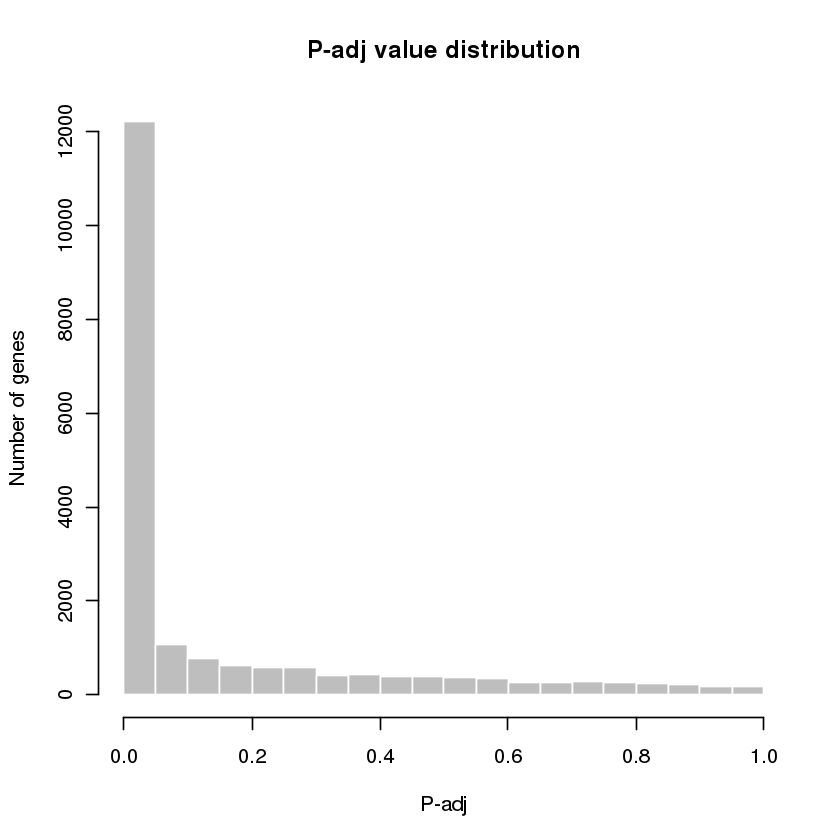

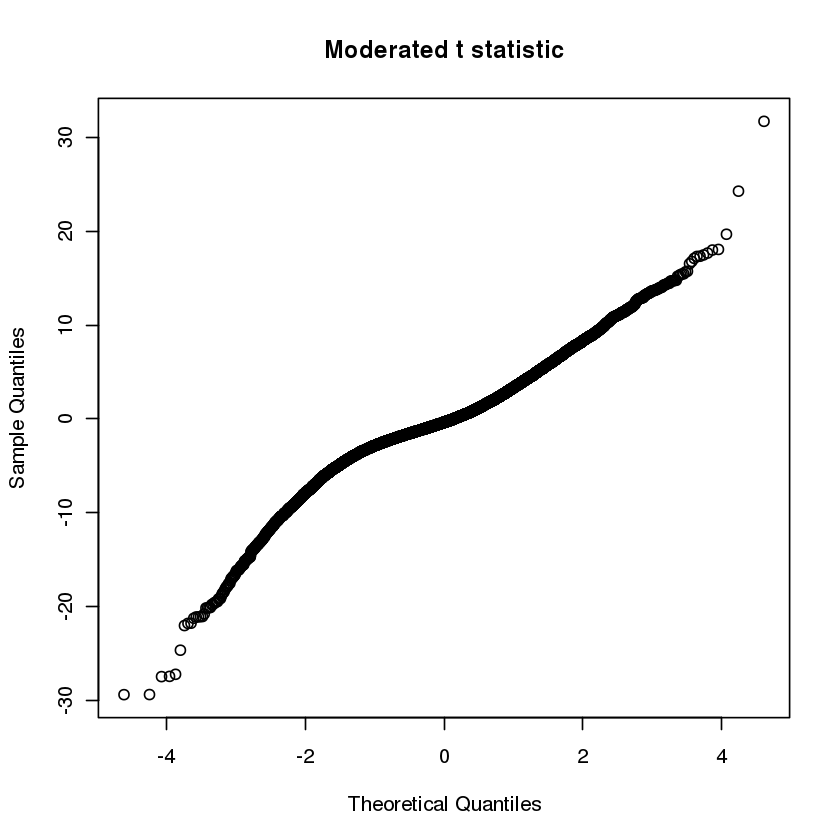

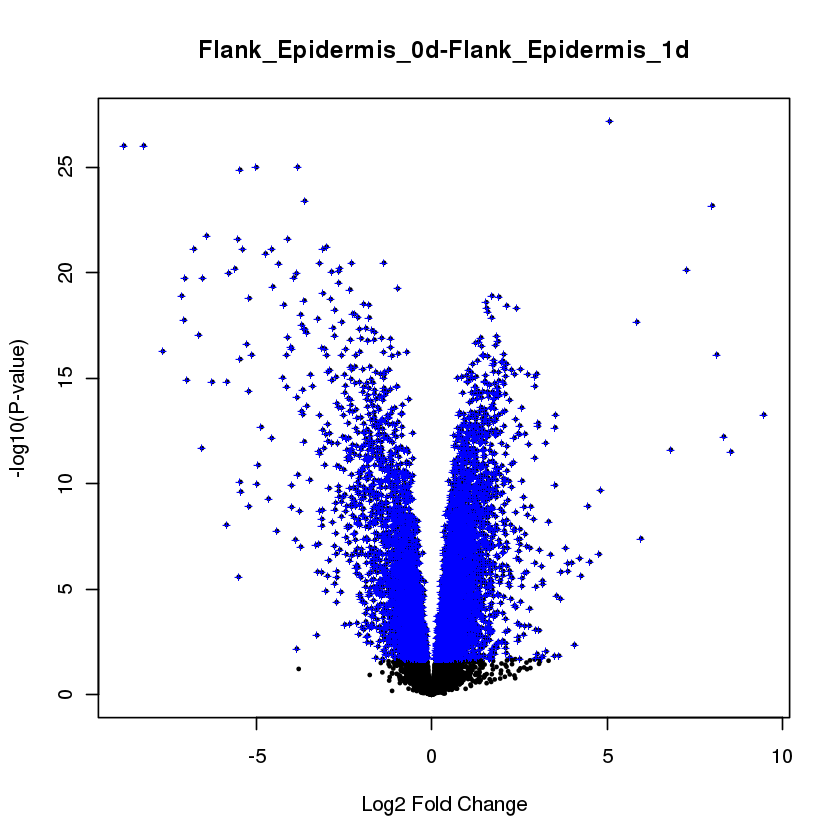

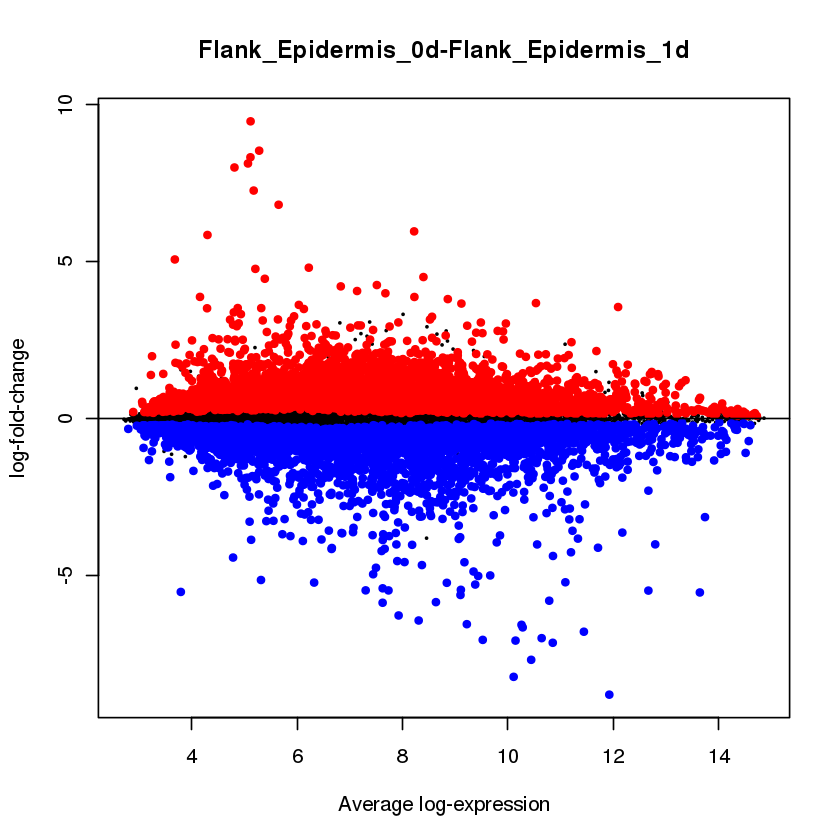

In [84]:
GSE37198_obj <- getDEG("GSE37198", "GPL15153", "00004444888855551111999966662222AAAA77773333", c("SPOT_ID"), T,
                      c("Flank_Epidermis_0d","Flank_Epidermis_1d","Flank_Epidermis_3d","Flank_Epidermis_7d",
                         "Innervated_Limb_0d","Innervated_Limb_1d","Innervated_Limb_3d","Innervated_Limb_7d",
                         "Denervated_Limb_1d","Denervated_Limb_3d","Denervated_Limb_7d"))

In [85]:
GSE37198_obj$tT2[,c("ID","GeneSymbol")]

write.table(GSE37198_obj$tT2[,c("ID","GeneSymbol")],
            file = "./amexicanum_transcript_library.txt", quote = FALSE, sep = "\t",
                row.names = FALSE, col.names = TRUE)

,ID,GeneSymbol
,<chr>,<chr>
axo17557-f_at,axo17557-f_at,SALL4
axo07949-f_at,axo07949-f_at,TNC
axo16342-r_at,axo16342-r_at,TMEM132A
axo08174-f_at,axo08174-f_at,MMP1
axo00376-f_at,axo00376-f_at,COL11A1
axo15507-f_at,axo15507-f_at,PALLD
axo08175-f_at,axo08175-f_at,MMP1
axo02039-f_at,axo02039-f_at,SMG7
axo10788-r_at,axo10788-r_at,COL7A1


#### Gene Expression Data analysis

##### box-and-whisker plots

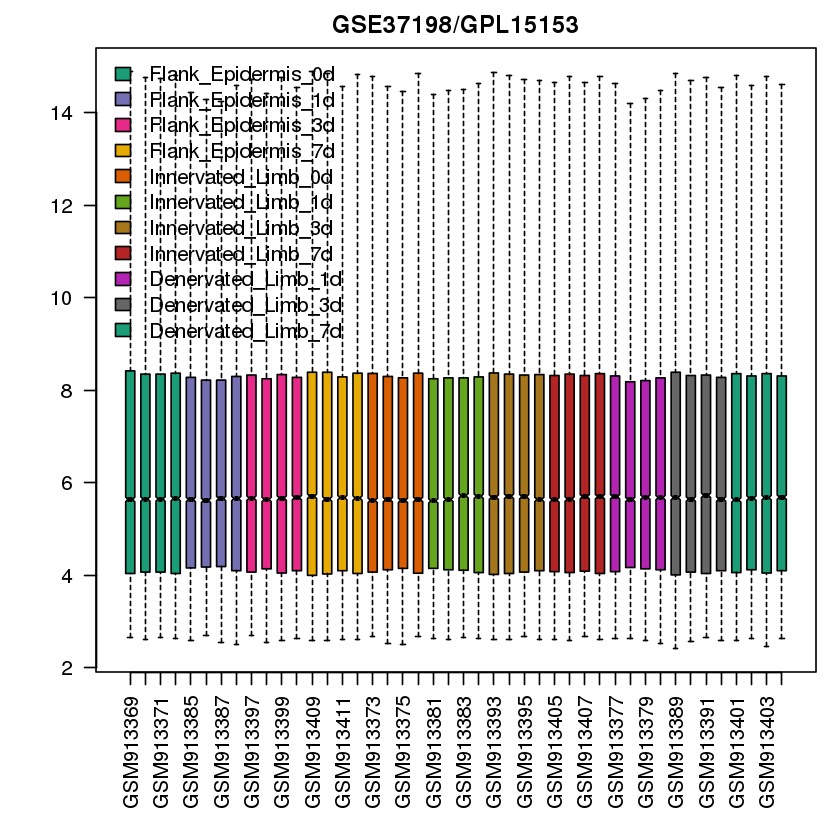

In [48]:
box_and_whisker_gset("GSE37198", GSE37198_obj$gset, GSE37198_obj$sampleGroups, GSE37198_obj$gsetExprs,T)

##### expression value distribution

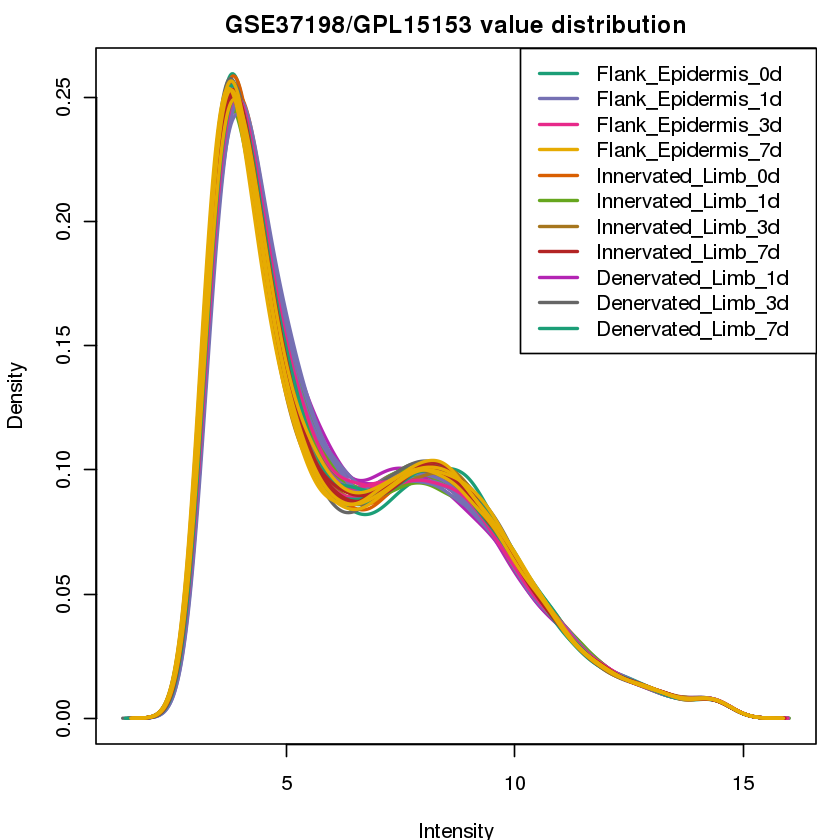

In [49]:
exp_val_dist_gset("GSE37198", GSE37198_obj$gset, GSE37198_obj$sampleGroups, GSE37198_obj$gsetExprs,T)

##### UMAP plot

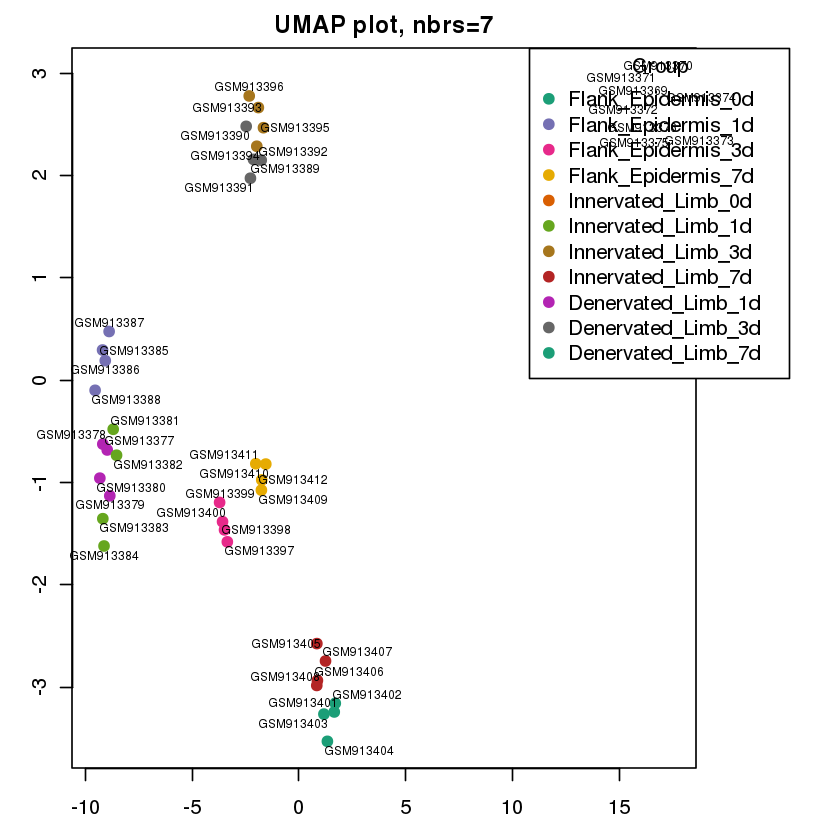

In [50]:
getUMAP_gset(GSE37198_obj$gsetExprs, 7, GSE37198_obj$sampleGroups,T)

##### mean-variance trend

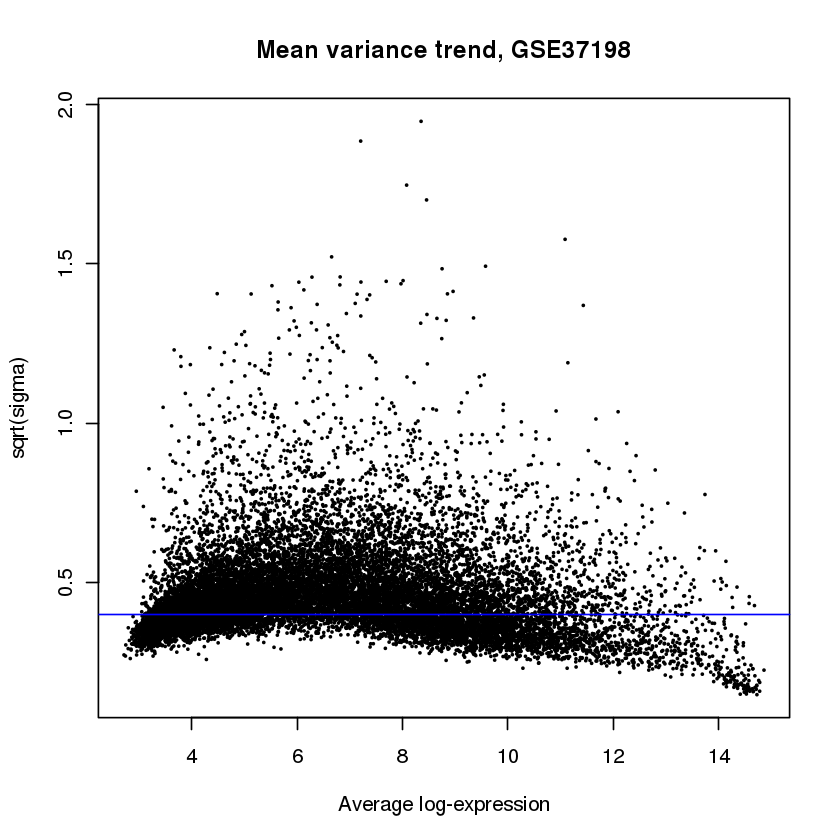

In [51]:
plotSA(GSE37198_obj$fit2, main=paste("Mean variance trend, ", "GSE37198", sep=""))

#### Extracting Human Orthologs of DEGs

In [53]:
names(GSE37198_obj$tT2)

[1] "ID"                                   
 [2] "Contig_ID"                            
 [3] "GeneName"                             
 [4] "GeneSymbol"                           
 [5] "SPOT_ID"                              
 [6] "Flank_Epidermis_0d.Flank_Epidermis_1d"
 [7] "Flank_Epidermis_0d.Flank_Epidermis_3d"
 [8] "Flank_Epidermis_0d.Flank_Epidermis_7d"
 [9] "Flank_Epidermis_0d.Innervated_Limb_0d"
[10] "Flank_Epidermis_0d.Innervated_Limb_1d"
[11] "Flank_Epidermis_0d.Innervated_Limb_3d"
[12] "Flank_Epidermis_0d.Innervated_Limb_7d"
[13] "Flank_Epidermis_0d.Denervated_Limb_1d"
[14] "Flank_Epidermis_0d.Denervated_Limb_3d"
[15] "Flank_Epidermis_0d.Denervated_Limb_7d"
[16] "Flank_Epidermis_1d.Flank_Epidermis_3d"
[17] "Flank_Epidermis_1d.Flank_Epidermis_7d"
[18] "Flank_Epidermis_1d.Innervated_Limb_0d"
[19] "Flank_Epidermis_1d.Innervated_Limb_1d"
[20] "Flank_Epidermis_1d.Innervated_Limb_3d"
[21] "Flank_Epidermis_1d.Innervated_Limb_7d"
[22] "Flank_Epidermis_1d.Denervated_Limb_1d"
[23] "Flank_Epidermis_1d.Denervated_Limb_3d"
[24] "Flank_Epidermis_1d.Denervated_Limb_7d"
[25] "Flank_Epidermis_3d.Flank_Epidermis_7d"
[26] "Flank_Epidermis_3d.Innervated_Limb_0d"
[27] "Flank_Epidermis_3d.Innervated_Limb_1d"
[28] "Flank_Epidermis_3d.Innervated_Limb_3d"
[29] "Flank_Epidermis_3d.Innervated_Limb_7d"
[30] "Flank_Epidermis_3d.Denervated_Limb_1d"
[31] "Flank_Epidermis_3d.Denervated_Limb_3d"
[32] "Flank_Epidermis_3d.Denervated_Limb_7d"
[33] "Flank_Epidermis_7d.Innervated_Limb_0d"
[34] "Flank_Epidermis_7d.Innervated_Limb_1d"
[35] "Flank_Epidermis_7d.Innervated_Limb_3d"
[36] "Flank_Epidermis_7d.Innervated_Limb_7d"
[37] "Flank_Epidermis_7d.Denervated_Limb_1d"
[38] "Flank_Epidermis_7d.Denervated_Limb_3d"
[39] "Flank_Epidermis_7d.Denervated_Limb_7d"
[40] "Innervated_Limb_0d.Innervated_Limb_1d"
[41] "Innervated_Limb_0d.Innervated_Limb_3d"
[42] "Innervated_Limb_0d.Innervated_Limb_7d"
[43] "Innervated_Limb_0d.Denervated_Limb_1d"
[44] "Innervated_Limb_0d.Denervated_Limb_3d"
[45] "Innervated_Limb_0d.Denervated_Limb_7d"
[46] "Innervated_Limb_1d.Innervated_Limb_3d"
[47] "Innervated_Limb_1d.Innervated_Limb_7d"
[48] "Innervated_Limb_1d.Denervated_Limb_1d"
[49] "Innervated_Limb_1d.Denervated_Limb_3d"
[50] "Innervated_Limb_1d.Denervated_Limb_7d"
[51] "Innervated_Limb_3d.Innervated_Limb_7d"
[52] "Innervated_Limb_3d.Denervated_Limb_1d"
[53] "Innervated_Limb_3d.Denervated_Limb_3d"
[54] "Innervated_Limb_3d.Denervated_Limb_7d"
[55] "Innervated_Limb_7d.Denervated_Limb_1d"
[56] "Innervated_Limb_7d.Denervated_Limb_3d"
[57] "Innervated_Limb_7d.Denervated_Limb_7d"
[58] "Denervated_Limb_1d.Denervated_Limb_3d"
[59] "Denervated_Limb_1d.Denervated_Limb_7d"
[60] "Denervated_Limb_3d.Denervated_Limb_7d"
[61] "AveExpr"                              
[62] "F"                                    
[63] "P.Value"                              
[64] "adj.P.Val"

In [89]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE37198_obj$tT2), sep=" "))
GSE37198_transcriptToGene <- pData(featureData(GSE37198_obj$gset))
GSE37198_totalGenes <- GSE37198_transcriptToGene[as.character(GSE37198_obj$tT2$ID),]
GSE37198_avail_symbols <- GSE37198_totalGenes[GSE37198_totalGenes$GeneSymbol !=  "",]
print(paste("Total Transcripts with available symbols:", nrow(GSE37198_avail_symbols), sep=" "))

GSE37198_transcript_id_to_ho_dict <- data.frame("transcriptGenes" = GSE37198_avail_symbols$GeneSymbol,
                                 "transcriptIDS" = GSE37198_avail_symbols$ID)

GSE37198_lfc_columns<- c('Flank_Epidermis_0d.Flank_Epidermis_1d','Flank_Epidermis_0d.Flank_Epidermis_3d',
                         'Flank_Epidermis_0d.Flank_Epidermis_7d','Flank_Epidermis_0d.Innervated_Limb_0d',
                         'Flank_Epidermis_1d.Flank_Epidermis_3d','Flank_Epidermis_1d.Flank_Epidermis_7d',
                         'Flank_Epidermis_1d.Innervated_Limb_1d',
                         'Flank_Epidermis_3d.Flank_Epidermis_7d','Flank_Epidermis_7d.Innervated_Limb_7d',
                         'Innervated_Limb_0d.Innervated_Limb_1d','Innervated_Limb_0d.Innervated_Limb_3d',
                         'Innervated_Limb_0d.Innervated_Limb_7d','Innervated_Limb_1d.Innervated_Limb_3d',
                         'Innervated_Limb_1d.Innervated_Limb_7d','Innervated_Limb_1d.Denervated_Limb_1d',
                         'Innervated_Limb_3d.Innervated_Limb_7d','Innervated_Limb_3d.Denervated_Limb_3d',
                         'Innervated_Limb_7d.Denervated_Limb_7d','Denervated_Limb_1d.Denervated_Limb_3d',
                         'Denervated_Limb_1d.Denervated_Limb_7d','Denervated_Limb_3d.Denervated_Limb_7d')

GSE37198_lfc_genes <- filter_transcripts(GSE37198_obj, GSE37198_transcript_id_to_ho_dict,
                                         "amexicanum_regen_GSE37198", "hgnc_symbol", "GSE37198",
                                          GSE37198_lfc_columns, pval=0.05,
                                          data.frame("human_gene"=human_drerio$`Gene name`,
                                                     "organism_gene"=human_drerio$`Gene name`))

[1] "Total Transcripts: 20080"
[1] "Total Transcripts with available symbols: 14744"
[1] "Total significant transcripts: 12222"
[1] "################################"
[1] "Flank_Epidermis_0d.Flank_Epidermis_1d LogFC"
[1] "Total transcripts with negative logFC vals: 893"
[1] "Total Significant negative genes: 577"
[1] "Total significant downregulated amexicanum_regen_GSE37198 genes after orthologous mapping and filtering: 7522"
[1] "Total significant Final downregulated human othologs: 519"
[1] "./geo_degs/amexicanum_regen_GSE37198_GSE37198_Flank_Epidermis_0d.Flank_Epidermis_1d_downregulated.txt"
[1] "Total transcripts with positive logFC vals: 1166"
[1] "Total Significant positive genes: 793"
[1] "Total significant upregulated amexicanum_regen_GSE37198 genes after orthologous mapping and filtering: 11089"
[1] "Total significant Final upregulated human othologs: 704"
[1] "./geo_degs/amexicanum_regen_GSE37198_GSE37198_Flank_Epidermis_0d.Flank_Epidermis_1d_upregulated.txt"
[1] "##########

### GSE150947 - Amexicanum - Tail

#### Data Download and Normalization

Found 1 file(s)

GSE150947_series_matrix.txt.gz


── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_double(),
  ID_REF = col_character()
)
ℹ Use `spec()` for the full column specifications.


Warning message in download.file(myurl, destfile, mode = mode, quiet = TRUE, method = getOption("download.file.method.GEOquery")):
“cannot open URL 'https://ftp.ncbi.nlm.nih.gov/geo/platforms/GPL25nnn/GPL25286/annot/GPL25286.annot.gz': HTTP status was '404 Not Found'”
Annotation GPL not available, so will use submitter GPL instead

File stored at: 

/lscratch/37391301/Rtmp1Rr7vR/GPL25286.soft



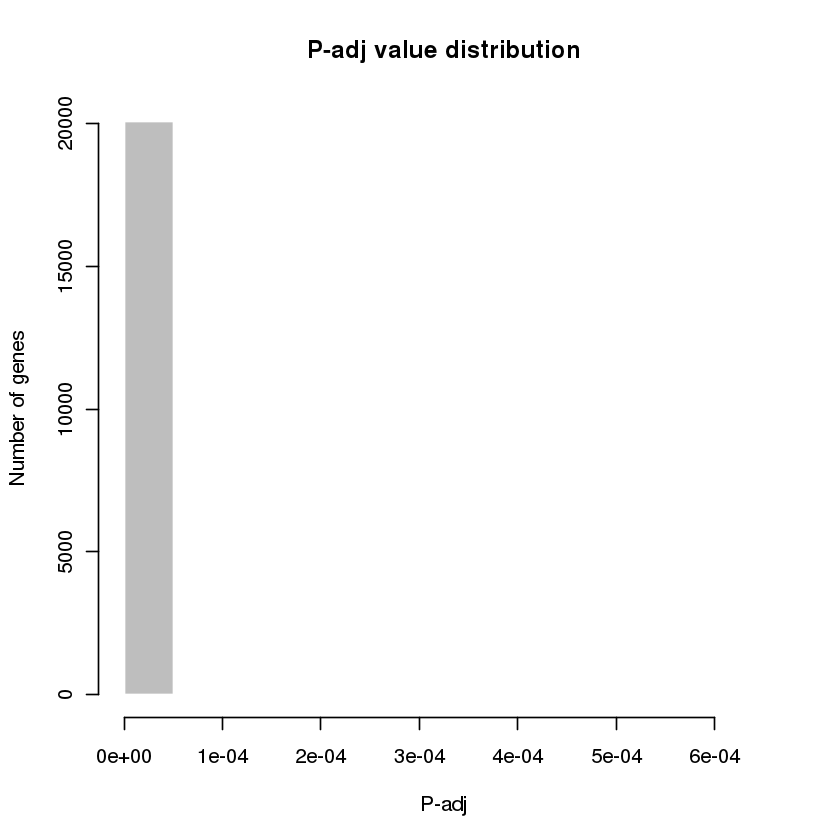

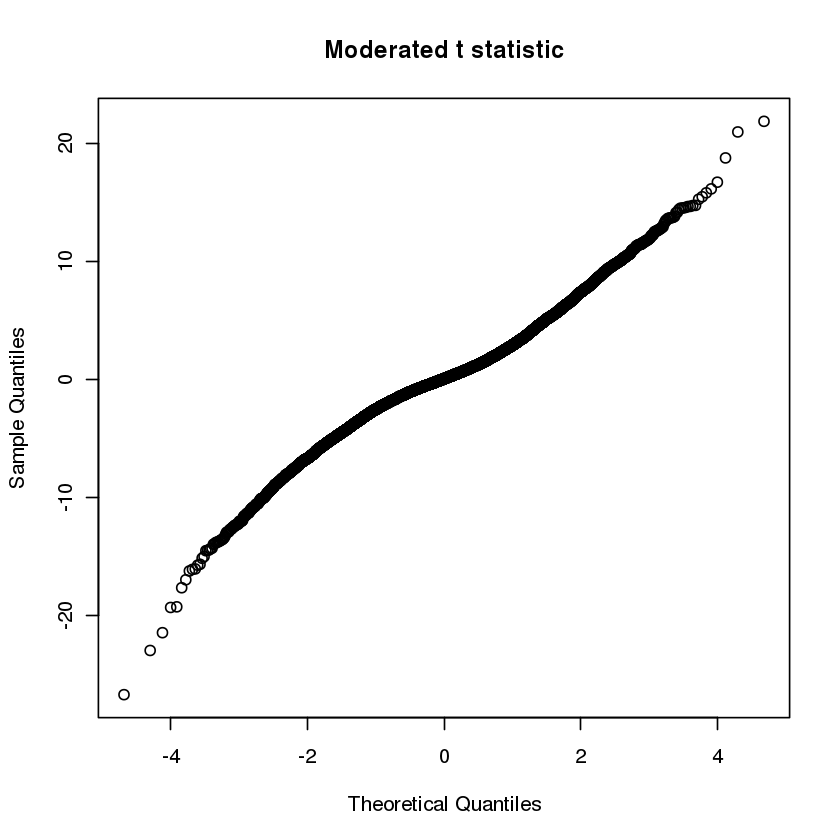

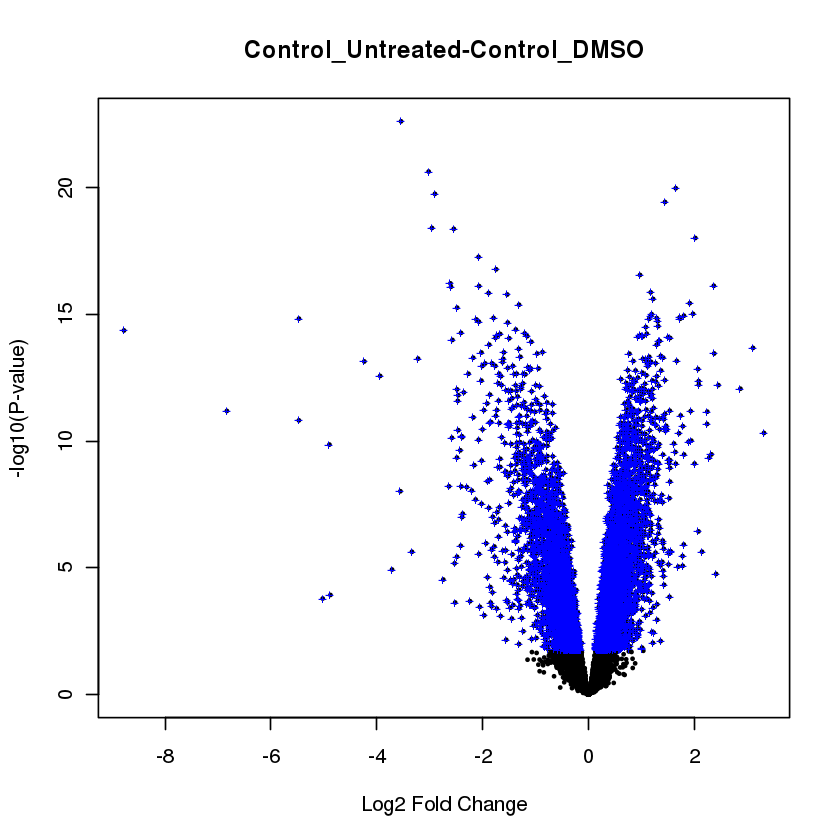

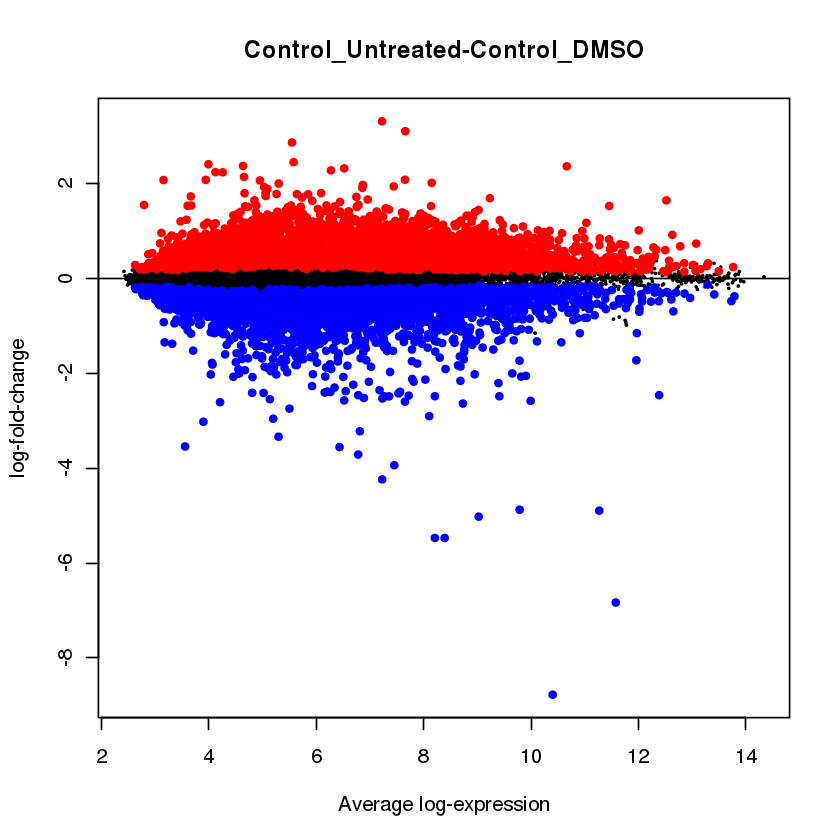

In [90]:
GSE150947_obj <- getDEG("GSE150947", "GPL25286", "8888889996661117770002222333344445555", c("SPOT_ID"), T,
                        c("Control_Untreated","Control_DMSO","Geldanamycin_Control",
                          "Geldanamycin_Treatment","SB_Control","SB_Treatment","Rom_1MPA",
                          "Rom_10microliters","CoCl2","Rom_CoCl2"))

#### Gene Expression Data analysis

##### box-and-whisker plots

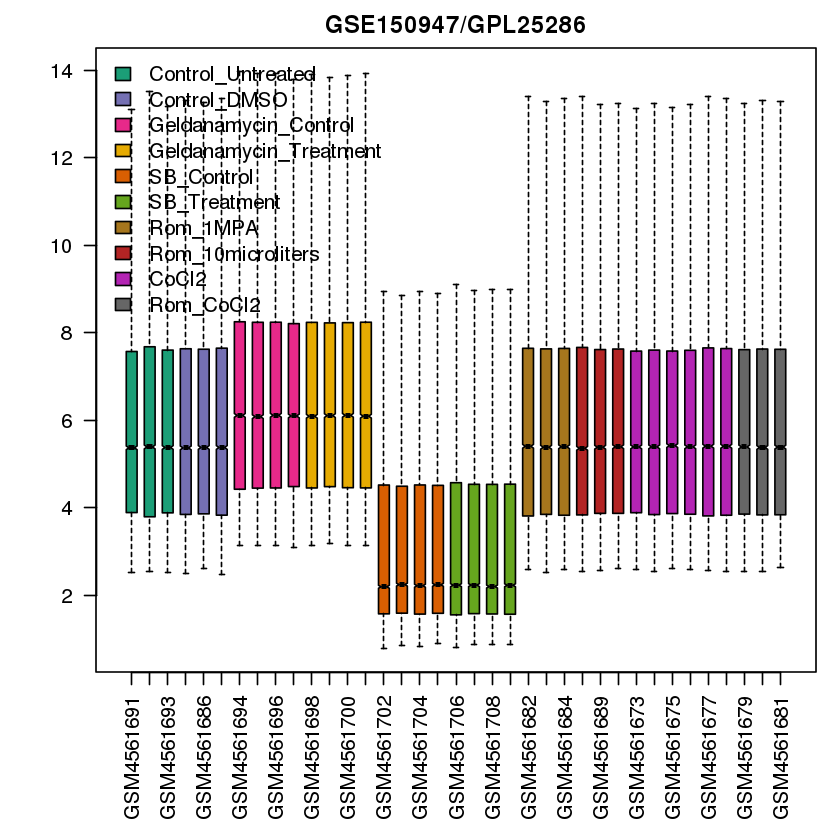

In [56]:
box_and_whisker_gset("GSE150947", GSE150947_obj$gset, GSE150947_obj$sampleGroups, GSE150947_obj$gsetExprs,T)

##### expression value distribution

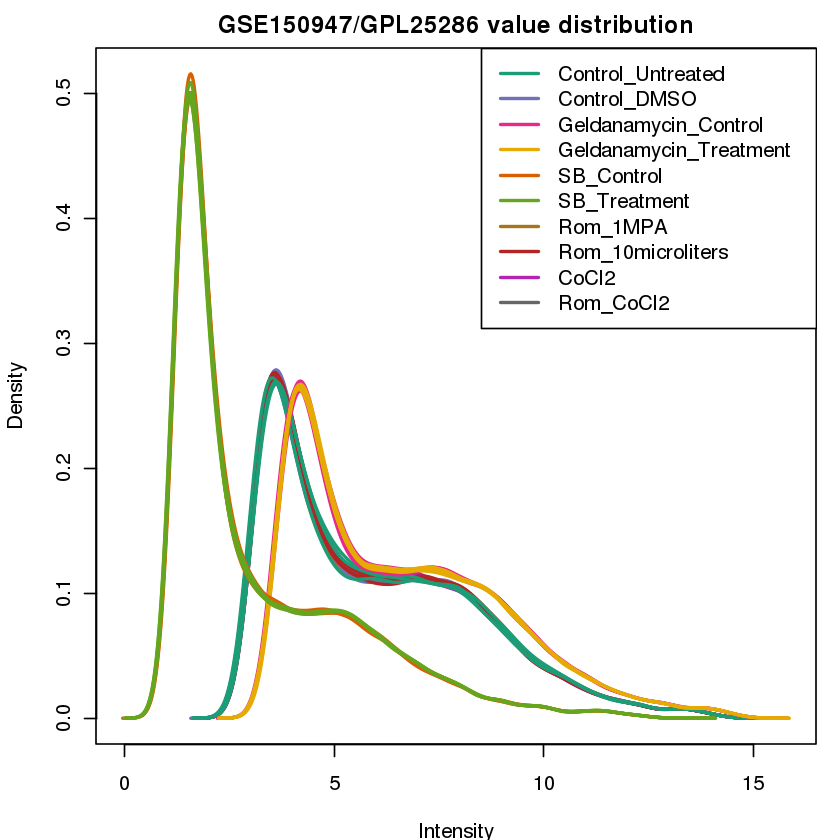

In [57]:
exp_val_dist_gset("GSE150947", GSE150947_obj$gset, GSE150947_obj$sampleGroups, GSE150947_obj$gsetExprs,T)

##### UMAP plot

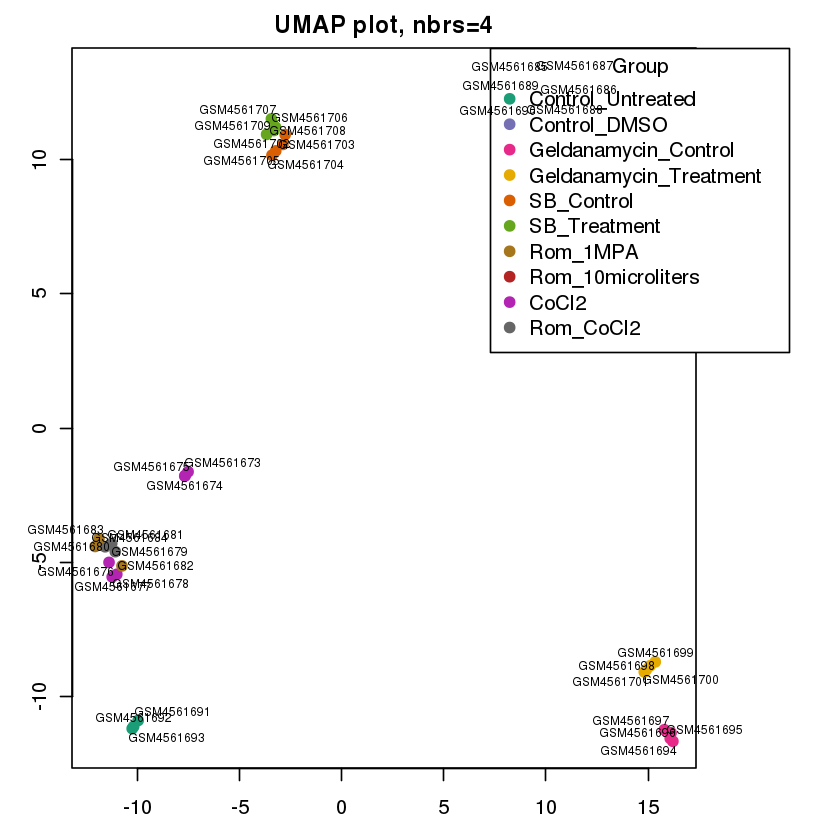

In [58]:
getUMAP_gset(GSE150947_obj$gsetExprs, 4, GSE150947_obj$sampleGroups,T)

##### mean-variance trend

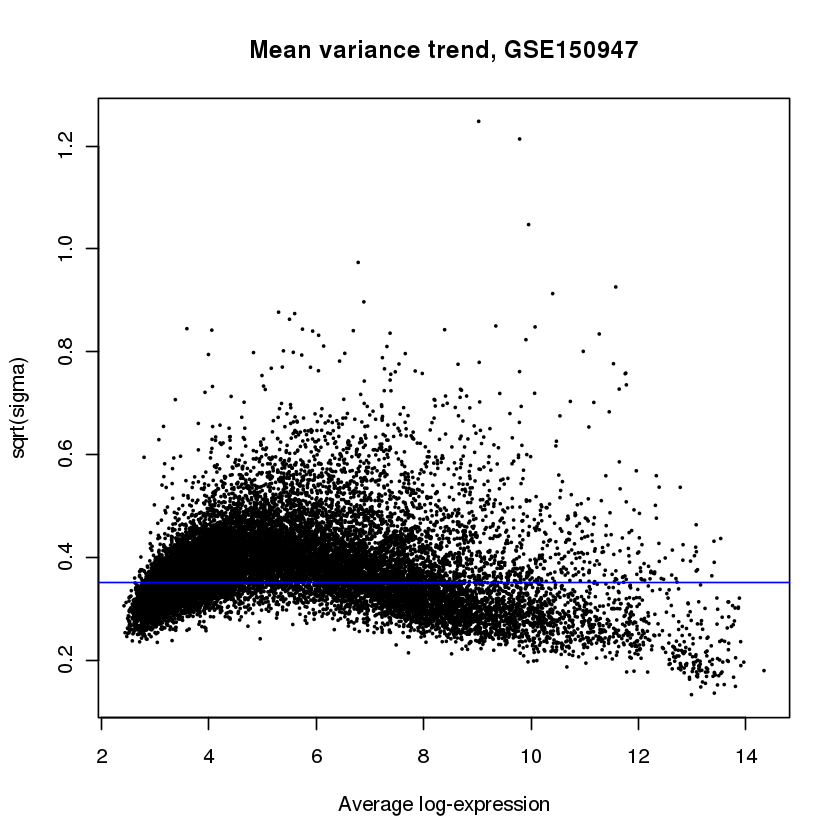

In [59]:
plotSA(GSE150947_obj$fit2, main=paste("Mean variance trend, ", "GSE150947", sep=""))

#### Extracting Human Orthologs of DEGs

In [91]:
names(GSE150947_obj$tT2)

[1] "ID"                                         
 [2] "SPOT_ID"                                    
 [3] "Control_Untreated.Control_DMSO"             
 [4] "Control_Untreated.Geldanamycin_Control"     
 [5] "Control_Untreated.Geldanamycin_Treatment"   
 [6] "Control_Untreated.SB_Control"               
 [7] "Control_Untreated.SB_Treatment"             
 [8] "Control_Untreated.Rom_1MPA"                 
 [9] "Control_Untreated.Rom_10microliters"        
[10] "Control_Untreated.CoCl2"                    
[11] "Control_Untreated.Rom_CoCl2"                
[12] "Control_DMSO.Geldanamycin_Control"          
[13] "Control_DMSO.Geldanamycin_Treatment"        
[14] "Control_DMSO.SB_Control"                    
[15] "Control_DMSO.SB_Treatment"                  
[16] "Control_DMSO.Rom_1MPA"                      
[17] "Control_DMSO.Rom_10microliters"             
[18] "Control_DMSO.CoCl2"                         
[19] "Control_DMSO.Rom_CoCl2"                     
[20] "Geldanamycin_Control.Geldanamycin_Treatment"
[21] "Geldanamycin_Control.SB_Control"            
[22] "Geldanamycin_Control.SB_Treatment"          
[23] "Geldanamycin_Control.Rom_1MPA"              
[24] "Geldanamycin_Control.Rom_10microliters"     
[25] "Geldanamycin_Control.CoCl2"                 
[26] "Geldanamycin_Control.Rom_CoCl2"             
[27] "Geldanamycin_Treatment.SB_Control"          
[28] "Geldanamycin_Treatment.SB_Treatment"        
[29] "Geldanamycin_Treatment.Rom_1MPA"            
[30] "Geldanamycin_Treatment.Rom_10microliters"   
[31] "Geldanamycin_Treatment.CoCl2"               
[32] "Geldanamycin_Treatment.Rom_CoCl2"           
[33] "SB_Control.SB_Treatment"                    
[34] "SB_Control.Rom_1MPA"                        
[35] "SB_Control.Rom_10microliters"               
[36] "SB_Control.CoCl2"                           
[37] "SB_Control.Rom_CoCl2"                       
[38] "SB_Treatment.Rom_1MPA"                      
[39] "SB_Treatment.Rom_10microliters"             
[40] "SB_Treatment.CoCl2"                         
[41] "SB_Treatment.Rom_CoCl2"                     
[42] "Rom_1MPA.Rom_10microliters"                 
[43] "Rom_1MPA.CoCl2"                             
[44] "Rom_1MPA.Rom_CoCl2"                         
[45] "Rom_10microliters.CoCl2"                    
[46] "Rom_10microliters.Rom_CoCl2"                
[47] "CoCl2.Rom_CoCl2"                            
[48] "AveExpr"                                    
[49] "F"                                          
[50] "P.Value"                                    
[51] "adj.P.Val"

In [92]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE150947_obj$tT2), sep=" "))
transcriptToGene <- pData(featureData(GSE150947_obj$gset))
totalTranscripts <- transcriptToGene[as.character(GSE150947_obj$tT2$ID),]
GSE150947_avail_symbols <- totalTranscripts[totalTranscripts$SPOT_ID !=  "" &
                                                totalTranscripts$SPOT_ID !=  "no hit" ,]

GSE150947_transcript_id_to_ho_dict <- data.frame("transcriptGenes" = toupper(GSE150947_avail_symbols$SPOT_ID),
                                 "transcriptIDS" = GSE150947_avail_symbols$ID)
GSE37198_lfc_columns<- c('Control_Untreated.Rom_1MPA','Control_Untreated.Rom_10microliters',
                         'Control_Untreated.CoCl2','Control_Untreated.Rom_CoCl2',
                         'Control_DMSO.Rom_1MPA','Control_DMSO.Rom_10microliters','Control_DMSO.CoCl2',
                         'Control_DMSO.Rom_CoCl2','Geldanamycin_Control.Geldanamycin_Treatment',
                         'SB_Control.SB_Treatment','Rom_1MPA.Rom_10microliters','Rom_1MPA.CoCl2',
                         'Rom_1MPA.Rom_CoCl2','Rom_10microliters.CoCl2','Rom_10microliters.Rom_CoCl2',
                         'CoCl2.Rom_CoCl2')

GSE150947_lfc_genes <- filter_transcripts(GSE150947_obj, GSE150947_transcript_id_to_ho_dict,
                                         "amexicanum_regen_GSE150947", "hgnc_symbol", "GSE150947",
                                          GSE37198_lfc_columns, pval=0.05,
                                          data.frame("human_gene"=human_drerio$`Gene name`,
                                                     "organism_gene"=human_drerio$`Gene name`))

[1] "Total Transcripts: 20080"
[1] "Total significant transcripts: 20080"
[1] "################################"
[1] "Control_Untreated.Rom_1MPA LogFC"
[1] "Total transcripts with negative logFC vals: 171"
[1] "Total Significant negative genes: 151"
[1] "Total significant downregulated amexicanum_regen_GSE150947 genes after orthologous mapping and filtering: 724"
[1] "Total significant Final downregulated human othologs: 86"
[1] "./geo_degs/amexicanum_regen_GSE150947_GSE150947_Control_Untreated.Rom_1MPA_downregulated.txt"
[1] "Total transcripts with positive logFC vals: 79"
[1] "Total Significant positive genes: 67"
[1] "Total significant upregulated amexicanum_regen_GSE150947 genes after orthologous mapping and filtering: 346"
[1] "Total significant Final upregulated human othologs: 26"
[1] "./geo_degs/amexicanum_regen_GSE150947_GSE150947_Control_Untreated.Rom_1MPA_upregulated.txt"
[1] "################################"
[1] "Control_Untreated.Rom_10microliters LogFC"
[1] "Total transc

# Wound Healing

## Expression Data

### GSE147890 - Hsapiens - Skin

#### Data Download and Normalization

Found 1 file(s)

GSE147890_series_matrix.txt.gz


── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_double(),
  ID_REF = col_character(),
  GSM4448283 = col_logical(),
  GSM4448285 = col_logical()
)
ℹ Use `spec()` for the full column specifications.


File stored at: 

/lscratch/37391301/Rtmp1Rr7vR/GPL571.annot.gz

Warning message:
“1168 parsing failures.
  row           col           expected               actual         file
10161 UniGene title 1/0/T/F/TRUE/FALSE Clone HQ0117 PRO0117 literal data
10161 UniGene ID    1/0/T/F/TRUE/FALSE Hs.670442            literal data
10179 UniGene title 1/0/T/F/TRUE/FALSE Transcribed locus    literal data
10179 UniGene ID    1/0/T/F/TRUE/FALSE Hs.621370            literal data
10347 UniGene title 1/0/T/F/TRUE/FALSE Transcribed locus    literal data
..... ............. .................. .................... ............
See problems(...) for more det

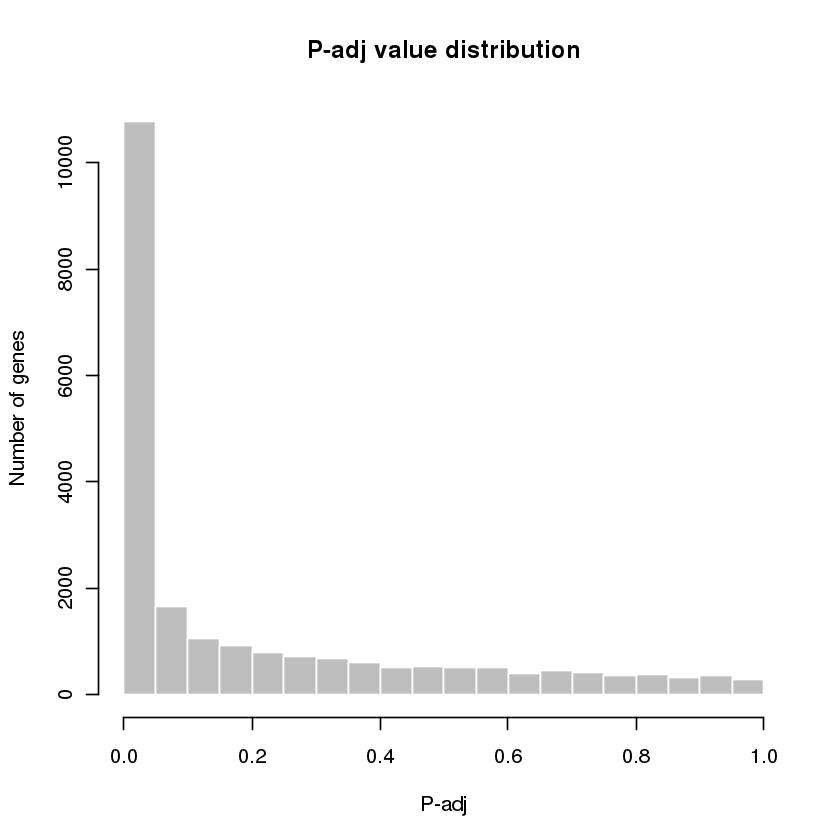

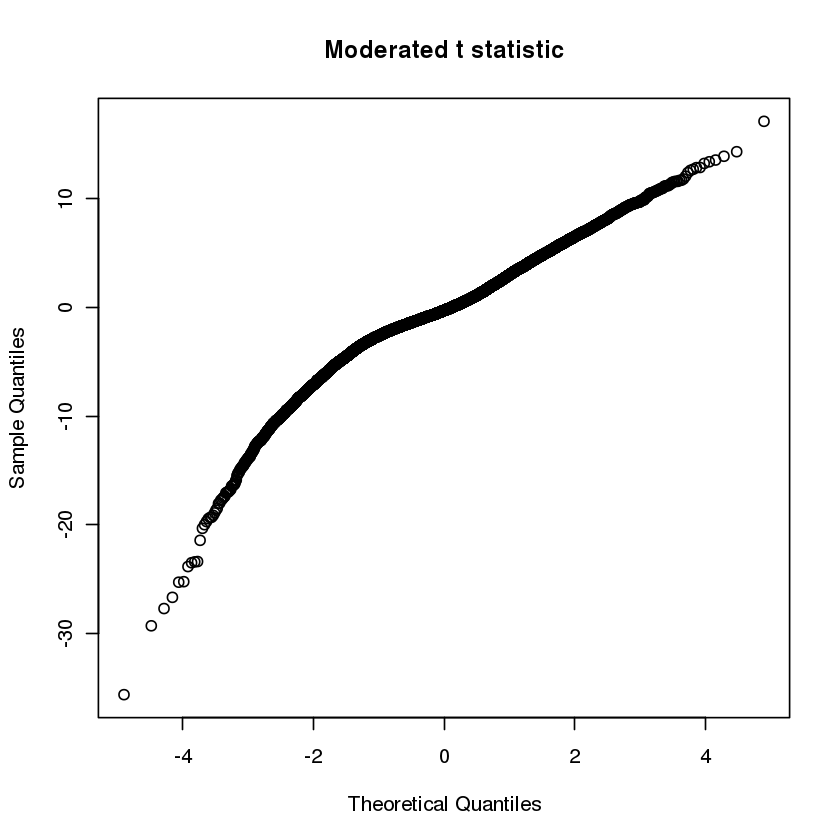

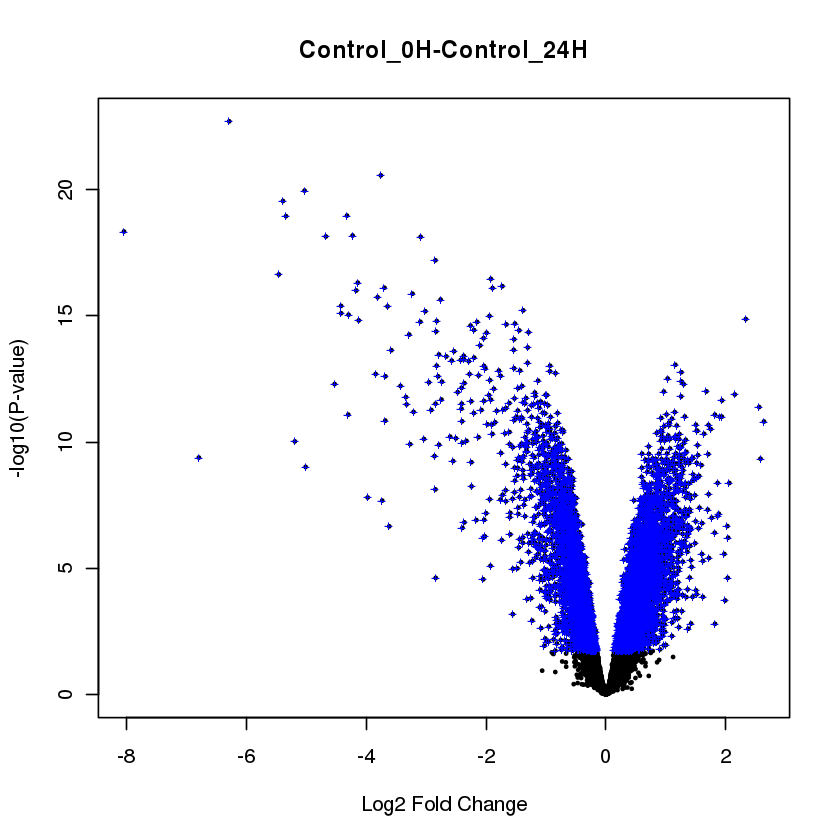

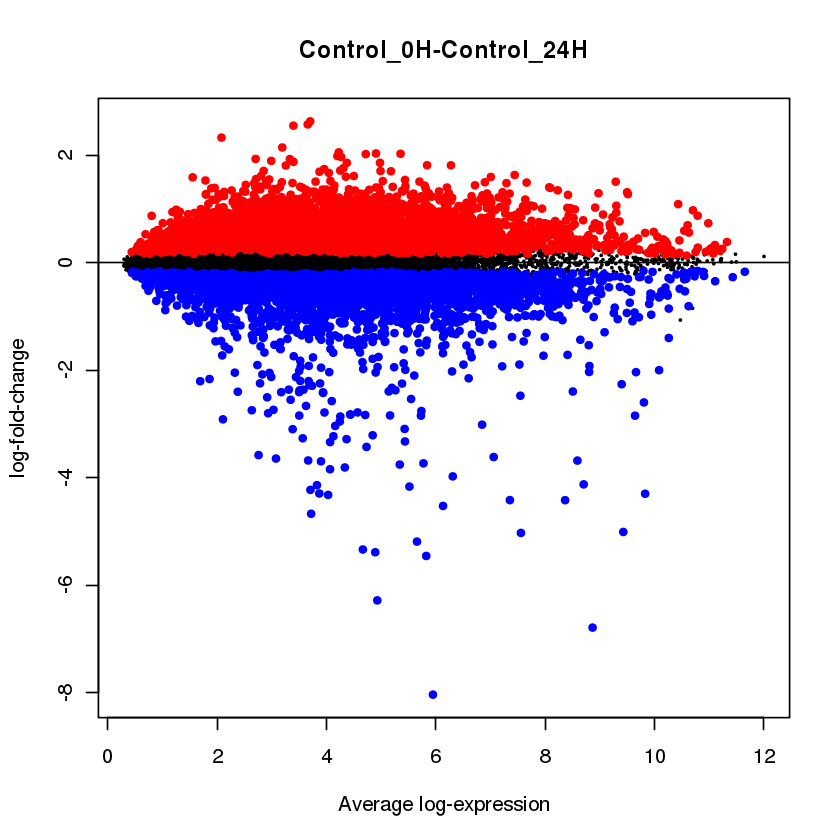

In [95]:
GSE147890_obj <- getDEG("GSE147890", "GPL571", "00000001111111222222333333",
                        c("Gene.symbol","Gene.title"), T,
                        c("Control_0H","Control_24H","Diabetic_0H","Diabetic_24H"))

#### Gene Expression Data analysis

##### box-and-whisker plots

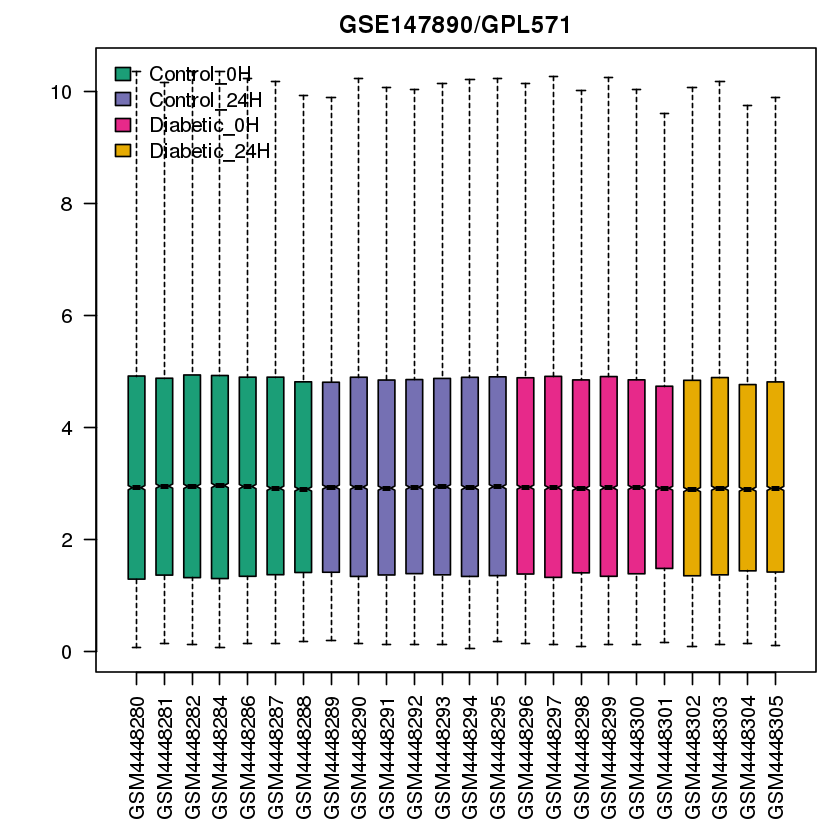

In [42]:
box_and_whisker_gset("GSE147890", GSE147890_obj$gset, GSE147890_obj$sampleGroups, GSE147890_obj$gsetExprs,T)

##### expression value distribution

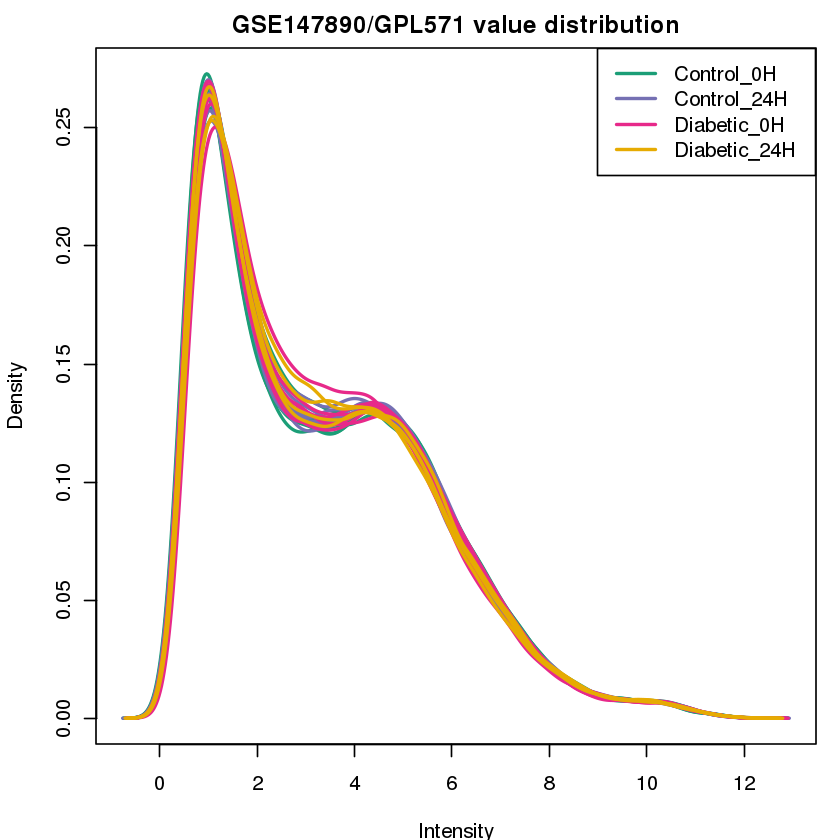

In [43]:
exp_val_dist_gset("GSE147890", GSE147890_obj$gset, GSE147890_obj$sampleGroups, GSE147890_obj$gsetExprs,T)

##### UMAP plot

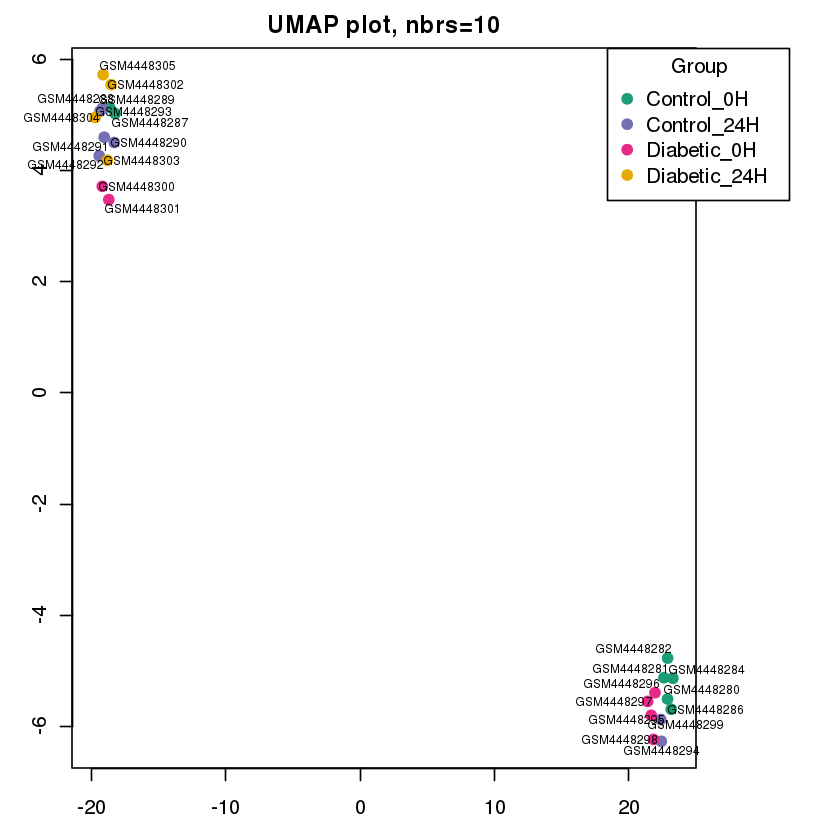

In [44]:
getUMAP_gset(GSE147890_obj$gsetExprs, 10, GSE147890_obj$sampleGroups,T)

##### mean-variance trend

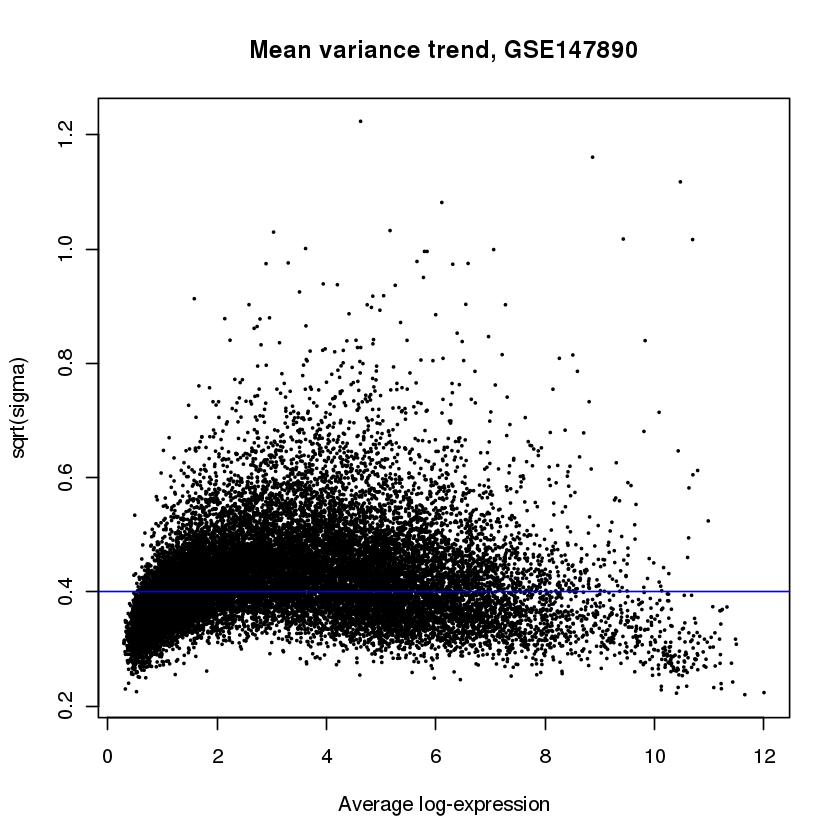

In [45]:
plotSA(GSE147890_obj$fit2, main=paste("Mean variance trend, ", "GSE147890", sep=""))

#### Extracting Human Orthologs of DEGs

In [96]:
names(GSE147890_obj$tT2)

[1] "ID"                       "Gene.title"              
 [3] "Gene.symbol"              "Gene.ID"                 
 [5] "UniGene.title"            "UniGene.symbol"          
 [7] "UniGene.ID"               "Nucleotide.Title"        
 [9] "GI"                       "GenBank.Accession"       
[11] "Platform_CLONEID"         "Platform_ORF"            
[13] "Platform_SPOTID"          "Chromosome.location"     
[15] "Chromosome.annotation"    "GO.Function"             
[17] "GO.Process"               "GO.Component"            
[19] "GO.Function.ID"           "GO.Process.ID"           
[21] "GO.Component.ID"          "Control_0H.Control_24H"  
[23] "Control_0H.Diabetic_0H"   "Control_0H.Diabetic_24H" 
[25] "Control_24H.Diabetic_0H"  "Control_24H.Diabetic_24H"
[27] "Diabetic_0H.Diabetic_24H" "AveExpr"                 
[29] "F"                        "P.Value"                 
[31] "adj.P.Val"

In [99]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE147890_obj$tT2), sep=" "))
transcriptToGene <- pData(featureData(GSE147890_obj$gset))
totalTranscripts <- transcriptToGene[as.character(GSE147890_obj$tT2$ID),]

viable_transcripts <- 0
viable_transcripts_ids <- character(0)
total_transcript_genes <- character(0)
for(i in 1:nrow(totalTranscripts)) {
    current_string <- totalTranscripts$'Gene.symbol'[i]
    if(length(current_string) < 1) {next}
    
    ensemblIDs <- unlist(strsplit(current_string, "///"))
    # remove weird  symbols
    ensemblIDs <- ensemblIDs[grep("^[A-Za-z0-9]+$", ensemblIDs, perl=TRUE)]
    
    if(is.null(ensemblIDs)) {next}
    if(length(ensemblIDs) < 1) {next}
    viable_transcripts <- viable_transcripts+1
    viable_transcripts_ids <- append(viable_transcripts_ids, rep(totalTranscripts$ID[i],
                                                                 length(ensemblIDs)), length(viable_transcripts_ids))
    total_transcript_genes <- append(total_transcript_genes, ensemblIDs, length(total_transcript_genes))
}

transcript_id_dict <- data.frame("transcriptGenes" = total_transcript_genes, "transcriptIDS" = viable_transcripts_ids)

print(paste("Total transcripts with an associated mouse gene:", viable_transcripts, sep=" "))
print(paste("Total associated mouse genes:", length(total_transcript_genes), sep=" "))

GSE147890_lfc_columns<- c('Control_0H.Control_24H', 'Control_0H.Diabetic_0H',
                          'Control_24H.Diabetic_24H', 'Diabetic_0H.Diabetic_24H')
GSE147890_lfc_genes <- filter_transcripts(GSE147890_obj, transcript_id_dict, "hsapiens_wound_GSE147890",
                                          "hgnc_symbol", "GSE147890", GSE147890_lfc_columns,
                                          pval = 0.05, 
                                          data.frame("human_gene"=human_drerio$`Gene name`,
                                                     "organism_gene"=human_drerio$`Gene name`))

[1] "Total Transcripts: 22277"
[1] "Total transcripts with an associated mouse gene: 20989"
[1] "Total associated mouse genes: 22966"
[1] "Total significant transcripts: 10779"
[1] "################################"
[1] "Control_0H.Control_24H LogFC"
[1] "Total transcripts with negative logFC vals: 354"
[1] "Total Significant negative genes: 298"
[1] "Total significant downregulated hsapiens_wound_GSE147890 genes after orthologous mapping and filtering: 3740"
[1] "Total significant Final downregulated human othologs: 287"
[1] "./geo_degs/hsapiens_wound_GSE147890_GSE147890_Control_0H.Control_24H_downregulated.txt"
[1] "Total transcripts with positive logFC vals: 343"
[1] "Total Significant positive genes: 287"
[1] "Total significant upregulated hsapiens_wound_GSE147890 genes after orthologous mapping and filtering: 5016"
[1] "Total significant Final upregulated human othologs: 268"
[1] "./geo_degs/hsapiens_wound_GSE147890_GSE147890_Control_0H.Control_24H_upregulated.txt"
[1] "##########

### GSE62863

#### Data Download and Normalization

Found 1 file(s)

GSE62863_series_matrix.txt.gz


── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  ID_REF = col_character(),
  GSM1534622 = col_double(),
  GSM1534623 = col_double(),
  GSM1534624 = col_double(),
  GSM1534625 = col_double(),
  GSM1534626 = col_double(),
  GSM1534627 = col_double(),
  GSM1534628 = col_double(),
  GSM1534629 = col_double(),
  GSM1534630 = col_double(),
  GSM1534631 = col_double(),
  GSM1534632 = col_double(),
  GSM1534633 = col_double(),
  GSM1534634 = col_double(),
  GSM1534635 = col_double()
)


File stored at: 

/tmp/RtmpFkfKoa/GPL1322.annot.gz



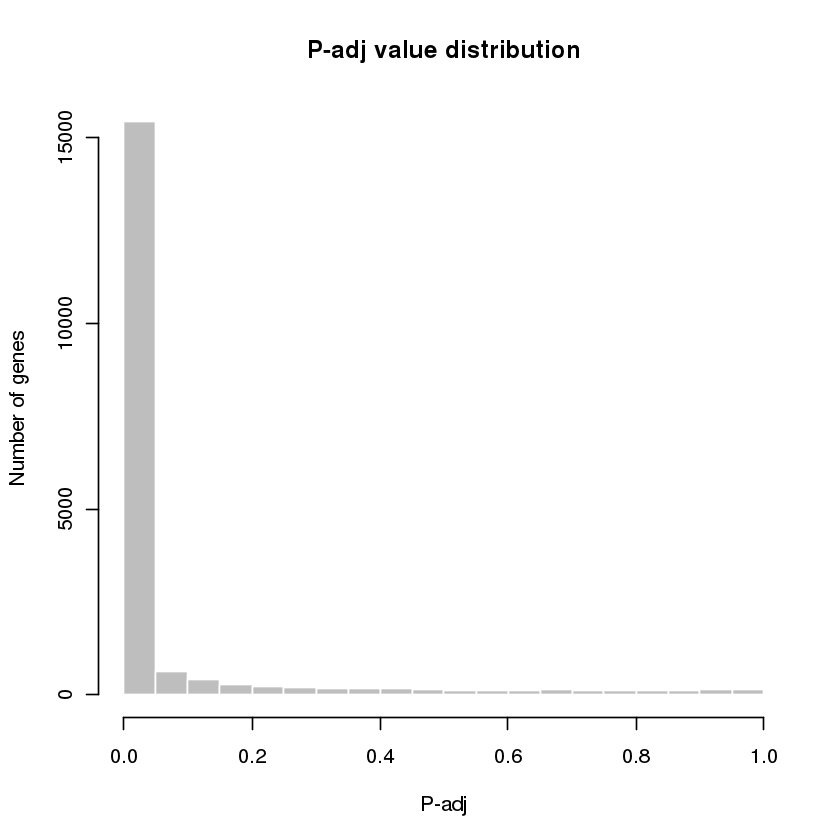

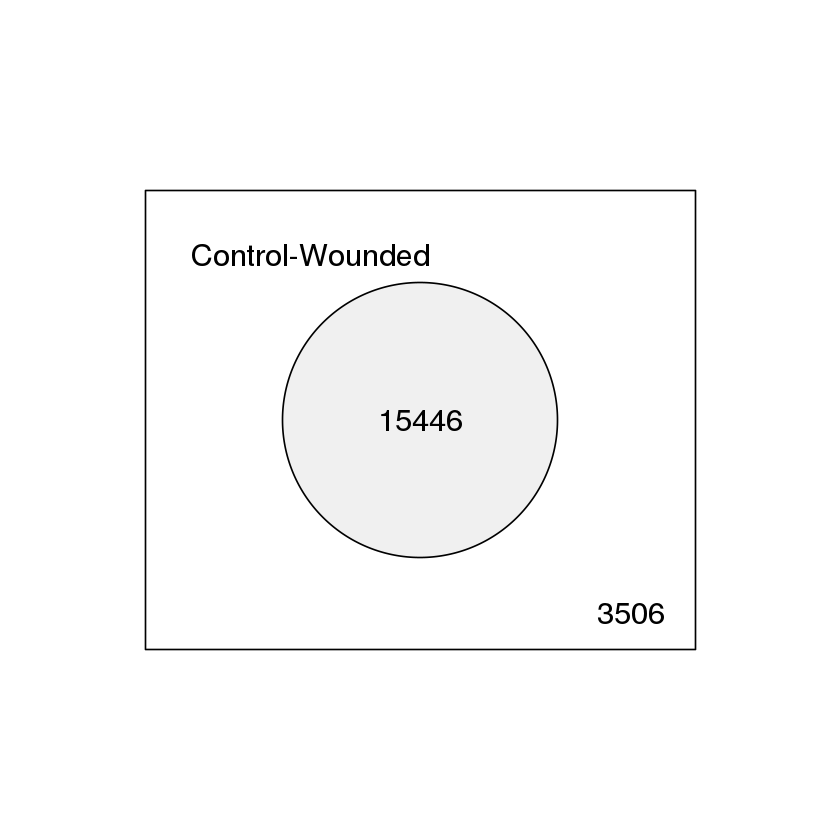

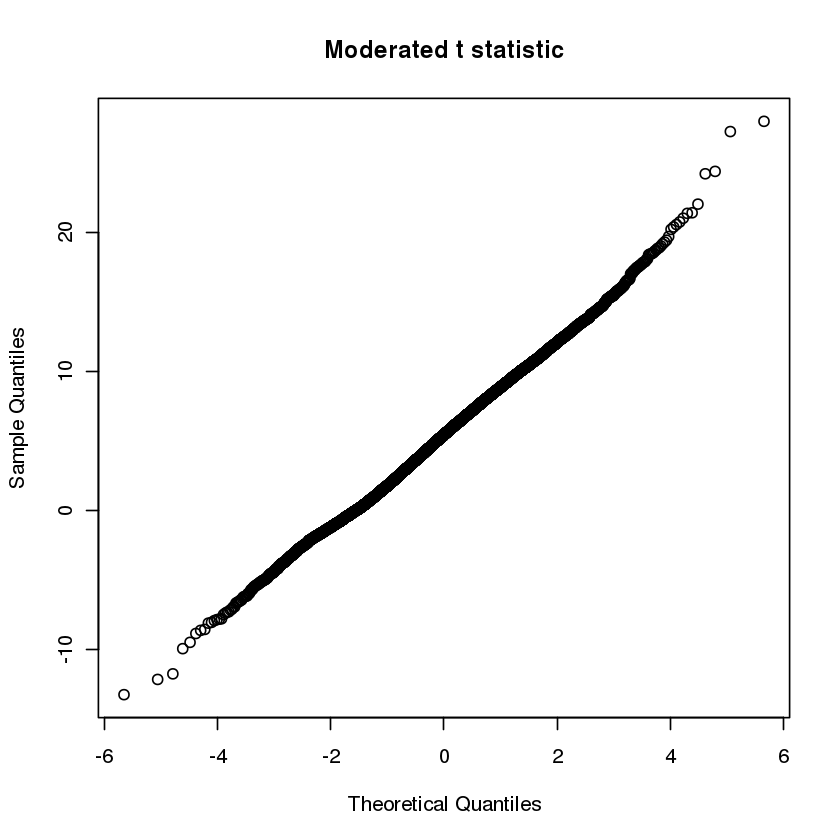

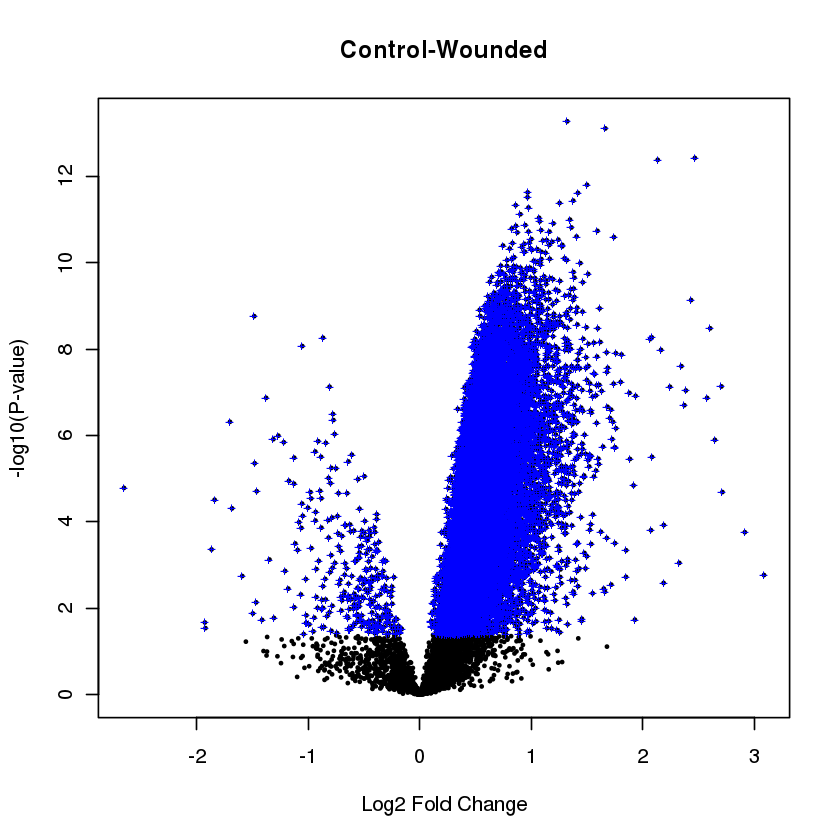

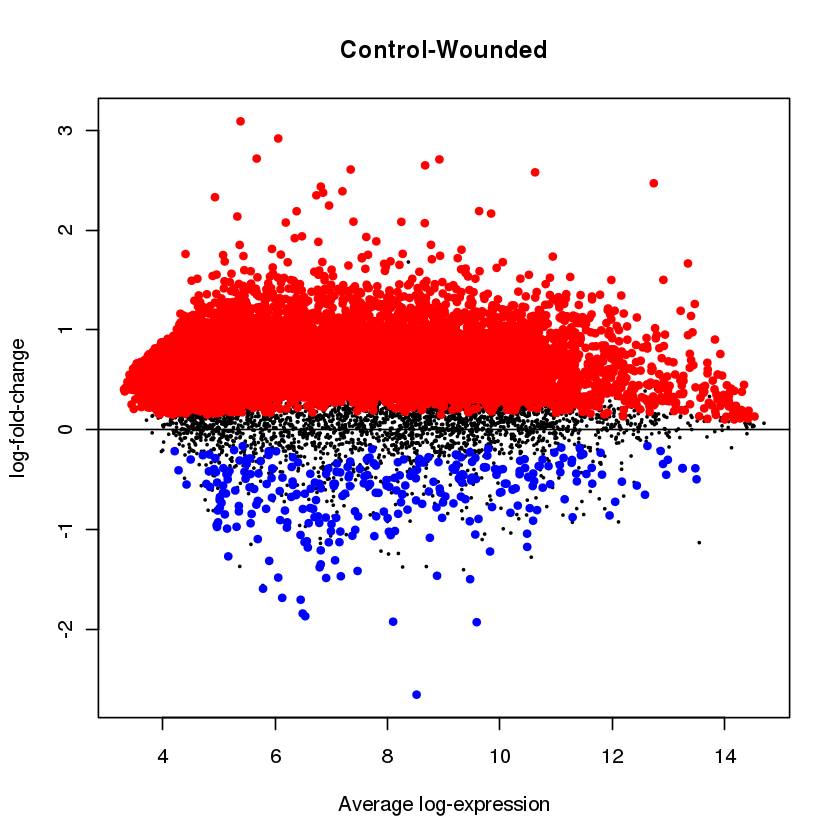

In [28]:
GSE62863_obj <- getDEG("GSE62863", "GPL1322", "11111111000000", c("Gene.symbol","Gene.title"), T,
                       c("Control","Wounded"))

#### Gene Expression Data analysis

##### box-and-whisker plots

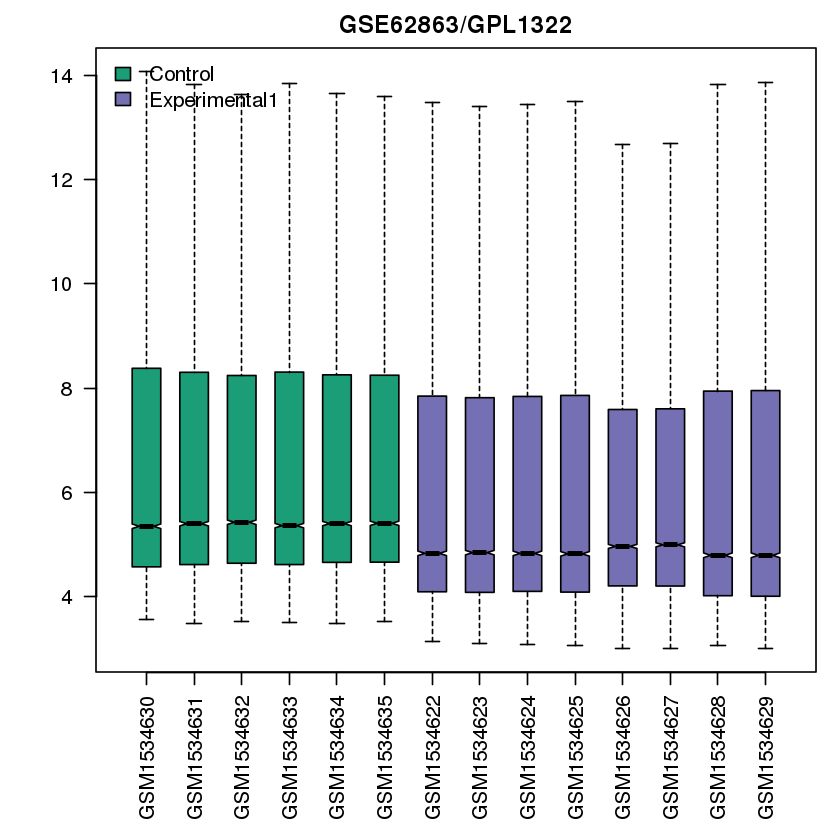

In [13]:
box_and_whisker_gset("GSE62863", GSE62863_obj$gset, GSE62863_obj$sampleGroups, GSE62863_obj$gsetExprs,F)

##### expression value distribution

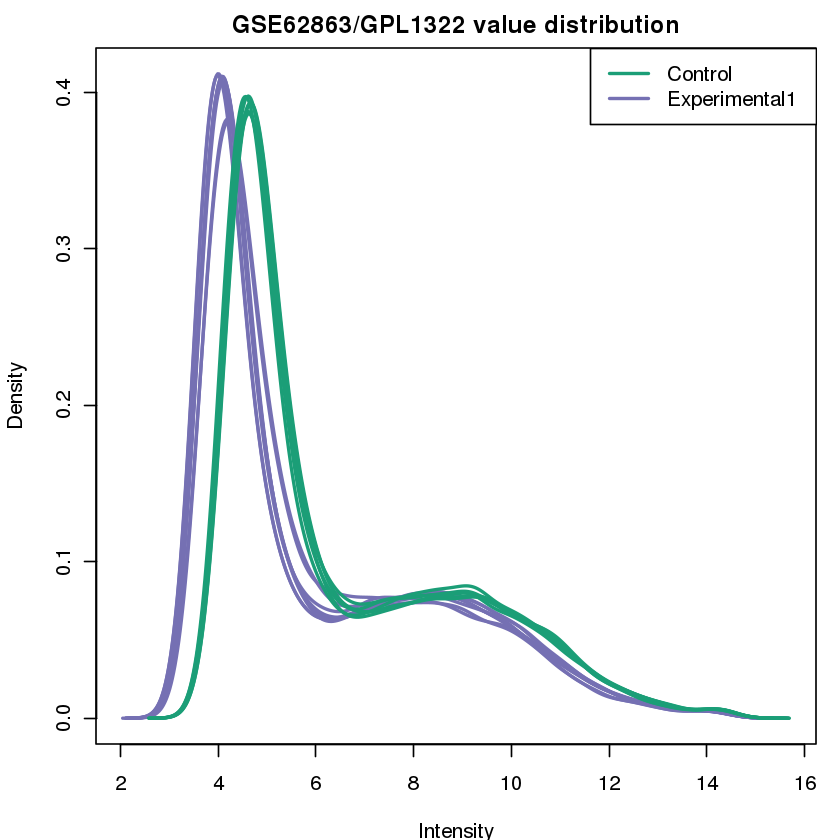

In [14]:
exp_val_dist_gset("GSE62863", GSE62863_obj$gset, GSE62863_obj$sampleGroups, GSE62863_obj$gsetExprs,F)

##### UMAP plot

Loading required package: sp


Attaching package: ‘sp’


The following object is masked from ‘package:IRanges’:

    %over%


Checking rgeos availability: TRUE



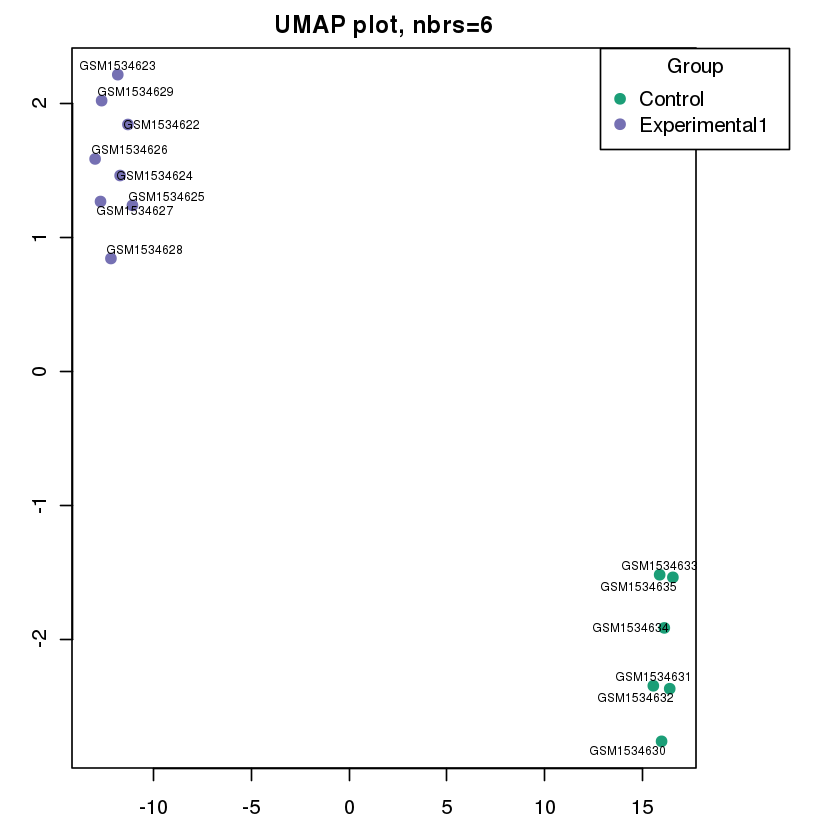

In [16]:
getUMAP_gset(GSE62863_obj$gsetExprs, 6, GSE62863_obj$sampleGroups,F)

##### mean-variance trend

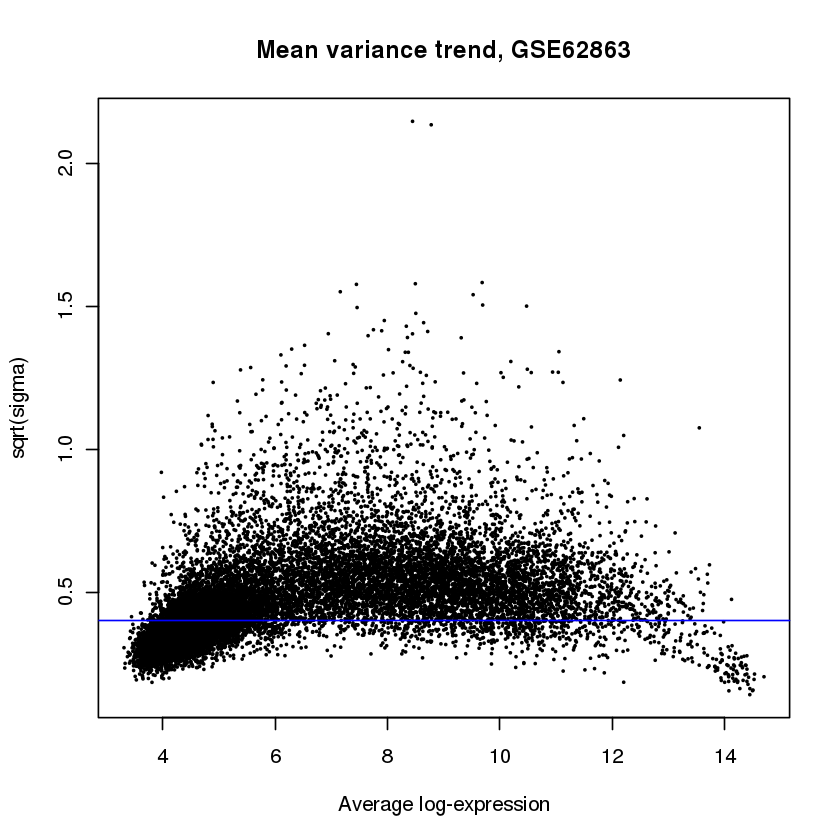

In [17]:
plotSA(GSE62863_obj$fit2, main=paste("Mean variance trend, ", "GSE62863", sep=""))

#### Extracting Human Orthologs of DEGs

In [71]:
names(GSE62863_obj$tT2)

[1] "ID"                    "Gene.title"            "Gene.symbol"          
 [4] "Gene.ID"               "UniGene.title"         "UniGene.symbol"       
 [7] "UniGene.ID"            "Nucleotide.Title"      "GI"                   
[10] "GenBank.Accession"     "Platform_CLONEID"      "Platform_ORF"         
[13] "Platform_SPOTID"       "Chromosome.location"   "Chromosome.annotation"
[16] "GO.Function"           "GO.Process"            "GO.Component"         
[19] "GO.Function.ID"        "GO.Process.ID"         "GO.Component.ID"      
[22] "logFC"                 "AveExpr"               "t"                    
[25] "P.Value"               "adj.P.Val"             "B"

In [30]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE62863_obj$tT2), sep=" "))
transcriptToGene <- pData(featureData(GSE62863_obj$gset))
totalTranscripts <- transcriptToGene[as.character(GSE62863_obj$tT2$ID),]

viable_transcripts <- 0
viable_transcripts_ids <- character(0)
total_transcript_genes <- character(0)
for(i in 1:nrow(totalTranscripts)) {
    current_string <- totalTranscripts$'Gene.symbol'[i]
    if(length(current_string) < 1) {next}
    
    ensemblIDs <- unlist(strsplit(current_string, "///"))
    # remove weird  symbols
    ensemblIDs <- ensemblIDs[grep("^[A-Za-z0-9]+$", ensemblIDs, perl=TRUE)]
    
    if(is.null(ensemblIDs)) {next}
    if(length(ensemblIDs) < 1) {next}
    viable_transcripts <- viable_transcripts+1
    viable_transcripts_ids <- append(viable_transcripts_ids, rep(totalTranscripts$ID[i],
                                                                 length(ensemblIDs)), length(viable_transcripts_ids))
    total_transcript_genes <- append(total_transcript_genes, ensemblIDs, length(total_transcript_genes))
}



transcript_id_dict <- data.frame("transcriptGenes" = total_transcript_genes, "transcriptIDS" = viable_transcripts_ids)

print(paste("Total transcripts with an associated fly gene:", viable_transcripts, sep=" "))
print(paste("Total associated fly genes:", length(total_transcript_genes), sep=" "))

GSE62863_lfc_genes <- filter_transcripts(GSE62863_obj, transcript_id_dict, "dmelanogaster_wound_GGSE62863",
                                         dmelanogaster, "external_gene_name", "GSE62863", 'logFC', pval=.05, 
                                         homology_confidence = F)

[1] "Total Transcripts: 18952"
[1] "Total transcripts with an associated fly gene: 13949"
[1] "Total associated fly genes: 14368"
[1] "Total dmelanogaster_wound_GGSE62863 transcripts with Available Human Orthologs: 16122"
[1] "Total dmelanogaster_wound_GGSE62863 transcripts with Available Human Ortholog Gene Symbols: 5553"
[1] "Total dmelanogaster_wound_GGSE62863 genes with Available Human Ortholog Gene Symbols and in Background gene sets: 5531"
[1] "Total transcripts after orthologous mapping and filtering: 6212"
[1] "Total significant transcripts after orthologous mapping and filtering: 4630"
[1] "################################"
[1] "logFC LogFC"
[1] "Total transcripts with negative logFC vals: 120"
[1] "Total transcripts with positive logFC vals: 4510"
[1] "Total significant downregulated dmelanogaster_wound_GGSE62863 genes after orthologous mapping and filtering: 119"
[1] "Total significant upregulated dmelanogaster_wound_GGSE62863 genes after orthologous mapping and filtering: 4

### GSE85459

#### Data Download and Normalization

Found 1 file(s)

GSE85459_series_matrix.txt.gz


── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  ID_REF = col_double(),
  GSM2267318 = col_double(),
  GSM2267319 = col_double(),
  GSM2267320 = col_double(),
  GSM2267321 = col_double(),
  GSM2267322 = col_double(),
  GSM2267323 = col_double(),
  GSM2267324 = col_double(),
  GSM2267325 = col_double()
)


Warning message in download.file(myurl, destfile, mode = mode, quiet = TRUE, method = getOption("download.file.method.GEOquery")):
“cannot open URL 'https://ftp.ncbi.nlm.nih.gov/geo/platforms/GPL17nnn/GPL17403/annot/GPL17403.annot.gz': HTTP status was '404 Not Found'”
Annotation GPL not available, so will use submitter GPL instead

File stored at: 

/tmp/RtmpFkfKoa/GPL17403.soft

Warning message:
“9414 parsing failures.
  row   col expected actual         file
27685 start a double    --- literal data
27685 stop  a double    --- literal data
27686 sta

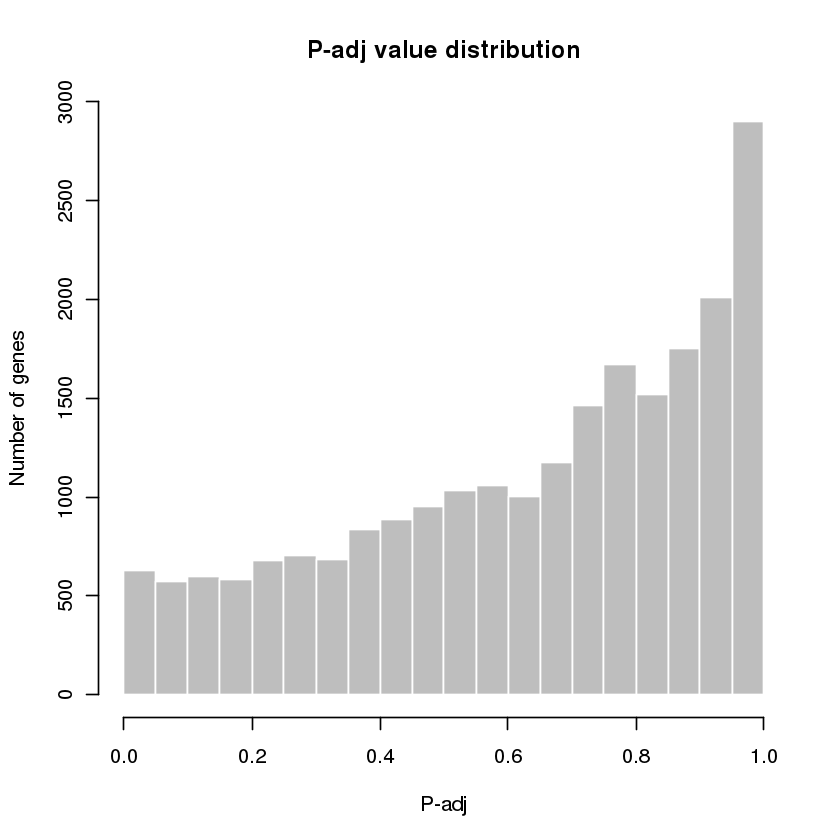

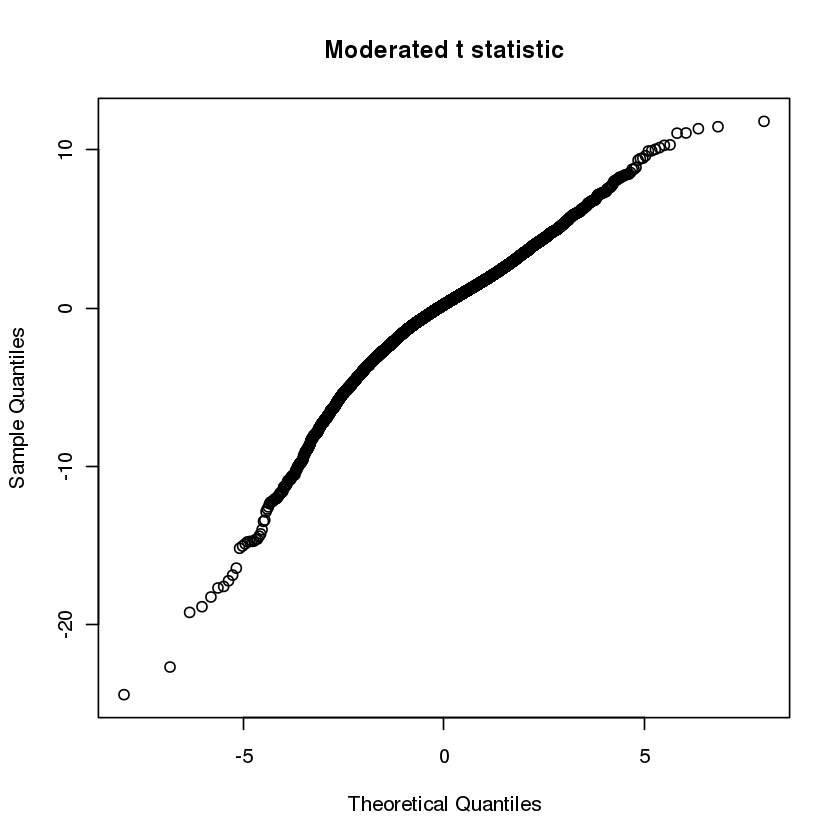

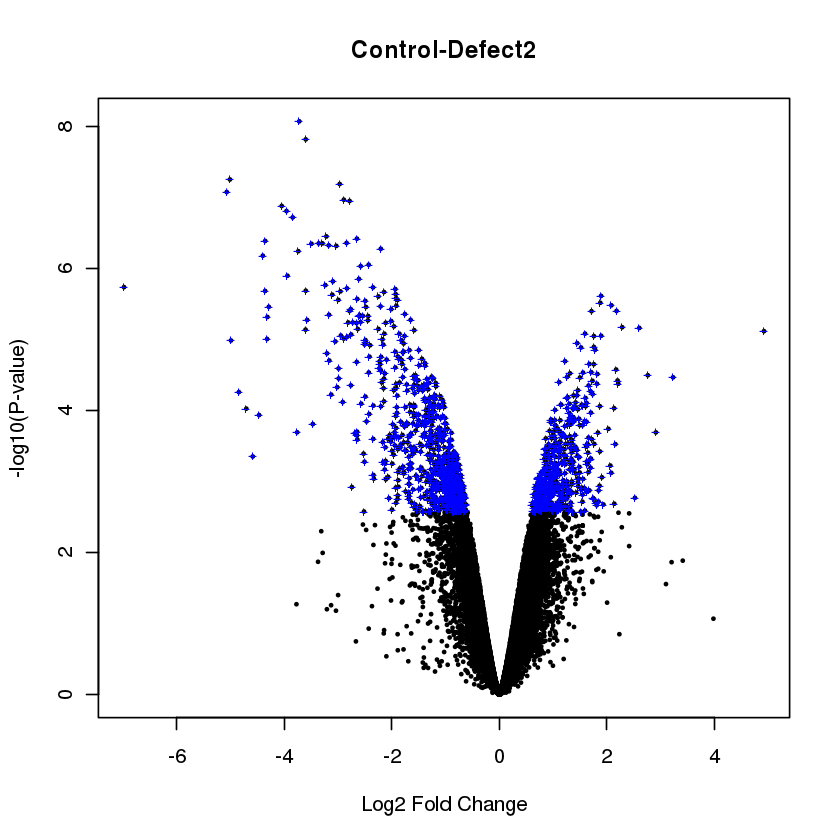

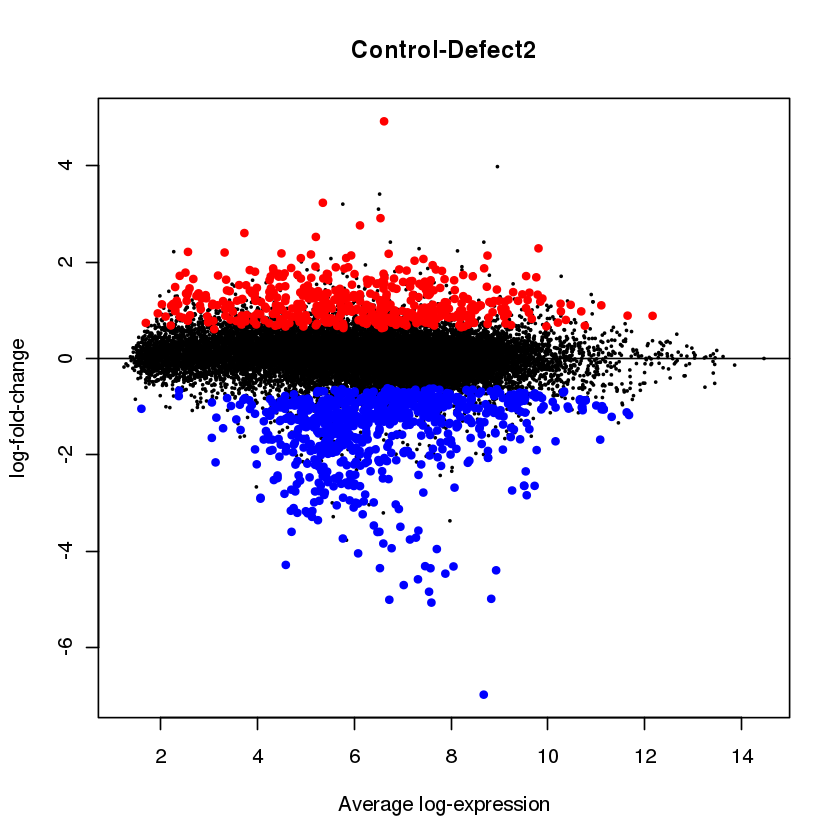

In [31]:
GSE85459_obj <- getDEG("GSE85459", "GPL17403", "00112233", c("SPOT_ID","gene_assignment"), T,
                      c("Control","Defect2", "Defect6", "Defect_Protracted6"))

#### Gene Expression Data analysis

##### box-and-whisker plots

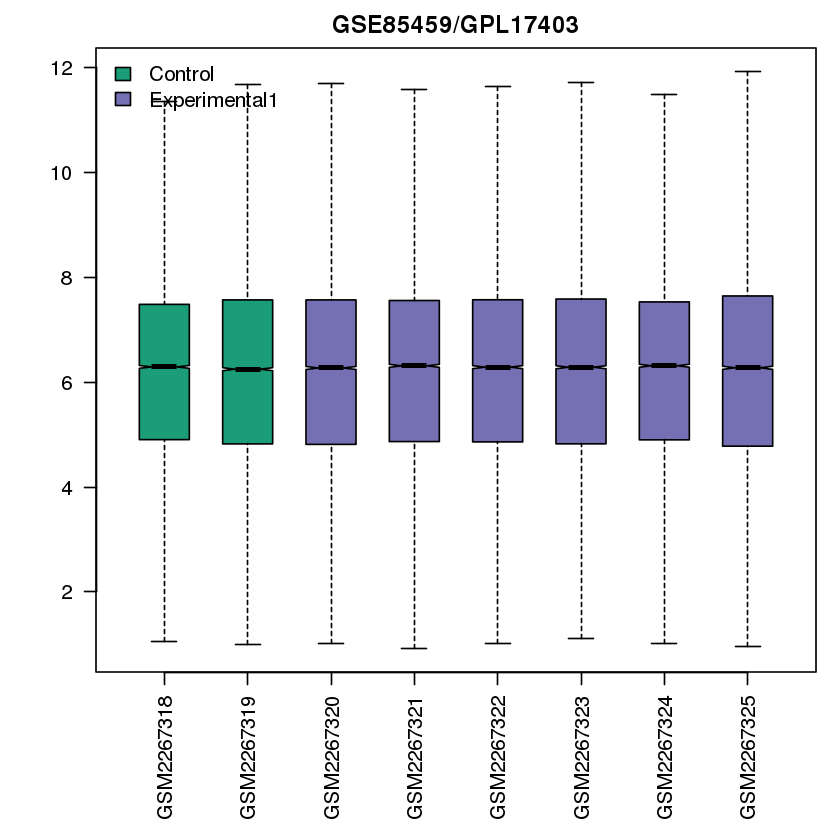

In [41]:
box_and_whisker_gset("GSE85459", GSE85459_obj$gset, GSE85459_obj$sampleGroups, GSE85459_obj$gsetExprs,F)

##### expression value distribution

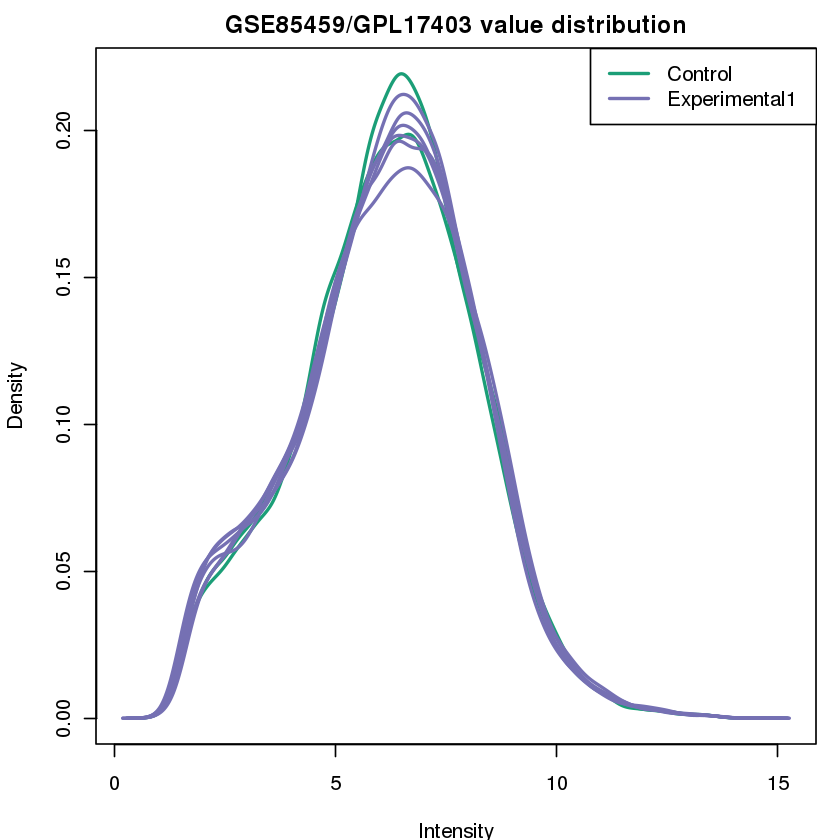

In [42]:
exp_val_dist_gset("GSE85459", GSE85459_obj$gset, GSE85459_obj$sampleGroups, GSE85459_obj$gsetExprs,F)

##### UMAP plot

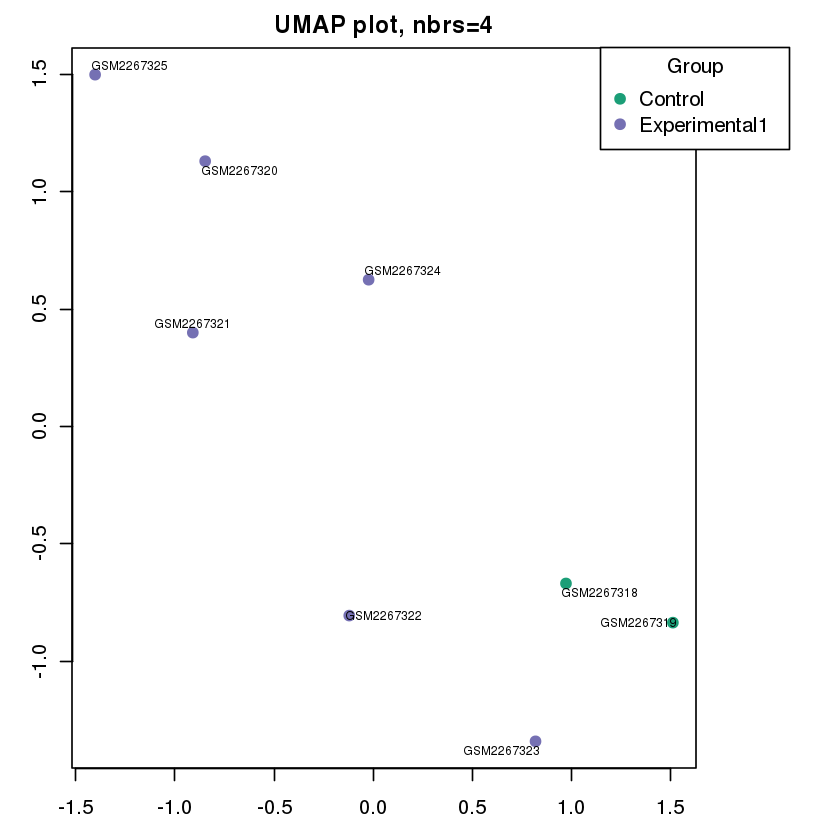

In [43]:
getUMAP_gset(GSE85459_obj$gsetExprs, 4, GSE85459_obj$sampleGroups,F)

##### mean-variance trend

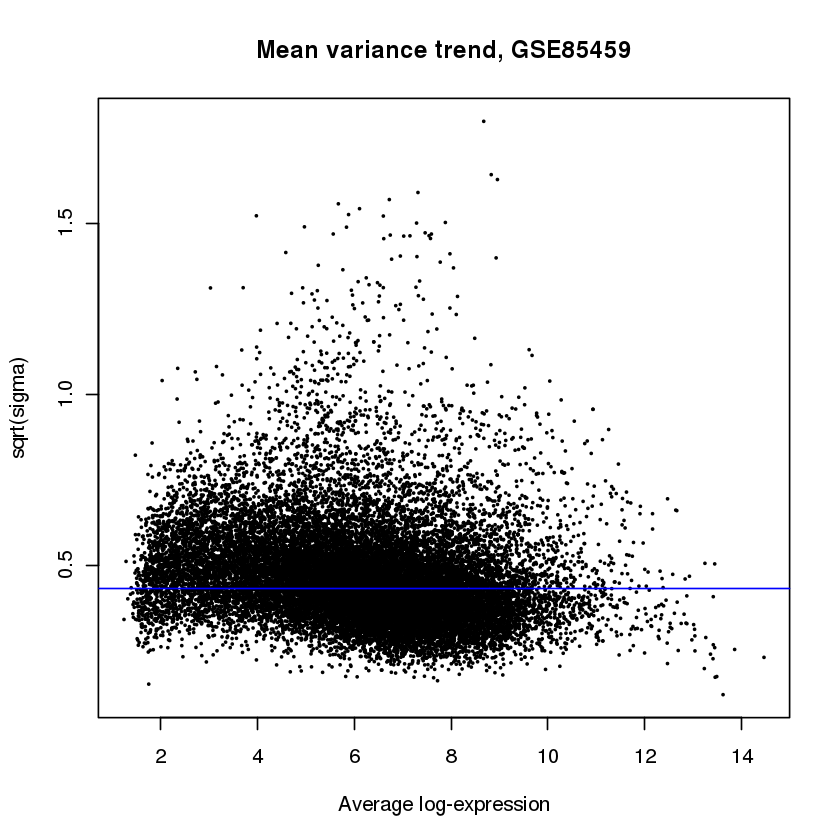

In [44]:
plotSA(GSE85459_obj$fit2, main=paste("Mean variance trend, ", "GSE85459", sep=""))

#### Extracting Human Orthologs of DEGs

In [32]:
names(GSE85459_obj$tT2)

[1] "ID"                         "probeset_id"               
 [3] "seqname"                    "strand"                    
 [5] "start"                      "stop"                      
 [7] "total_probes"               "gene_assignment"           
 [9] "mrna_assignment"            "category"                  
[11] "SPOT_ID"                    "Control.Defect2"           
[13] "Control.Defect6"            "Control.Defect_Protracted6"
[15] "Defect2.Defect6"            "Defect2.Defect_Protracted6"
[17] "Defect6.Defect_Protracted6" "AveExpr"                   
[19] "F"                          "P.Value"                   
[21] "adj.P.Val"

In [33]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE85459_obj$tT2), sep=" "))
transcriptToGene <- pData(featureData(GSE85459_obj$gset))
totalTranscripts <- transcriptToGene[as.character(GSE85459_obj$tT2$ID),]

viable_transcripts <- 0
viable_transcripts_ids <- character(0)
total_transcript_genes <- character(0)
for(i in 1:nrow(totalTranscripts)) {
    
    current_string <- totalTranscripts$'gene_assignment'[i]
    if(length(current_string) == 1 & current_string == "---") {next}
    
    unlist1 <- unlist(strsplit(current_string, "/// "))
    unlist2 <- unlist(strsplit(unlist1, " //"))
    ensemblIDs <- unlist2[str_detect(unlist2, "ENSCAFT")]
    
    if(is.null(ensemblIDs)) {next}
    if(length(ensemblIDs) < 1) {next}
    viable_transcripts <- viable_transcripts+1
    viable_transcripts_ids <- append(viable_transcripts_ids, rep(totalTranscripts$ID[i],
                                                                 length(ensemblIDs)), length(viable_transcripts_ids))
    total_transcript_genes <- append(total_transcript_genes, ensemblIDs, length(total_transcript_genes))
}

transcript_id_dict <- data.frame("transcriptGenes" = total_transcript_genes, "transcriptIDS" = viable_transcripts_ids)

print(paste("Total transcripts with an associated dog gene:", viable_transcripts, sep=" "))
print(paste("Total associated dog genes:", length(total_transcript_genes), sep=" "))

GSE85459_lfc_columns<- c('Control.Defect2', 'Control.Defect6', 'Control.Defect_Protracted6')

GSE85459_lfc_genes <- filter_transcripts(GSE85459_obj, transcript_id_dict, "clupisFamiliaris_wound_GSE85459",
                                         clfamiliaris, "ensembl_transcript_id", "GSE85459",GSE85459_lfc_columns,
                                         pval=.05, homology_confidence = F)

[1] "Total Transcripts: 22708"
[1] "Total transcripts with an associated dog gene: 16717"
[1] "Total associated dog genes: 23714"
[1] "Total clupisFamiliaris_wound_GSE85459 transcripts with Available Human Orthologs: 14312"
[1] "Total clupisFamiliaris_wound_GSE85459 transcripts with Available Human Ortholog Gene Symbols: 13534"
[1] "Total clupisFamiliaris_wound_GSE85459 genes with Available Human Ortholog Gene Symbols and in Background gene sets: 13455"
[1] "Total transcripts after orthologous mapping and filtering: 12759"
[1] "Total significant transcripts after orthologous mapping and filtering: 366"
[1] "################################"
[1] "Control.Defect2 LogFC"
[1] "Total transcripts with negative logFC vals: 294"
[1] "Total transcripts with positive logFC vals: 72"
[1] "Total significant downregulated clupisFamiliaris_wound_GSE85459 genes after orthologous mapping and filtering: 403"
[1] "Total significant upregulated clupisFamiliaris_wound_GSE85459 genes after orthologous mapp

### GSE162565

#### Data Download and Normalization

Found 1 file(s)

GSE162565_series_matrix.txt.gz


── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_double()
)
ℹ Use `spec()` for the full column specifications.


Warning message in download.file(myurl, destfile, mode = mode, quiet = TRUE, method = getOption("download.file.method.GEOquery")):
“cannot open URL 'https://ftp.ncbi.nlm.nih.gov/geo/platforms/GPL17nnn/GPL17117/annot/GPL17117.annot.gz': HTTP status was '404 Not Found'”
Annotation GPL not available, so will use submitter GPL instead

File stored at: 

/tmp/RtmpFkfKoa/GPL17117.soft

Warning message:
“19204 parsing failures.
  row           col expected actual         file
30348 start         a double    --- literal data
30348 stop          a double    --- literal data
30348 crosshyb_type a double    --- literal data
30349 start         a double    --- literal data
30349 stop          a double    --- literal data
..... .........

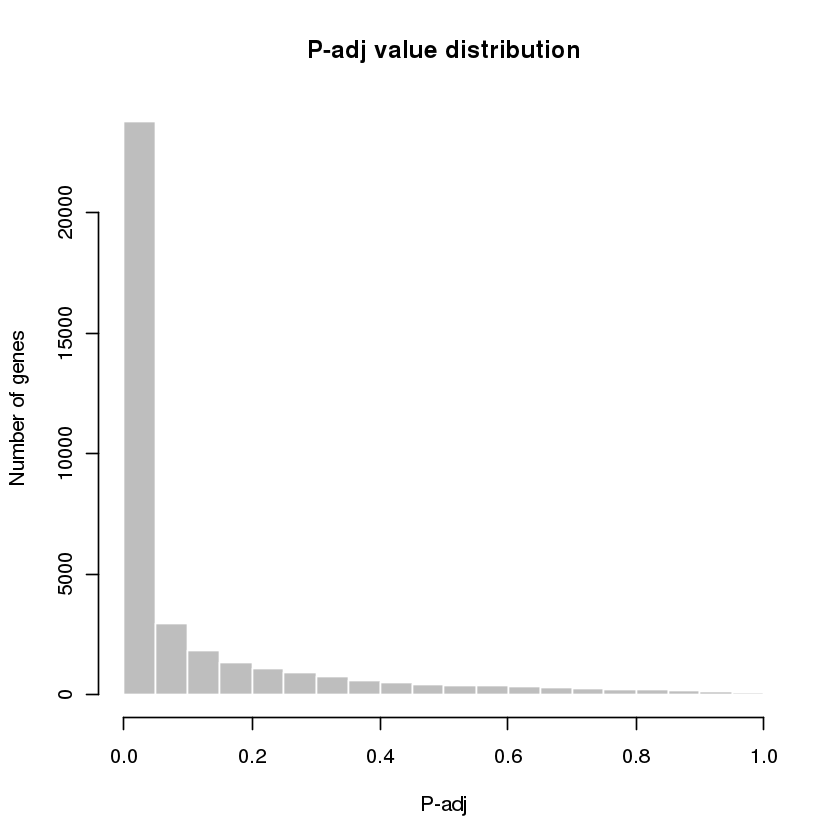

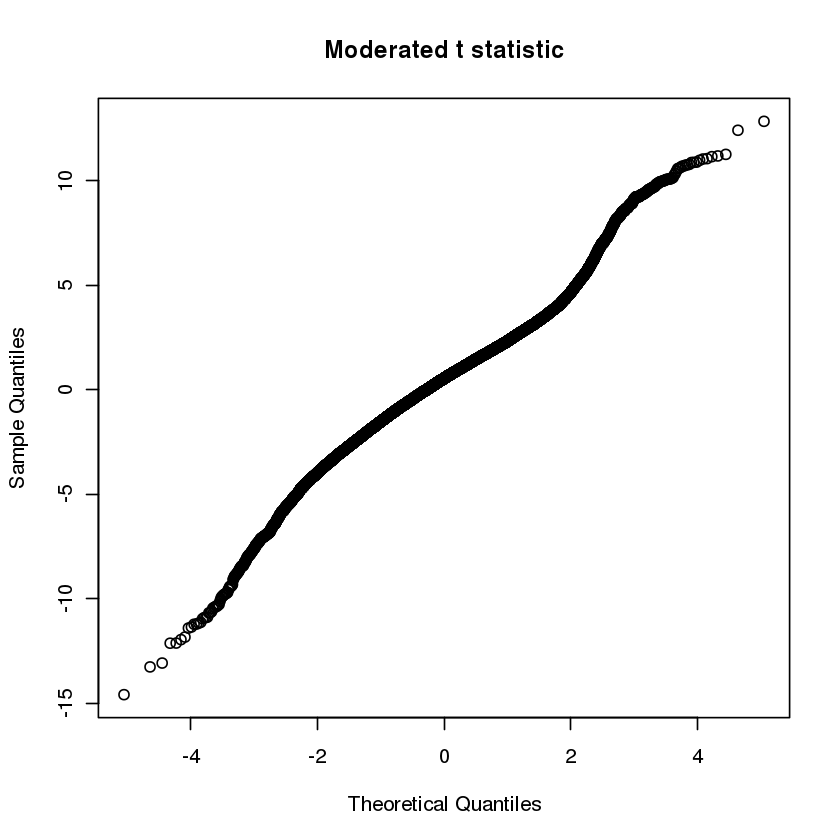

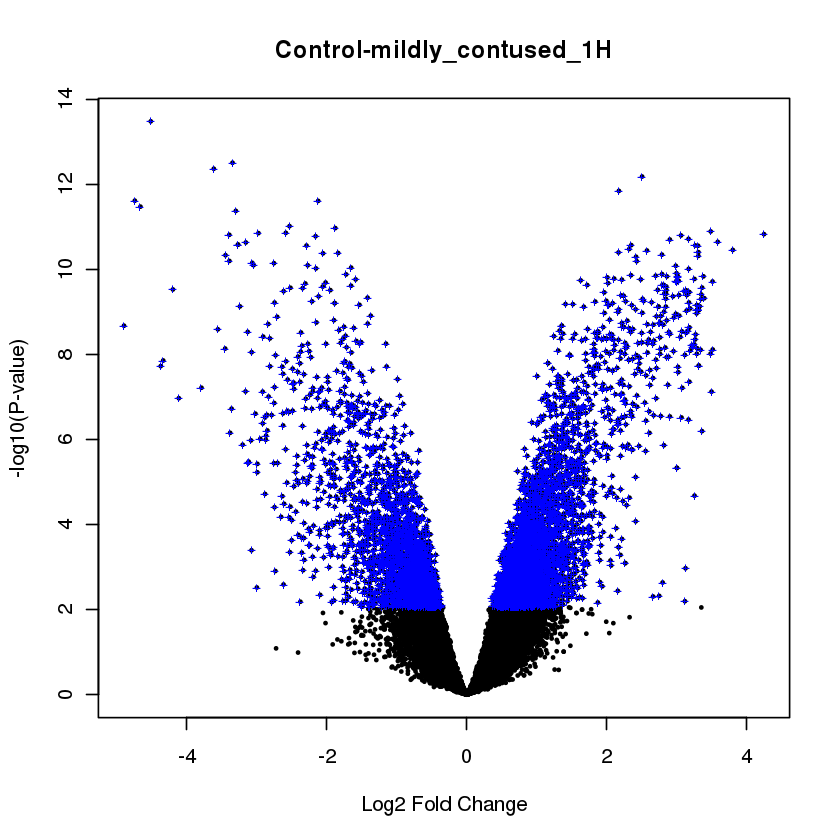

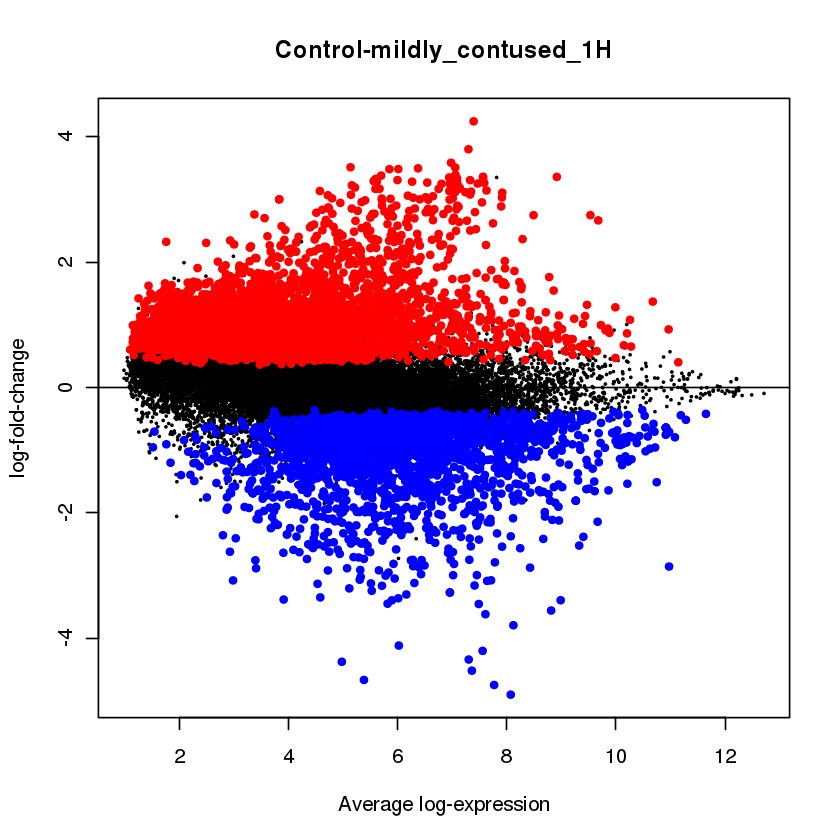

In [34]:
GSE162565_obj <- getDEG("GSE162565", "GPL17117", "000111222333444555666777888999AAA", c("SPOT_ID","GB_ACC"), T,
                        c("Control", "mildly_contused_1H", "mildly_contused_3H", "mildly_contused_24H",
                          "mildly_contused_48H", "mildly_contused_168H", "severely_contused_1H",
                          "severely_contused_3H", "severely_contused_24H", "severely_contused_48H",
                          "severely_contused_168H"
                          ))

#### Gene Expression Data analysis

##### box-and-whisker plots

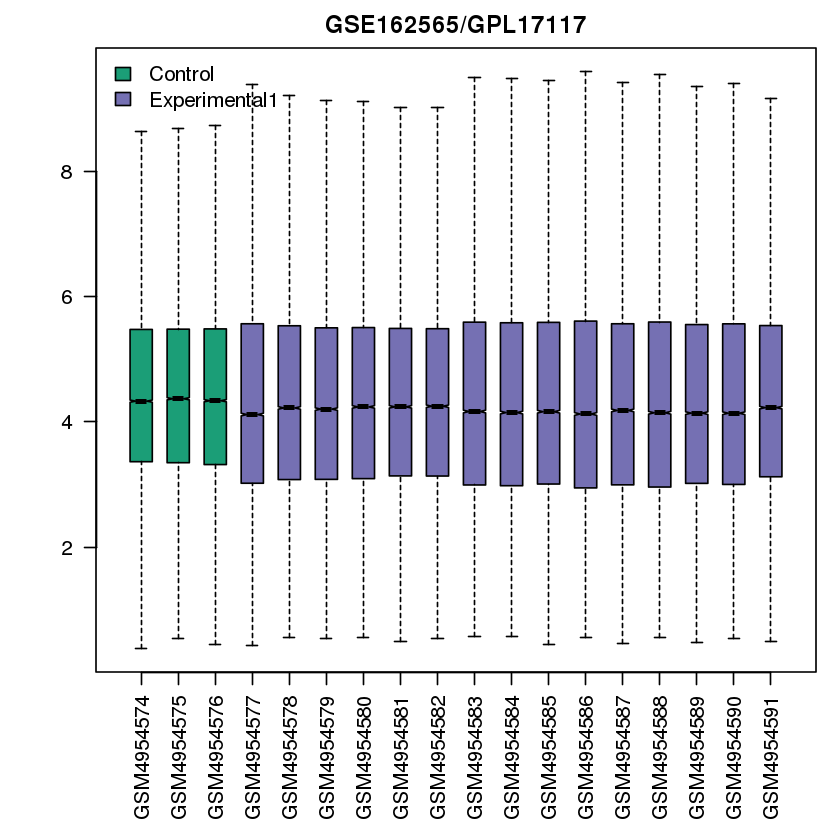

In [107]:
box_and_whisker_gset("GSE162565", GSE162565_obj$gset, GSE162565_obj$sampleGroups, GSE162565_obj$gsetExprs, T)

##### expression value distribution

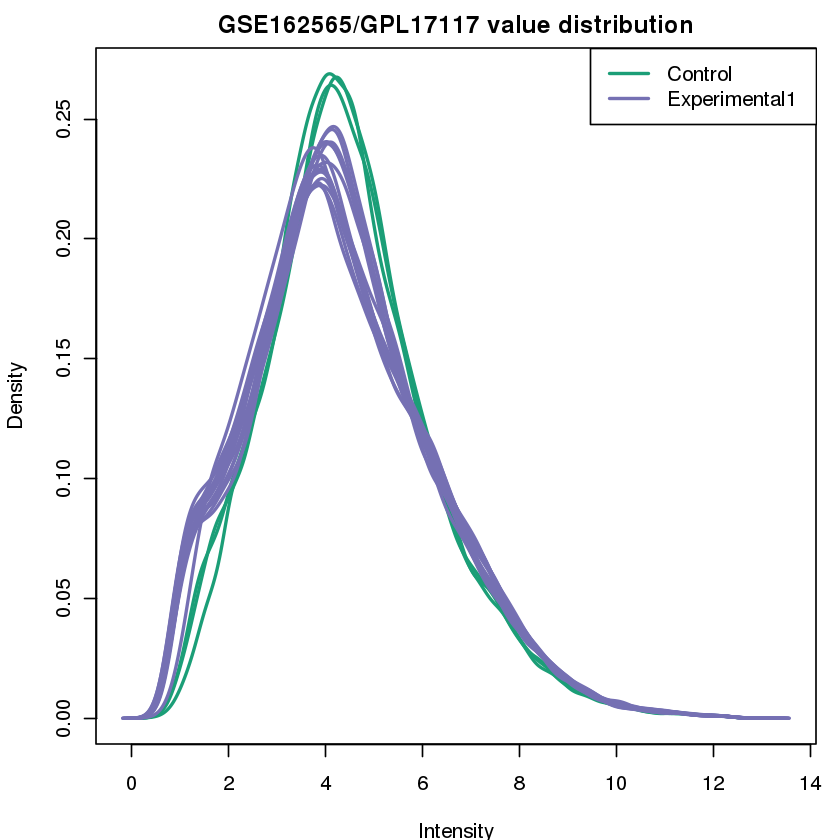

In [108]:
exp_val_dist_gset("GSE162565", GSE162565_obj$gset, GSE162565_obj$sampleGroups, GSE162565_obj$gsetExprs, T)

##### UMAP plot

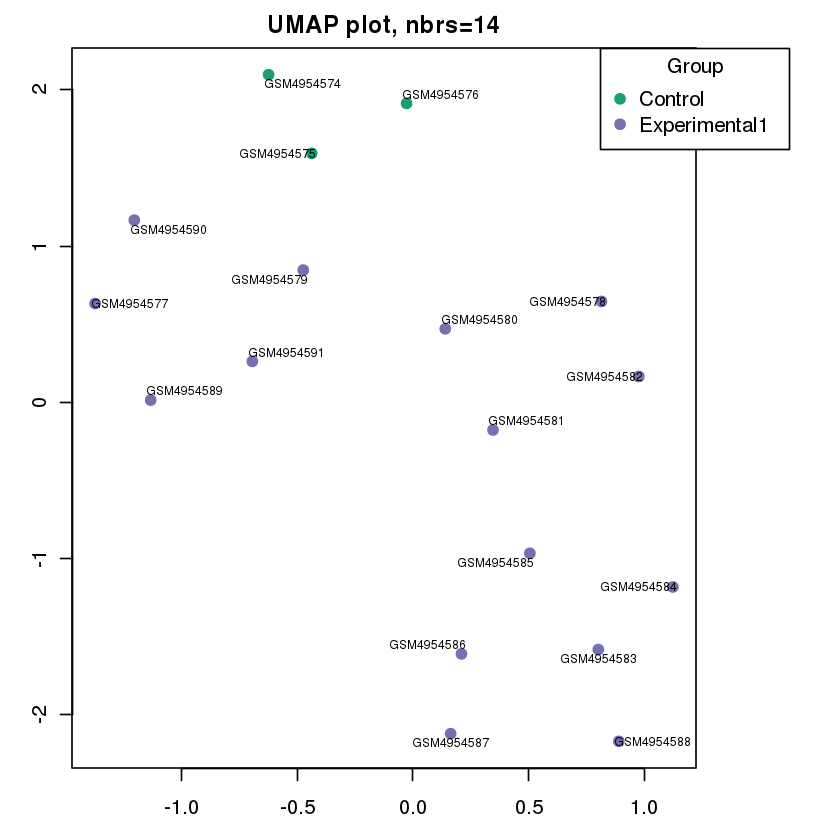

In [109]:
getUMAP_gset(GSE162565_obj$gsetExprs, 14, GSE162565_obj$sampleGroups,T)

##### mean-variance trend

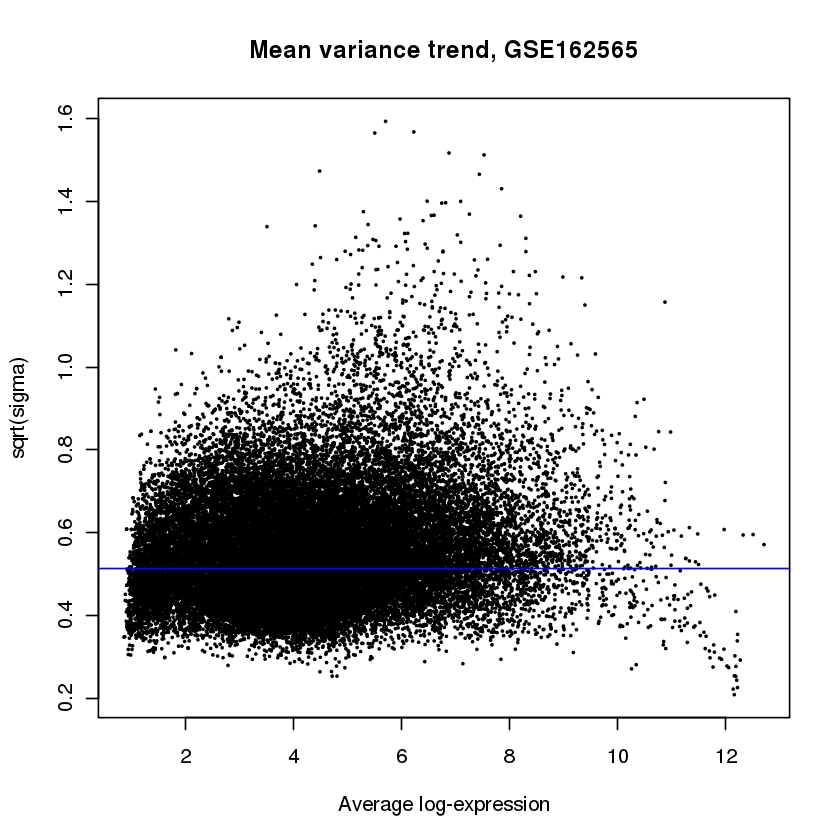

In [110]:
plotSA(GSE162565_obj$fit2, main=paste("Mean variance trend, ", "GSE162565", sep=""))

#### Extracting Human Orthologs of DEGs

In [35]:
names((GSE162565_obj$tT2))

[1] "ID"                                          
 [2] "probeset_id"                                 
 [3] "seqname"                                     
 [4] "strand"                                      
 [5] "start"                                       
 [6] "stop"                                        
 [7] "total_probes"                                
 [8] "gene_assignment"                             
 [9] "mrna_assignment"                             
[10] "swissprot"                                   
[11] "unigene"                                     
[12] "GO_biological_process"                       
[13] "GO_cellular_component"                       
[14] "GO_molecular_function"                       
[15] "pathway"                                     
[16] "protein_domains"                             
[17] "crosshyb_type"                               
[18] "category"                                    
[19] "SPOT_ID"                                     
[20] "GB_ACC"                                      
[21] "Control.mildly_contused_1H"                  
[22] "Control.mildly_contused_3H"                  
[23] "Control.mildly_contused_24H"                 
[24] "Control.mildly_contused_48H"                 
[25] "Control.mildly_contused_168H"                
[26] "Control.severely_contused_1H"                
[27] "Control.severely_contused_3H"                
[28] "Control.severely_contused_24H"               
[29] "Control.severely_contused_48H"               
[30] "Control.severely_contused_168H"              
[31] "mildly_contused_1H.mildly_contused_3H"       
[32] "mildly_contused_1H.mildly_contused_24H"      
[33] "mildly_contused_1H.mildly_contused_48H"      
[34] "mildly_contused_1H.mildly_contused_168H"     
[35] "mildly_contused_1H.severely_contused_1H"     
[36] "mildly_contused_1H.severely_contused_3H"     
[37] "mildly_contused_1H.severely_contused_24H"    
[38] "mildly_contused_1H.severely_contused_48H"    
[39] "mildly_contused_1H.severely_contused_168H"   
[40] "mildly_contused_3H.mildly_contused_24H"      
[41] "mildly_contused_3H.mildly_contused_48H"      
[42] "mildly_contused_3H.mildly_contused_168H"     
[43] "mildly_contused_3H.severely_contused_1H"     
[44] "mildly_contused_3H.severely_contused_3H"     
[45] "mildly_contused_3H.severely_contused_24H"    
[46] "mildly_contused_3H.severely_contused_48H"    
[47] "mildly_contused_3H.severely_contused_168H"   
[48] "mildly_contused_24H.mildly_contused_48H"     
[49] "mildly_contused_24H.mildly_contused_168H"    
[50] "mildly_contused_24H.severely_contused_1H"    
[51] "mildly_contused_24H.severely_contused_3H"    
[52] "mildly_contused_24H.severely_contused_24H"   
[53] "mildly_contused_24H.severely_contused_48H"   
[54] "mildly_contused_24H.severely_contused_168H"  
[55] "mildly_contused_48H.mildly_contused_168H"    
[56] "mildly_contused_48H.severely_contused_1H"    
[57] "mildly_contused_48H.severely_contused_3H"    
[58] "mildly_contused_48H.severely_contused_24H"   
[59] "mildly_contused_48H.severely_contused_48H"   
[60] "mildly_contused_48H.severely_contused_168H"  
[61] "mildly_contused_168H.severely_contused_1H"   
[62] "mildly_contused_168H.severely_contused_3H"   
[63] "mildly_contused_168H.severely_contused_24H"  
[64] "mildly_contused_168H.severely_contused_48H"  
[65] "mildly_contused_168H.severely_contused_168H" 
[66] "severely_contused_1H.severely_contused_3H"   
[67] "severely_contused_1H.severely_contused_24H"  
[68] "severely_contused_1H.severely_contused_48H"  
[69] "severely_contused_1H.severely_contused_168H" 
[70] "severely_contused_3H.severely_contused_24H"  
[71] "severely_contused_3H.severely_contused_48H"  
[72] "severely_contused_3H.severely_contused_168H" 
[73] "severely_contused_24H.severely_contused_48H" 
[74] "severely_contused_24H.severely_contused_168H"
[75] "severely_contused_48H.severely_contused_168H"
[76] "AveExpr"                                     
[77] "F"                                         

In [36]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE162565_obj$tT2), sep=" "))
transcriptToGene <- pData(featureData(GSE162565_obj$gset))
totalTranscripts <- transcriptToGene[as.character(GSE162565_obj$tT2$ID),]
GSE162565_avail_symbols <- totalTranscripts[totalTranscripts$SPOT_ID !=  "" &
                                                totalTranscripts$SPOT_ID !=  "no hit" ,]

GSE162565_transcript_id_to_ho_dict <- data.frame("transcriptGenes" = toupper(GSE162565_avail_symbols$SPOT_ID),
                                 "transcriptIDS" = GSE162565_avail_symbols$ID)

GSE162565_lfc_columns<- c('Control.mildly_contused_1H', 'Control.mildly_contused_3H', 'Control.mildly_contused_24H',
                          'Control.mildly_contused_48H', 'Control.mildly_contused_168H', 'Control.severely_contused_1H',
                          'Control.severely_contused_3H','Control.severely_contused_24H', 'Control.severely_contused_48H',
                          'Control.severely_contused_168H')

GSE162565_lfc_genes <- filter_transcripts(GSE162565_obj, GSE162565_transcript_id_to_ho_dict,
                                         "rnorvegicus_wound_GSE162565", rnorvegicus, "ensembl_transcript_id",
                                          "GSE162565", GSE162565_lfc_columns,
                                          pval=.05, homology_confidence = F)

[1] "Total Transcripts: 36685"
[1] "Total rnorvegicus_wound_GSE162565 transcripts with Available Human Orthologs: 4570"
[1] "Total rnorvegicus_wound_GSE162565 transcripts with Available Human Ortholog Gene Symbols: 3754"
[1] "Total rnorvegicus_wound_GSE162565 genes with Available Human Ortholog Gene Symbols and in Background gene sets: 3710"
[1] "Total transcripts after orthologous mapping and filtering: 3748"
[1] "Total significant transcripts after orthologous mapping and filtering: 2707"
[1] "################################"
[1] "Control.mildly_contused_1H LogFC"
[1] "Total transcripts with negative logFC vals: 1519"
[1] "Total transcripts with positive logFC vals: 1188"
[1] "Total significant downregulated rnorvegicus_wound_GSE162565 genes after orthologous mapping and filtering: 1513"
[1] "Total significant upregulated rnorvegicus_wound_GSE162565 genes after orthologous mapping and filtering: 1168"
[1] "Total significant Final downregulated human othologs: 1549"
[1] "Total signif

### GSE162072

#### Data Download and Normalization

Found 1 file(s)

GSE162072_series_matrix.txt.gz


── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  ID_REF = col_double(),
  GSM4932656 = col_double(),
  GSM4932657 = col_double(),
  GSM4932658 = col_double(),
  GSM4932659 = col_double(),
  GSM4932660 = col_double(),
  GSM4932661 = col_double(),
  GSM4932662 = col_double(),
  GSM4932663 = col_double(),
  GSM4932664 = col_double(),
  GSM4932665 = col_double(),
  GSM4932666 = col_double(),
  GSM4932667 = col_double(),
  GSM4932668 = col_double(),
  GSM4932669 = col_double(),
  GSM4932670 = col_double(),
  GSM4932671 = col_double(),
  GSM4932672 = col_double()
)


Warning message in download.file(myurl, destfile, mode = mode, quiet = TRUE, method = getOption("download.file.method.GEOquery")):
“cannot open URL 'https://ftp.ncbi.nlm.nih.gov/geo/platforms/GPL17nnn/GPL17117/annot/GPL17117.annot.gz': HTTP status was '404 Not Found'”
Annotation GPL not availa

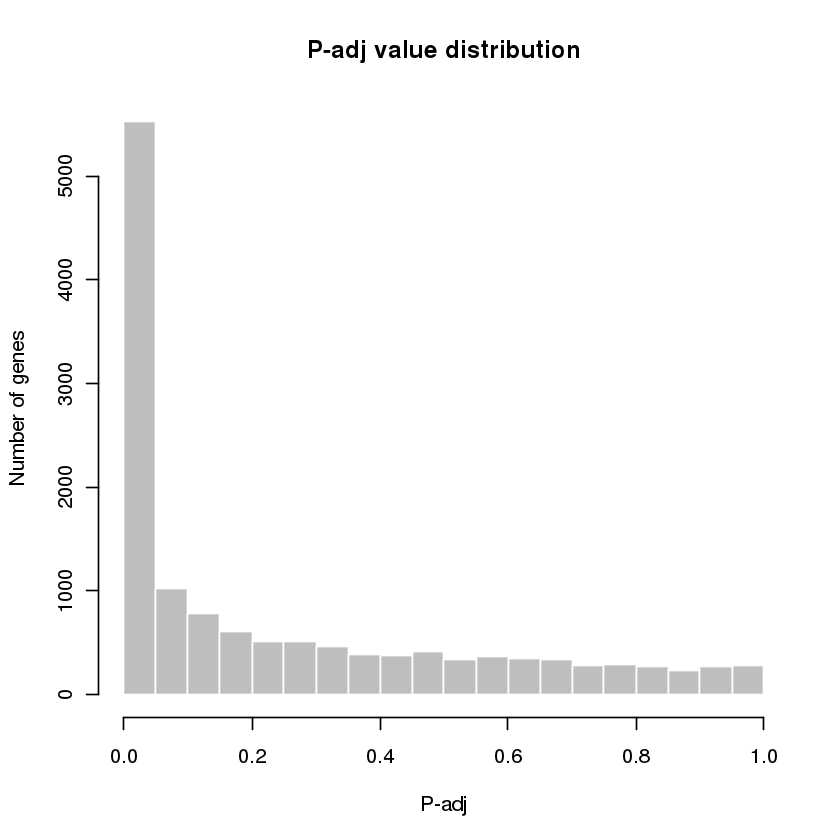

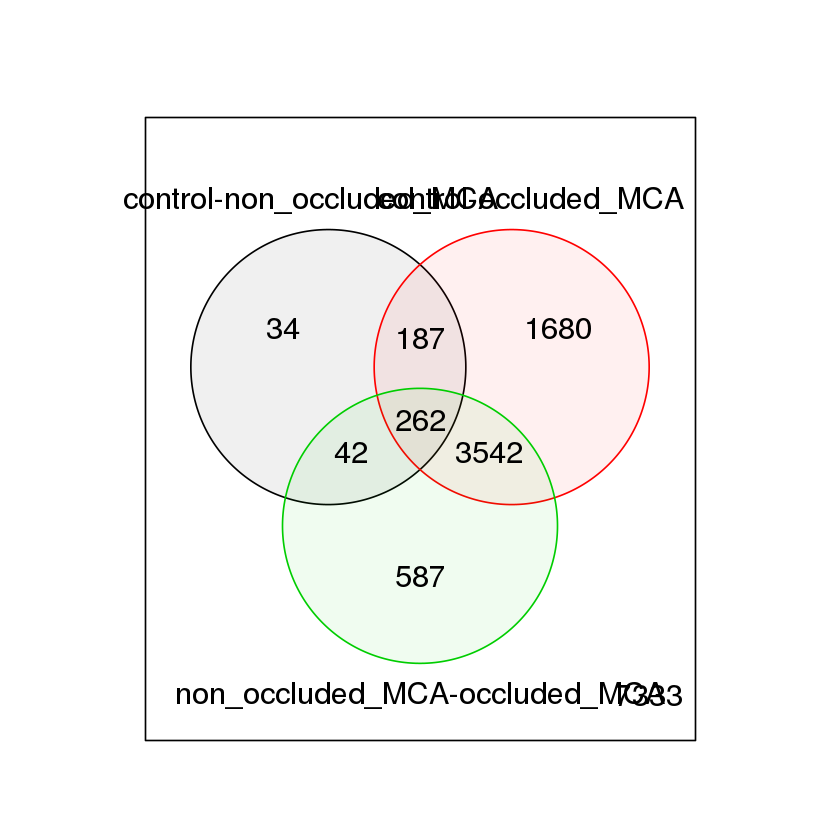

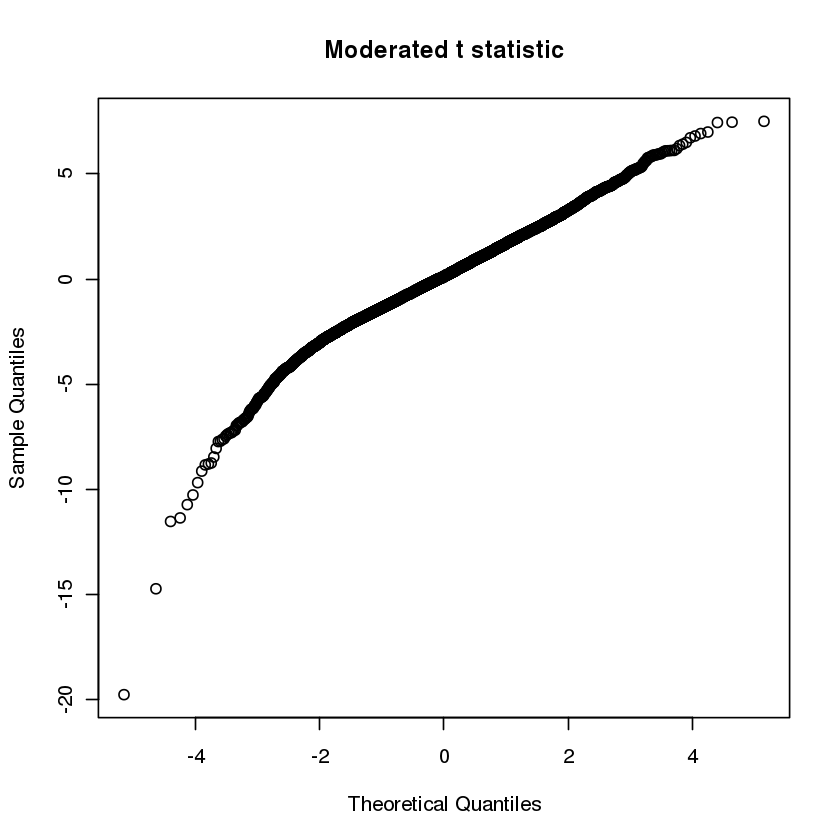

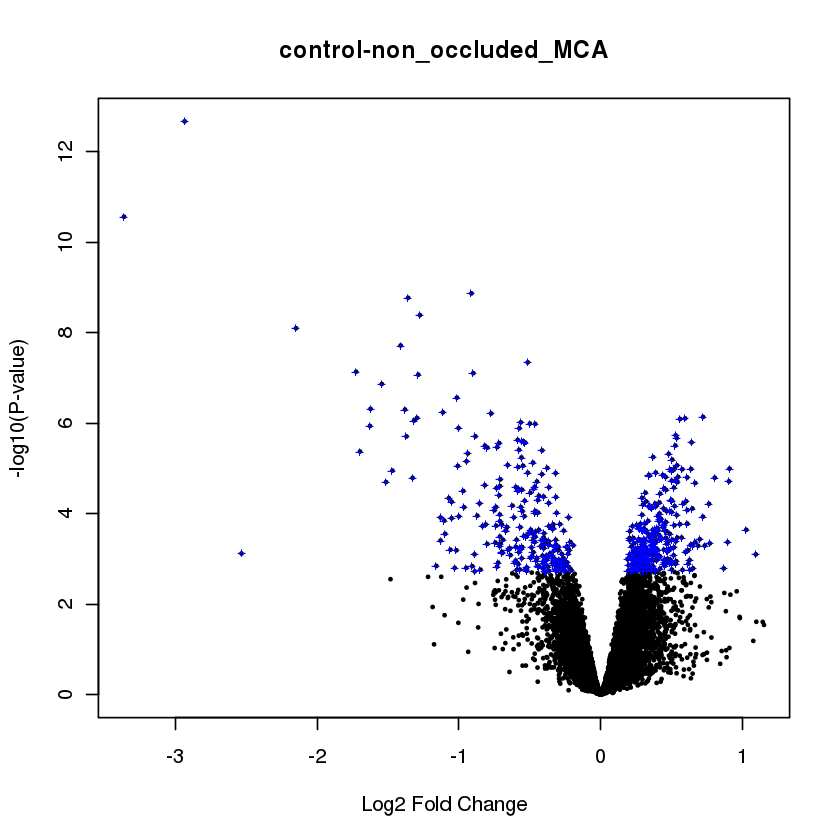

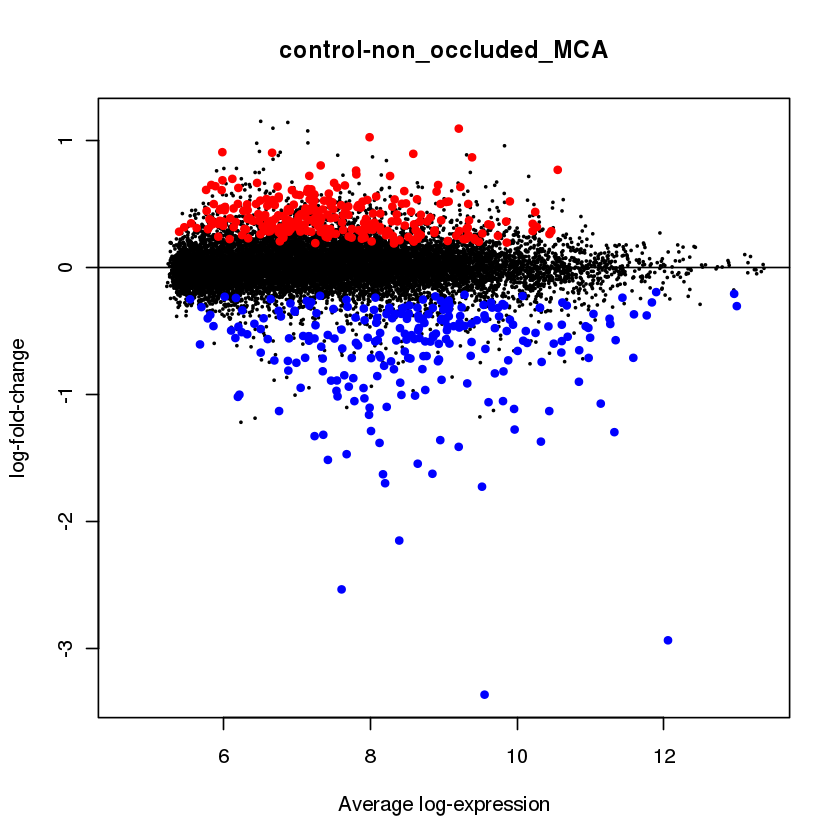

In [37]:
GSE162072_obj <- getDEG("GSE162072", "GPL17117", "00000011111122222", c("SPOT_ID","GB_ACC"), T,
                       c("control", "non_occluded_MCA", "occluded_MCA"))

#### Gene Expression Data analysis

##### box-and-whisker plots

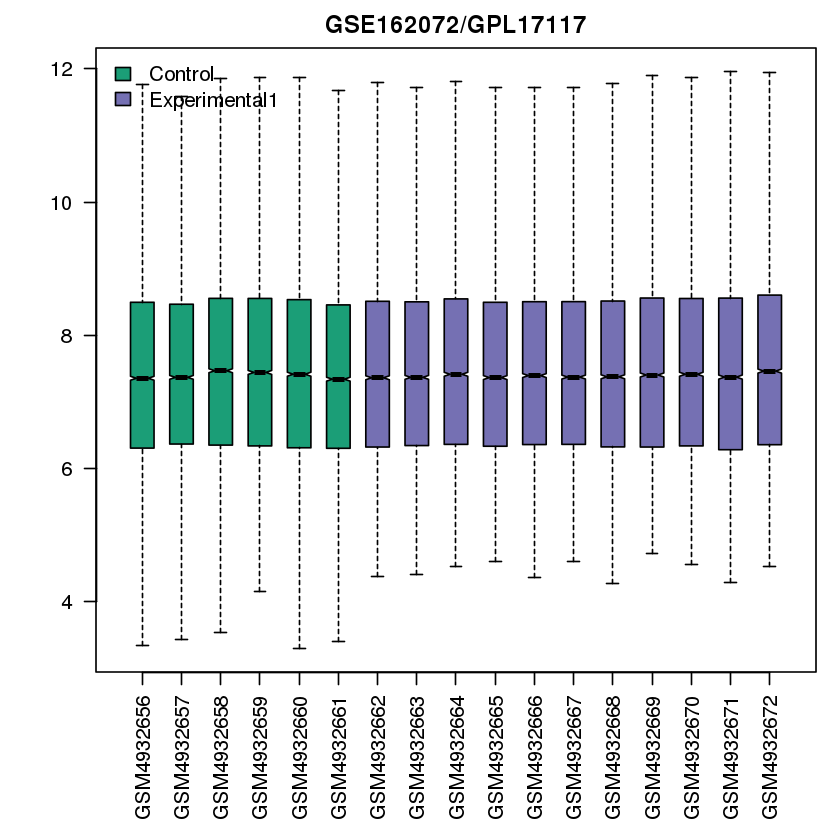

In [75]:
box_and_whisker_gset("GSE162072", GSE162072_obj$gset, GSE162072_obj$sampleGroups, GSE162072_obj$gsetExprs, F)

##### expression value distribution

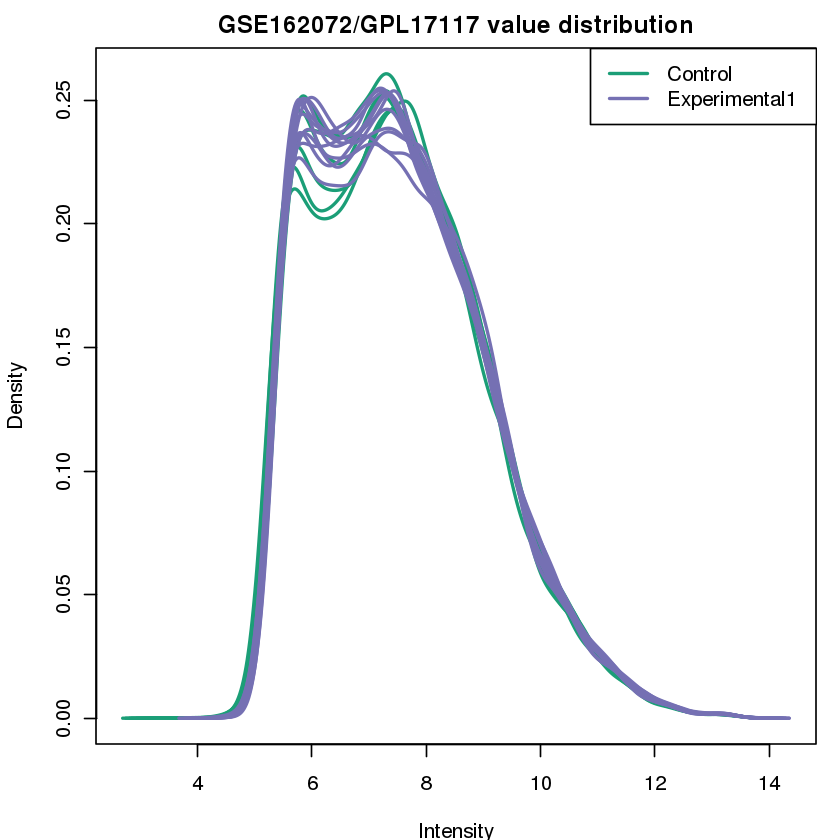

In [76]:
exp_val_dist_gset("GSE162072", GSE162072_obj$gset, GSE162072_obj$sampleGroups, GSE162072_obj$gsetExprs, F)

##### UMAP plot

Loading required package: sp


Attaching package: ‘sp’


The following object is masked from ‘package:IRanges’:

    %over%


Checking rgeos availability: TRUE



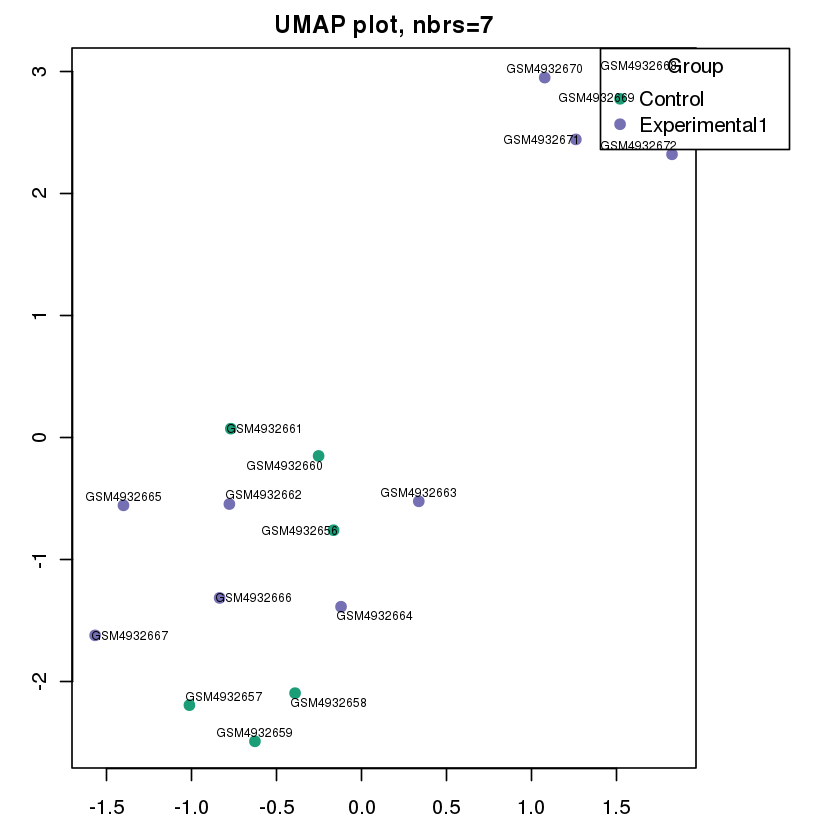

In [77]:
getUMAP_gset(GSE162072_obj$gsetExprs, 7, GSE162072_obj$sampleGroups,F)

##### mean-variance trend

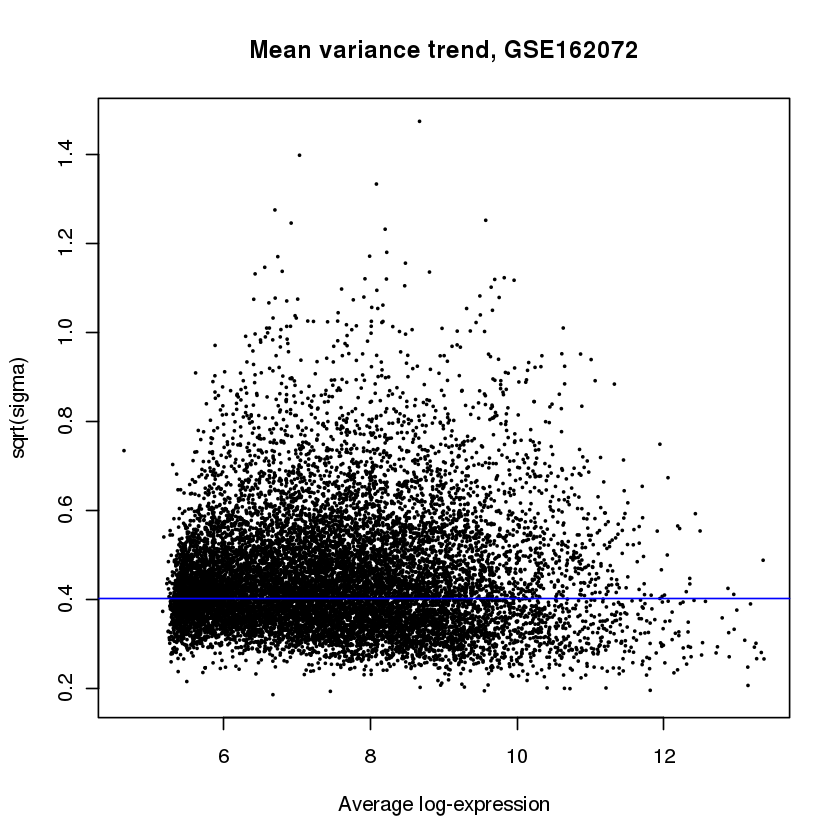

In [78]:
plotSA(GSE162072_obj$fit2, main=paste("Mean variance trend, ", "GSE162072", sep=""))

#### Extracting Human Orthologs of DEGs

In [38]:
names(GSE162072_obj$tT2)

[1] "ID"                            "probeset_id"                  
 [3] "seqname"                       "strand"                       
 [5] "start"                         "stop"                         
 [7] "total_probes"                  "gene_assignment"              
 [9] "mrna_assignment"               "swissprot"                    
[11] "unigene"                       "GO_biological_process"        
[13] "GO_cellular_component"         "GO_molecular_function"        
[15] "pathway"                       "protein_domains"              
[17] "crosshyb_type"                 "category"                     
[19] "SPOT_ID"                       "GB_ACC"                       
[21] "control.non_occluded_MCA"      "control.occluded_MCA"         
[23] "non_occluded_MCA.occluded_MCA" "AveExpr"                      
[25] "F"                             "P.Value"                      
[27] "adj.P.Val"

In [39]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE162072_obj$tT2), sep=" "))
transcriptToGene <- pData(featureData(GSE162072_obj$gset))
totalTranscripts <- transcriptToGene[as.character(GSE162072_obj$tT2$ID),]
GSE162072_avail_symbols <- totalTranscripts[totalTranscripts$SPOT_ID !=  "" &
                                                totalTranscripts$SPOT_ID !=  "no hit" ,]

GSE162072_transcript_id_to_ho_dict <- data.frame("transcriptGenes" = toupper(GSE162072_avail_symbols$SPOT_ID),
                                 "transcriptIDS" = GSE162072_avail_symbols$ID)

GSE162072_lfc_columns<- c('control.non_occluded_MCA', 'control.occluded_MCA')
GSE162072_lfc_genes <- filter_transcripts(GSE162072_obj, GSE162072_transcript_id_to_ho_dict,
                                         "rnorvegicus_wound_GGSE162072", rnorvegicus, "ensembl_transcript_id",
                                          "GSE162072", GSE162072_lfc_columns,
                                         pval=0.05, homology_confidence = F)

[1] "Total Transcripts: 13988"
[1] "Total rnorvegicus_wound_GGSE162072 transcripts with Available Human Orthologs: 2586"
[1] "Total rnorvegicus_wound_GGSE162072 transcripts with Available Human Ortholog Gene Symbols: 2404"
[1] "Total rnorvegicus_wound_GGSE162072 genes with Available Human Ortholog Gene Symbols and in Background gene sets: 2390"
[1] "Total transcripts after orthologous mapping and filtering: 2408"
[1] "Total significant transcripts after orthologous mapping and filtering: 1079"
[1] "################################"
[1] "control.non_occluded_MCA LogFC"
[1] "Total transcripts with negative logFC vals: 523"
[1] "Total transcripts with positive logFC vals: 607"
[1] "Total significant downregulated rnorvegicus_wound_GGSE162072 genes after orthologous mapping and filtering: 468"
[1] "Total significant upregulated rnorvegicus_wound_GGSE162072 genes after orthologous mapping and filtering: 556"
[1] "Total significant Final downregulated human othologs: 473"
[1] "Total signific

### GSE29588

#### Data Download and Normalization

Found 1 file(s)

GSE29588_series_matrix.txt.gz


── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_double(),
  ID_REF = col_character()
)
ℹ Use `spec()` for the full column specifications.


File stored at: 

/tmp/RtmpFkfKoa/GPL3533.annot.gz



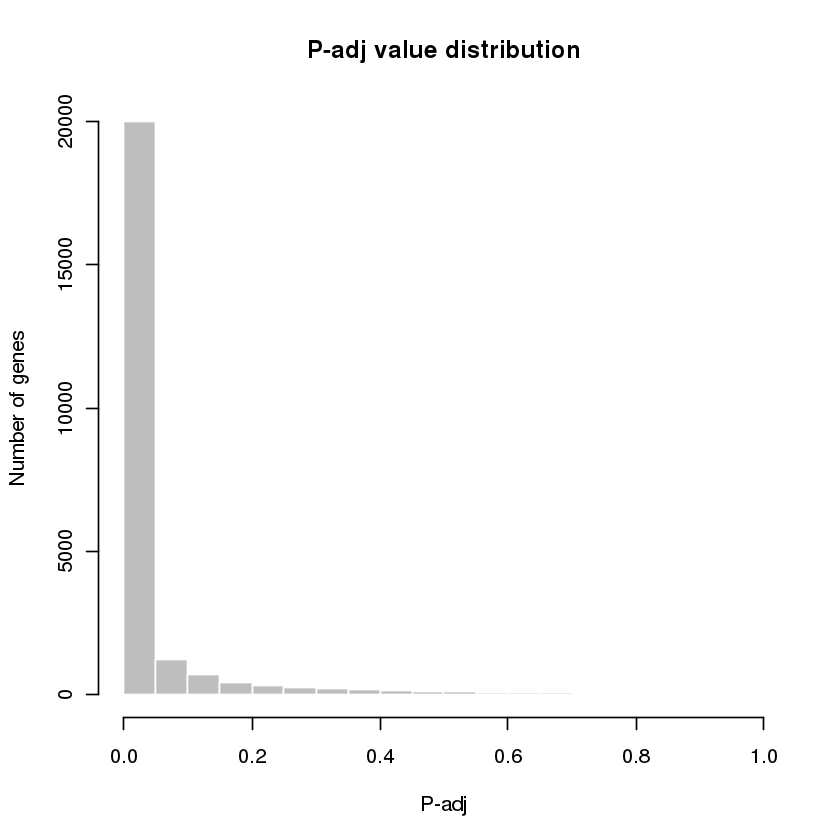

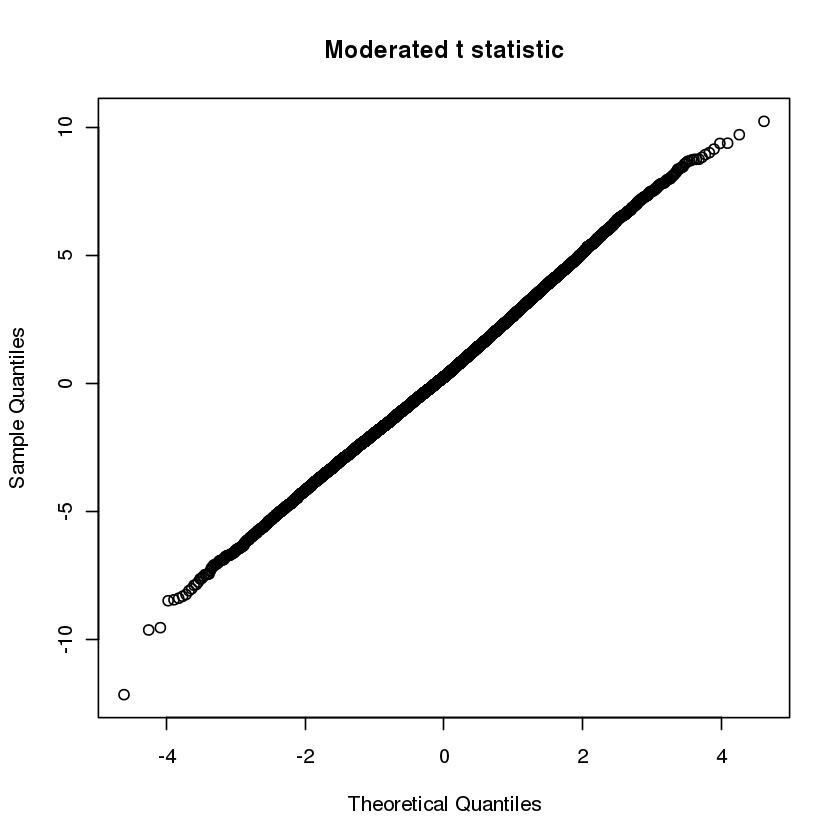

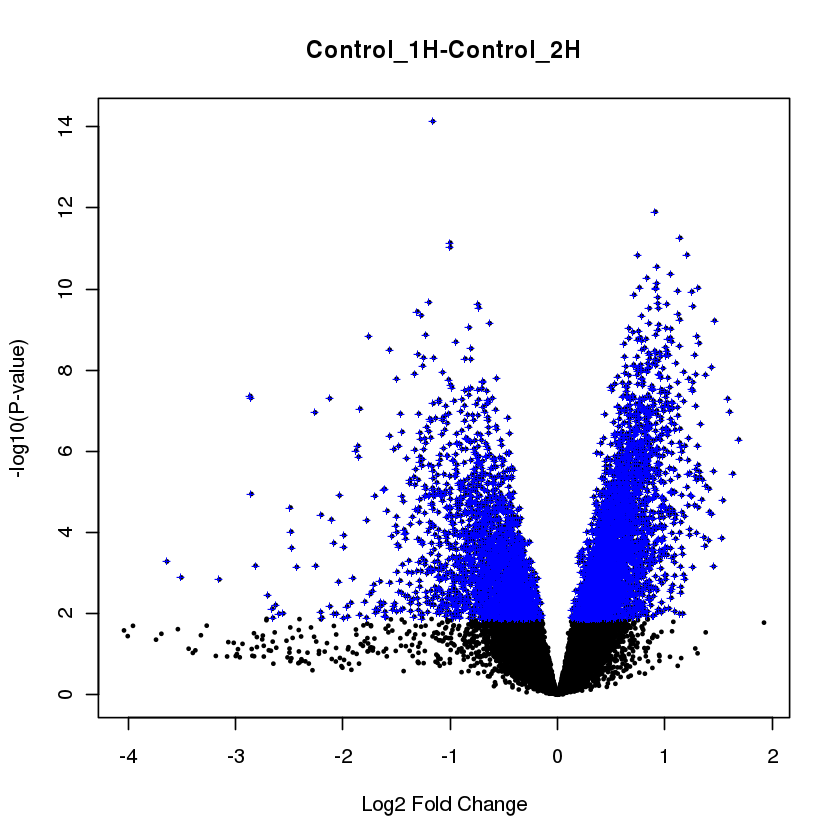

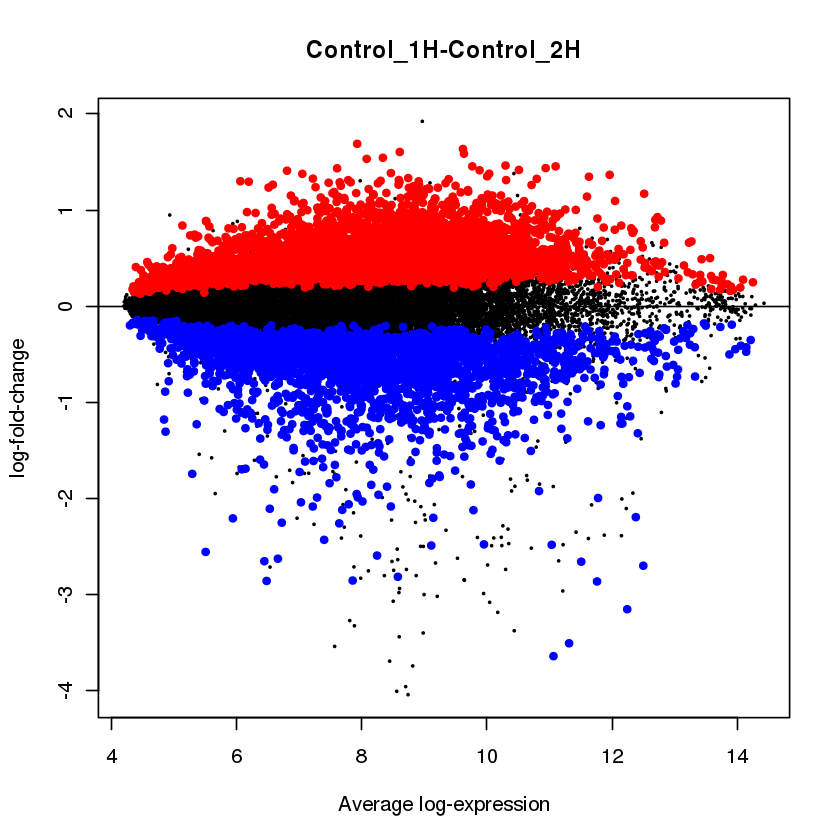

In [40]:
GSE29588_obj <- getDEG("GSE29588", "GPL3533", "F6F6F6O909090IC3C3C3LA1A1A1JG7G7G7PD4D4D4MB2B2B2KE5E5E5NH8H8H8Q",
                       c("Gene.symbol","Gene.title"), T,
                       c("Control_1H", "Control_2H", "Control_4H", "Control_24H", "Control_48H",
                         "Control_72H", "Control_168H", "Control_336H", "Control_514H",
                         "Sulfur_1H", "Sulfur_2H", "Sulfur_4H", "Sulfur_24H", "Sulfur_48H",
                         "Sulfur_72H", "Sulfur_168H", "Sulfur_336H", "Sulfur_514H",
                         "Sham_1H", "Sham_2H", "Sham_4H", "Sham_24H", "Sham_48H",
                         "Sham_72H", "Sham_168H", "Sham_336H", "Sham_514H"))

#### Gene Expression Data analysis

##### box-and-whisker plots

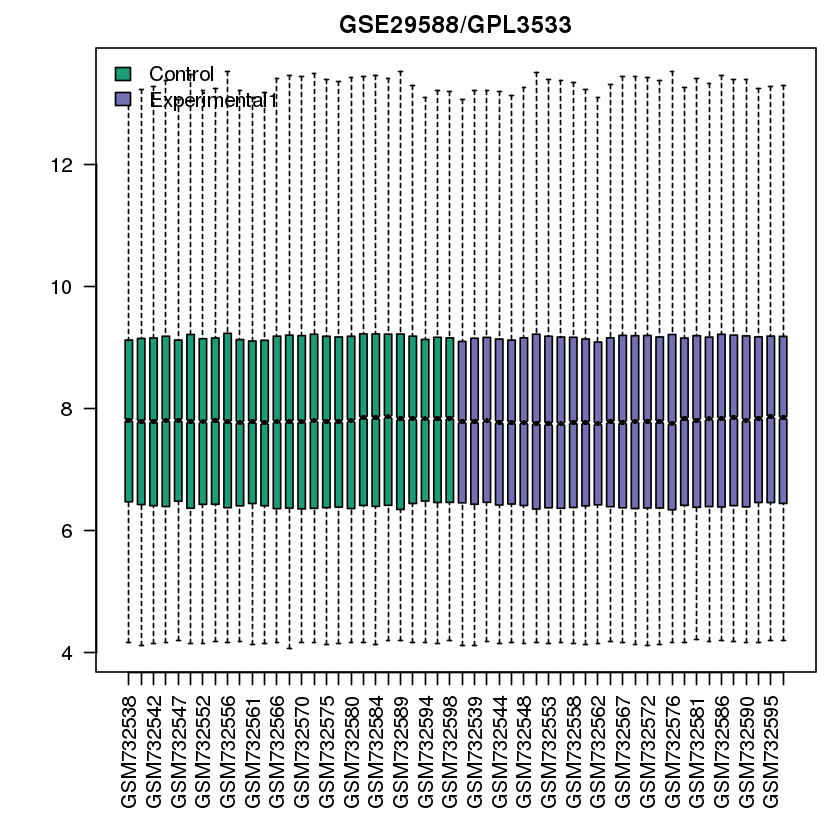

In [15]:
box_and_whisker_gset("GSE29588", GSE29588_obj$gset, GSE29588_obj$sampleGroups, GSE29588_obj$gsetExprs,T)

##### expression value distribution

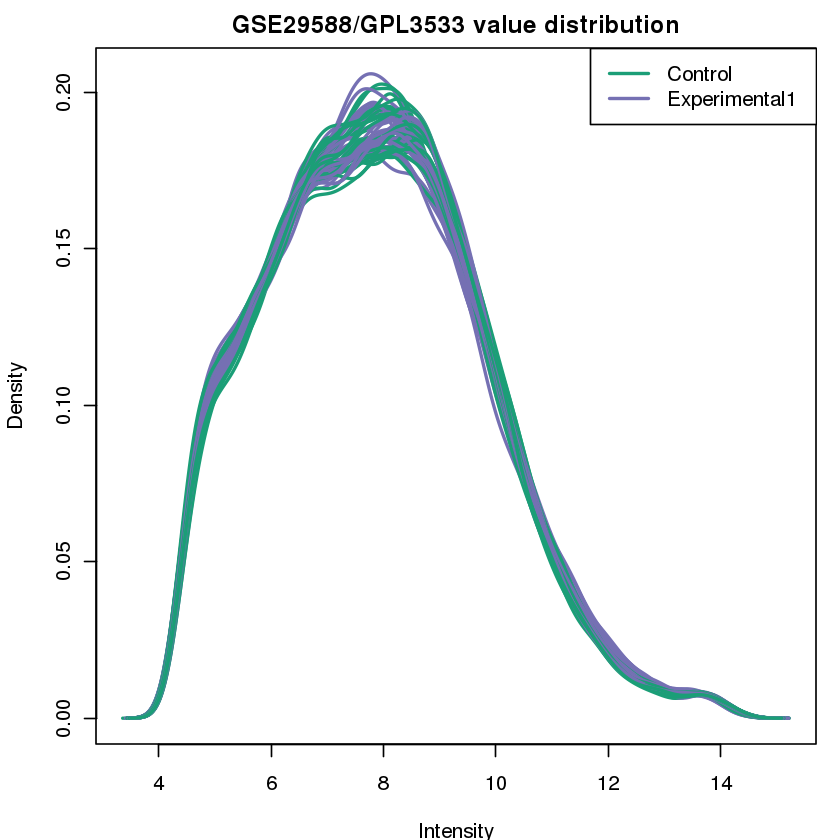

In [16]:
exp_val_dist_gset("GSE29588", GSE29588_obj$gset, GSE29588_obj$sampleGroups, GSE29588_obj$gsetExprs,T)

##### UMAP plot

Loading required package: sp


Attaching package: ‘sp’


The following object is masked from ‘package:IRanges’:

    %over%


Checking rgeos availability: TRUE



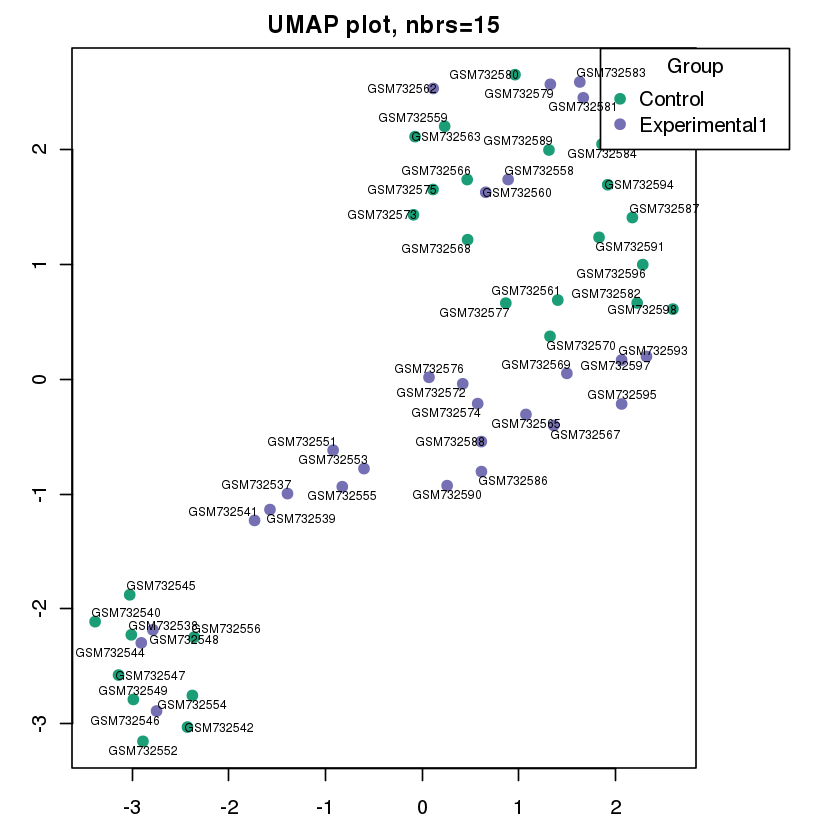

In [17]:
getUMAP_gset(GSE29588_obj$gsetExprs, 15, GSE29588_obj$sampleGroups,T)

##### mean-variance trend

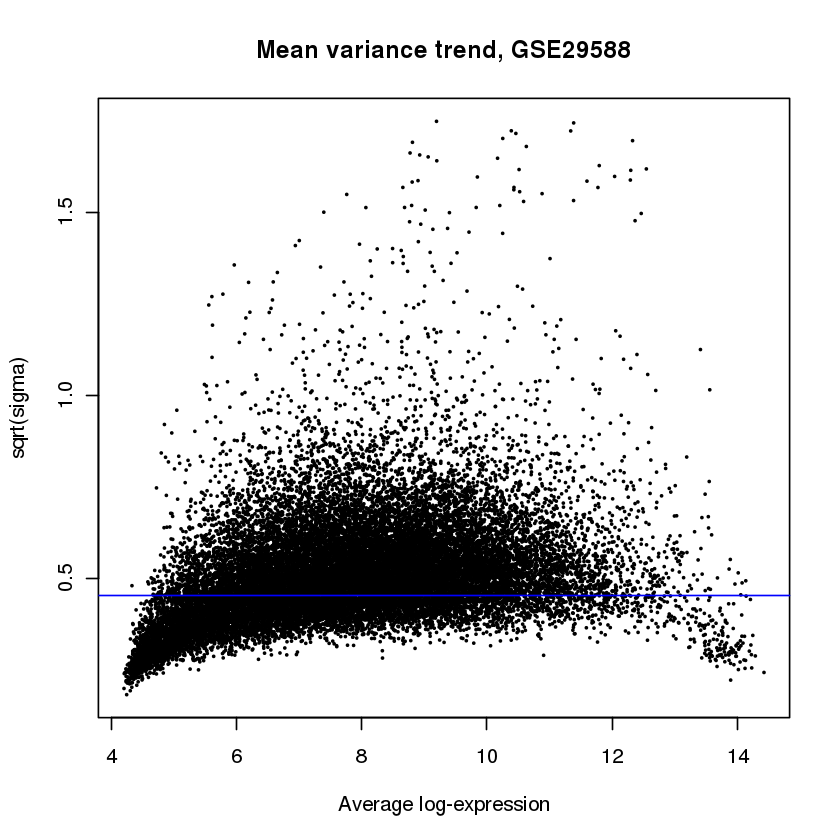

In [18]:
plotSA(GSE29588_obj$fit2, main=paste("Mean variance trend, ", "GSE29588", sep=""))

#### Extracting Human Orthologs of DEGs

In [41]:
names(GSE29588_obj$tT2)

[1] "ID"                        "Gene.title"               
  [3] "Gene.symbol"               "Gene.ID"                  
  [5] "UniGene.title"             "UniGene.symbol"           
  [7] "UniGene.ID"                "Nucleotide.Title"         
  [9] "GI"                        "GenBank.Accession"        
 [11] "Platform_CLONEID"          "Platform_ORF"             
 [13] "Platform_SPOTID"           "Chromosome.location"      
 [15] "Chromosome.annotation"     "GO.Function"              
 [17] "GO.Process"                "GO.Component"             
 [19] "GO.Function.ID"            "GO.Process.ID"            
 [21] "GO.Component.ID"           "Control_1H.Control_2H"    
 [23] "Control_1H.Control_4H"     "Control_1H.Control_24H"   
 [25] "Control_1H.Control_48H"    "Control_1H.Control_72H"   
 [27] "Control_1H.Control_168H"   "Control_1H.Control_336H"  
 [29] "Control_1H.Control_514H"   "Control_1H.Sulfur_1H"     
 [31] "Control_1H.Sulfur_2H"      "Control_1H.Sulfur_4H"     
 [33] "Control_1H.Sulfur_24H"     "Control_1H.Sulfur_48H"    
 [35] "Control_1H.Sulfur_72H"     "Control_1H.Sulfur_168H"   
 [37] "Control_1H.Sulfur_336H"    "Control_1H.Sulfur_514H"   
 [39] "Control_1H.Sham_1H"        "Control_1H.Sham_2H"       
 [41] "Control_1H.Sham_4H"        "Control_1H.Sham_24H"      
 [43] "Control_1H.Sham_48H"       "Control_1H.Sham_72H"      
 [45] "Control_1H.Sham_168H"      "Control_1H.Sham_336H"     
 [47] "Control_1H.Sham_514H"      "Control_2H.Control_4H"    
 [49] "Control_2H.Control_24H"    "Control_2H.Control_48H"   
 [51] "Control_2H.Control_72H"    "Control_2H.Control_168H"  
 [53] "Control_2H.Control_336H"   "Control_2H.Control_514H"  
 [55] "Control_2H.Sulfur_1H"      "Control_2H.Sulfur_2H"     
 [57] "Control_2H.Sulfur_4H"      "Control_2H.Sulfur_24H"    
 [59] "Control_2H.Sulfur_48H"     "Control_2H.Sulfur_72H"    
 [61] "Control_2H.Sulfur_168H"    "Control_2H.Sulfur_336H"   
 [63] "Control_2H.Sulfur_514H"    "Control_2H.Sham_1H"       
 [65] "Control_2H.Sham_2H"        "Control_2H.Sham_4H"       
 [67] "Control_2H.Sham_24H"       "Control_2H.Sham_48H"      
 [69] "Control_2H.Sham_72H"       "Control_2H.Sham_168H"     
 [71] "Control_2H.Sham_336H"      "Control_2H.Sham_514H"     
 [73] "Control_4H.Control_24H"    "Control_4H.Control_48H"   
 [75] "Control_4H.Control_72H"    "Control_4H.Control_168H"  
 [77] "Control_4H.Control_336H"   "Control_4H.Control_514H"  
 [79] "Control_4H.Sulfur_1H"      "Control_4H.Sulfur_2H"     
 [81] "Control_4H.Sulfur_4H"      "Control_4H.Sulfur_24H"    
 [83] "Control_4H.Sulfur_48H"     "Control_4H.Sulfur_72H"    
 [85] "Control_4H.Sulfur_168H"    "Control_4H.Sulfur_336H"   
 [87] "Control_4H.Sulfur_514H"    "Control_4H.Sham_1H"       
 [89] "Control_4H.Sham_2H"        "Control_4H.Sham_4H"       
 [91] "Control_4H.Sham_24H"       "Control_4H.Sham_48H"      
 [93] "Control_4H.Sham_72H"       "Control_4H.Sham_168H"     
 [95] "Control_4H.Sham_336H"      "Control_4H.Sham_514H"     
 [97] "Control_24H.Control_48H"   "Control_24H.Control_72H"  
 [99] "Control_24H.Control_168H"  "Control_24H.Control_336H" 
[101] "Control_24H.Control_514H"  "Control_24H.Sulfur_1H"    
[103] "Control_24H.Sulfur_2H"     "Control_24H.Sulfur_4H"    
[105] "Control_24H.Sulfur_24H"    "Control_24H.Sulfur_48H"   
[107] "Control_24H.Sulfur_72H"    "Control_24H.Sulfur_168H"  
[109] "Control_24H.Sulfur_336H"   "Control_24H.Sulfur_514H"  
[111] "Control_24H.Sham_1H"       "Control_24H.Sham_2H"      
[113] "Control_24H.Sham_4H"       "Control_24H.Sham_24H"     
[115] "Control_24H.Sham_48H"      "Control_24H.Sham_72H"     
[117] "Control_24H.Sham_168H"     "Control_24H.Sham_336H"    
[119] "Control_24H.Sham_514H"     "Control_48H.Control_72H"  
[121] "Control_48H.Control_168H"  "Control_48H.Control_336H" 
[123] "Control_48H.Control_514H"  "Control_48H.Sulfur_1H"    
[125] "Control_48H.Sulfur_2H"     "Control_48H.Sulfur_4H"    
[127] "Control_48H.Sulfur_24H"    "Control_48H.Sulfur_48H"   
[129] "Control_48H.Sulfur_72H"    

In [42]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE29588_obj$tT2), sep=" "))
transcriptToGene <- pData(featureData(GSE29588_obj$gset))
totalTranscripts <- transcriptToGene[as.character(GSE29588_obj$tT2$ID),]
GSE29588_avail_symbols <- totalTranscripts[totalTranscripts$Gene.symbol !=  "" &
                                                totalTranscripts$Gene.symbol !=  "no hit" ,]

GSE29588_transcript_id_to_ho_dict <- data.frame("transcriptGenes" = toupper(GSE29588_avail_symbols$Gene.symbol),
                                 "transcriptIDS" = GSE29588_avail_symbols$ID)

GSE29588_lfc_columns<- c('Control_1H.Control_2H','Control_1H.Control_4H','Control_1H.Control_24H',
                         'Control_1H.Control_48H','Control_1H.Control_72H','Control_1H.Control_168H',
                         'Control_1H.Control_336H','Control_1H.Control_514H',
                         'Sulfur_1H.Sulfur_2H','Sulfur_1H.Sulfur_4H','Sulfur_1H.Sulfur_24H',
                         'Sulfur_1H.Sulfur_48H','Sulfur_1H.Sulfur_72H','Sulfur_1H.Sulfur_168H',
                         'Sulfur_1H.Sulfur_336H','Sulfur_1H.Sulfur_514H',
                         'Sham_1H.Sham_2H','Sham_1H.Sham_4H','Sham_1H.Sham_24H',
                         'Sham_1H.Sham_48H','Sham_1H.Sham_72H','Sham_1H.Sham_168H',
                         'Sham_1H.Sham_336H','Sham_1H.Sham_514H',
                         'Control_1H.Sulfur_1H','Control_1H.Sham_1H','Sulfur_1H.Sham_1H',
                         'Control_2H.Sulfur_2H','Control_2H.Sham_2H','Sulfur_2H.Sham_2H',
                         'Control_4H.Sulfur_4H','Control_4H.Sham_4H','Sulfur_4H.Sham_4H',
                         'Control_24H.Sulfur_24H','Control_24H.Sham_24H','Sulfur_24H.Sham_24H',
                         'Control_48H.Sulfur_48H','Control_48H.Sham_48H','Sulfur_48H.Sham_48H',
                         'Control_72H.Sulfur_72H','Control_72H.Sham_72H','Sulfur_72H.Sham_72H',
                         'Control_168H.Sulfur_168H','Control_168H.Sham_168H','Sulfur_168H.Sham_168H',
                         'Control_336H.Sulfur_336H','Control_336H.Sham_336H','Sulfur_336H.Sham_336H',
                         'Control_514H.Sulfur_514H','Control_514H.Sham_514H','Sulfur_514H.Sham_514H'
                        )

GSE29588_lfc_genes <- filter_transcripts(GSE29588_obj, GSE29588_transcript_id_to_ho_dict,
                                         "sscrofa_wound_GSE29588", sscrofa, "external_gene_name",
                                          "GSE29588", GSE29588_lfc_columns,
                                         pval=0.05, homology_confidence = F)

[1] "Total Transcripts: 24123"
[1] "Total sscrofa_wound_GSE29588 transcripts with Available Human Orthologs: 5305"
[1] "Total sscrofa_wound_GSE29588 transcripts with Available Human Ortholog Gene Symbols: 5220"
[1] "Total sscrofa_wound_GSE29588 genes with Available Human Ortholog Gene Symbols and in Background gene sets: 5218"
[1] "Total transcripts after orthologous mapping and filtering: 7844"
[1] "Total significant transcripts after orthologous mapping and filtering: 6715"
[1] "################################"
[1] "Control_1H.Control_2H LogFC"
[1] "Total transcripts with negative logFC vals: 2794"
[1] "Total transcripts with positive logFC vals: 3921"
[1] "Total significant downregulated sscrofa_wound_GSE29588 genes after orthologous mapping and filtering: 2255"
[1] "Total significant upregulated sscrofa_wound_GSE29588 genes after orthologous mapping and filtering: 3074"
[1] "Total significant Final downregulated human othologs: 2266"
[1] "Total significant Final upregulated human 

### GSE119519

#### Data Download and Normalization

Found 1 file(s)

GSE119519_series_matrix.txt.gz


── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_double()
)
ℹ Use `spec()` for the full column specifications.


Warning message in download.file(myurl, destfile, mode = mode, quiet = TRUE, method = getOption("download.file.method.GEOquery")):
“cannot open URL 'https://ftp.ncbi.nlm.nih.gov/geo/platforms/GPL18nnn/GPL18699/annot/GPL18699.annot.gz': HTTP status was '404 Not Found'”
Annotation GPL not available, so will use submitter GPL instead

File stored at: 

/tmp/RtmpFkfKoa/GPL18699.soft

Warning message:
“6510 parsing failures.
  row           col expected actual         file
25389 start         a double    --- literal data
25389 stop          a double    --- literal data
25389 crosshyb_type a double    --- literal data
25390 start         a double    --- literal data
25390 stop          a double    --- literal data
..... ..........

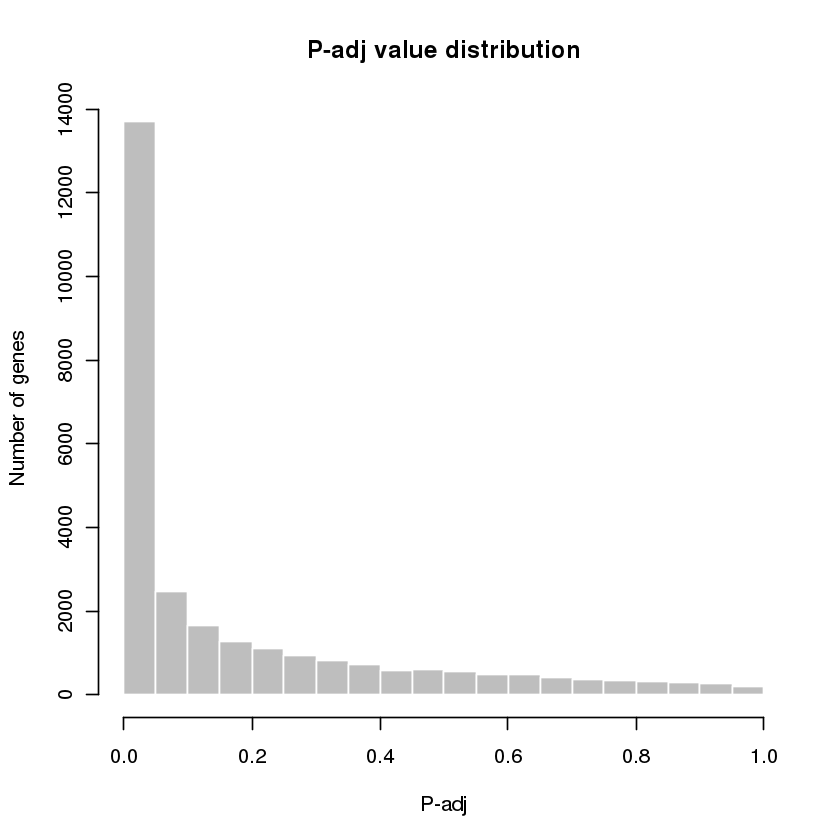

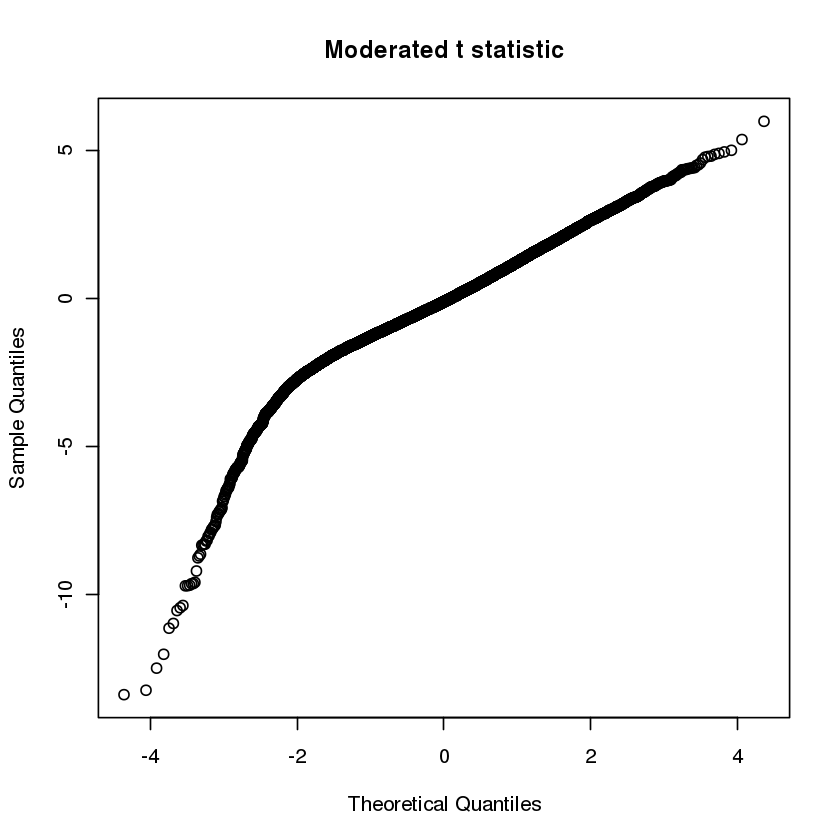

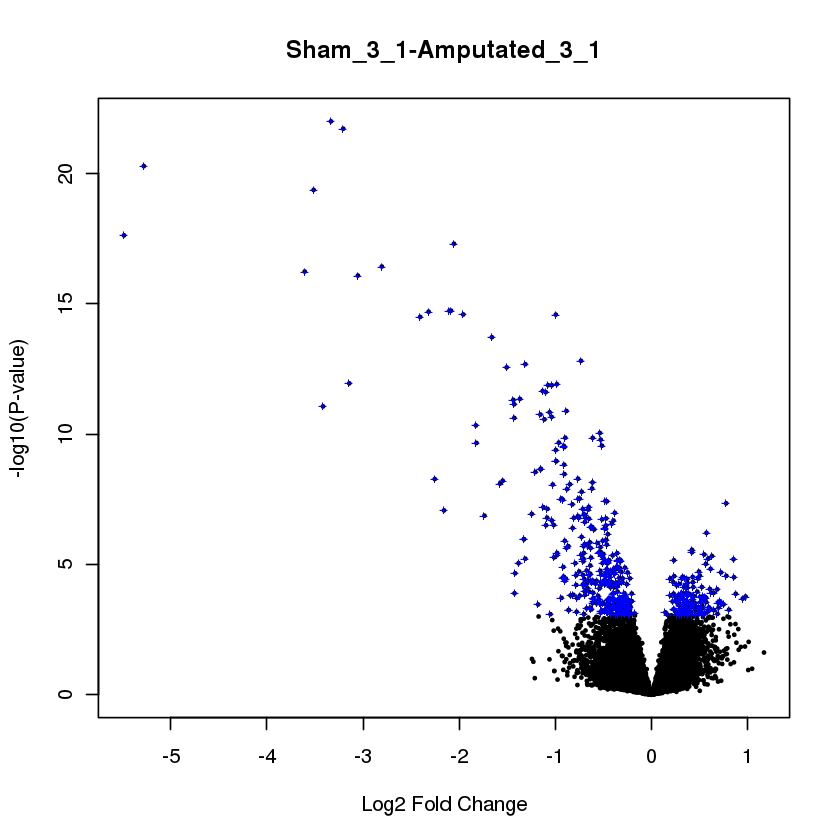

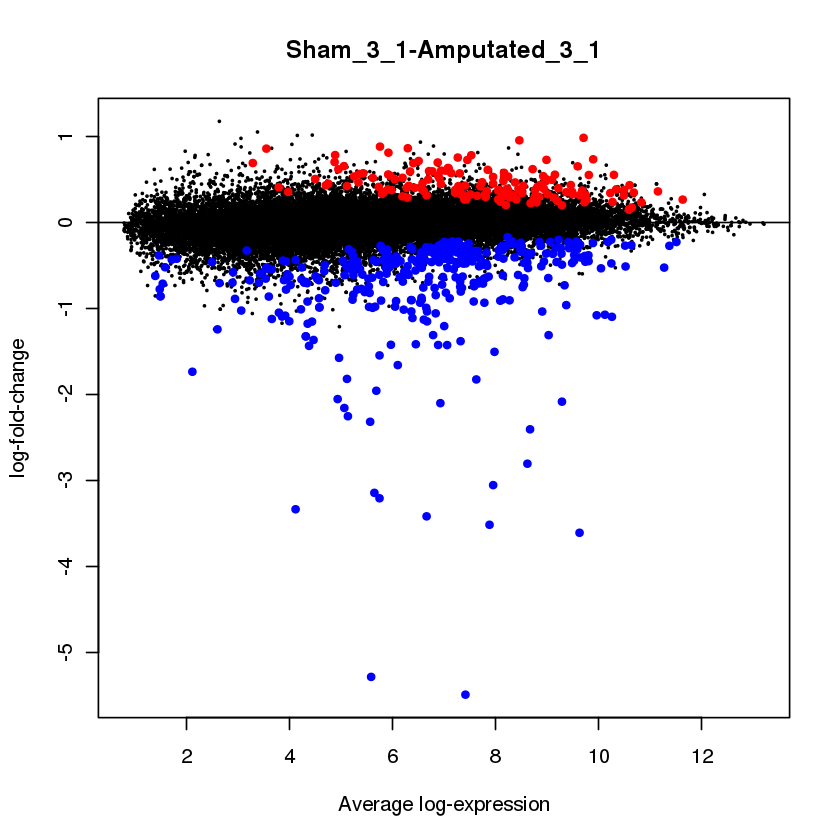

In [43]:
GSE119519_obj <- getDEG("GSE119519", "GPL18699", paste0("00000000111111112222222233333333444444445555555777",
                                                        "77777666666668888888899999999BBBBBBBBAAAAAAAA"),
                        c("SPOT_ID"), T,
                        c("Sham_3_1","Amputated_3_1","Sham_3_8","Amputated_3_8","Sham_3_16","Amputated_3_16",
                          "Sham_63_1","Amputated_63_1","Sham_63_8","Amputated_63_8","Sham_63_16","Amputated_63_16"))

#### Gene Expression Data analysis

##### box-and-whisker plots

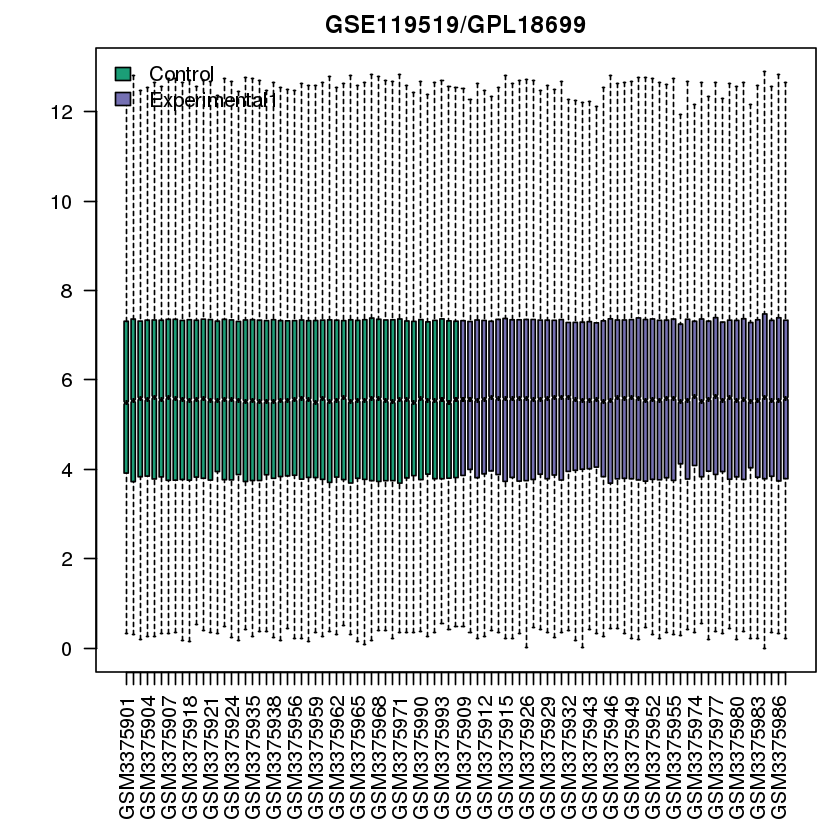

In [47]:
box_and_whisker_gset("GSE119519", GSE119519_obj$gset, GSE119519_obj$sampleGroups, GSE119519_obj$gsetExprs,F)

##### expression value distribution

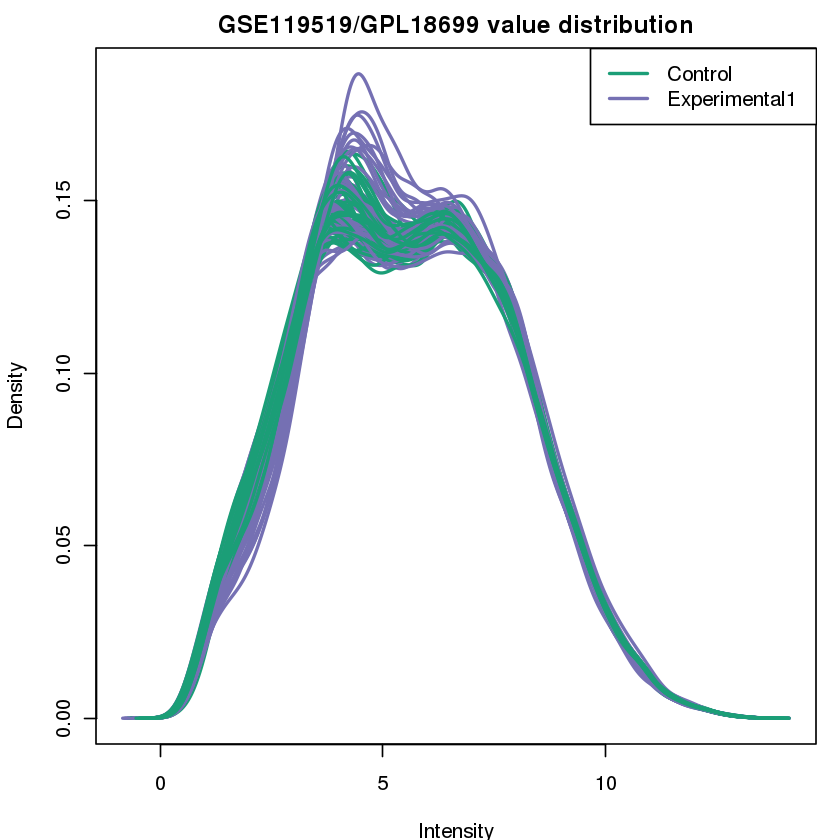

In [48]:
exp_val_dist_gset("GSE119519", GSE119519_obj$gset, GSE119519_obj$sampleGroups, GSE119519_obj$gsetExprs,F)

##### UMAP plot

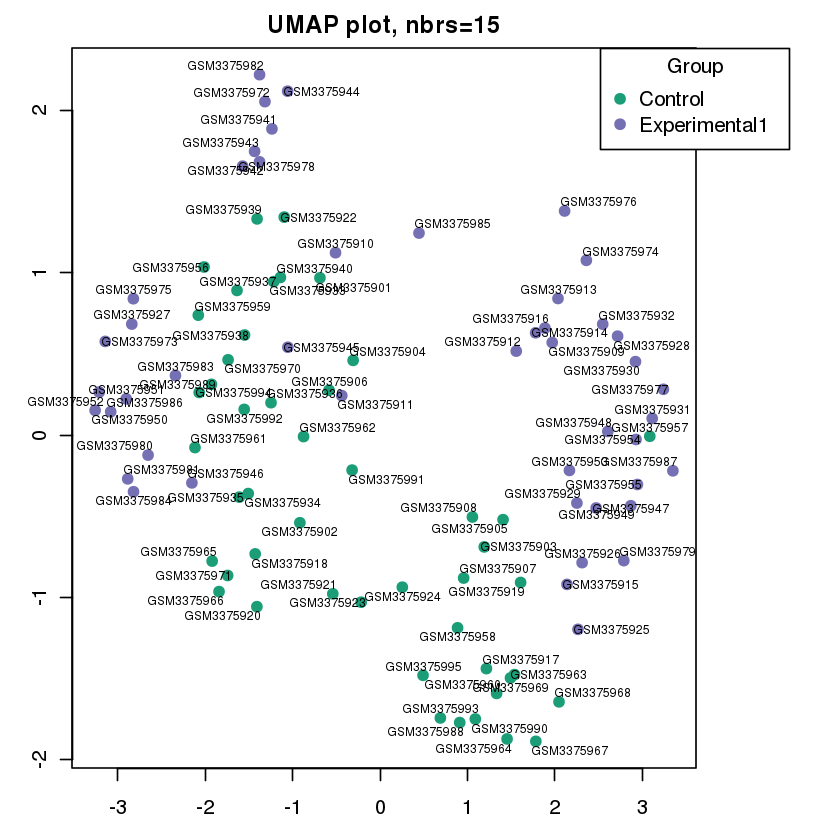

In [49]:
getUMAP_gset(GSE119519_obj$gsetExprs, 15, GSE119519_obj$sampleGroups,F)

##### mean-variance trend

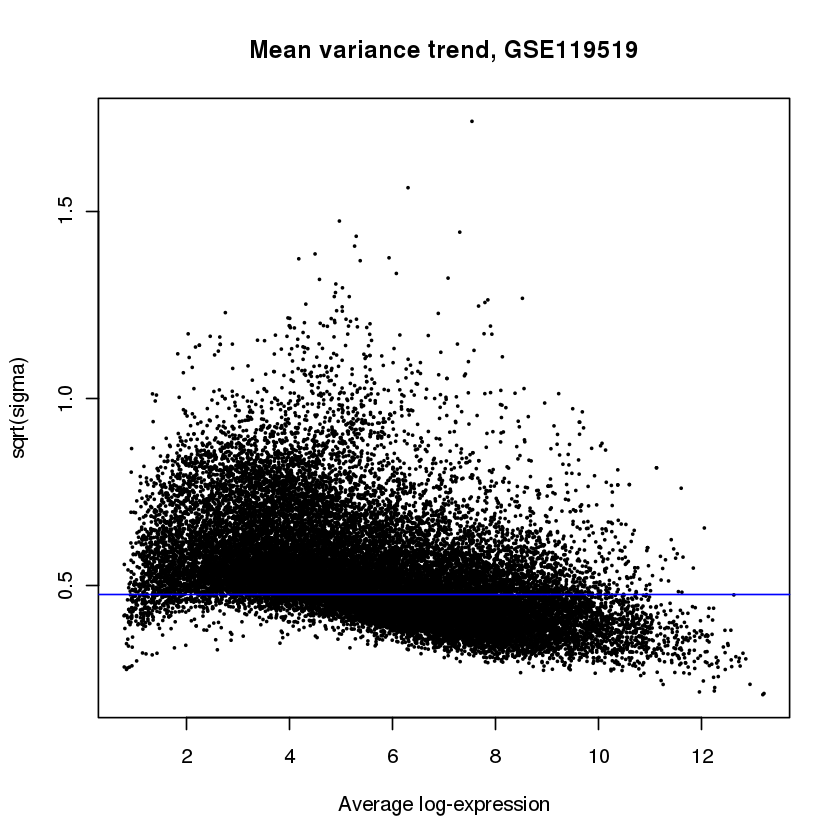

In [50]:
plotSA(GSE119519_obj$fit2, main=paste("Mean variance trend, ", "GSE119519", sep=""))

#### Extracting Human Orthologs of DEGs

In [86]:
names(GSE119519_obj$tT2)

[1] "ID"                             "probeset_id"                   
 [3] "SPOT_ID"                        "seqname"                       
 [5] "strand"                         "start"                         
 [7] "stop"                           "total_probes"                  
 [9] "gene_assignment"                "mrna_assignment"               
[11] "swissprot"                      "unigene"                       
[13] "GO_biological_process"          "GO_cellular_component"         
[15] "GO_molecular_function"          "protein_domains"               
[17] "crosshyb_type"                  "category"                      
[19] "Sham_3_1.Amputated_3_1"         "Sham_3_1.Sham_3_8"             
[21] "Sham_3_1.Amputated_3_8"         "Sham_3_1.Sham_3_16"            
[23] "Sham_3_1.Amputated_3_16"        "Sham_3_1.Sham_63_1"            
[25] "Sham_3_1.Amputated_63_1"        "Sham_3_1.Sham_63_8"            
[27] "Sham_3_1.Amputated_63_8"        "Sham_3_1.Sham_63_16"           
[29] "Sham_3_1.Amputated_63_16"       "Amputated_3_1.Sham_3_8"        
[31] "Amputated_3_1.Amputated_3_8"    "Amputated_3_1.Sham_3_16"       
[33] "Amputated_3_1.Amputated_3_16"   "Amputated_3_1.Sham_63_1"       
[35] "Amputated_3_1.Amputated_63_1"   "Amputated_3_1.Sham_63_8"       
[37] "Amputated_3_1.Amputated_63_8"   "Amputated_3_1.Sham_63_16"      
[39] "Amputated_3_1.Amputated_63_16"  "Sham_3_8.Amputated_3_8"        
[41] "Sham_3_8.Sham_3_16"             "Sham_3_8.Amputated_3_16"       
[43] "Sham_3_8.Sham_63_1"             "Sham_3_8.Amputated_63_1"       
[45] "Sham_3_8.Sham_63_8"             "Sham_3_8.Amputated_63_8"       
[47] "Sham_3_8.Sham_63_16"            "Sham_3_8.Amputated_63_16"      
[49] "Amputated_3_8.Sham_3_16"        "Amputated_3_8.Amputated_3_16"  
[51] "Amputated_3_8.Sham_63_1"        "Amputated_3_8.Amputated_63_1"  
[53] "Amputated_3_8.Sham_63_8"        "Amputated_3_8.Amputated_63_8"  
[55] "Amputated_3_8.Sham_63_16"       "Amputated_3_8.Amputated_63_16" 
[57] "Sham_3_16.Amputated_3_16"       "Sham_3_16.Sham_63_1"           
[59] "Sham_3_16.Amputated_63_1"       "Sham_3_16.Sham_63_8"           
[61] "Sham_3_16.Amputated_63_8"       "Sham_3_16.Sham_63_16"          
[63] "Sham_3_16.Amputated_63_16"      "Amputated_3_16.Sham_63_1"      
[65] "Amputated_3_16.Amputated_63_1"  "Amputated_3_16.Sham_63_8"      
[67] "Amputated_3_16.Amputated_63_8"  "Amputated_3_16.Sham_63_16"     
[69] "Amputated_3_16.Amputated_63_16" "Sham_63_1.Amputated_63_1"      
[71] "Sham_63_1.Sham_63_8"            "Sham_63_1.Amputated_63_8"      
[73] "Sham_63_1.Sham_63_16"           "Sham_63_1.Amputated_63_16"     
[75] "Amputated_63_1.Sham_63_8"       "Amputated_63_1.Amputated_63_8" 
[77] "Amputated_63_1.Sham_63_16"      "Amputated_63_1.Amputated_63_16"
[79] "Sham_63_8.Amputated_63_8"       "Sham_63_8.Sham_63_16"          
[81] "Sham_63_8.Amputated_63_16"      "Amputated_63_8.Sham_63_16"     
[83] "Amputated_63_8.Amputated_63_16" "Sham_63_16.Amputated_63_16"    
[85] "AveExpr"                        "F"                             
[87] "P.Value"                        "adj.P.Val"

In [44]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE119519_obj$tT2), sep=" "))
transcriptToGene <- pData(featureData(GSE119519_obj$gset))
totalTranscripts <- transcriptToGene[as.character(GSE119519_obj$tT2$ID),]

viable_transcripts <- 0
viable_transcripts_ids <- character(0)
total_transcript_genes <- character(0)
for(i in 1:nrow(totalTranscripts)) {
    
    current_string <- totalTranscripts$'gene_assignment'[i]
    if(length(current_string) == 1 & current_string == "---") {next}
    
    unlist1 <- unlist(strsplit(current_string, "/// "))
    unlist2 <- unlist(strsplit(unlist1, " //"))
    ensemblIDs <- unlist2[str_detect(unlist2, "ENSSSCT")]
    
    if(is.null(ensemblIDs)) {next}
    if(length(ensemblIDs) < 1) {next}
    viable_transcripts <- viable_transcripts+1
    viable_transcripts_ids <- append(viable_transcripts_ids, rep(totalTranscripts$ID[i],
                                                                 length(ensemblIDs)), length(viable_transcripts_ids))
    total_transcript_genes <- append(total_transcript_genes, ensemblIDs, length(total_transcript_genes))
}

transcript_id_dict <- data.frame("transcriptGenes" = total_transcript_genes, "transcriptIDS" = viable_transcripts_ids)

print(paste("Total transcripts with an associated pig gene:", viable_transcripts, sep=" "))
print(paste("Total associated pig genes:", length(total_transcript_genes), sep=" "))

GSE119519_lfc_columns<- c('Sham_3_1.Sham_3_8','Sham_3_1.Sham_3_16','Sham_3_8.Sham_3_16', 
                          'Amputated_3_1.Amputated_3_8', 'Amputated_3_1.Amputated_3_16','Amputated_3_8.Amputated_3_16',
                          'Sham_3_1.Amputated_3_1','Sham_3_8.Amputated_3_8','Sham_3_16.Amputated_3_16', 
                          'Sham_3_1.Sham_63_1','Sham_3_8.Sham_63_8','Sham_3_16.Sham_63_16',
                          'Amputated_3_1.Amputated_63_1', 'Amputated_3_8.Amputated_63_8', 'Amputated_3_16.Amputated_63_16',
                          'Sham_63_1.Sham_63_8','Sham_63_1.Sham_63_16','Sham_63_8.Sham_63_16', 
                          'Amputated_63_1.Amputated_63_8', 'Amputated_63_1.Amputated_63_16','Amputated_63_8.Amputated_63_16',
                          'Sham_63_1.Amputated_63_1','Sham_63_8.Amputated_63_8','Sham_63_16.Amputated_63_16')

GSE119519_lfc_genes <- filter_transcripts(GSE119519_obj, transcript_id_dict, "sscrofa_wound_GSE119519",
                                          sscrofa, "ensembl_transcript_id", "GSE119519", GSE119519_lfc_columns,
                                          pval=0.05, homology_confidence = F)

[1] "Total Transcripts: 27558"
[1] "Total transcripts with an associated pig gene: 9781"
[1] "Total associated pig genes: 14604"
[1] "Total sscrofa_wound_GSE119519 transcripts with Available Human Orthologs: 6881"
[1] "Total sscrofa_wound_GSE119519 transcripts with Available Human Ortholog Gene Symbols: 6504"
[1] "Total sscrofa_wound_GSE119519 genes with Available Human Ortholog Gene Symbols and in Background gene sets: 6444"
[1] "Total transcripts after orthologous mapping and filtering: 6391"
[1] "Total significant transcripts after orthologous mapping and filtering: 3776"
[1] "################################"
[1] "Sham_3_1.Sham_3_8 LogFC"
[1] "Total transcripts with negative logFC vals: 1835"
[1] "Total transcripts with positive logFC vals: 1941"
[1] "Total significant downregulated sscrofa_wound_GSE119519 genes after orthologous mapping and filtering: 2388"
[1] "Total significant upregulated sscrofa_wound_GSE119519 genes after orthologous mapping and filtering: 2496"
[1] "Total si

### GSE158155

#### Data Download and Normalization

Found 1 file(s)

GSE158155_series_matrix.txt.gz


── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_double(),
  ID_REF = col_character()
)
ℹ Use `spec()` for the full column specifications.


Warning message in download.file(myurl, destfile, mode = mode, quiet = TRUE, method = getOption("download.file.method.GEOquery")):
“cannot open URL 'https://ftp.ncbi.nlm.nih.gov/geo/platforms/GPL16nnn/GPL16571/annot/GPL16571.annot.gz': HTTP status was '404 Not Found'”
Annotation GPL not available, so will use submitter GPL instead

File stored at: 

/tmp/RtmpFkfKoa/GPL16571.soft

Warning message:
“60 parsing failures.
  row          col           expected actual         file
43554 CONTROL_TYPE 1/0/T/F/TRUE/FALSE    pos literal data
43555 CONTROL_TYPE 1/0/T/F/TRUE/FALSE    pos literal data
43556 CONTROL_TYPE 1/0/T/F/TRUE/FALSE    pos literal data
43557 CONTROL_TYPE 1/0/T/F/TRUE/FALSE    pos literal

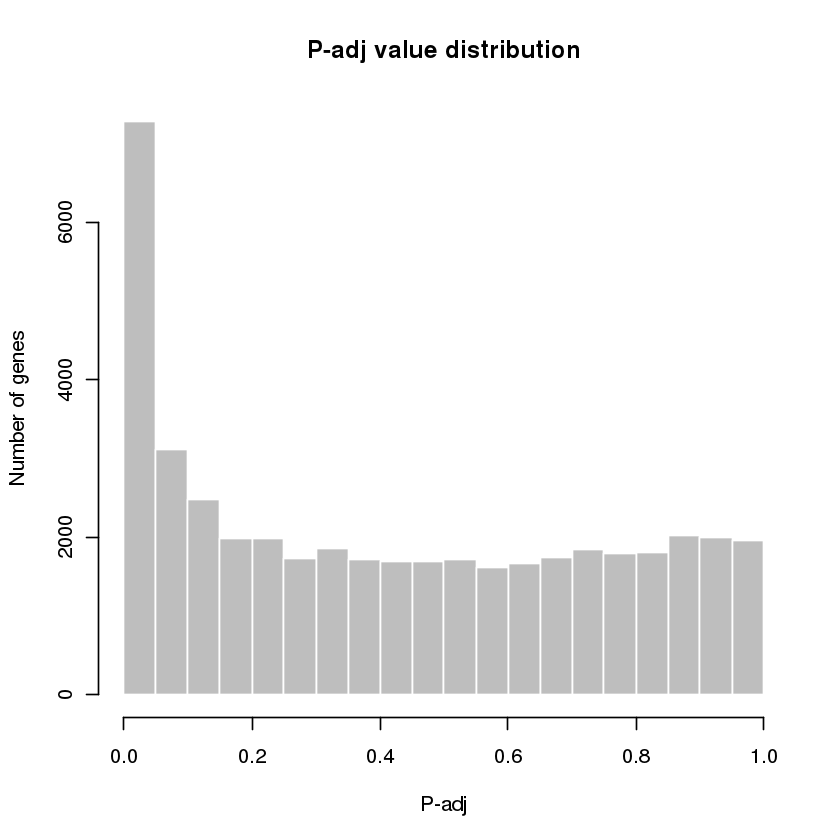

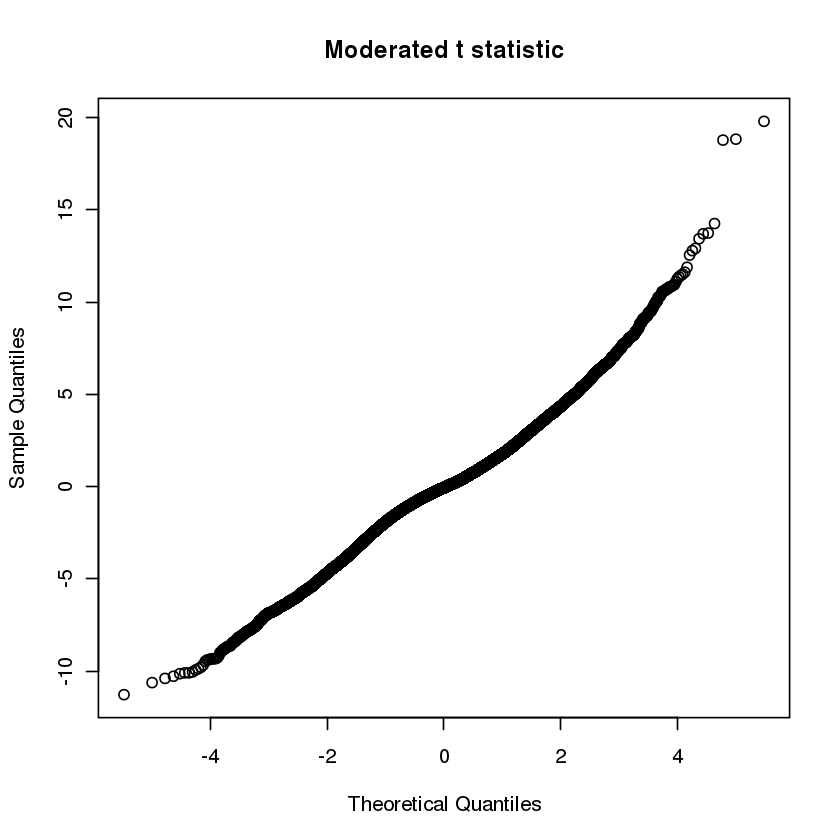

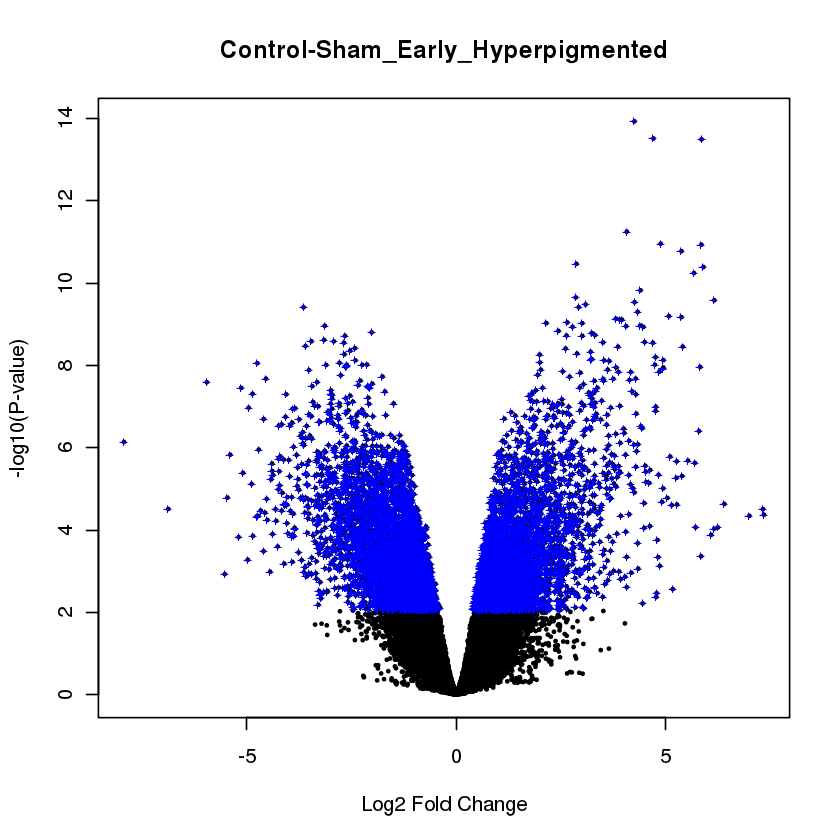

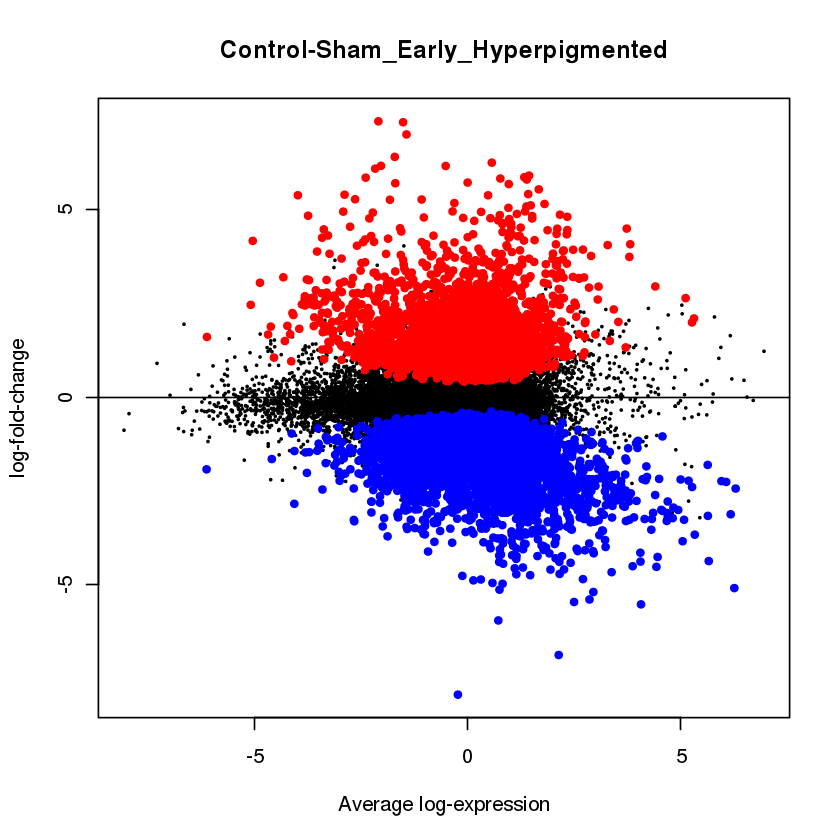

In [45]:
GSE158155_obj <- getDEG("GSE158155", "GPL16571", "000011114444727258853939A66A", c("SPOT_ID","GB_ACC","SEQUENCE"), T,
                       c("Control","Sham_Early_Hyperpigmented","Sham_Mid_Hyperpigmented",
                         "Sham_Late_Hyperpigmented","Sham_Early_Hypopigmented","Sham_Mid_Hypopigmented",
                         "Sham_Late_Hypopigmented","Exp_Mid_Hyperpigmented","Exp_Mid_Hypopigmented",
                         "Exp_Late_Hyperpigmented","Exp_Late_Hypopigmented"))


#### Gene Expression Data analysis

##### box-and-whisker plots

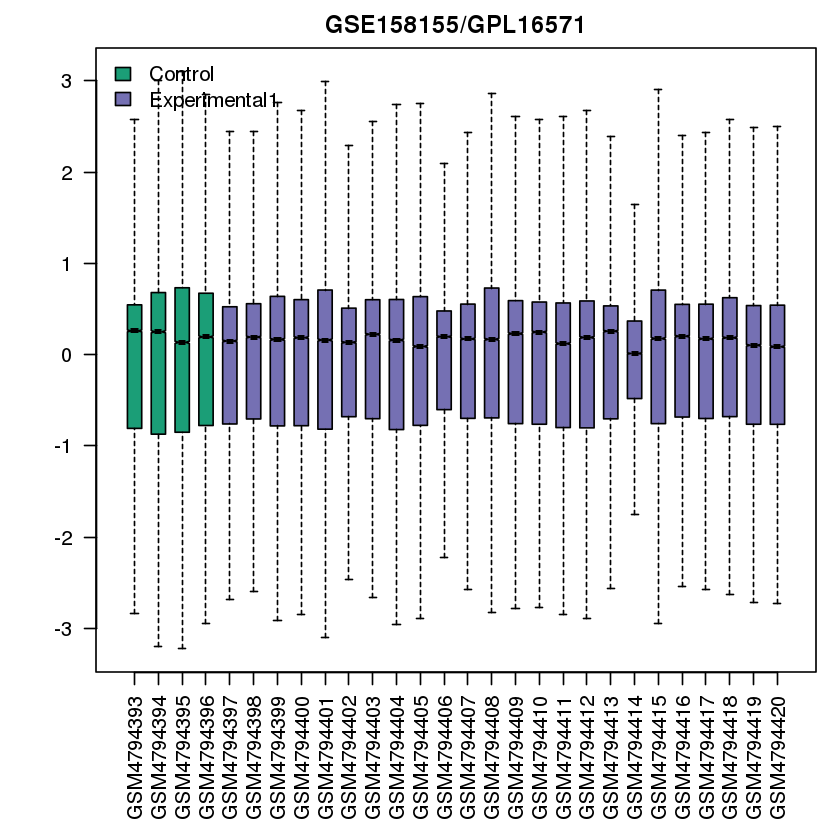

In [35]:
box_and_whisker_gset("GSE158155", GSE158155_obj$gset, GSE158155_obj$sampleGroups, GSE158155_obj$gsetExprs, F)

##### expression value distribution

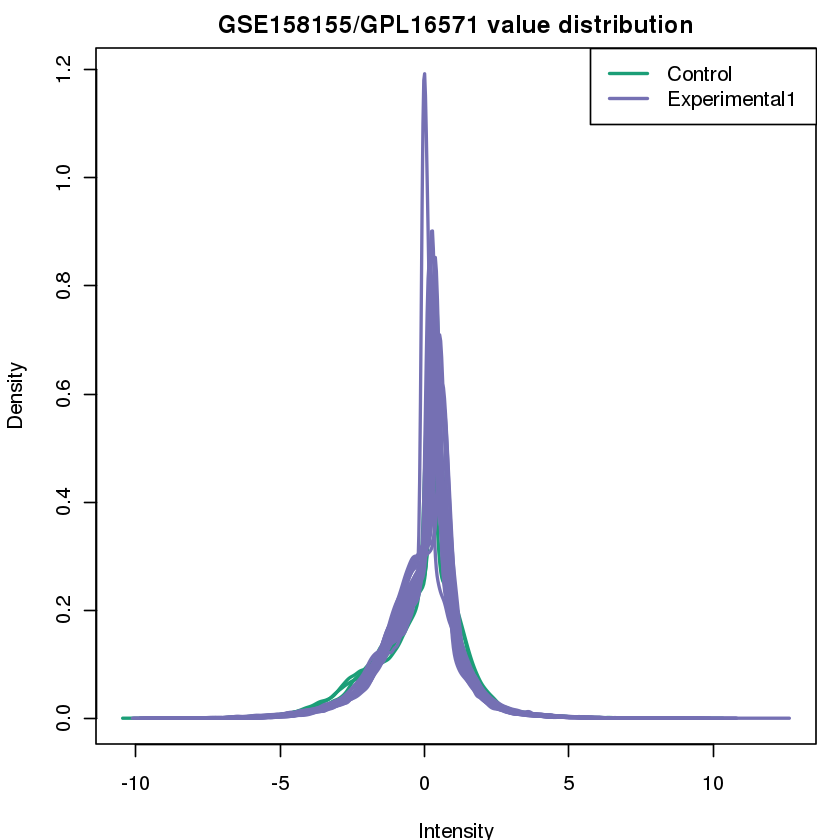

In [36]:
exp_val_dist_gset("GSE158155", GSE158155_obj$gset, GSE158155_obj$sampleGroups, GSE158155_obj$gsetExprs, F)

##### UMAP plot

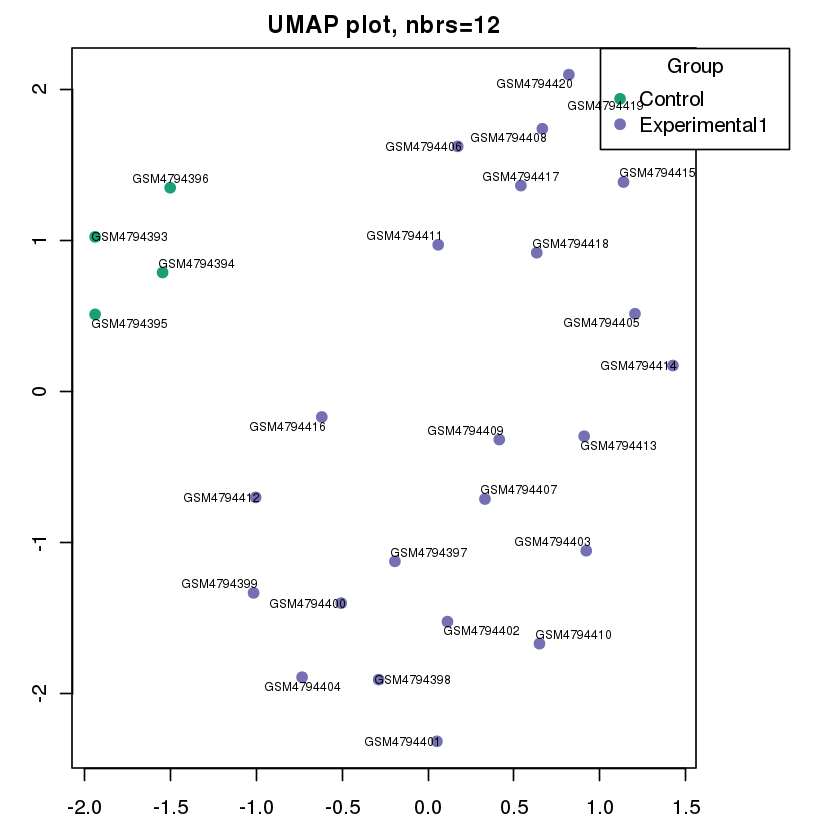

In [37]:
getUMAP_gset(GSE158155_obj$gsetExprs, 12, GSE158155_obj$sampleGroups,F)

##### mean-variance trend

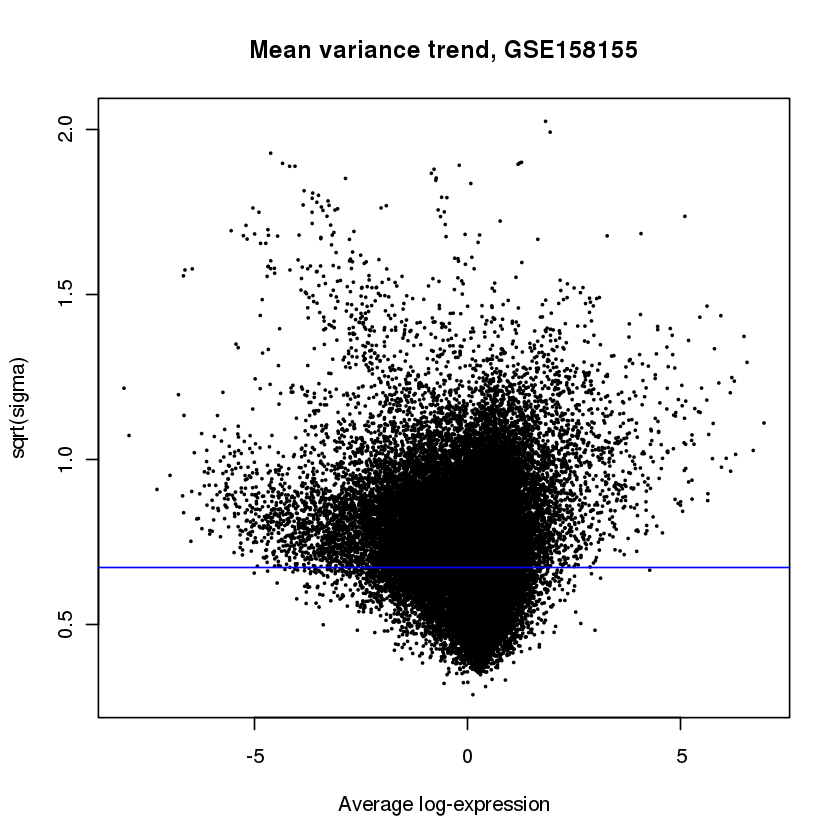

In [38]:
plotSA(GSE158155_obj$fit2, main=paste("Mean variance trend, ", "GSE158155", sep=""))

#### Extracting Human Orthologs of DEGs

In [46]:
names(GSE158155_obj$tT2)

[1] "ID"                                                
 [2] "SPOT_ID"                                           
 [3] "CONTROL_TYPE"                                      
 [4] "REFSEQ"                                            
 [5] "GB_ACC"                                            
 [6] "LOCUSLINK_ID"                                      
 [7] "GENE_SYMBOL"                                       
 [8] "GENE_NAME"                                         
 [9] "UNIGENE_ID"                                        
[10] "ENSEMBL_ID"                                        
[11] "ACCESSION_STRING"                                  
[12] "CHROMOSOMAL_LOCATION"                              
[13] "DESCRIPTION"                                       
[14] "GO_ID"                                             
[15] "SEQUENCE"                                          
[16] "Control.Sham_Early_Hyperpigmented"                 
[17] "Control.Sham_Mid_Hyperpigmented"                   
[18] "Control.Sham_Late_Hyperpigmented"                  
[19] "Control.Sham_Early_Hypopigmented"                  
[20] "Control.Sham_Mid_Hypopigmented"                    
[21] "Control.Sham_Late_Hypopigmented"                   
[22] "Control.Exp_Mid_Hyperpigmented"                    
[23] "Control.Exp_Mid_Hypopigmented"                     
[24] "Control.Exp_Late_Hyperpigmented"                   
[25] "Control.Exp_Late_Hypopigmented"                    
[26] "Sham_Early_Hyperpigmented.Sham_Mid_Hyperpigmented" 
[27] "Sham_Early_Hyperpigmented.Sham_Late_Hyperpigmented"
[28] "Sham_Early_Hyperpigmented.Sham_Early_Hypopigmented"
[29] "Sham_Early_Hyperpigmented.Sham_Mid_Hypopigmented"  
[30] "Sham_Early_Hyperpigmented.Sham_Late_Hypopigmented" 
[31] "Sham_Early_Hyperpigmented.Exp_Mid_Hyperpigmented"  
[32] "Sham_Early_Hyperpigmented.Exp_Mid_Hypopigmented"   
[33] "Sham_Early_Hyperpigmented.Exp_Late_Hyperpigmented" 
[34] "Sham_Early_Hyperpigmented.Exp_Late_Hypopigmented"  
[35] "Sham_Mid_Hyperpigmented.Sham_Late_Hyperpigmented"  
[36] "Sham_Mid_Hyperpigmented.Sham_Early_Hypopigmented"  
[37] "Sham_Mid_Hyperpigmented.Sham_Mid_Hypopigmented"    
[38] "Sham_Mid_Hyperpigmented.Sham_Late_Hypopigmented"   
[39] "Sham_Mid_Hyperpigmented.Exp_Mid_Hyperpigmented"    
[40] "Sham_Mid_Hyperpigmented.Exp_Mid_Hypopigmented"     
[41] "Sham_Mid_Hyperpigmented.Exp_Late_Hyperpigmented"   
[42] "Sham_Mid_Hyperpigmented.Exp_Late_Hypopigmented"    
[43] "Sham_Late_Hyperpigmented.Sham_Early_Hypopigmented" 
[44] "Sham_Late_Hyperpigmented.Sham_Mid_Hypopigmented"   
[45] "Sham_Late_Hyperpigmented.Sham_Late_Hypopigmented"  
[46] "Sham_Late_Hyperpigmented.Exp_Mid_Hyperpigmented"   
[47] "Sham_Late_Hyperpigmented.Exp_Mid_Hypopigmented"    
[48] "Sham_Late_Hyperpigmented.Exp_Late_Hyperpigmented"  
[49] "Sham_Late_Hyperpigmented.Exp_Late_Hypopigmented"   
[50] "Sham_Early_Hypopigmented.Sham_Mid_Hypopigmented"   
[51] "Sham_Early_Hypopigmented.Sham_Late_Hypopigmented"  
[52] "Sham_Early_Hypopigmented.Exp_Mid_Hyperpigmented"   
[53] "Sham_Early_Hypopigmented.Exp_Mid_Hypopigmented"    
[54] "Sham_Early_Hypopigmented.Exp_Late_Hyperpigmented"  
[55] "Sham_Early_Hypopigmented.Exp_Late_Hypopigmented"   
[56] "Sham_Mid_Hypopigmented.Sham_Late_Hypopigmented"    
[57] "Sham_Mid_Hypopigmented.Exp_Mid_Hyperpigmented"     
[58] "Sham_Mid_Hypopigmented.Exp_Mid_Hypopigmented"      
[59] "Sham_Mid_Hypopigmented.Exp_Late_Hyperpigmented"    
[60] "Sham_Mid_Hypopigmented.Exp_Late_Hypopigmented"     
[61] "Sham_Late_Hypopigmented.Exp_Mid_Hyperpigmented"    
[62] "Sham_Late_Hypopigmented.Exp_Mid_Hypopigmented"     
[63] "Sham_Late_Hypopigmented.Exp_Late_Hyperpigmented"   
[64] "Sham_Late_Hypopigmented.Exp_Late_Hypopigmented"    
[65] "Exp_Mid_Hyperpigmented.Exp_Mid_Hypopigmented"      
[66] "Exp_Mid_Hyperpigmented.Exp_Late_Hyperpigmented"    
[67] "Exp_Mid_Hyperpigmented.Exp_Late_Hypopigmented"     
[68] "Exp_Mid_Hypopigmented.Exp_Late_Hyperpigmented"     
[69] "Exp_Mid_Hypopigmented.Exp_Late_Hypopigmented"      

In [47]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE158155_obj$tT2), sep=" "))
transcriptToGene <- pData(featureData(GSE158155_obj$gset))
totalTranscripts <- transcriptToGene[as.character(GSE158155_obj$tT2$ID),]

GSE158155_avail_symbols <- totalTranscripts[totalTranscripts$GENE_SYMBOL !=  "" &
                                                totalTranscripts$GENE_SYMBOL !=  "no hit" ,]

GSE158155_transcript_id_to_ho_dict <- data.frame("transcriptGenes" = toupper(GSE158155_avail_symbols$GENE_SYMBOL),
                                 "transcriptIDS" = GSE158155_avail_symbols$ID)
GSE158155_lfc_columns<- c('Control.Sham_Early_Hyperpigmented','Control.Sham_Mid_Hyperpigmented','Control.Sham_Late_Hyperpigmented',
                          'Control.Sham_Early_Hypopigmented','Control.Sham_Mid_Hypopigmented','Control.Sham_Late_Hypopigmented',
                          'Control.Exp_Mid_Hyperpigmented','Control.Exp_Mid_Hypopigmented','Control.Exp_Late_Hyperpigmented',
                          'Control.Exp_Late_Hypopigmented', 'Sham_Early_Hyperpigmented.Sham_Mid_Hyperpigmented',
                          'Sham_Early_Hyperpigmented.Sham_Late_Hyperpigmented', 'Sham_Mid_Hyperpigmented.Sham_Late_Hyperpigmented',
                          'Sham_Early_Hypopigmented.Sham_Late_Hypopigmented', 'Sham_Mid_Hypopigmented.Sham_Late_Hypopigmented',
                          'Sham_Early_Hypopigmented.Sham_Mid_Hypopigmented', 'Sham_Early_Hypopigmented.Sham_Late_Hypopigmented',
                          'Sham_Mid_Hyperpigmented.Exp_Mid_Hyperpigmented', 'Sham_Late_Hyperpigmented.Exp_Late_Hyperpigmented',
                          'Exp_Mid_Hyperpigmented.Exp_Late_Hyperpigmented','Exp_Mid_Hypopigmented.Exp_Late_Hypopigmented',
                          'Exp_Mid_Hyperpigmented.Exp_Mid_Hypopigmented','Exp_Late_Hyperpigmented.Exp_Late_Hypopigmented')

GSE158155_lfc_genes <- filter_transcripts(GSE158155_obj, GSE158155_transcript_id_to_ho_dict,
                                         "sscrofa_wound_GSE158155", sscrofa, "external_gene_name",
                                          "GSE158155", GSE158155_lfc_columns,
                                          pval=0.05, homology_confidence = F)

[1] "Total Transcripts: 43663"
[1] "Total sscrofa_wound_GSE158155 transcripts with Available Human Orthologs: 3732"
[1] "Total sscrofa_wound_GSE158155 transcripts with Available Human Ortholog Gene Symbols: 3643"
[1] "Total sscrofa_wound_GSE158155 genes with Available Human Ortholog Gene Symbols and in Background gene sets: 3642"
[1] "Total transcripts after orthologous mapping and filtering: 8359"
[1] "Total significant transcripts after orthologous mapping and filtering: 1785"
[1] "################################"
[1] "Control.Sham_Early_Hyperpigmented LogFC"
[1] "Total transcripts with negative logFC vals: 839"
[1] "Total transcripts with positive logFC vals: 946"
[1] "Total significant downregulated sscrofa_wound_GSE158155 genes after orthologous mapping and filtering: 560"
[1] "Total significant upregulated sscrofa_wound_GSE158155 genes after orthologous mapping and filtering: 561"
[1] "Total significant Final downregulated human othologs: 563"
[1] "Total significant Final upregu

# Stress Response

## Expression Data

### GSE57788 - Dmelanogaster - KC167

#### Data Download and Normalization

Found 1 file(s)

GSE57788_series_matrix.txt.gz


── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_double(),
  ID_REF = col_character()
)
ℹ Use `spec()` for the full column specifications.


File stored at: 

/lscratch/37313631/RtmpWEw5mL/GPL1322.annot.gz



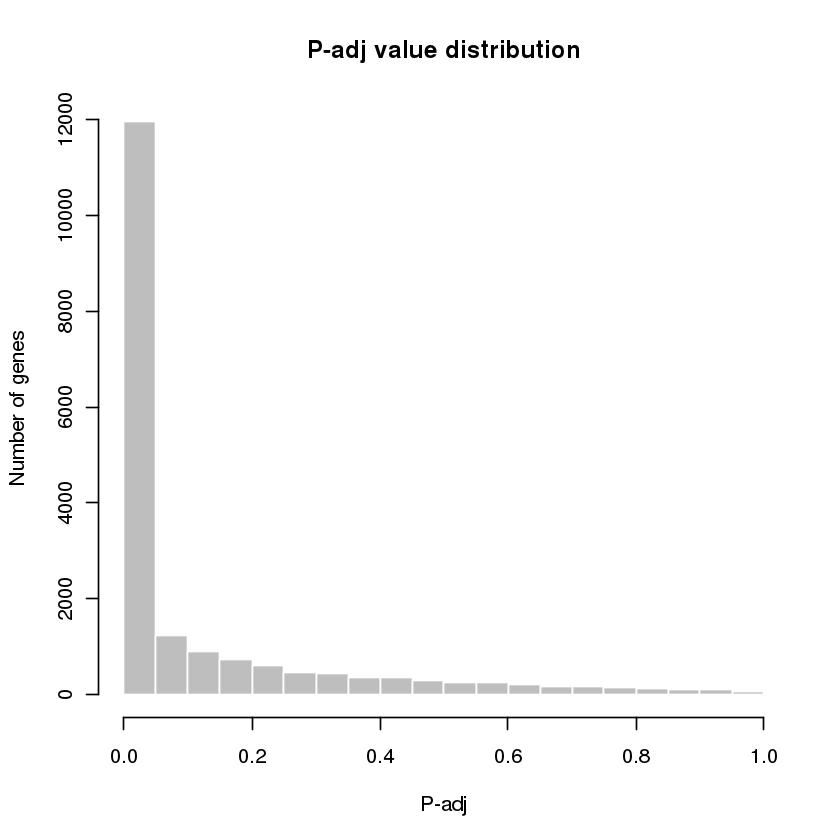

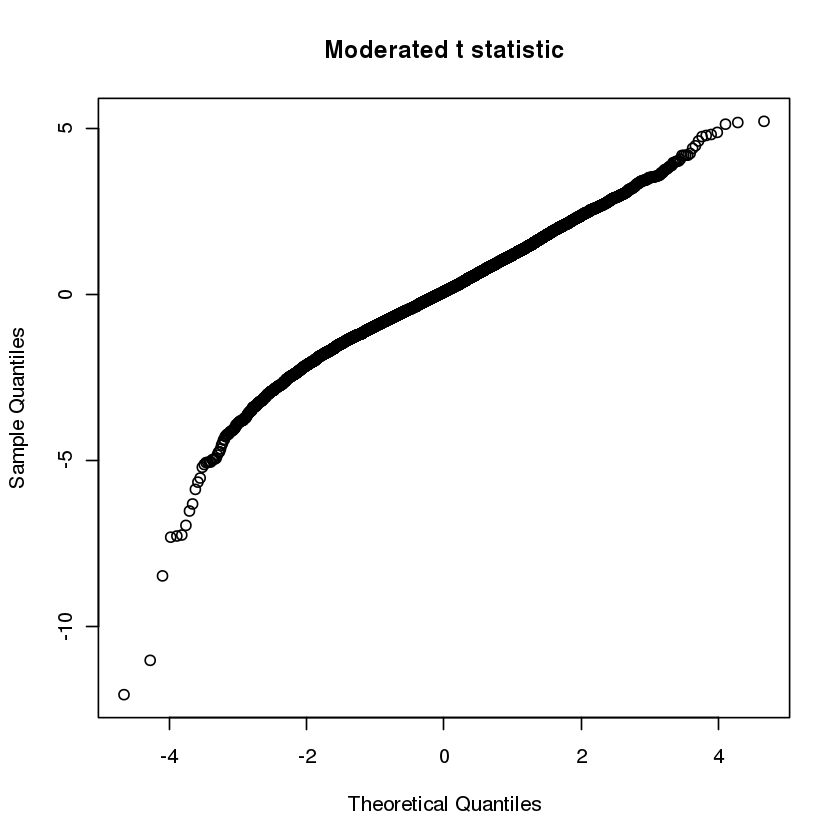

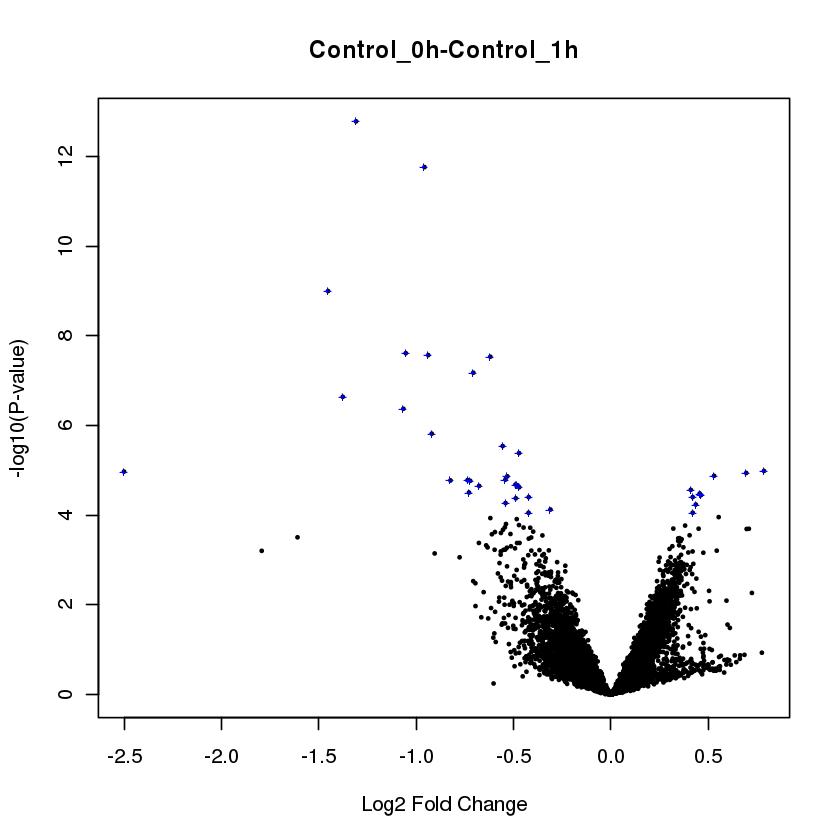

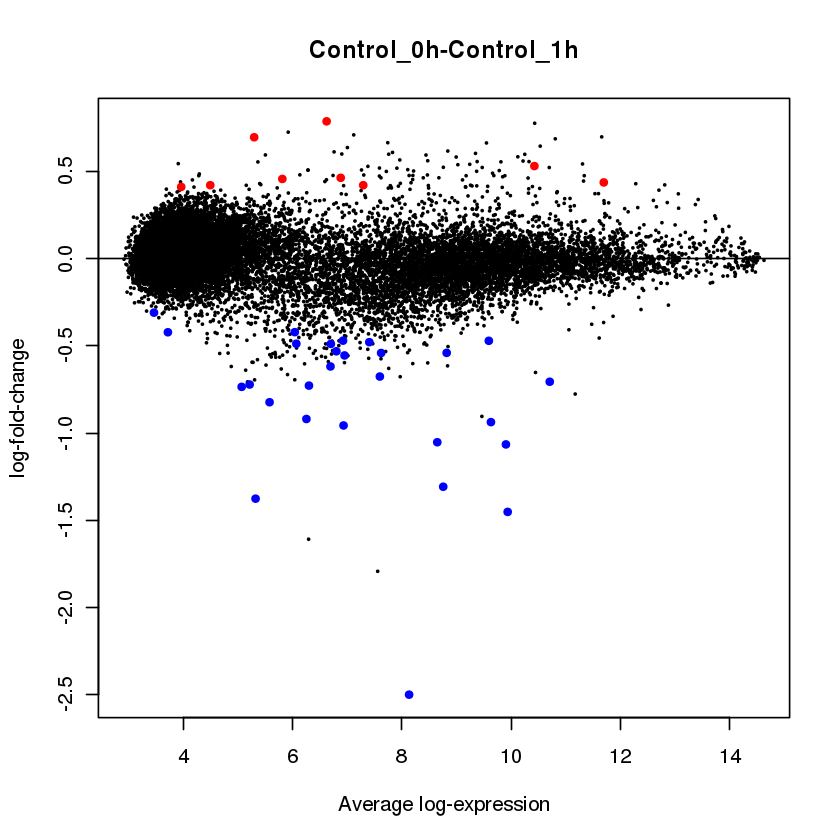

In [14]:
GSE57788_obj <- getDEG("GSE57788", "GPL1322", "000011115555222266663333777744448888",
                       c("Gene.symbol","Gene.title"), T,
                      c("Control_0h","Control_1h","Control_8h","Control_24h",
                        "Control_72h","MMS_Treatment_1h","MMS_Treatment_8h",
                        "MMS_Treatment_24h","MMS_Treatment_72h"))

#### Gene Expression Data analysis

##### box-and-whisker plots

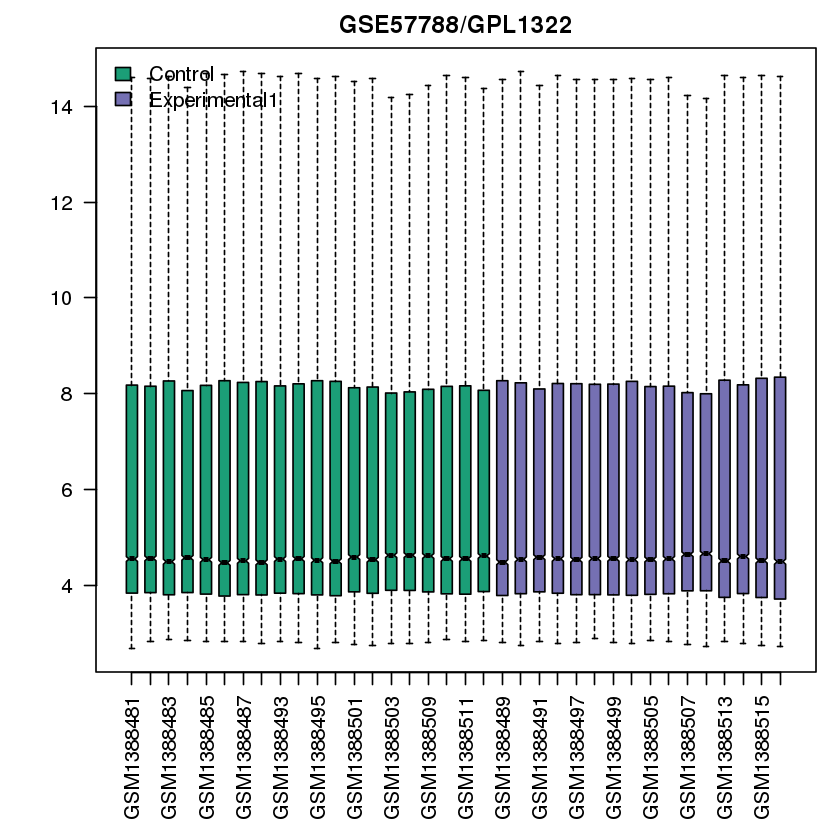

In [29]:
box_and_whisker_gset("GSE57788", GSE57788_obj$gset, GSE57788_obj$sampleGroups, GSE57788_obj$gsetExprs,F)

##### expression value distribution

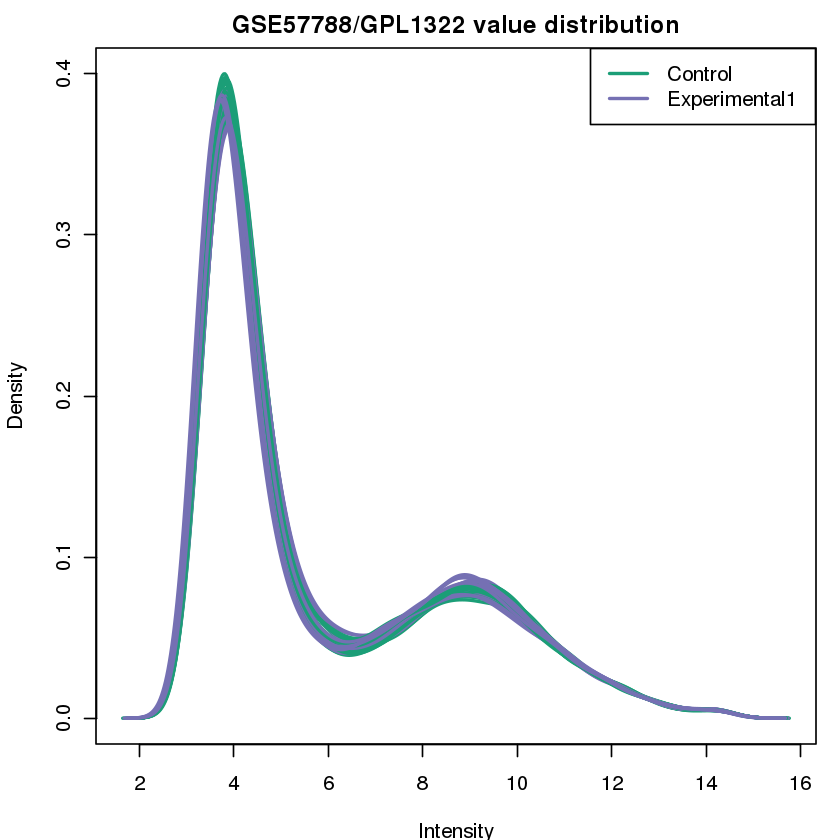

In [30]:
exp_val_dist_gset("GSE57788", GSE57788_obj$gset, GSE57788_obj$sampleGroups, GSE57788_obj$gsetExprs,F)

##### UMAP plot

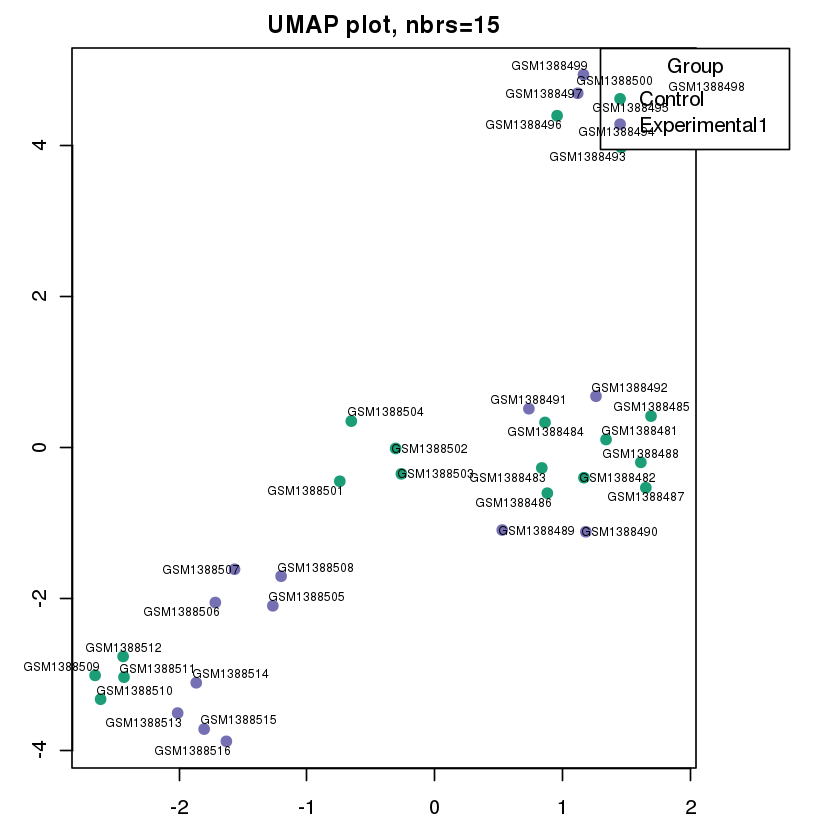

In [31]:
getUMAP_gset(GSE57788_obj$gsetExprs, 15, GSE57788_obj$sampleGroups,F)

##### mean-variance trend

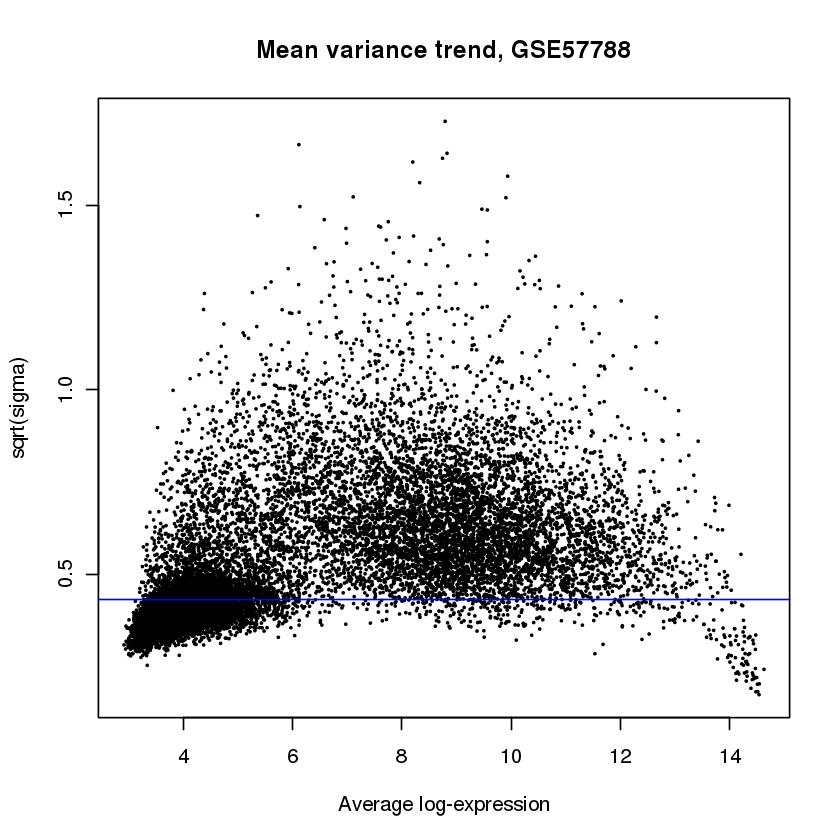

In [32]:
plotSA(GSE57788_obj$fit2, main=paste("Mean variance trend, ", "GSE57788", sep=""))

#### Extracting Human Orthologs of DEGs

In [15]:
names(GSE57788_obj$tT2)

[1] "ID"                                  "Gene.title"                         
 [3] "Gene.symbol"                         "Gene.ID"                            
 [5] "UniGene.title"                       "UniGene.symbol"                     
 [7] "UniGene.ID"                          "Nucleotide.Title"                   
 [9] "GI"                                  "GenBank.Accession"                  
[11] "Platform_CLONEID"                    "Platform_ORF"                       
[13] "Platform_SPOTID"                     "Chromosome.location"                
[15] "Chromosome.annotation"               "GO.Function"                        
[17] "GO.Process"                          "GO.Component"                       
[19] "GO.Function.ID"                      "GO.Process.ID"                      
[21] "GO.Component.ID"                     "Control_0h.Control_1h"              
[23] "Control_0h.Control_8h"               "Control_0h.Control_24h"             
[25] "Control_0h.Control_72h"              "Control_0h.MMS_Treatment_1h"        
[27] "Control_0h.MMS_Treatment_8h"         "Control_0h.MMS_Treatment_24h"       
[29] "Control_0h.MMS_Treatment_72h"        "Control_1h.Control_8h"              
[31] "Control_1h.Control_24h"              "Control_1h.Control_72h"             
[33] "Control_1h.MMS_Treatment_1h"         "Control_1h.MMS_Treatment_8h"        
[35] "Control_1h.MMS_Treatment_24h"        "Control_1h.MMS_Treatment_72h"       
[37] "Control_8h.Control_24h"              "Control_8h.Control_72h"             
[39] "Control_8h.MMS_Treatment_1h"         "Control_8h.MMS_Treatment_8h"        
[41] "Control_8h.MMS_Treatment_24h"        "Control_8h.MMS_Treatment_72h"       
[43] "Control_24h.Control_72h"             "Control_24h.MMS_Treatment_1h"       
[45] "Control_24h.MMS_Treatment_8h"        "Control_24h.MMS_Treatment_24h"      
[47] "Control_24h.MMS_Treatment_72h"       "Control_72h.MMS_Treatment_1h"       
[49] "Control_72h.MMS_Treatment_8h"        "Control_72h.MMS_Treatment_24h"      
[51] "Control_72h.MMS_Treatment_72h"       "MMS_Treatment_1h.MMS_Treatment_8h"  
[53] "MMS_Treatment_1h.MMS_Treatment_24h"  "MMS_Treatment_1h.MMS_Treatment_72h" 
[55] "MMS_Treatment_8h.MMS_Treatment_24h"  "MMS_Treatment_8h.MMS_Treatment_72h" 
[57] "MMS_Treatment_24h.MMS_Treatment_72h" "AveExpr"                            
[59] "F"                                   "P.Value"                            
[61] "adj.P.Val"

In [16]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE57788_obj$tT2), sep=" "))
transcriptToGene <- pData(featureData(GSE57788_obj$gset))
totalTranscripts <- transcriptToGene[as.character(GSE57788_obj$tT2$ID),]

viable_transcripts <- 0
viable_transcripts_ids <- character(0)
total_transcript_genes <- character(0)
for(i in 1:nrow(totalTranscripts)) {
    current_string <- totalTranscripts$'Gene.symbol'[i]
    if(length(current_string) < 1) {next}
    
    ensemblIDs <- unlist(strsplit(current_string, "///"))
    # remove weird  symbols
    ensemblIDs <- ensemblIDs[grep("^[A-Za-z0-9]+$", ensemblIDs, perl=TRUE)]
    
    if(is.null(ensemblIDs)) {next}
    if(length(ensemblIDs) < 1) {next}
    viable_transcripts <- viable_transcripts+1
    viable_transcripts_ids <- append(viable_transcripts_ids, rep(totalTranscripts$ID[i],
                                                                 length(ensemblIDs)), length(viable_transcripts_ids))
    total_transcript_genes <- append(total_transcript_genes, ensemblIDs, length(total_transcript_genes))
}



transcript_id_dict <- data.frame("transcriptGenes" = total_transcript_genes, "transcriptIDS" = viable_transcripts_ids)

print(paste("Total transcripts with an associated drosophila gene:", viable_transcripts, sep=" "))
print(paste("Total associated drosophila genes:", length(total_transcript_genes), sep=" "))

GSE57788_lfc_columns<- c('Control_1h.MMS_Treatment_1h','Control_8h.MMS_Treatment_8h',
                         'Control_24h.MMS_Treatment_24h','Control_72h.MMS_Treatment_72h',
                         'MMS_Treatment_1h.MMS_Treatment_8h','MMS_Treatment_1h.MMS_Treatment_24h',
                         'MMS_Treatment_1h.MMS_Treatment_72h','MMS_Treatment_8h.MMS_Treatment_24h',
                         'MMS_Treatment_8h.MMS_Treatment_72h','MMS_Treatment_24h.MMS_Treatment_72h')

GSE57788_lfc_genes <- filter_transcripts(GSE57788_obj, transcript_id_dict, "dmelanogaster_stress_GSE57788",
                                         dmelanogaster, "external_gene_name", "GSE57788",
                                         GSE57788_lfc_columns, pval=0.05, homology_confidence = F)

[1] "Total Transcripts: 18952"
[1] "Total transcripts with an associated drosophila gene: 13949"
[1] "Total associated drosophila genes: 14368"


ERROR: Error: biomaRt has encountered an unexpected server error.
Consider trying one of the Ensembl mirrors (for more details look at ?useEnsembl)


In [ ]:
GSE57788_lfc_genes

### GSE57789

#### Data Download and Normalization

Found 1 file(s)

GSE57789_series_matrix.txt.gz


── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_double(),
  ID_REF = col_character()
)
ℹ Use `spec()` for the full column specifications.


File stored at: 

/tmp/RtmpFkfKoa/GPL1261.annot.gz

Warning message:
“64 parsing failures.
  row             col           expected    actual         file
45038 Platform_SPOTID 1/0/T/F/TRUE/FALSE --Control literal data
45039 Platform_SPOTID 1/0/T/F/TRUE/FALSE --Control literal data
45040 Platform_SPOTID 1/0/T/F/TRUE/FALSE --Control literal data
45041 Platform_SPOTID 1/0/T/F/TRUE/FALSE --Control literal data
45042 Platform_SPOTID 1/0/T/F/TRUE/FALSE --Control literal data
..... ............... .................. ......... ............
See problems(...) for more details.
”


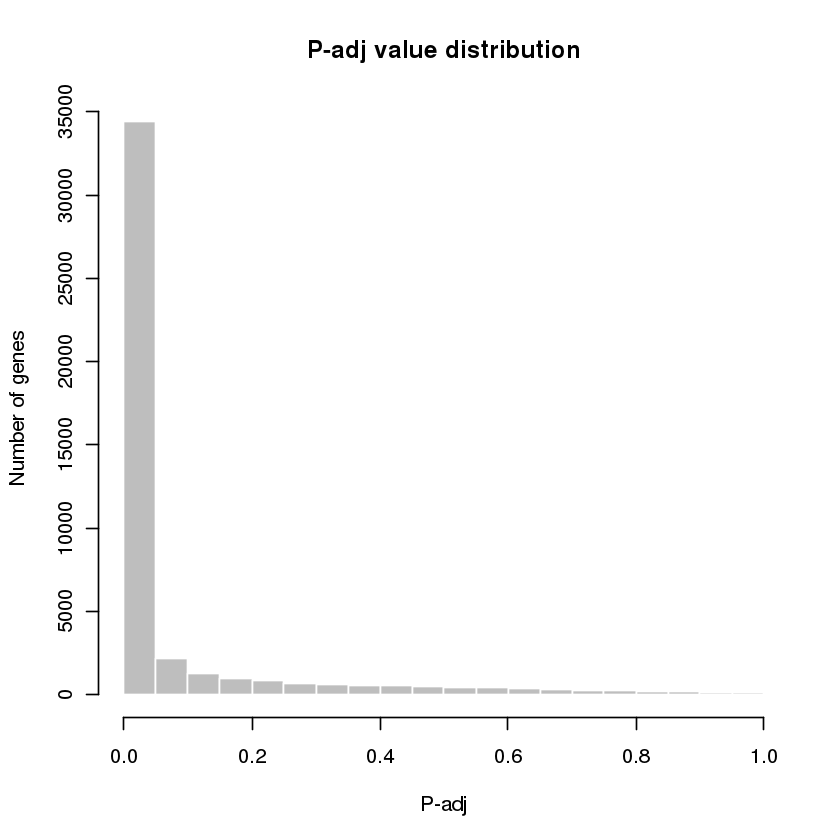

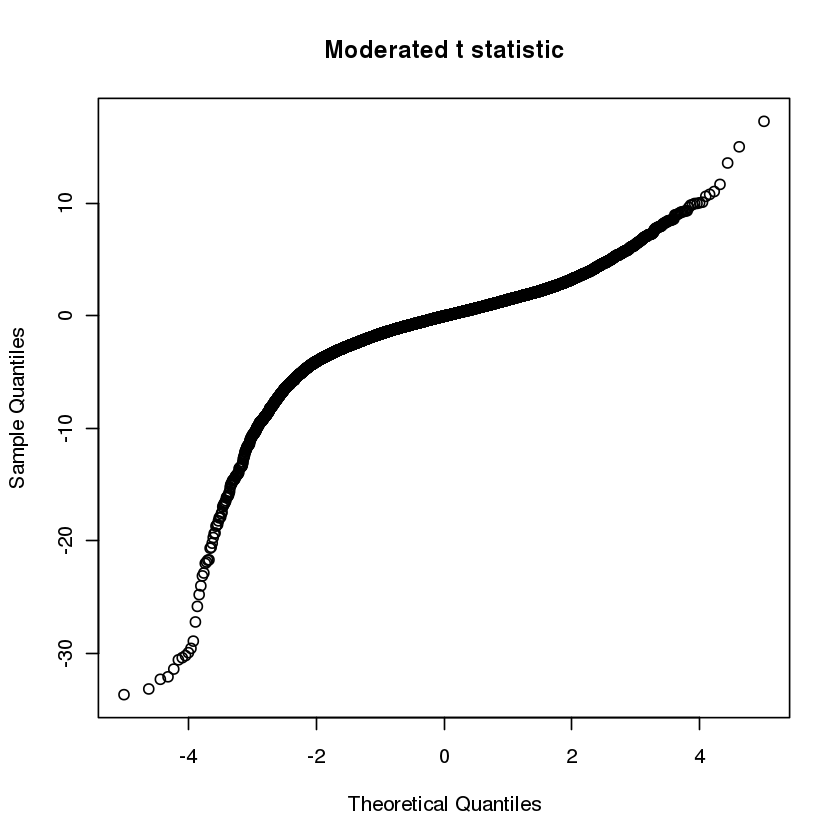

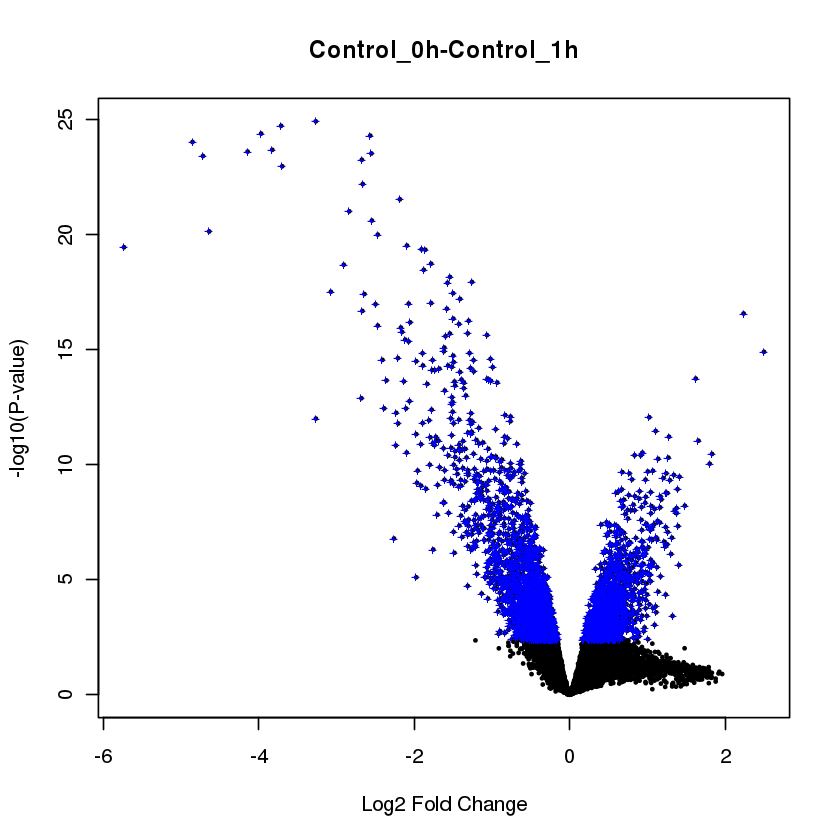

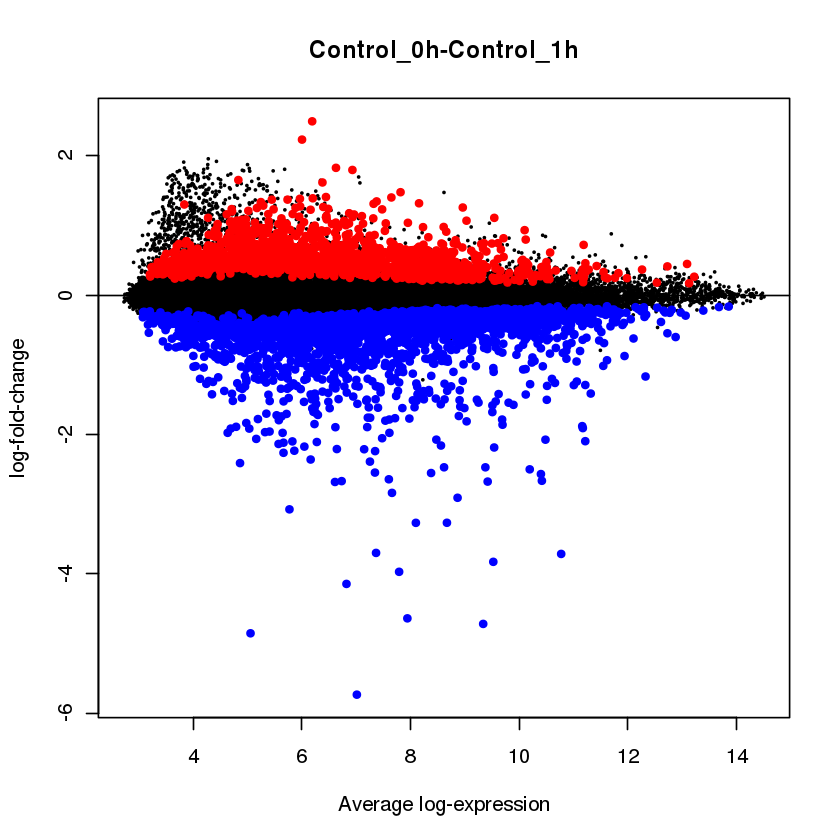

In [51]:
GSE57789_obj <- getDEG("GSE57789", "GPL1261", "00001111555522226666333377774444888",
                       c("Gene.symbol","Gene.title"), T,
                      c("Control_0h","Control_1h","Control_8h","Control_24h",
                        "Control_72h","MMS_Treatment_1h","MMS_Treatment_8h",
                        "MMS_Treatment_24h","MMS_Treatment_72h"))

#### Gene Expression Data analysis

##### box-and-whisker plots

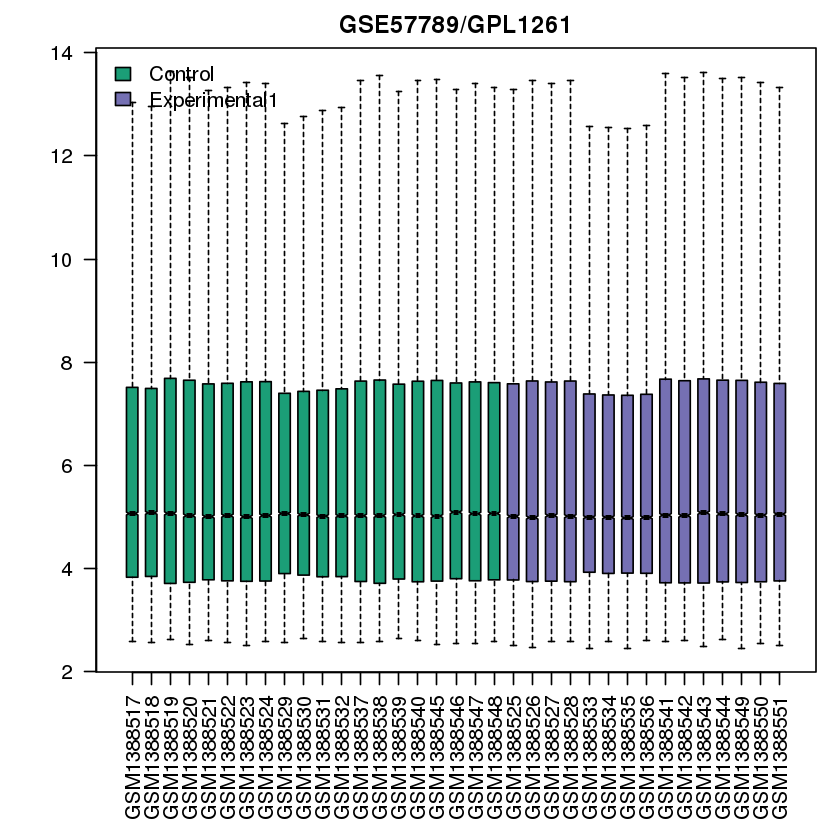

In [35]:
box_and_whisker_gset("GSE57789", GSE57789_obj$gset, GSE57789_obj$sampleGroups, GSE57789_obj$gsetExprs,F)

##### expression value distribution

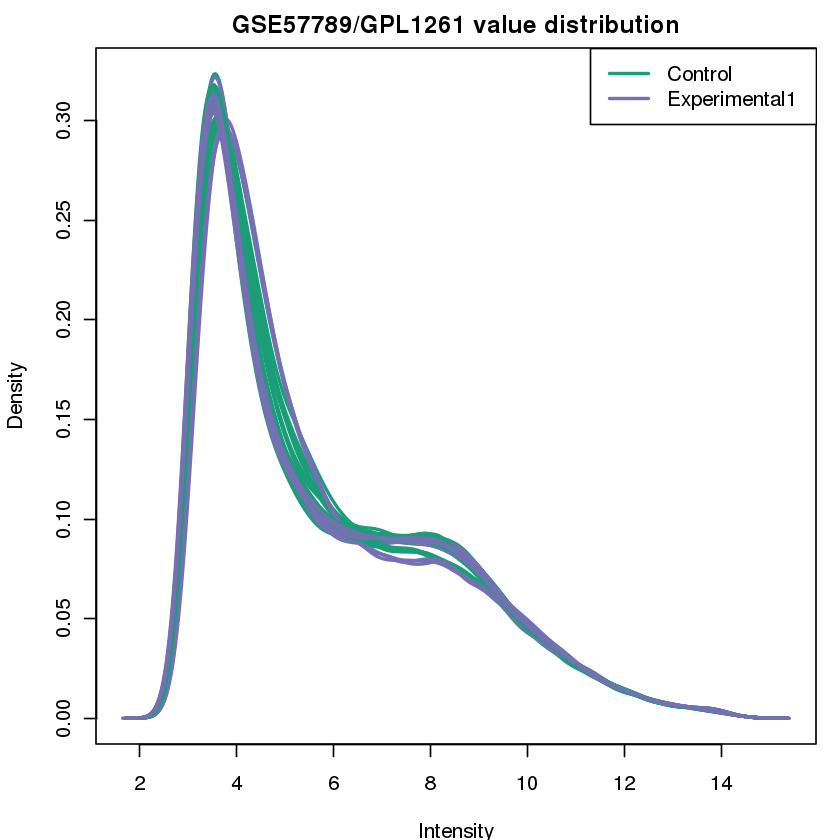

In [36]:
exp_val_dist_gset("GSE57789", GSE57789_obj$gset, GSE57789_obj$sampleGroups, GSE57789_obj$gsetExprs,F)

##### UMAP plot

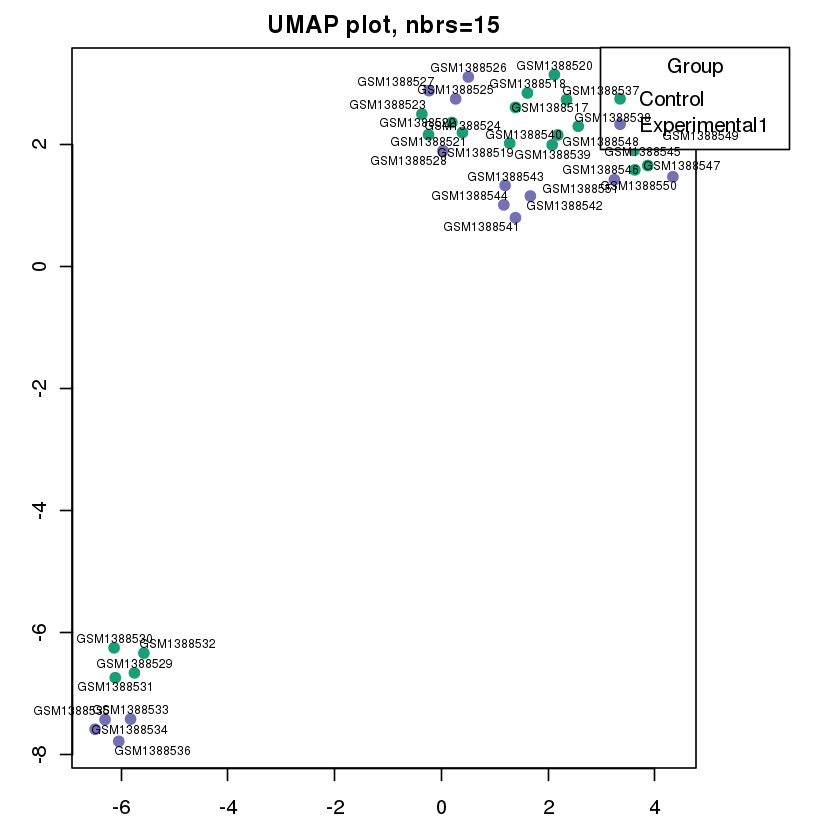

In [37]:
getUMAP_gset(GSE57789_obj$gsetExprs, 15, GSE57789_obj$sampleGroups,F)

##### mean-variance trend

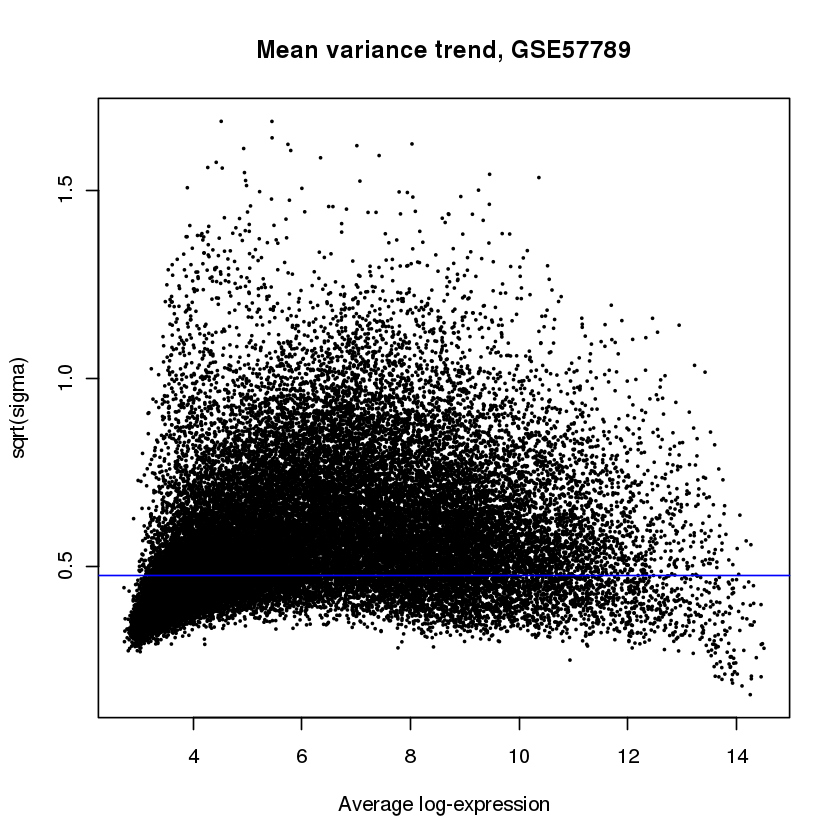

In [38]:
plotSA(GSE57789_obj$fit2, main=paste("Mean variance trend, ", "GSE57789", sep=""))

#### Extracting Human Orthologs of DEGs

In [52]:
names(GSE57789_obj$tT2)

[1] "ID"                                  "Gene.title"                         
 [3] "Gene.symbol"                         "Gene.ID"                            
 [5] "UniGene.title"                       "UniGene.symbol"                     
 [7] "UniGene.ID"                          "Nucleotide.Title"                   
 [9] "GI"                                  "GenBank.Accession"                  
[11] "Platform_CLONEID"                    "Platform_ORF"                       
[13] "Platform_SPOTID"                     "Chromosome.location"                
[15] "Chromosome.annotation"               "GO.Function"                        
[17] "GO.Process"                          "GO.Component"                       
[19] "GO.Function.ID"                      "GO.Process.ID"                      
[21] "GO.Component.ID"                     "Control_0h.Control_1h"              
[23] "Control_0h.Control_8h"               "Control_0h.Control_24h"             
[25] "Control_0h.Control_72h"              "Control_0h.MMS_Treatment_1h"        
[27] "Control_0h.MMS_Treatment_8h"         "Control_0h.MMS_Treatment_24h"       
[29] "Control_0h.MMS_Treatment_72h"        "Control_1h.Control_8h"              
[31] "Control_1h.Control_24h"              "Control_1h.Control_72h"             
[33] "Control_1h.MMS_Treatment_1h"         "Control_1h.MMS_Treatment_8h"        
[35] "Control_1h.MMS_Treatment_24h"        "Control_1h.MMS_Treatment_72h"       
[37] "Control_8h.Control_24h"              "Control_8h.Control_72h"             
[39] "Control_8h.MMS_Treatment_1h"         "Control_8h.MMS_Treatment_8h"        
[41] "Control_8h.MMS_Treatment_24h"        "Control_8h.MMS_Treatment_72h"       
[43] "Control_24h.Control_72h"             "Control_24h.MMS_Treatment_1h"       
[45] "Control_24h.MMS_Treatment_8h"        "Control_24h.MMS_Treatment_24h"      
[47] "Control_24h.MMS_Treatment_72h"       "Control_72h.MMS_Treatment_1h"       
[49] "Control_72h.MMS_Treatment_8h"        "Control_72h.MMS_Treatment_24h"      
[51] "Control_72h.MMS_Treatment_72h"       "MMS_Treatment_1h.MMS_Treatment_8h"  
[53] "MMS_Treatment_1h.MMS_Treatment_24h"  "MMS_Treatment_1h.MMS_Treatment_72h" 
[55] "MMS_Treatment_8h.MMS_Treatment_24h"  "MMS_Treatment_8h.MMS_Treatment_72h" 
[57] "MMS_Treatment_24h.MMS_Treatment_72h" "AveExpr"                            
[59] "F"                                   "P.Value"                            
[61] "adj.P.Val"

In [53]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE57789_obj$tT2), sep=" "))
transcriptToGene <- pData(featureData(GSE57789_obj$gset))
totalTranscripts <- transcriptToGene[as.character(GSE57789_obj$tT2$ID),]

viable_transcripts <- 0
viable_transcripts_ids <- character(0)
total_transcript_genes <- character(0)
for(i in 1:nrow(totalTranscripts)) {
    current_string <- totalTranscripts$'Gene.symbol'[i]
    if(length(current_string) < 1) {next}
    
    ensemblIDs <- unlist(strsplit(current_string, "///"))
    # remove weird  symbols
    ensemblIDs <- ensemblIDs[grep("^[A-Za-z0-9]+$", ensemblIDs, perl=TRUE)]
    
    if(is.null(ensemblIDs)) {next}
    if(length(ensemblIDs) < 1) {next}
    viable_transcripts <- viable_transcripts+1
    viable_transcripts_ids <- append(viable_transcripts_ids, rep(totalTranscripts$ID[i],
                                                                 length(ensemblIDs)), length(viable_transcripts_ids))
    total_transcript_genes <- append(total_transcript_genes, ensemblIDs, length(total_transcript_genes))
}



transcript_id_dict <- data.frame("transcriptGenes" = total_transcript_genes, "transcriptIDS" = viable_transcripts_ids)

print(paste("Total transcripts with an associated mouse gene:", viable_transcripts, sep=" "))
print(paste("Total associated mouse genes:", length(total_transcript_genes), sep=" "))

GSE57789_lfc_columns<- c('Control_1h.MMS_Treatment_1h','Control_8h.MMS_Treatment_8h',
                         'Control_24h.MMS_Treatment_24h','Control_72h.MMS_Treatment_72h',
                         'MMS_Treatment_1h.MMS_Treatment_8h','MMS_Treatment_1h.MMS_Treatment_24h',
                         'MMS_Treatment_1h.MMS_Treatment_72h','MMS_Treatment_8h.MMS_Treatment_24h',
                         'MMS_Treatment_8h.MMS_Treatment_72h','MMS_Treatment_24h.MMS_Treatment_72h')


GSE57789_lfc_genes <- filter_transcripts(GSE57789_obj, transcript_id_dict, "mmusculus_stress_GSE57789",
                                         mmusculus, "external_gene_name", "GSE57789",
                                         GSE57789_lfc_columns,pval=0.05, homology_confidence = F)

[1] "Total Transcripts: 45101"
[1] "Total transcripts with an associated mouse gene: 39593"
[1] "Total associated mouse genes: 41804"
[1] "Total mmusculus_stress_GSE57789 transcripts with Available Human Orthologs: 17407"
[1] "Total mmusculus_stress_GSE57789 transcripts with Available Human Ortholog Gene Symbols: 15641"
[1] "Total mmusculus_stress_GSE57789 genes with Available Human Ortholog Gene Symbols and in Background gene sets: 15569"
[1] "Total transcripts after orthologous mapping and filtering: 31565"
[1] "Total significant transcripts after orthologous mapping and filtering: 25733"
[1] "################################"
[1] "Control_1h.MMS_Treatment_1h LogFC"
[1] "Total transcripts with negative logFC vals: 7"
[1] "Total transcripts with positive logFC vals: 1"
[1] "Total significant downregulated mmusculus_stress_GSE57789 genes after orthologous mapping and filtering: 7"
[1] "Total significant upregulated mmusculus_stress_GSE57789 genes after orthologous mapping and filtering

### GSE133120 - Hsapiens - A549

#### Data Download and Normalization

Found 1 file(s)

GSE133120_series_matrix.txt.gz


── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_double(),
  ID_REF = col_character()
)
ℹ Use `spec()` for the full column specifications.


File stored at: 

/lscratch/36040237/RtmpD6MD3u/GPL570.annot.gz

Warning message:
“62 parsing failures.
  row             col           expected    actual         file
54614 Platform_SPOTID 1/0/T/F/TRUE/FALSE --Control literal data
54615 Platform_SPOTID 1/0/T/F/TRUE/FALSE --Control literal data
54616 Platform_SPOTID 1/0/T/F/TRUE/FALSE --Control literal data
54617 Platform_SPOTID 1/0/T/F/TRUE/FALSE --Control literal data
54618 Platform_SPOTID 1/0/T/F/TRUE/FALSE --Control literal data
..... ............... .................. ......... ............
See problems(...) for more details.
”


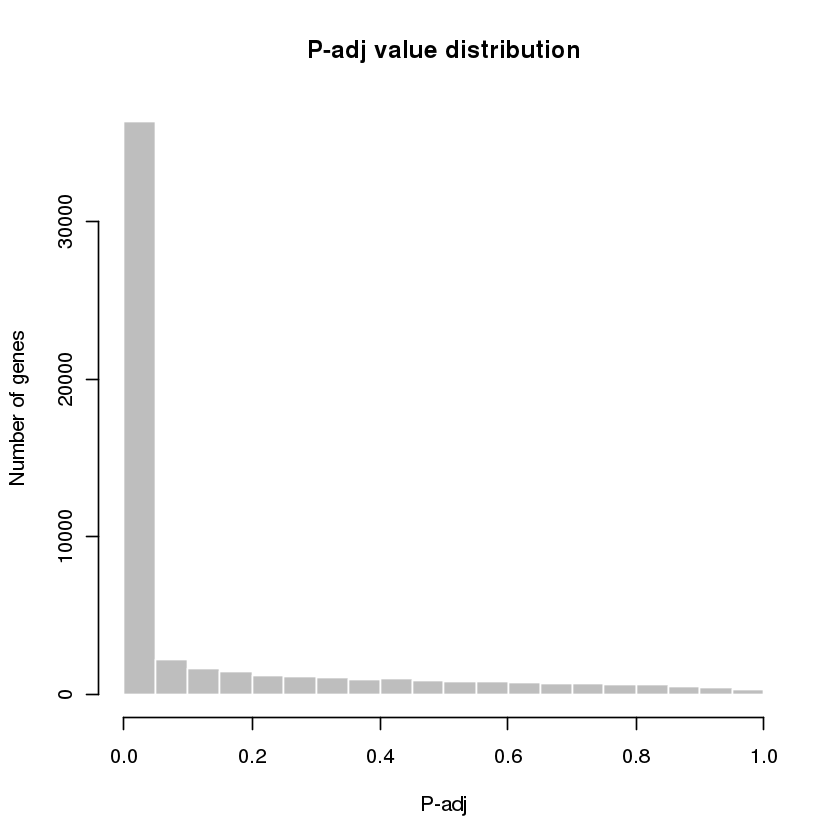

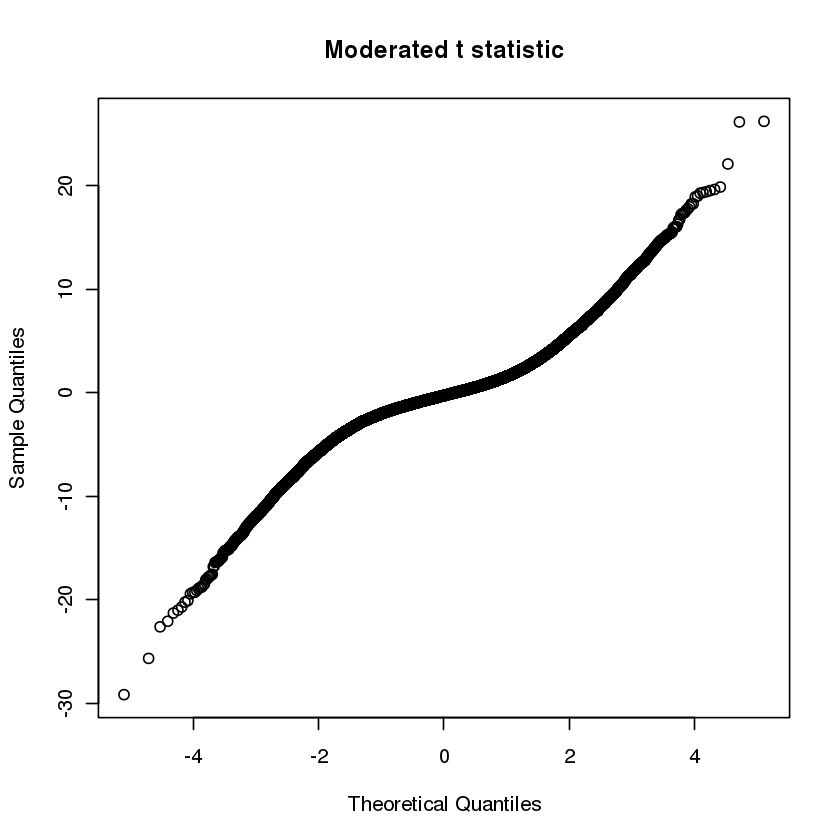

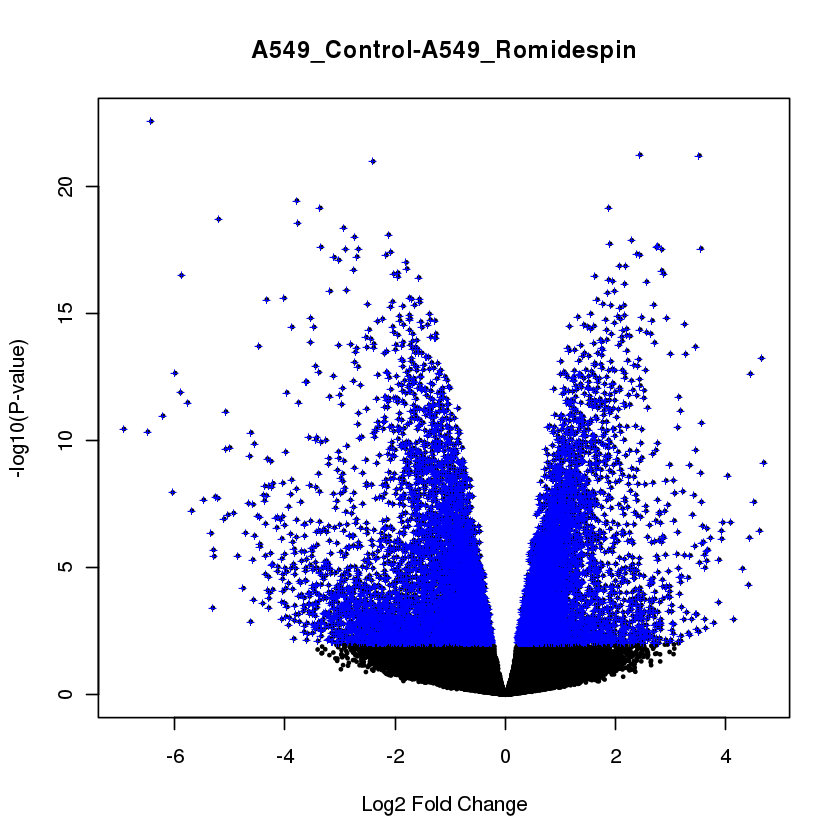

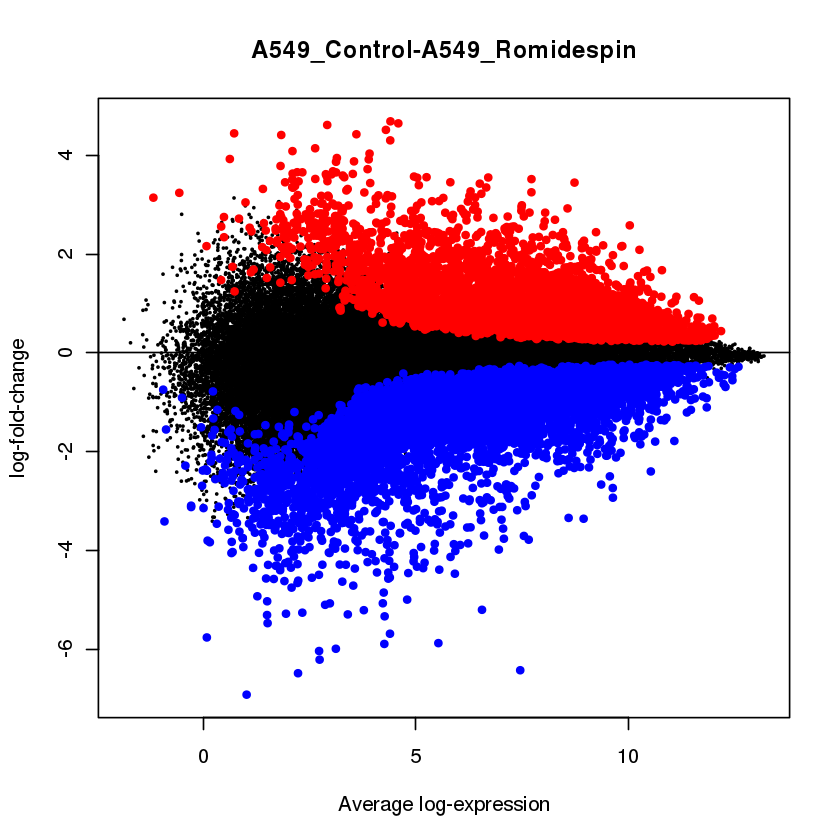

In [33]:
GSE133120_obj <- getDEG("GSE133120", "GSE133120", "010101232323ABCD896745ABCD896745ABCD896745",
                       c("Gene.symbol","Gene.title"), T,
                       c("A549_Control","A549_Romidespin","ACHN_Control","ACHN_Romidespin",
                         "HuT_Control","HuT_Romidespin","LOX_Control","LOX_Romidespin",
                         "M14_Control","M14_Romidespin","MDA_Control","MDA_Romidespin",
                         "PC3_Control","PC3_Romidespin"))

#### Gene Expression Data analysis

##### box-and-whisker plots

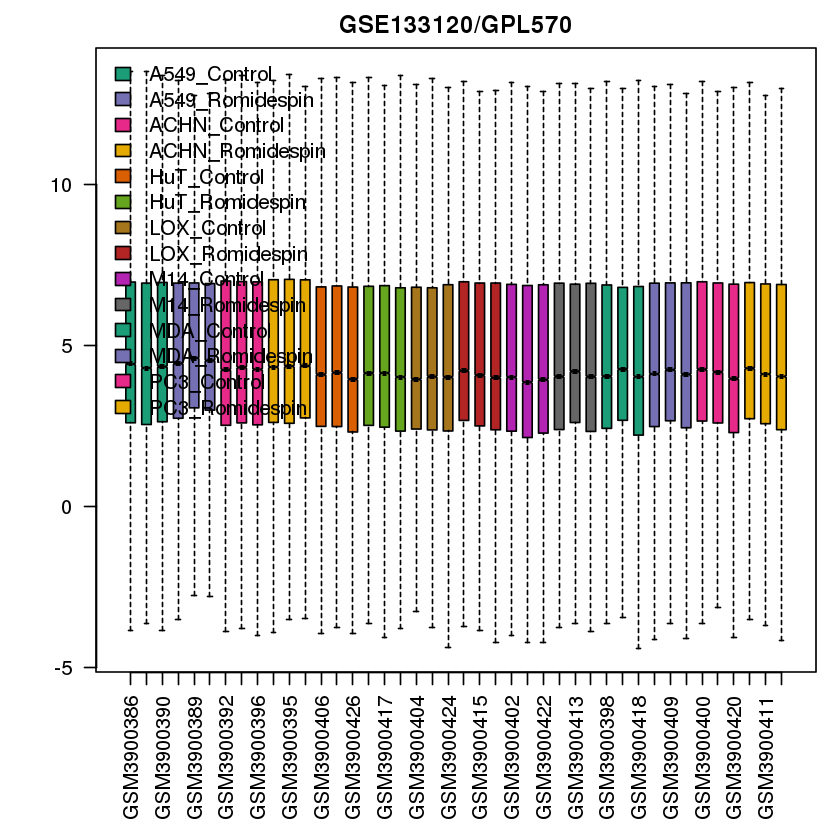

In [34]:
box_and_whisker_gset("GSE133120", GSE133120_obj$gset, GSE133120_obj$sampleGroups, GSE133120_obj$gsetExprs,T)

##### expression value distribution

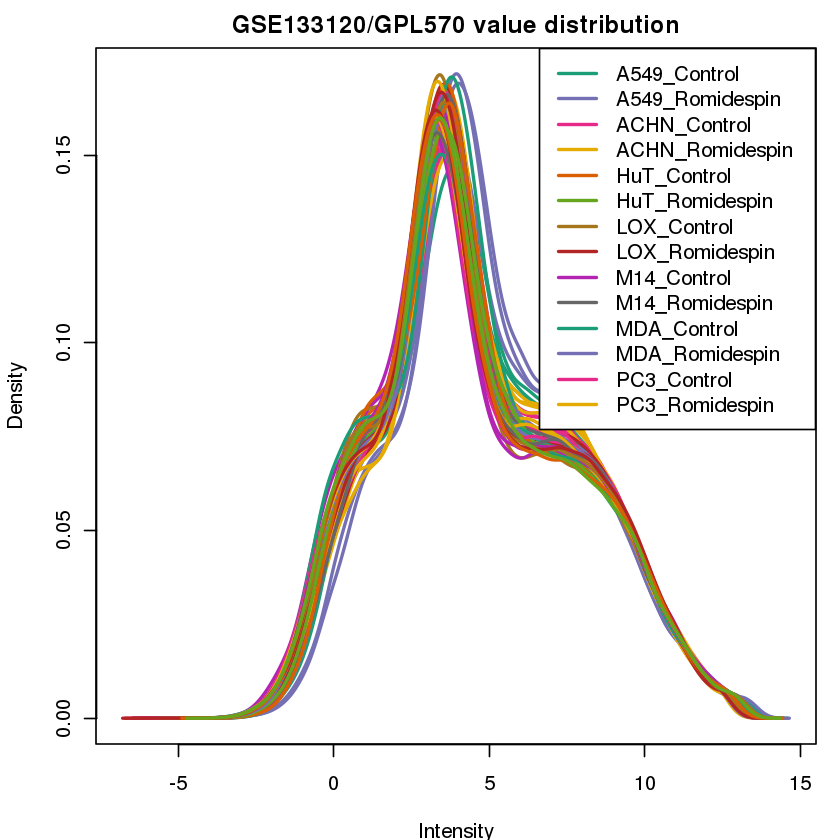

In [35]:
exp_val_dist_gset("GSE133120", GSE133120_obj$gset, GSE133120_obj$sampleGroups, GSE133120_obj$gsetExprs,T)

##### UMAP plot

Warning message:
“failed creating initial embedding; using random embedding instead”
Warning message:
“failed creating initial embedding; using random embedding instead”
Warning message:
“failed creating initial embedding; using random embedding instead”
Warning message:
“failed creating initial embedding; using random embedding instead”
Warning message:
“failed creating initial embedding; using random embedding instead”
Warning message:
“failed creating initial embedding; using random embedding instead”
Warning message:
“failed creating initial embedding; using random embedding instead”
Warning message:
“failed creating initial embedding; using random embedding instead”
Warning message:
“failed creating initial embedding; using random embedding instead”
Warning message:
“failed creating initial embedding; using random embedding instead”
Warning message:
“failed creating initial embedding; using random embedding instead”
Warning message:
“failed creating initial embedding; using random

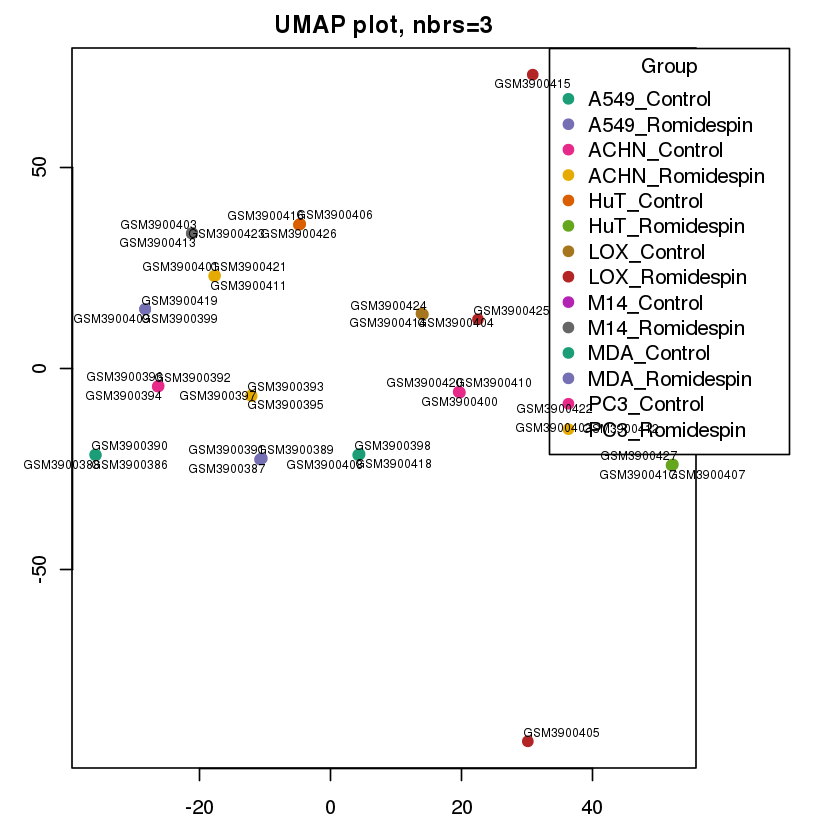

In [36]:
getUMAP_gset(GSE133120_obj$gsetExprs, 3, GSE133120_obj$sampleGroups,T)

##### mean-variance trend

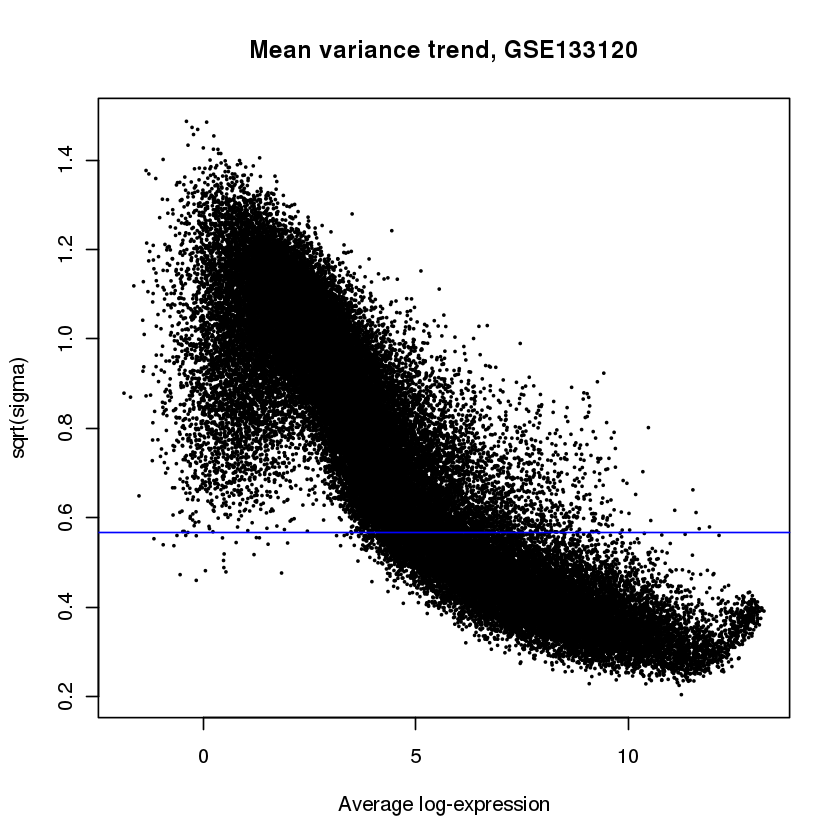

In [37]:
plotSA(GSE133120_obj$fit2, main=paste("Mean variance trend, ", "GSE133120", sep=""))

#### Extracting Human Orthologs of DEGs

In [38]:
names(GSE133120_obj$tT2)

[1] "ID"                              "Gene.title"                     
  [3] "Gene.symbol"                     "Gene.ID"                        
  [5] "UniGene.title"                   "UniGene.symbol"                 
  [7] "UniGene.ID"                      "Nucleotide.Title"               
  [9] "GI"                              "GenBank.Accession"              
 [11] "Platform_CLONEID"                "Platform_ORF"                   
 [13] "Platform_SPOTID"                 "Chromosome.location"            
 [15] "Chromosome.annotation"           "GO.Function"                    
 [17] "GO.Process"                      "GO.Component"                   
 [19] "GO.Function.ID"                  "GO.Process.ID"                  
 [21] "GO.Component.ID"                 "A549_Control.A549_Romidespin"   
 [23] "A549_Control.ACHN_Control"       "A549_Control.ACHN_Romidespin"   
 [25] "A549_Control.HuT_Control"        "A549_Control.HuT_Romidespin"    
 [27] "A549_Control.LOX_Control"        "A549_Control.LOX_Romidespin"    
 [29] "A549_Control.M14_Control"        "A549_Control.M14_Romidespin"    
 [31] "A549_Control.MDA_Control"        "A549_Control.MDA_Romidespin"    
 [33] "A549_Control.PC3_Control"        "A549_Control.PC3_Romidespin"    
 [35] "A549_Romidespin.ACHN_Control"    "A549_Romidespin.ACHN_Romidespin"
 [37] "A549_Romidespin.HuT_Control"     "A549_Romidespin.HuT_Romidespin" 
 [39] "A549_Romidespin.LOX_Control"     "A549_Romidespin.LOX_Romidespin" 
 [41] "A549_Romidespin.M14_Control"     "A549_Romidespin.M14_Romidespin" 
 [43] "A549_Romidespin.MDA_Control"     "A549_Romidespin.MDA_Romidespin" 
 [45] "A549_Romidespin.PC3_Control"     "A549_Romidespin.PC3_Romidespin" 
 [47] "ACHN_Control.ACHN_Romidespin"    "ACHN_Control.HuT_Control"       
 [49] "ACHN_Control.HuT_Romidespin"     "ACHN_Control.LOX_Control"       
 [51] "ACHN_Control.LOX_Romidespin"     "ACHN_Control.M14_Control"       
 [53] "ACHN_Control.M14_Romidespin"     "ACHN_Control.MDA_Control"       
 [55] "ACHN_Control.MDA_Romidespin"     "ACHN_Control.PC3_Control"       
 [57] "ACHN_Control.PC3_Romidespin"     "ACHN_Romidespin.HuT_Control"    
 [59] "ACHN_Romidespin.HuT_Romidespin"  "ACHN_Romidespin.LOX_Control"    
 [61] "ACHN_Romidespin.LOX_Romidespin"  "ACHN_Romidespin.M14_Control"    
 [63] "ACHN_Romidespin.M14_Romidespin"  "ACHN_Romidespin.MDA_Control"    
 [65] "ACHN_Romidespin.MDA_Romidespin"  "ACHN_Romidespin.PC3_Control"    
 [67] "ACHN_Romidespin.PC3_Romidespin"  "HuT_Control.HuT_Romidespin"     
 [69] "HuT_Control.LOX_Control"         "HuT_Control.LOX_Romidespin"     
 [71] "HuT_Control.M14_Control"         "HuT_Control.M14_Romidespin"     
 [73] "HuT_Control.MDA_Control"         "HuT_Control.MDA_Romidespin"     
 [75] "HuT_Control.PC3_Control"         "HuT_Control.PC3_Romidespin"     
 [77] "HuT_Romidespin.LOX_Control"      "HuT_Romidespin.LOX_Romidespin"  
 [79] "HuT_Romidespin.M14_Control"      "HuT_Romidespin.M14_Romidespin"  
 [81] "HuT_Romidespin.MDA_Control"      "HuT_Romidespin.MDA_Romidespin"  
 [83] "HuT_Romidespin.PC3_Control"      "HuT_Romidespin.PC3_Romidespin"  
 [85] "LOX_Control.LOX_Romidespin"      "LOX_Control.M14_Control"        
 [87] "LOX_Control.M14_Romidespin"      "LOX_Control.MDA_Control"        
 [89] "LOX_Control.MDA_Romidespin"      "LOX_Control.PC3_Control"        
 [91] "LOX_Control.PC3_Romidespin"      "LOX_Romidespin.M14_Control"     
 [93] "LOX_Romidespin.M14_Romidespin"   "LOX_Romidespin.MDA_Control"     
 [95] "LOX_Romidespin.MDA_Romidespin"   "LOX_Romidespin.PC3_Control"     
 [97] "LOX_Romidespin.PC3_Romidespin"   "M14_Control.M14_Romidespin"     
 [99] "M14_Control.MDA_Control"         "M14_Control.MDA_Romidespin"     
[101] "M14_Control.PC3_Control"         "M14_Control.PC3_Romidespin"     
[103] "M14_Romidespin.MDA_Control"      "M14_Romidespin.MDA_Romidespin"  
[105] "M14_Romidespin.PC3_Control"      "M14_Romidespin.PC3_Romidespin"  
[107] "MDA_Control.MDA_Romidespin"      "MDA_Control.PC3_Control"        
[109] 

In [40]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE133120_obj$tT2), sep=" "))
transcriptToGene <- pData(featureData(GSE133120_obj$gset))
totalTranscripts <- transcriptToGene[as.character(GSE133120_obj$tT2$ID),]

GSE133120_avail_symbols <- totalTranscripts[totalTranscripts$Gene.symbol !=  "",]
print(paste("Total Transcripts with available symbols:", nrow(GSE133120_avail_symbols), sep=" "))

GSE133120_transcript_id_to_ho_dict <- data.frame("transcriptGenes" = GSE133120_avail_symbols$Gene.symbol,
                                 "transcriptIDS" = GSE133120_avail_symbols$ID)

GSE133120_lfc_columns<-c('A549_Control.A549_Romidespin', 'ACHN_Control.ACHN_Romidespin',
                        'HuT_Control.HuT_Romidespin', 'LOX_Control.LOX_Romidespin',
                        'M14_Control.M14_Romidespin', 'MDA_Control.MDA_Romidespin',
                        'PC3_Control.PC3_Romidespin')

GSE133120_lfc_genes <- filter_transcripts(GSE133120_obj, GSE133120_transcript_id_to_ho_dict,
                                         "hsapiens_stress_GSE133120", human, "hgnc_symbol", "GSE133120",
                                          GSE133120_lfc_columns, pval=0.05, homology_confidence = F)

[1] "Total Transcripts: 54675"
[1] "Total Transcripts with available symbols: 45118"
[1] "Total hsapiens_stress_GSE133120 transcripts with Available Human Orthologs: 20345"
[1] "Total hsapiens_stress_GSE133120 transcripts with Available Human Ortholog Gene Symbols: 18120"
[1] "Total hsapiens_stress_GSE133120 genes with Available Human Ortholog Gene Symbols and in Background gene sets: 17303"
[1] "Total transcripts after orthologous mapping and filtering: 38049"
[1] "Total significant transcripts after orthologous mapping and filtering: 28757"
[1] "################################"
[1] "A549_Control.A549_Romidespin LogFC"
[1] "Total transcripts with negative logFC vals: 3549"
[1] "Total transcripts with positive logFC vals: 2185"
[1] "Total significant downregulated hsapiens_stress_GSE133120 genes after orthologous mapping and filtering: 2639"
[1] "Total significant upregulated hsapiens_stress_GSE133120 genes after orthologous mapping and filtering: 1520"
[1] "Total significant Final do

### GSE7535

#### Data Download and Normalization

Found 1 file(s)

GSE7535_series_matrix.txt.gz


── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_double()
)
ℹ Use `spec()` for the full column specifications.


File stored at: 

/tmp/RtmpFkfKoa/GPL2875.annot.gz

Warning message:
“Partial NA coefficients for 132 probe(s)”


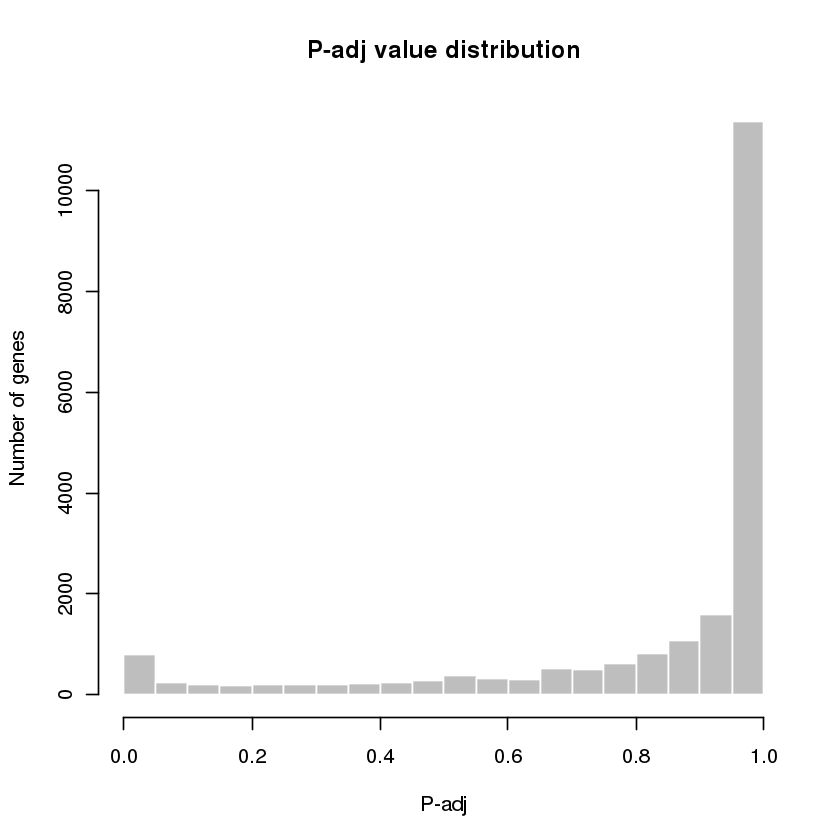

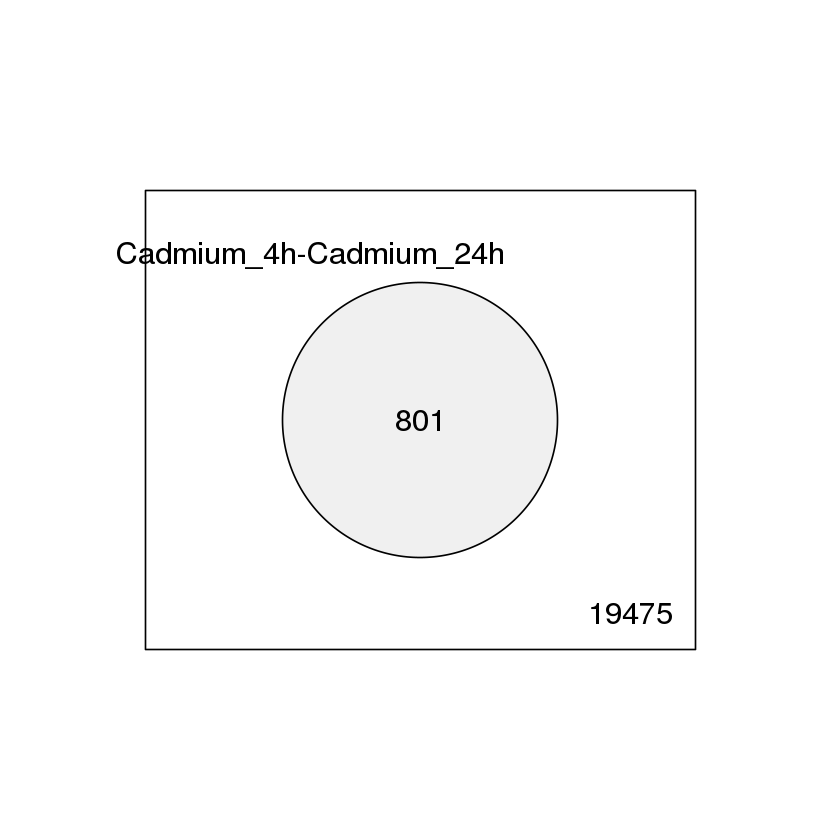

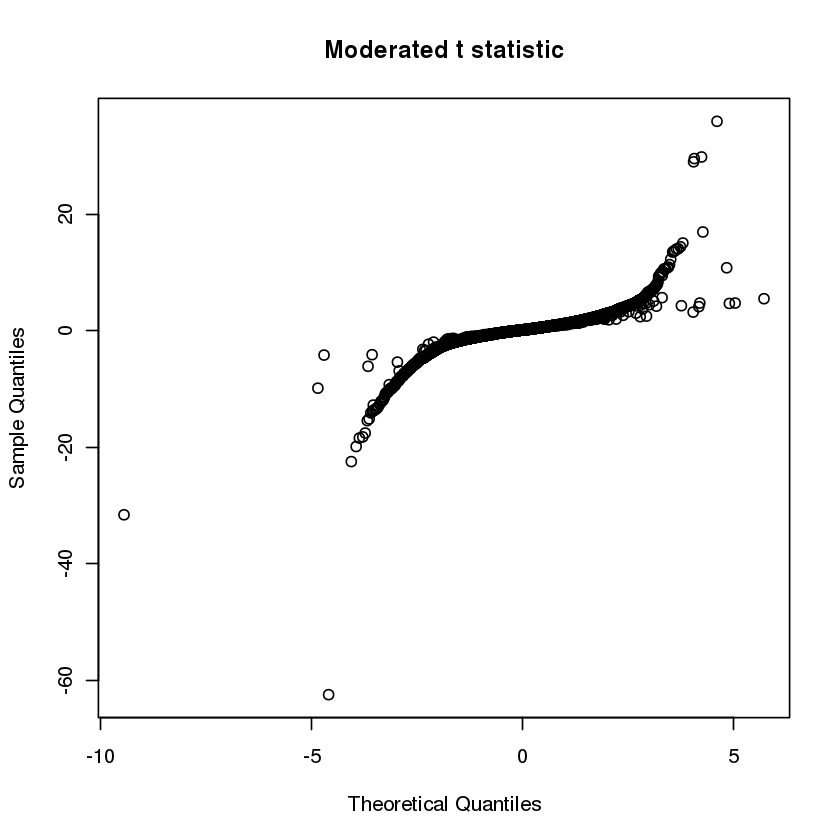

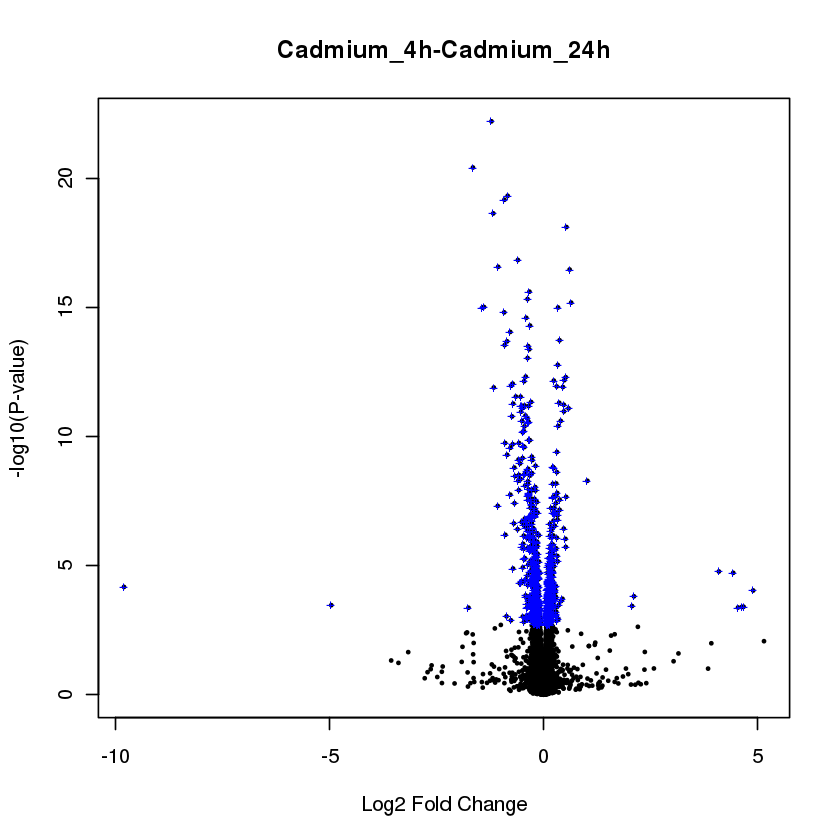

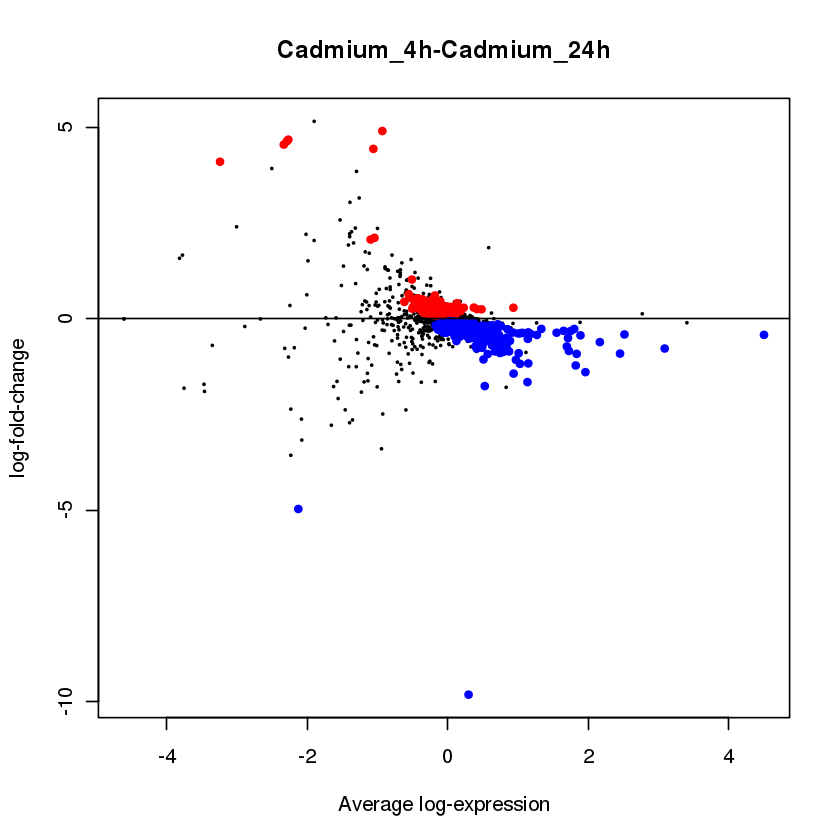

In [59]:
GSE7535_obj <- getDEG("GSE7535", "GPL2875", "000000000000000000111111111111111111",
                        c("ID","Gene.symbol","Gene.title"), T,
                     c("Cadmium_4h","Cadmium_24h"))

#### Gene Expression Data analysis

##### box-and-whisker plots

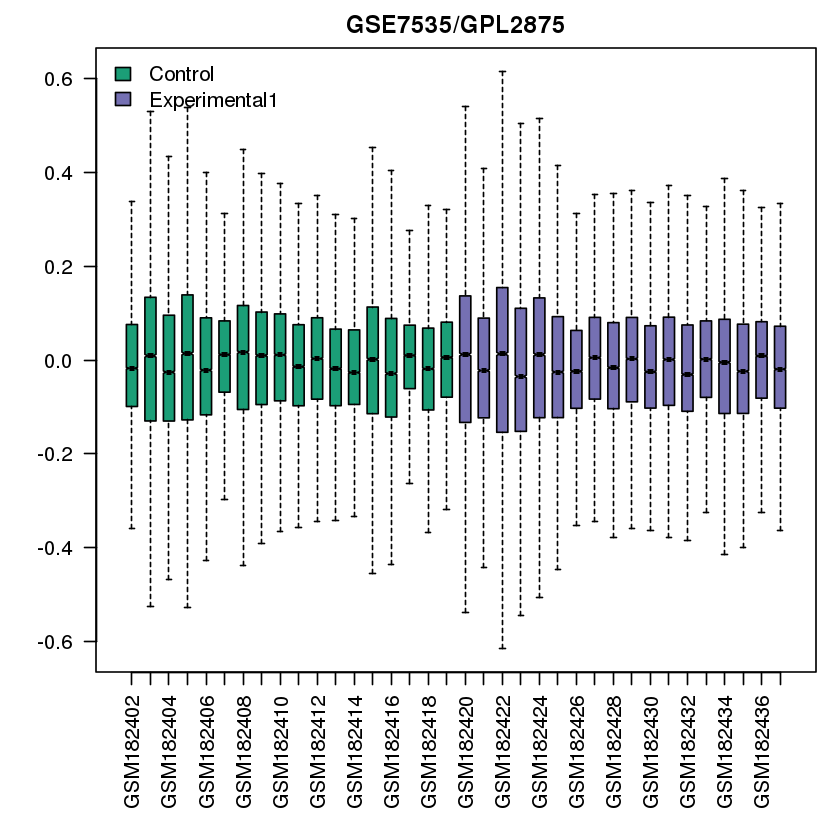

In [54]:
box_and_whisker_gset("GSE7535", GSE7535_obj$gset, GSE7535_obj$sampleGroups, GSE7535_obj$gsetExprs,F)

##### expression value distribution

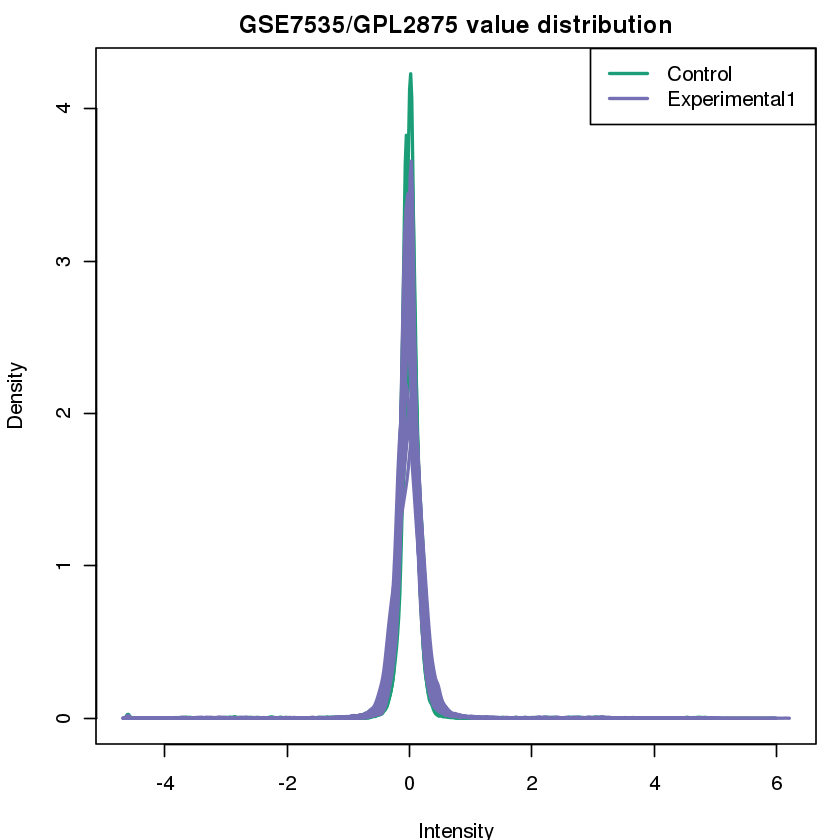

In [55]:
exp_val_dist_gset("GSE7535", GSE7535_obj$gset, GSE7535_obj$sampleGroups, GSE7535_obj$gsetExprs,F)

##### UMAP plot

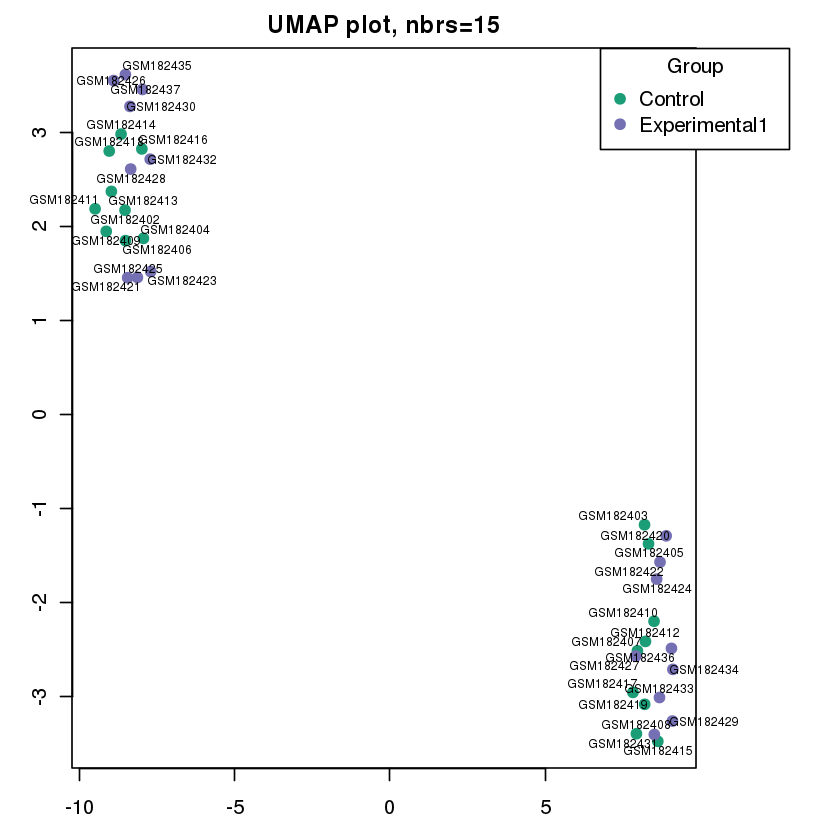

In [56]:
getUMAP_gset(GSE7535_obj$gsetExprs, 15, GSE7535_obj$sampleGroups,F)

##### mean-variance trend

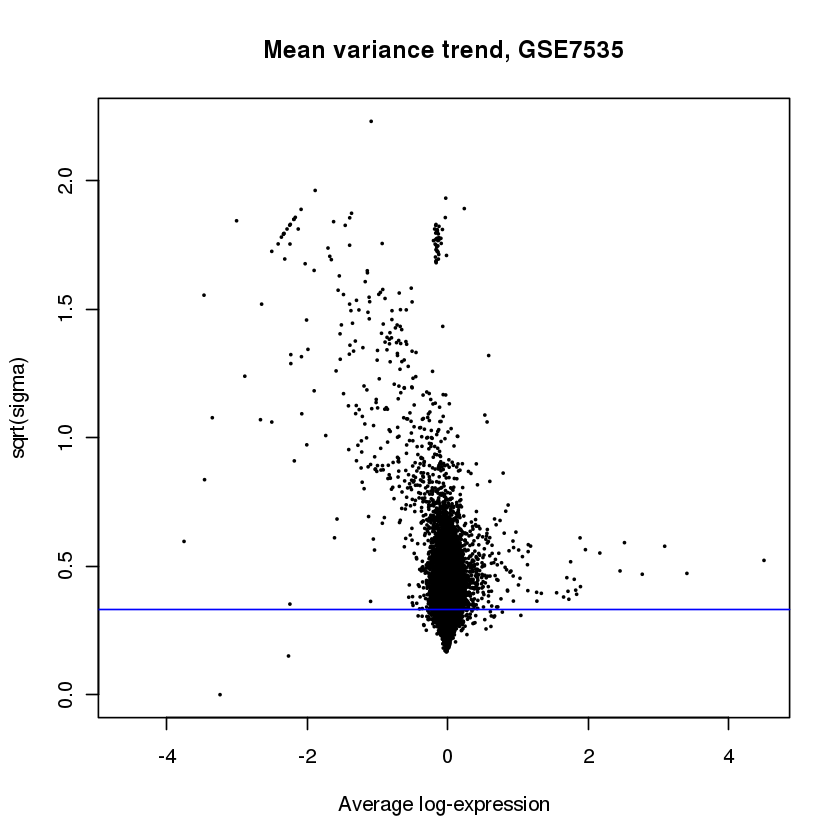

In [57]:
plotSA(GSE7535_obj$fit2, main=paste("Mean variance trend, ", "GSE7535", sep=""))

#### Extracting Human Orthologs of DEGs

In [60]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE7535_obj$tT2), sep=" "))
transcriptToGene <- pData(featureData(GSE7535_obj$gset))
totalTranscripts <- transcriptToGene[transcriptToGene$ID %in% GSE7535_obj$tT2$ID,]

GSE7535_avail_symbols <- totalTranscripts[totalTranscripts$Gene.symbol !=  "" &
                                                totalTranscripts$Gene.symbol !=  "no hit" ,]

GSE7535_transcript_id_to_ho_dict <- data.frame("transcriptGenes" = GSE7535_avail_symbols$Gene.symbol,
                                 "transcriptIDS" = GSE7535_avail_symbols$ID)

GSE7535_lfc_genes <- filter_transcripts(GSE7535_obj, GSE7535_transcript_id_to_ho_dict,
                                         "celegans_stress_GSE7535", celegans, "external_gene_name",
                                          "GSE7535", "logFC",pval=0.05, homology_confidence = F)

[1] "Total Transcripts: 20408"
[1] "Total celegans_stress_GSE7535 transcripts with Available Human Orthologs: 4656"
[1] "Total celegans_stress_GSE7535 transcripts with Available Human Ortholog Gene Symbols: 1485"
[1] "Total celegans_stress_GSE7535 genes with Available Human Ortholog Gene Symbols and in Background gene sets: 1480"
[1] "Total transcripts after orthologous mapping and filtering: 1484"
[1] "Total significant transcripts after orthologous mapping and filtering: 71"
[1] "################################"
[1] "logFC LogFC"
[1] "Total transcripts with negative logFC vals: 32"
[1] "Total transcripts with positive logFC vals: 41"
[1] "Total significant downregulated celegans_stress_GSE7535 genes after orthologous mapping and filtering: 30"
[1] "Total significant upregulated celegans_stress_GSE7535 genes after orthologous mapping and filtering: 39"
[1] "Total significant Final downregulated human othologs: 79"
[1] "Total significant Final upregulated human othologs: 71"
[1] "logF

### GSE21008

#### Data Download and Normalization

Found 1 file(s)

GSE21008_series_matrix.txt.gz


── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_double(),
  ID_REF = col_character()
)
ℹ Use `spec()` for the full column specifications.


Warning message in download.file(myurl, destfile, mode = mode, quiet = TRUE, method = getOption("download.file.method.GEOquery")):
“cannot open URL 'https://ftp.ncbi.nlm.nih.gov/geo/platforms/GPL10nnn/GPL10238/annot/GPL10238.annot.gz': HTTP status was '404 Not Found'”
Annotation GPL not available, so will use submitter GPL instead

File stored at: 

/tmp/RtmpFkfKoa/GPL10238.soft



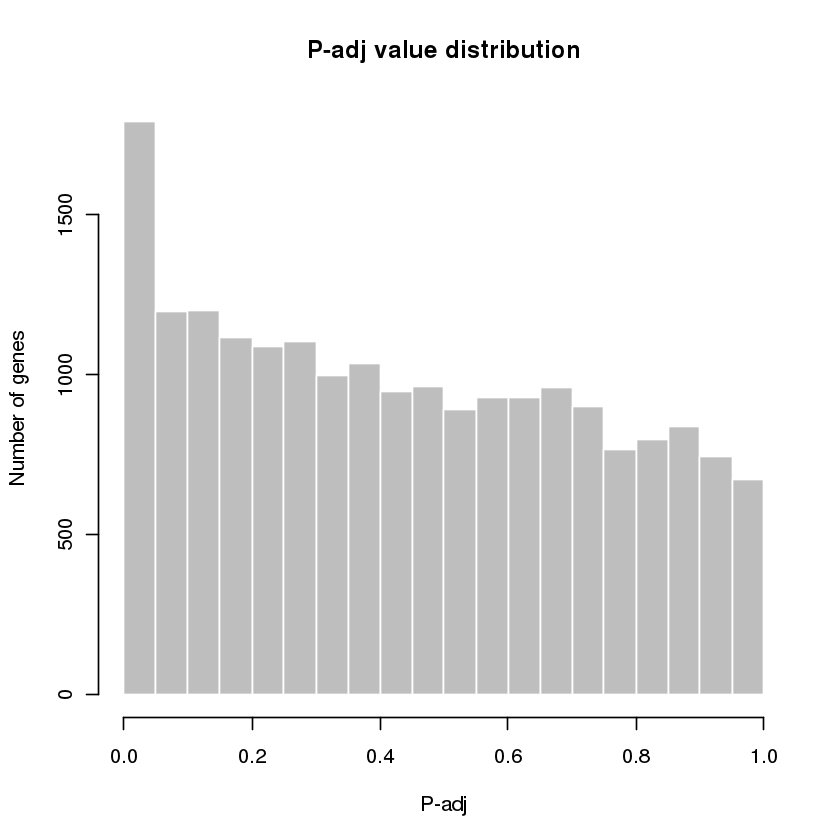

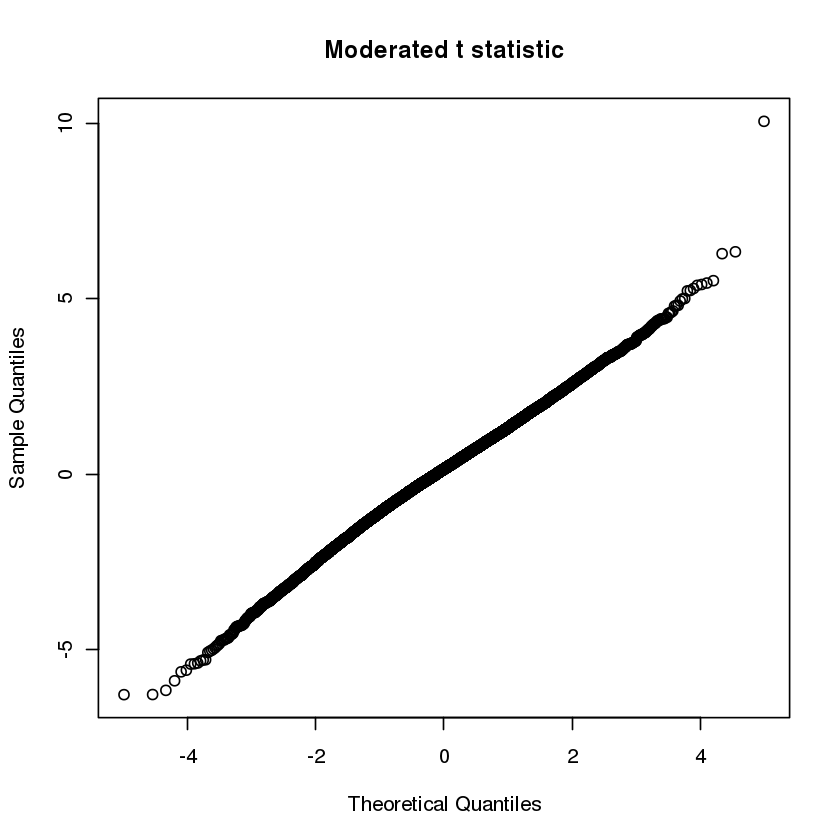

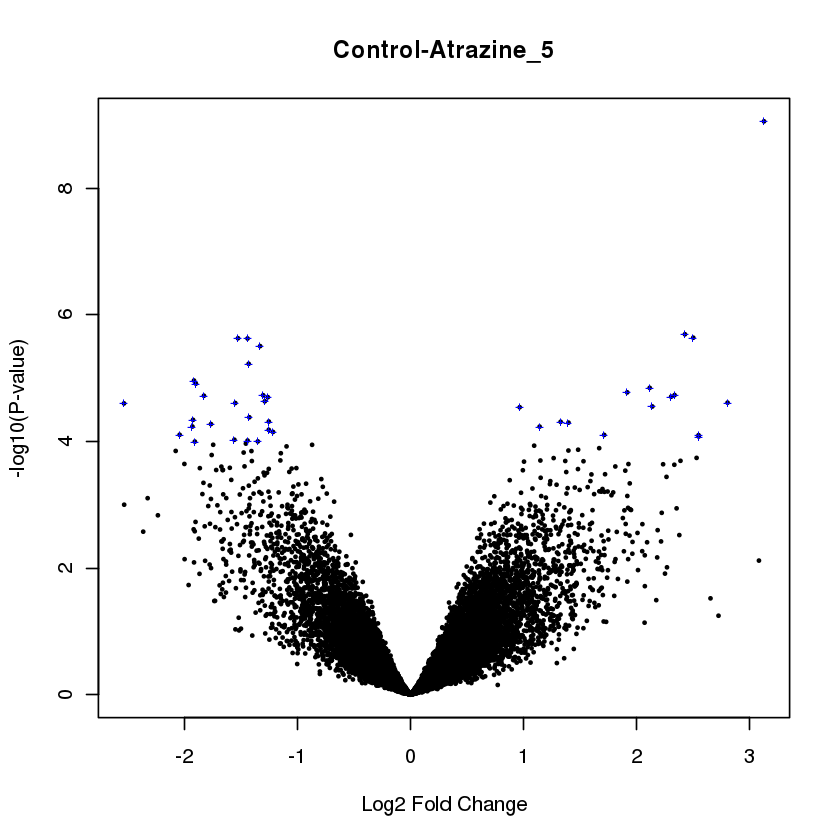

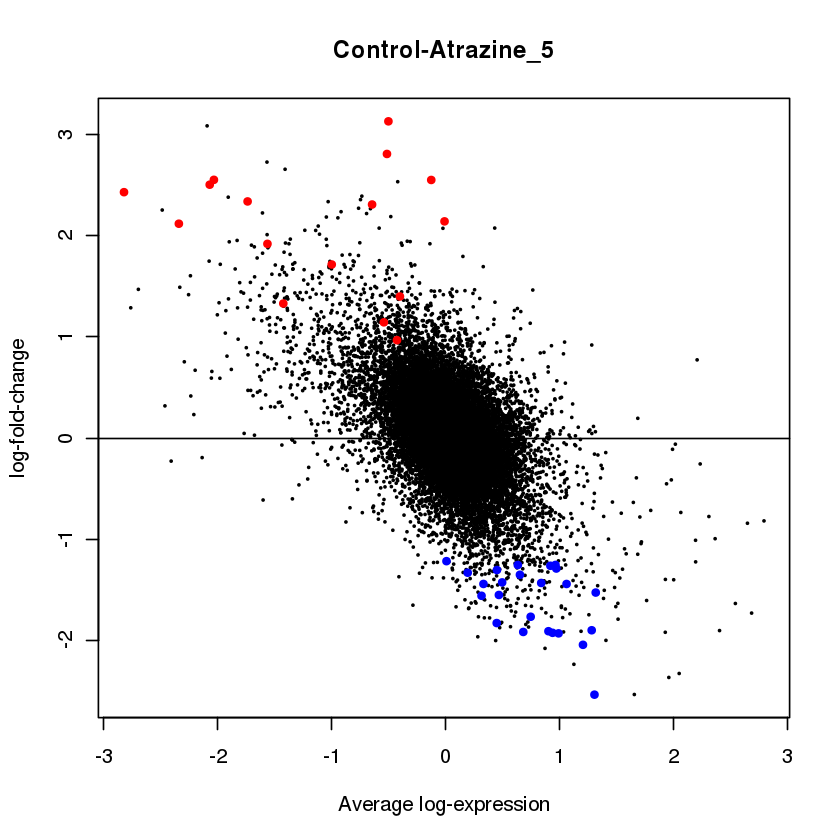

In [56]:
GSE21008_obj <- getDEG("GSE21008", "GPL10238", "00000111112222333344444",
                        c("ORF","SP_ACC","SPOT_ID"), T,
                       c("Control","Atrazine_5","Atrazine_25","Atrazine_75","Atrazine_150"))

#### Gene Expression Data analysis

##### box-and-whisker plots

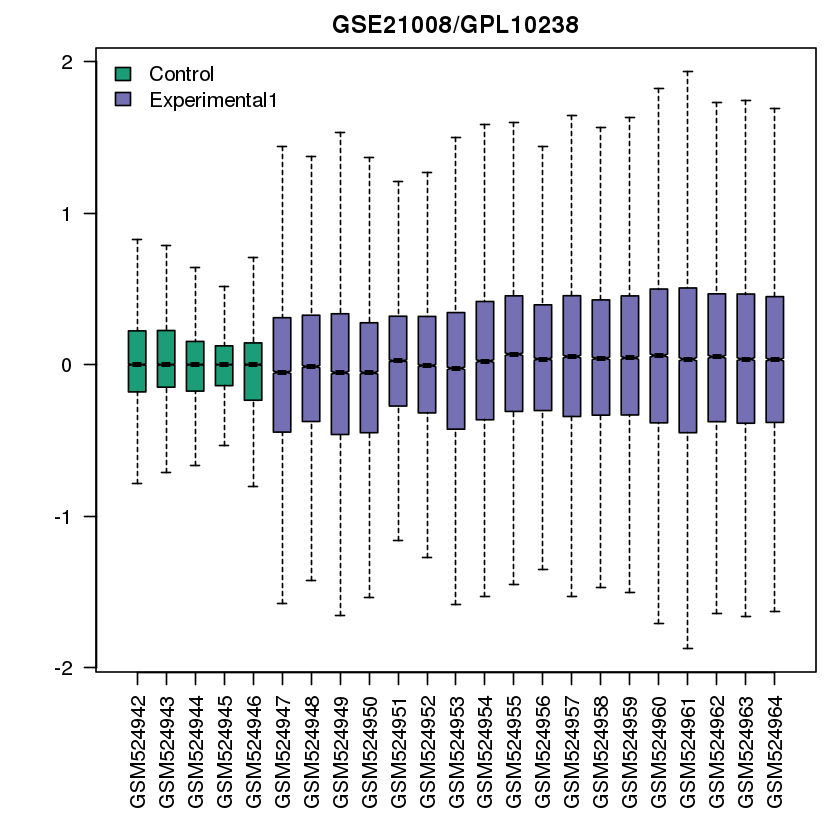

In [108]:
box_and_whisker_gset("GSE21008", GSE21008_obj$gset, GSE21008_obj$sampleGroups, GSE21008_obj$gsetExprs,F)

##### expression value distribution

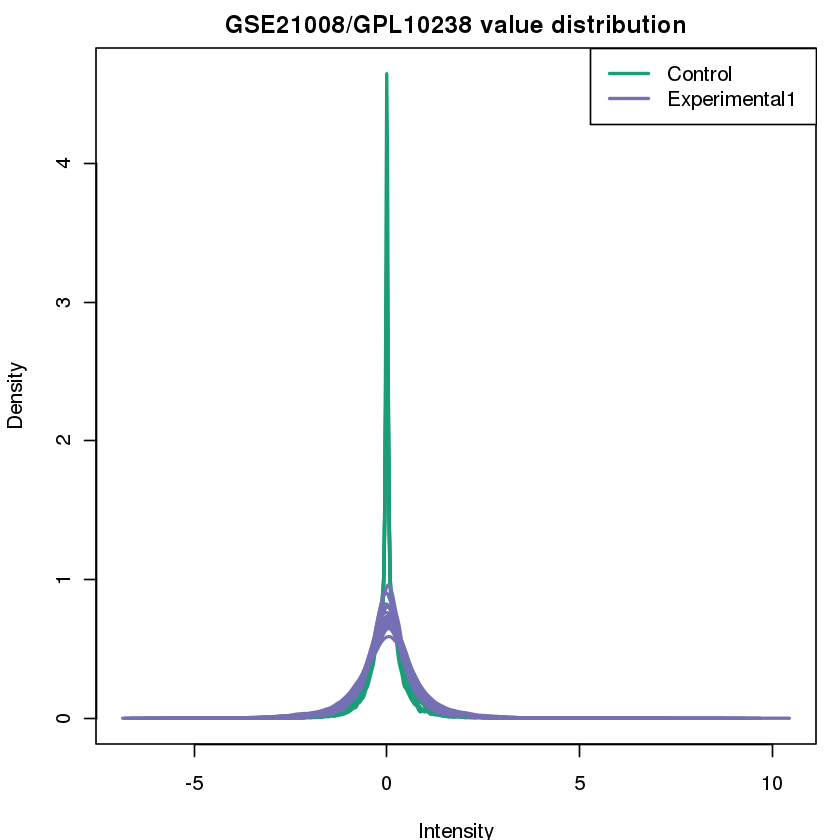

In [109]:
exp_val_dist_gset("GSE21008", GSE21008_obj$gset, GSE21008_obj$sampleGroups, GSE21008_obj$gsetExprs,F)

##### UMAP plot

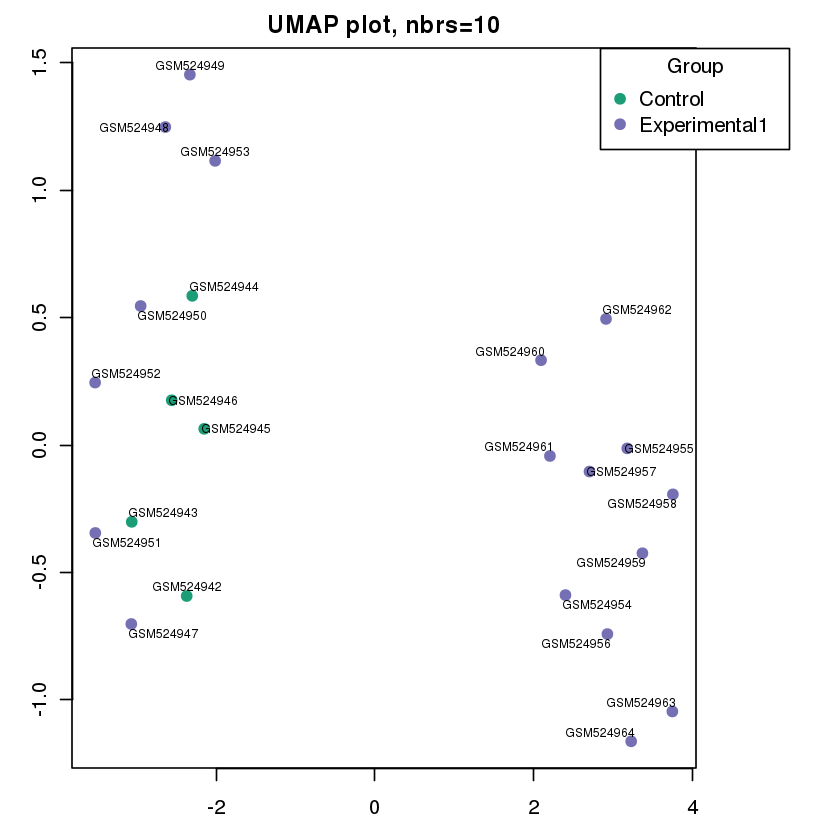

In [110]:
getUMAP_gset(GSE21008_obj$gsetExprs, 10, GSE21008_obj$sampleGroups,F)

##### mean-variance trend

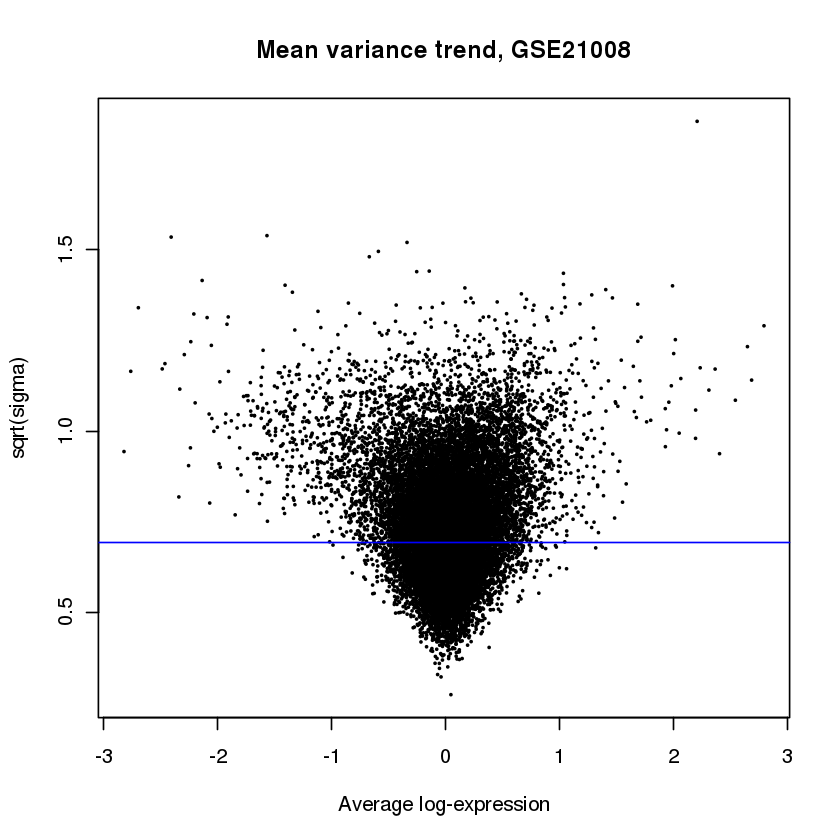

In [111]:
plotSA(GSE21008_obj$fit2, main=paste("Mean variance trend, ", "GSE21008", sep=""))

#### Extracting Human Orthologs of DEGs

In [57]:
names(GSE21008_obj$tT2)

[1] "ID"                       "Gene_Symbol"             
 [3] "Description"              "Interprot_ID"            
 [5] "WB_Gene_ID"               "ORF"                     
 [7] "WB_Wormpep_ID"            "SP_ACC"                  
 [9] "SPOT_ID"                  "Control.Atrazine_5"      
[11] "Control.Atrazine_25"      "Control.Atrazine_75"     
[13] "Control.Atrazine_150"     "Atrazine_5.Atrazine_25"  
[15] "Atrazine_5.Atrazine_75"   "Atrazine_5.Atrazine_150" 
[17] "Atrazine_25.Atrazine_75"  "Atrazine_25.Atrazine_150"
[19] "Atrazine_75.Atrazine_150" "AveExpr"                 
[21] "F"                        "P.Value"                 
[23] "adj.P.Val"

In [58]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE21008_obj$tT2), sep=" "))
transcriptToGene <- pData(featureData(GSE21008_obj$gset))
totalTranscripts <- transcriptToGene[transcriptToGene$ID %in% GSE21008_obj$tT2$ID,]

GSE21008_avail_symbols <- totalTranscripts[totalTranscripts$WB_Gene_ID !=  "" &
                                                totalTranscripts$WB_Gene_ID !=  "no hit" ,]

GSE21008_transcript_id_to_ho_dict <- data.frame("transcriptGenes" = GSE21008_avail_symbols$WB_Gene_ID,
                                 "transcriptIDS" = GSE21008_avail_symbols$ID)
GSE21008_lfc_columns<-c('Control.Atrazine_5','Control.Atrazine_25','Control.Atrazine_75',
                        'Control.Atrazine_150','Atrazine_5.Atrazine_25','Atrazine_5.Atrazine_75',
                        'Atrazine_5.Atrazine_150','Atrazine_25.Atrazine_75','Atrazine_25.Atrazine_150',
                        'Atrazine_75.Atrazine_150')

GSE21008_lfc_genes <- filter_transcripts(GSE21008_obj, GSE21008_transcript_id_to_ho_dict,
                                         "celegans_stress_GSE21008", celegans, "wormbase_gene",
                                          "GSE21008", GSE21008_lfc_columns,
                                          pval=0.05, homology_confidence = F)

[1] "Total Transcripts: 19873"
[1] "Total celegans_stress_GSE21008 transcripts with Available Human Orthologs: 22030"
[1] "Total celegans_stress_GSE21008 transcripts with Available Human Ortholog Gene Symbols: 6046"
[1] "Total celegans_stress_GSE21008 genes with Available Human Ortholog Gene Symbols and in Background gene sets: 6032"
[1] "Total transcripts after orthologous mapping and filtering: 6445"
[1] "Total significant transcripts after orthologous mapping and filtering: 540"
[1] "################################"
[1] "Control.Atrazine_5 LogFC"
[1] "Total transcripts with negative logFC vals: 211"
[1] "Total transcripts with positive logFC vals: 329"
[1] "Total significant downregulated celegans_stress_GSE21008 genes after orthologous mapping and filtering: 211"
[1] "Total significant upregulated celegans_stress_GSE21008 genes after orthologous mapping and filtering: 327"
[1] "Total significant Final downregulated human othologs: 579"
[1] "Total significant Final upregulated huma

### GSE38997

#### Data Download and Normalization

Found 1 file(s)

GSE38997_series_matrix.txt.gz


── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_double(),
  ID_REF = col_character()
)
ℹ Use `spec()` for the full column specifications.


File stored at: 

/tmp/RtmpFkfKoa/GPL200.annot.gz



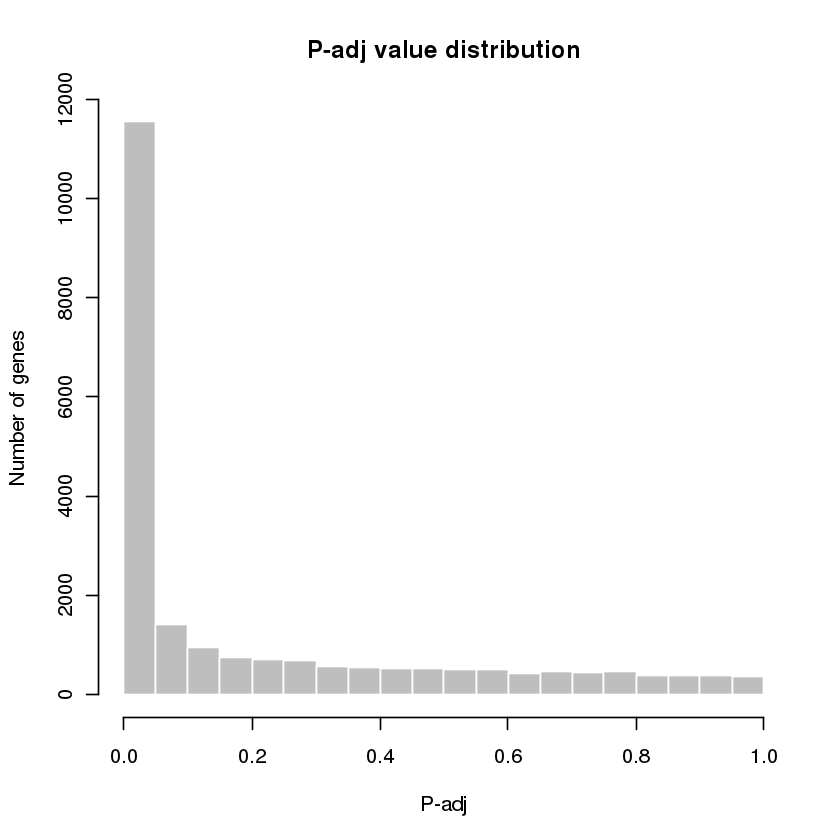

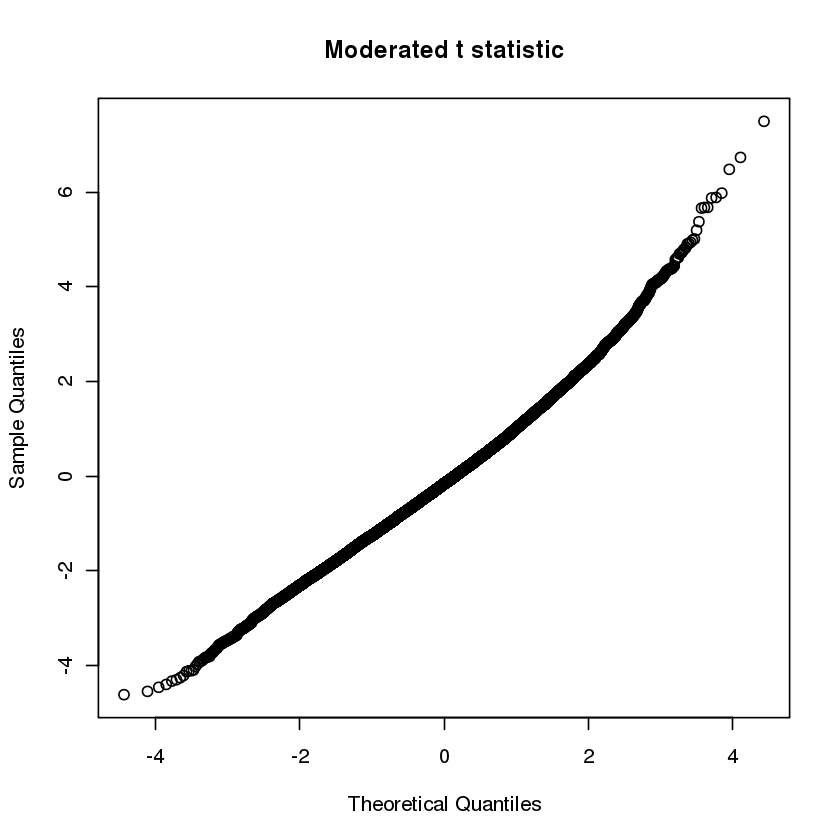

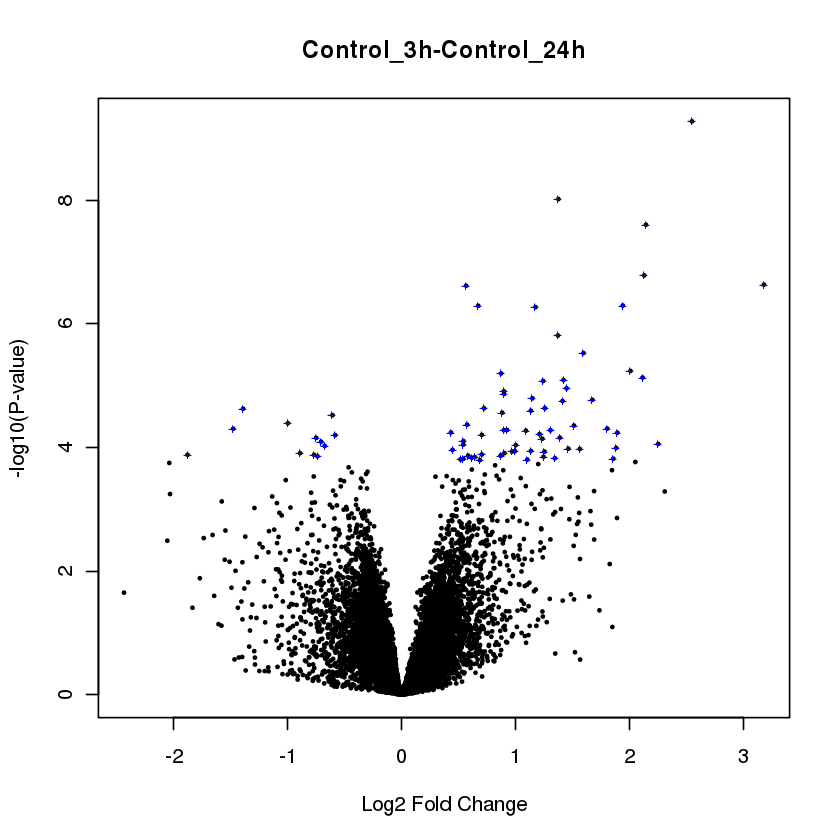

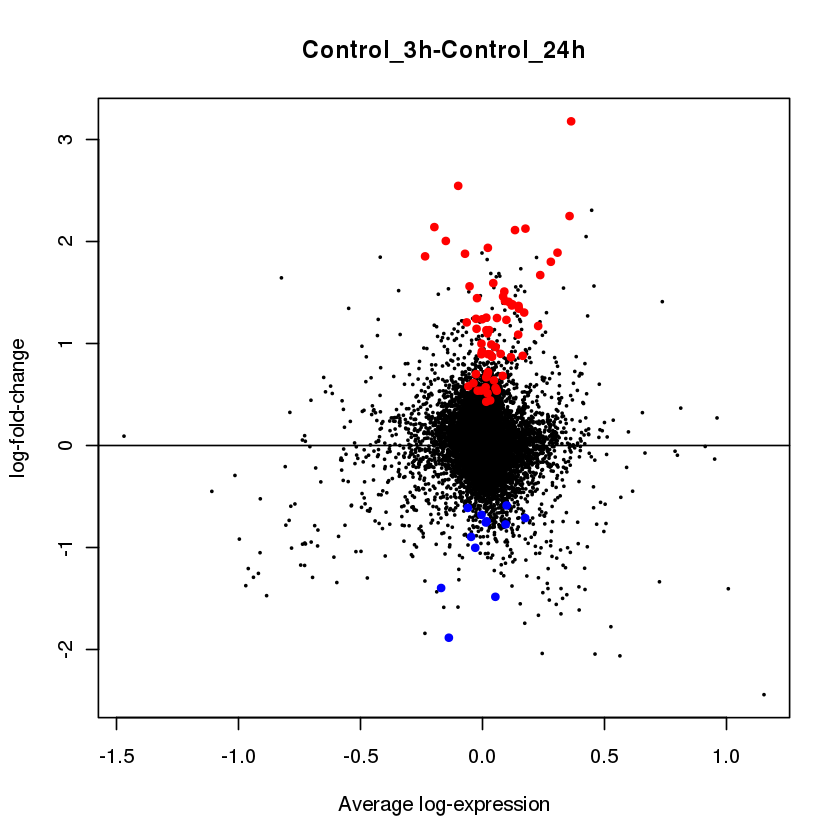

In [61]:
GSE38997_obj <- getDEG("GSE38997", "GPL200", "2E6A3F7B37B0C481D592E6A3F7B0C481D592EA3F7B0C481D592A7B0C481D592E6A3FB",
                        c("Gene.symbol","Gene.title"), T,
                       c("Control_3h","Control_24h","Control_48h","Control_51h",
                         "EtBr_3h","EtBr_24h","EtBr_48h","EtBr_51h",
                         "UVC_EtBr_3h","UVC_EtBr_24h","UVC_EtBr_48h","UVC_EtBr_51h",
                         "UVC_3h","UVC_24h","UVC_48h","UVC_51h"))

#### Gene Expression Data analysis

##### box-and-whisker plots

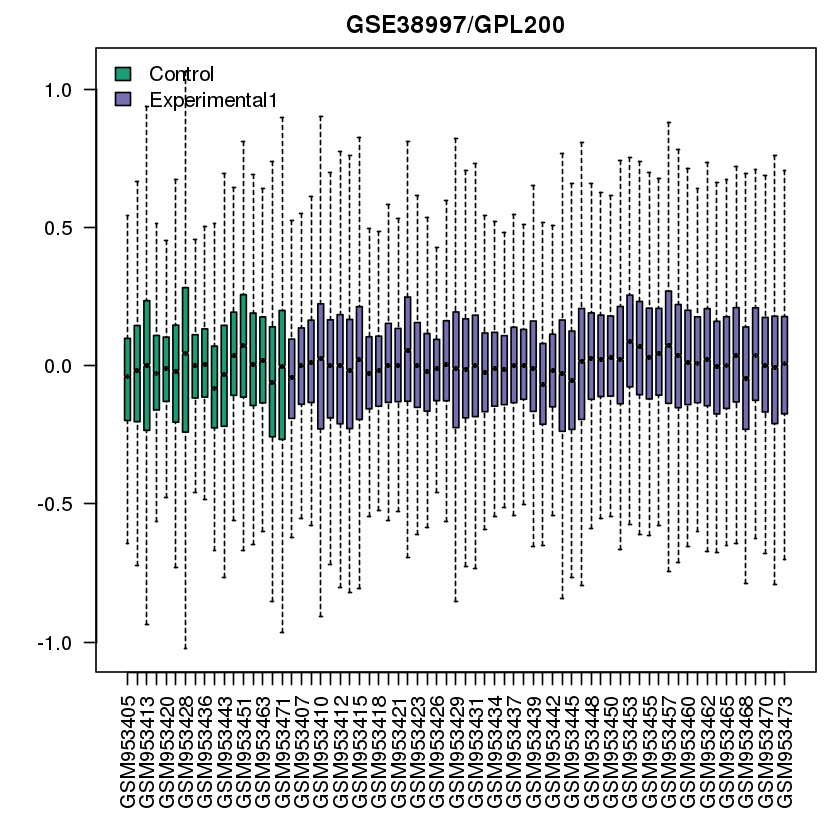

In [16]:
box_and_whisker_gset("GSE38997", GSE38997_obj$gset, GSE38997_obj$sampleGroups, GSE38997_obj$gsetExprs,F)

##### expression value distribution

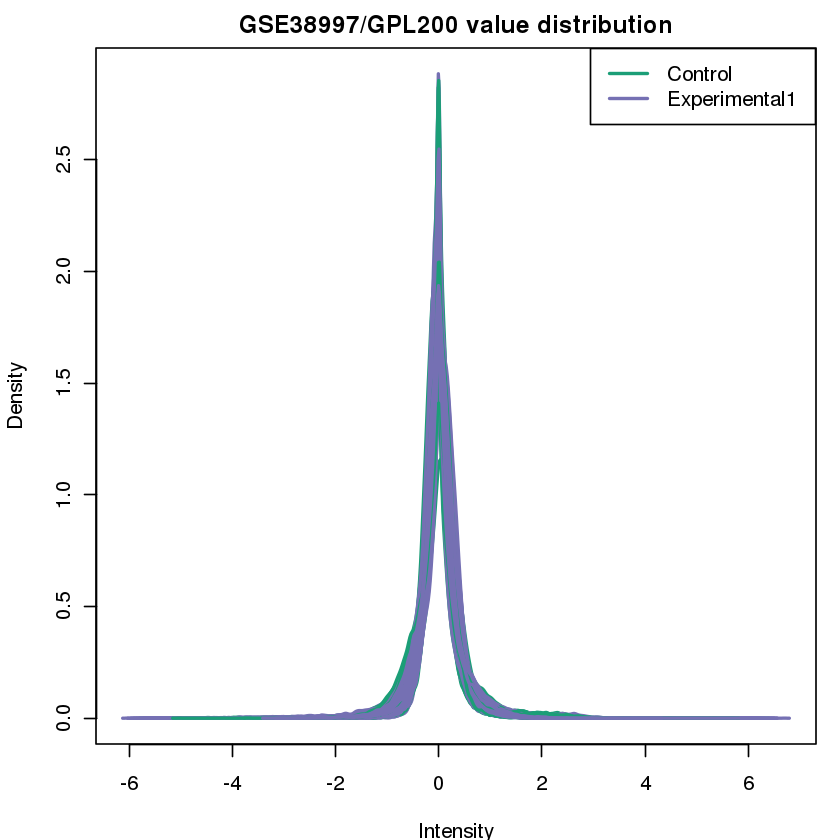

In [17]:
exp_val_dist_gset("GSE38997", GSE38997_obj$gset, GSE38997_obj$sampleGroups, GSE38997_obj$gsetExprs,F)

##### UMAP plot

Loading required package: sp


Attaching package: ‘sp’


The following object is masked from ‘package:IRanges’:

    %over%


Checking rgeos availability: TRUE



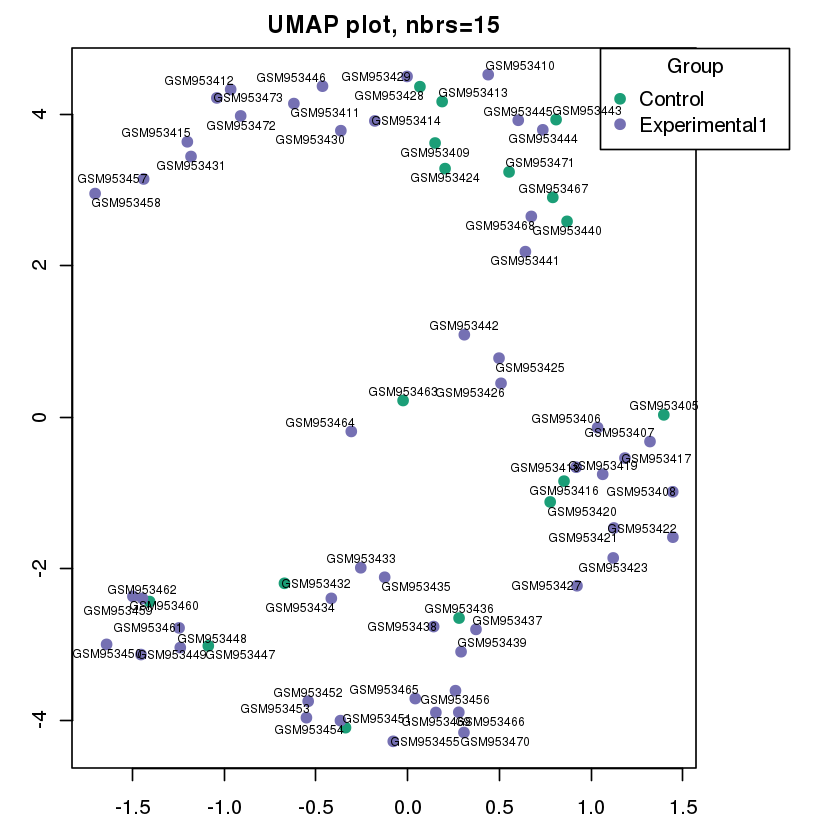

In [18]:
getUMAP_gset(GSE38997_obj$gsetExprs, 15, GSE38997_obj$sampleGroups,F)

##### mean-variance trend

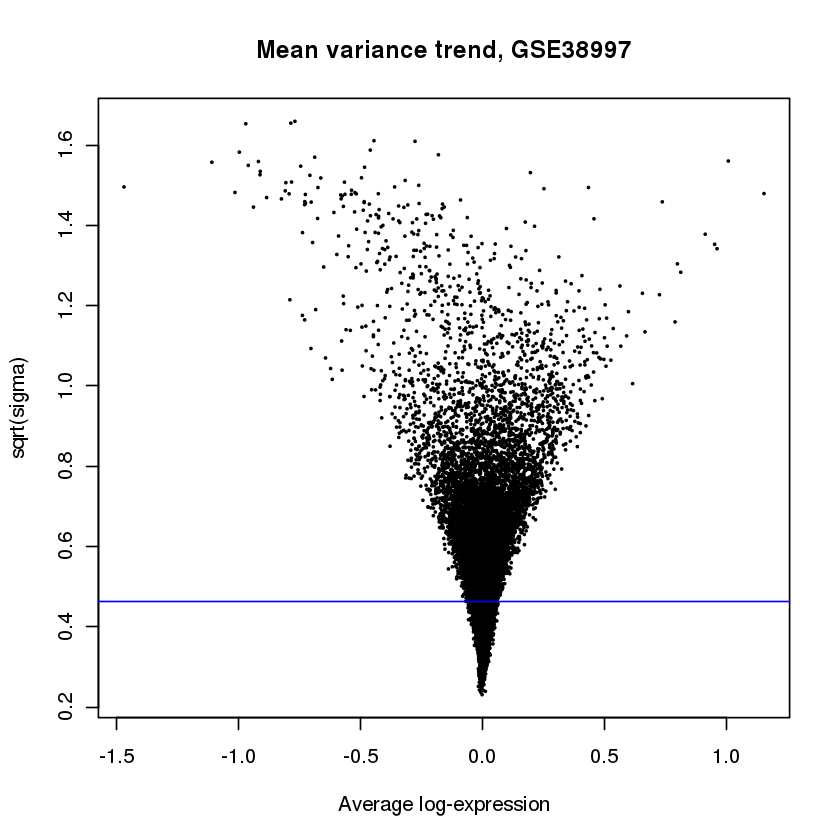

In [19]:
plotSA(GSE38997_obj$fit2, main=paste("Mean variance trend, ", "GSE38997", sep=""))

#### Extracting Human Orthologs of DEGs

In [62]:
names(GSE38997_obj$tT2)

[1] "ID"                        "Gene.title"               
  [3] "Gene.symbol"               "Gene.ID"                  
  [5] "UniGene.title"             "UniGene.symbol"           
  [7] "UniGene.ID"                "Nucleotide.Title"         
  [9] "GI"                        "GenBank.Accession"        
 [11] "Platform_CLONEID"          "Platform_ORF"             
 [13] "Platform_SPOTID"           "Chromosome.location"      
 [15] "Chromosome.annotation"     "GO.Function"              
 [17] "GO.Process"                "GO.Component"             
 [19] "GO.Function.ID"            "GO.Process.ID"            
 [21] "GO.Component.ID"           "Control_3h.Control_24h"   
 [23] "Control_3h.Control_48h"    "Control_3h.Control_51h"   
 [25] "Control_3h.EtBr_3h"        "Control_3h.EtBr_24h"      
 [27] "Control_3h.EtBr_48h"       "Control_3h.EtBr_51h"      
 [29] "Control_3h.UVC_EtBr_3h"    "Control_3h.UVC_EtBr_24h"  
 [31] "Control_3h.UVC_EtBr_48h"   "Control_3h.UVC_EtBr_51h"  
 [33] "Control_3h.UVC_3h"         "Control_3h.UVC_24h"       
 [35] "Control_3h.UVC_48h"        "Control_3h.UVC_51h"       
 [37] "Control_24h.Control_48h"   "Control_24h.Control_51h"  
 [39] "Control_24h.EtBr_3h"       "Control_24h.EtBr_24h"     
 [41] "Control_24h.EtBr_48h"      "Control_24h.EtBr_51h"     
 [43] "Control_24h.UVC_EtBr_3h"   "Control_24h.UVC_EtBr_24h" 
 [45] "Control_24h.UVC_EtBr_48h"  "Control_24h.UVC_EtBr_51h" 
 [47] "Control_24h.UVC_3h"        "Control_24h.UVC_24h"      
 [49] "Control_24h.UVC_48h"       "Control_24h.UVC_51h"      
 [51] "Control_48h.Control_51h"   "Control_48h.EtBr_3h"      
 [53] "Control_48h.EtBr_24h"      "Control_48h.EtBr_48h"     
 [55] "Control_48h.EtBr_51h"      "Control_48h.UVC_EtBr_3h"  
 [57] "Control_48h.UVC_EtBr_24h"  "Control_48h.UVC_EtBr_48h" 
 [59] "Control_48h.UVC_EtBr_51h"  "Control_48h.UVC_3h"       
 [61] "Control_48h.UVC_24h"       "Control_48h.UVC_48h"      
 [63] "Control_48h.UVC_51h"       "Control_51h.EtBr_3h"      
 [65] "Control_51h.EtBr_24h"      "Control_51h.EtBr_48h"     
 [67] "Control_51h.EtBr_51h"      "Control_51h.UVC_EtBr_3h"  
 [69] "Control_51h.UVC_EtBr_24h"  "Control_51h.UVC_EtBr_48h" 
 [71] "Control_51h.UVC_EtBr_51h"  "Control_51h.UVC_3h"       
 [73] "Control_51h.UVC_24h"       "Control_51h.UVC_48h"      
 [75] "Control_51h.UVC_51h"       "EtBr_3h.EtBr_24h"         
 [77] "EtBr_3h.EtBr_48h"          "EtBr_3h.EtBr_51h"         
 [79] "EtBr_3h.UVC_EtBr_3h"       "EtBr_3h.UVC_EtBr_24h"     
 [81] "EtBr_3h.UVC_EtBr_48h"      "EtBr_3h.UVC_EtBr_51h"     
 [83] "EtBr_3h.UVC_3h"            "EtBr_3h.UVC_24h"          
 [85] "EtBr_3h.UVC_48h"           "EtBr_3h.UVC_51h"          
 [87] "EtBr_24h.EtBr_48h"         "EtBr_24h.EtBr_51h"        
 [89] "EtBr_24h.UVC_EtBr_3h"      "EtBr_24h.UVC_EtBr_24h"    
 [91] "EtBr_24h.UVC_EtBr_48h"     "EtBr_24h.UVC_EtBr_51h"    
 [93] "EtBr_24h.UVC_3h"           "EtBr_24h.UVC_24h"         
 [95] "EtBr_24h.UVC_48h"          "EtBr_24h.UVC_51h"         
 [97] "EtBr_48h.EtBr_51h"         "EtBr_48h.UVC_EtBr_3h"     
 [99] "EtBr_48h.UVC_EtBr_24h"     "EtBr_48h.UVC_EtBr_48h"    
[101] "EtBr_48h.UVC_EtBr_51h"     "EtBr_48h.UVC_3h"          
[103] "EtBr_48h.UVC_24h"          "EtBr_48h.UVC_48h"         
[105] "EtBr_48h.UVC_51h"          "EtBr_51h.UVC_EtBr_3h"     
[107] "EtBr_51h.UVC_EtBr_24h"     "EtBr_51h.UVC_EtBr_48h"    
[109] "EtBr_51h.UVC_EtBr_51h"     "EtBr_51h.UVC_3h"          
[111] "EtBr_51h.UVC_24h"          "EtBr_51h.UVC_48h"         
[113] "EtBr_51h.UVC_51h"          "UVC_EtBr_3h.UVC_EtBr_24h" 
[115] "UVC_EtBr_3h.UVC_EtBr_48h"  "UVC_EtBr_3h.UVC_EtBr_51h" 
[117] "UVC_EtBr_3h.UVC_3h"        "UVC_EtBr_3h.UVC_24h"      
[119] "UVC_EtBr_3h.UVC_48h"       "UVC_EtBr_3h.UVC_51h"      
[121] "UVC_EtBr_24h.UVC_EtBr_48h" "UVC_EtBr_24h.UVC_EtBr_51h"
[123] "UVC_EtBr_24h.UVC_3h"       "UVC_EtBr_24h.UVC_24h"     
[125] "UVC_EtBr_24h.UVC_48h"      "UVC_EtBr_24h.UVC_51h"     
[127] "UVC_EtBr_48h.UVC_EtBr_51h" "UVC_EtBr_48h.UVC_3h"      
[129] "UVC_EtBr_48h.UVC_24h"      

In [63]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE38997_obj$tT2), sep=" "))
transcriptToGene <- pData(featureData(GSE38997_obj$gset))
totalTranscripts <- transcriptToGene[transcriptToGene$ID %in% GSE38997_obj$tT2$ID,]

viable_transcripts <- 0
viable_transcripts_ids <- character(0)
total_transcript_genes <- character(0)
for(i in 1:nrow(totalTranscripts)) {
    current_string <- totalTranscripts$'Gene.symbol'[i]
    if(length(current_string) < 1) {next}
    
    ensemblIDs <- unlist(strsplit(current_string, "///"))
    # remove weird  symbols
    
    if(is.null(ensemblIDs)) {next}
    if(length(ensemblIDs) < 1) {next}
    viable_transcripts <- viable_transcripts+1
    viable_transcripts_ids <- append(viable_transcripts_ids, rep(totalTranscripts$ID[i],
                                                                 length(ensemblIDs)), length(viable_transcripts_ids))
    total_transcript_genes <- append(total_transcript_genes, ensemblIDs, length(total_transcript_genes))
}

transcript_id_dict <- data.frame("transcriptGenes" = total_transcript_genes, "transcriptIDS" = viable_transcripts_ids)

print(paste("Total transcripts with an associated Celegans gene:", viable_transcripts, sep=" "))
print(paste("Total associated Celegans genes:", length(total_transcript_genes), sep=" "))

GSE38997_lfc_columns<-c('Control_3h.UVC_EtBr_3h','Control_3h.UVC_3h','Control_3h.EtBr_3h',
                        'Control_24h.UVC_EtBr_24h','Control_24h.UVC_24h','Control_24h.EtBr_24h',
                        'Control_48h.UVC_EtBr_48h','Control_48h.UVC_48h','Control_48h.EtBr_48h',
                        'Control_51h.UVC_EtBr_51h','Control_51h.UVC_51h','Control_51h.EtBr_51h',
                       'EtBr_3h.EtBr_24h','EtBr_3h.EtBr_48h','EtBr_3h.EtBr_51h','EtBr_3h.UVC_EtBr_3h',
                       'EtBr_3h.UVC_3h','EtBr_24h.EtBr_48h','EtBr_24h.EtBr_51h','EtBr_24h.UVC_EtBr_24h',
                       'EtBr_24h.UVC_24h','EtBr_48h.EtBr_51h','EtBr_48h.UVC_EtBr_48h','EtBr_48h.UVC_48h',
                       'EtBr_51h.UVC_EtBr_51h','EtBr_51h.UVC_51h','UVC_EtBr_3h.UVC_EtBr_24h',
                        'UVC_EtBr_3h.UVC_EtBr_48h','UVC_EtBr_3h.UVC_EtBr_51h','UVC_EtBr_3h.UVC_3h',
                       'UVC_EtBr_24h.UVC_EtBr_48h','UVC_EtBr_24h.UVC_EtBr_51h','UVC_EtBr_24h.UVC_24h',
                       'UVC_EtBr_48h.UVC_EtBr_51h','UVC_EtBr_48h.UVC_48h','UVC_EtBr_51h.UVC_51h',
                        'UVC_3h.UVC_24h','UVC_3h.UVC_48h','UVC_3h.UVC_51h','UVC_24h.UVC_48h',
                        'UVC_24h.UVC_51h','UVC_48h.UVC_51h')

GSE38997_lfc_genes <- filter_transcripts(GSE38997_obj, transcript_id_dict,
                                         "celegans_stress_GSE38997", celegans, "external_gene_name",
                                          "GSE38997", GSE38997_lfc_columns,
                                         pval=0.05, homology_confidence = F)

[1] "Total Transcripts: 22625"
[1] "Total transcripts with an associated Celegans gene: 21970"
[1] "Total associated Celegans genes: 23152"
[1] "Total celegans_stress_GSE38997 transcripts with Available Human Orthologs: 22555"
[1] "Total celegans_stress_GSE38997 transcripts with Available Human Ortholog Gene Symbols: 6020"
[1] "Total celegans_stress_GSE38997 genes with Available Human Ortholog Gene Symbols and in Background gene sets: 6007"
[1] "Total transcripts after orthologous mapping and filtering: 7854"
[1] "Total significant transcripts after orthologous mapping and filtering: 4753"
[1] "################################"
[1] "Control_3h.UVC_EtBr_3h LogFC"
[1] "Total transcripts with negative logFC vals: 2367"
[1] "Total transcripts with positive logFC vals: 2386"
[1] "Total significant downregulated celegans_stress_GSE38997 genes after orthologous mapping and filtering: 2173"
[1] "Total significant upregulated celegans_stress_GSE38997 genes after orthologous mapping and filterin

### GSE41366

#### Data Download and Normalization

In [64]:
GSE41366_obj <- getDEG("GSE41366", "GPL200", paste0("01101101101101101101101101101101101100110110110110",
        "11011011011011011011011001101101101101101011011011",
        "01101101100 HaCats11011011011011011011011011011011011"),
                        c("Gene.symbol","Gene.title"), T)

Found 1 file(s)

GSE41366_series_matrix.txt.gz


── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_double(),
  ID_REF = col_character()
)
ℹ Use `spec()` for the full column specifications.


Using locally cached version of GPL200 found here:
/tmp/RtmpFkfKoa/GPL200.annot.gz 



ERROR: Error in make.names(exp_design): argument "exp_design" is missing, with no default


#### Gene Expression Data analysis

##### box-and-whisker plots

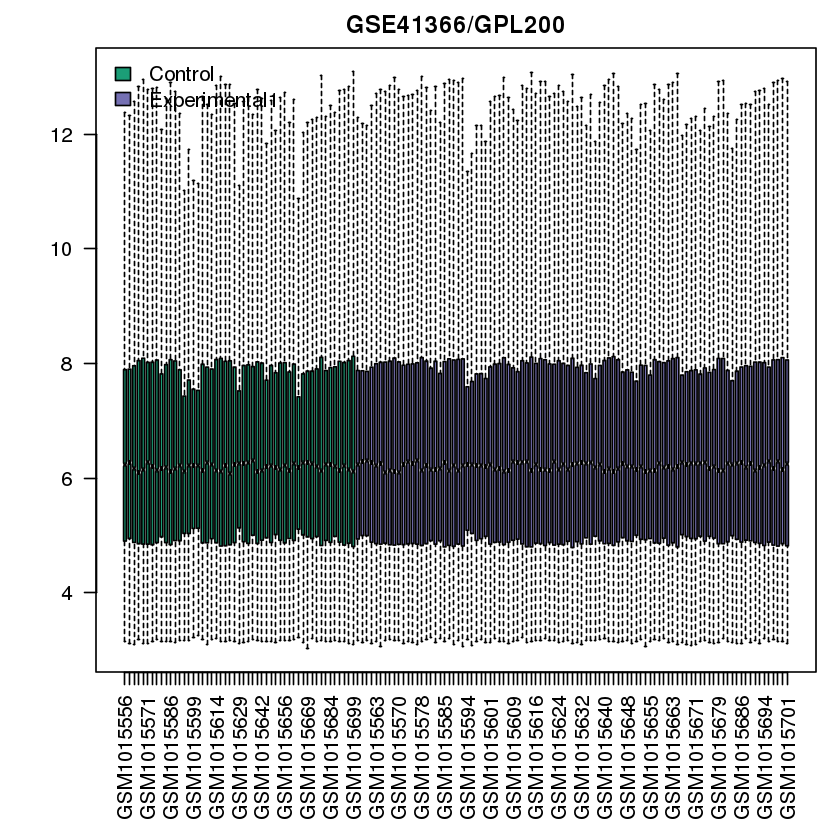

In [35]:
box_and_whisker_gset("GSE41366", GSE41366_obj$gset, GSE41366_obj$sampleGroups, GSE41366_obj$gsetExprs,F)

##### expression value distribution

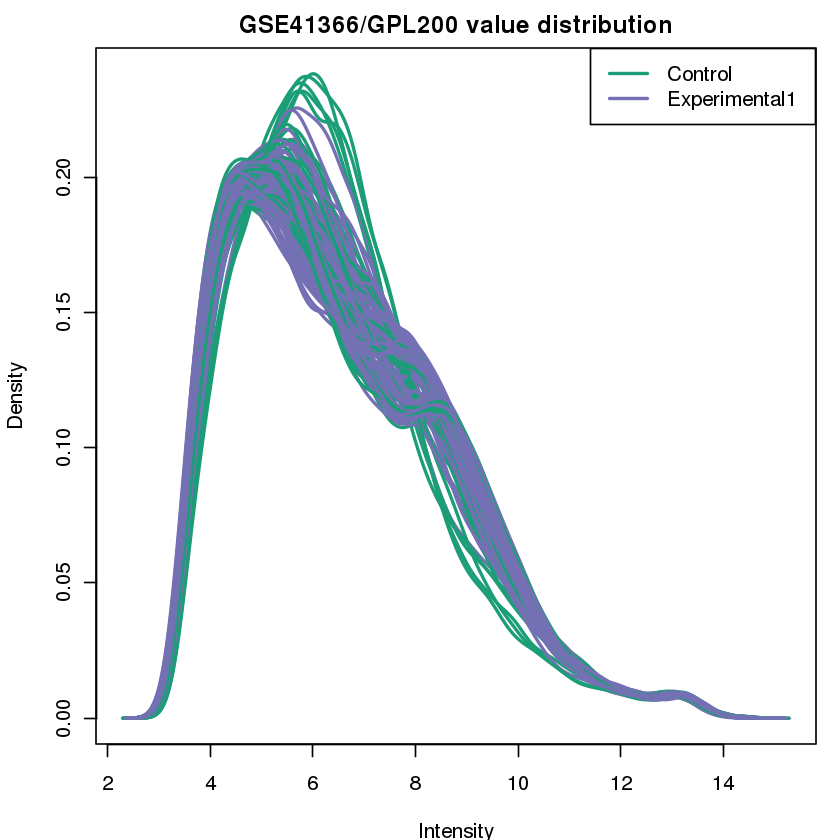

In [36]:
exp_val_dist_gset("GSE41366", GSE41366_obj$gset, GSE41366_obj$sampleGroups, GSE41366_obj$gsetExprs,F)

##### UMAP plot

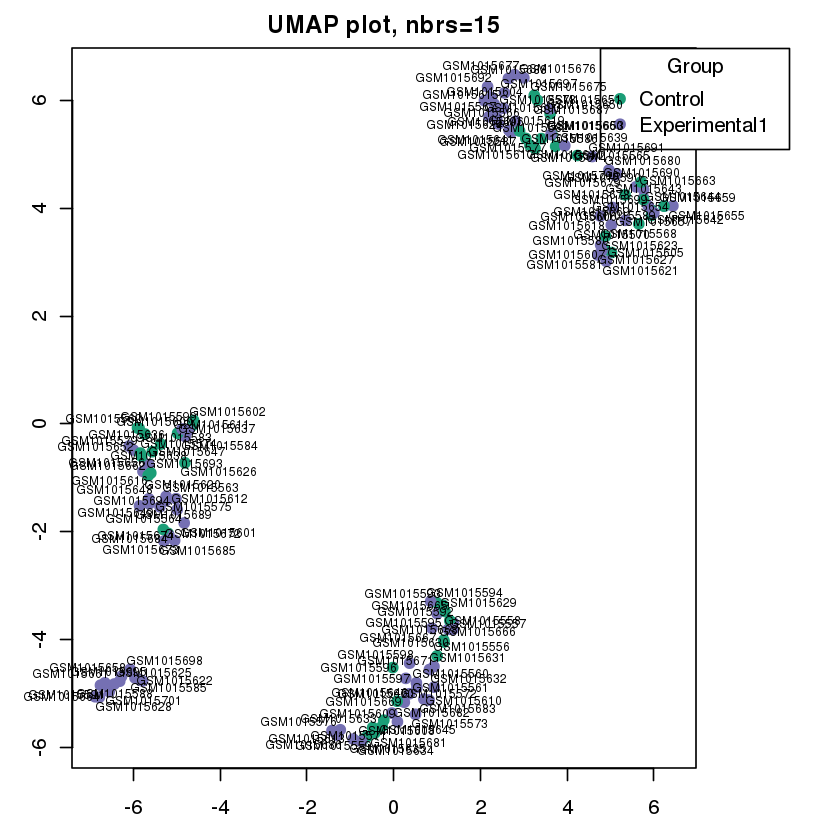

In [37]:
getUMAP_gset(GSE41366_obj$gsetExprs, 15, GSE41366_obj$sampleGroups,F)

##### mean-variance trend

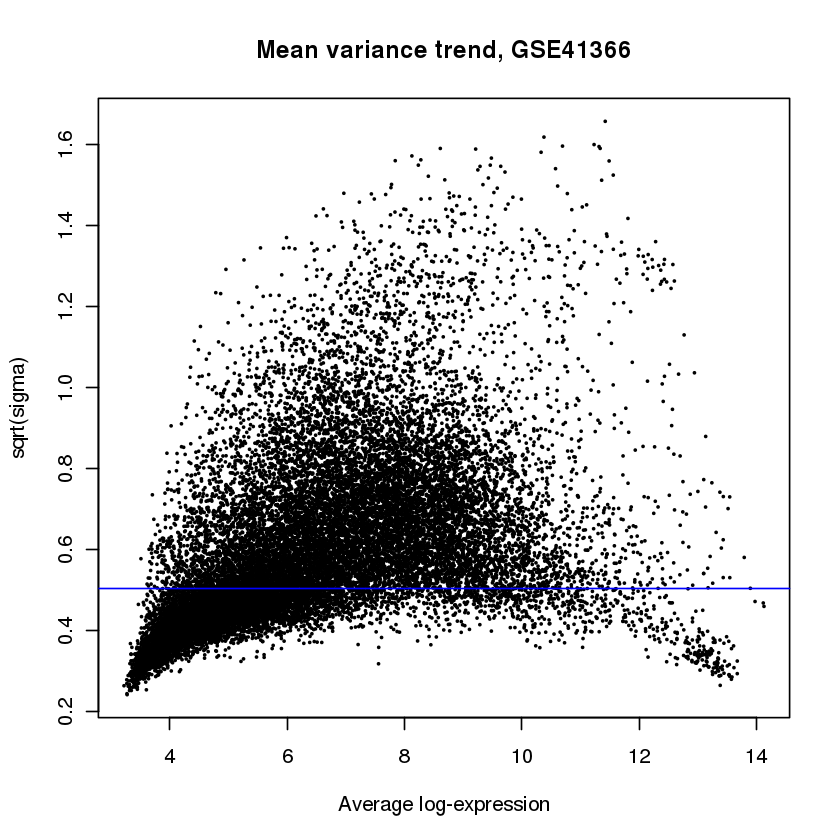

In [38]:
plotSA(GSE41366_obj$fit2, main=paste("Mean variance trend, ", "GSE41366", sep=""))

#### Extracting Human Orthologs of DEGs

In [ ]:
names(GSE41366_obj$tT2)

In [151]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE41366_obj$tT2), sep=" "))
transcriptToGene <- pData(featureData(GSE41366_obj$gset))
totalTranscripts <- transcriptToGene[transcriptToGene$ID %in% GSE41366_obj$tT2$ID,]

viable_transcripts <- 0
viable_transcripts_ids <- character(0)
total_transcript_genes <- character(0)
for(i in 1:nrow(totalTranscripts)) {
    current_string <- totalTranscripts$'Gene.symbol'[i]
    if(length(current_string) < 1) {next}
    
    ensemblIDs <- unlist(strsplit(current_string, "///"))
    # remove weird  symbols
    
    if(is.null(ensemblIDs)) {next}
    if(length(ensemblIDs) < 1) {next}
    viable_transcripts <- viable_transcripts+1
    viable_transcripts_ids <- append(viable_transcripts_ids, rep(totalTranscripts$ID[i],
                                                                 length(ensemblIDs)), length(viable_transcripts_ids))
    total_transcript_genes <- append(total_transcript_genes, ensemblIDs, length(total_transcript_genes))
}

transcript_id_dict <- data.frame("transcriptGenes" = total_transcript_genes, "transcriptIDS" = viable_transcripts_ids)

print(paste("Total transcripts with an associated Celegans gene:", viable_transcripts, sep=" "))
print(paste("Total associated Celegans genes:", length(total_transcript_genes), sep=" "))

GSE41366_lfc_genes <- filter_transcripts(GSE41366_obj, transcript_id_dict,
                                         "celegans_stress_GSE41366", celegans, "external_gene_name",
                                          "GSE41366", pval=0.05, homology_confidence = F)

[1] "Total Transcripts: 22625"
[1] "Total transcripts with an associated Celegans gene: 21970"
[1] "Total associated Celegans genes: 23152"
[1] "Total Nematode_GSE41366 transcripts with Available Human Orthologs: 22555"
[1] "Total Nematode_GSE41366 transcripts with Available Human Ortholog Gene Symbols: 6020"
[1] "Total Nematode_GSE41366 genes with Available Human Ortholog Gene Symbols and in Background gene sets: 6007"
[1] "Total transcripts after orthologous mapping and filtering: 7854"
[1] "Total significant transcripts after orthologous mapping and filtering: 141"
[1] "Total transcripts with negative logFC vals: 104"
[1] "Total transcripts with positive logFC vals: 37"
[1] "Total significant downregulated Nematode_GSE41366 genes after orthologous mapping and filtering: 101"
[1] "Total significant upregulated Nematode_GSE41366 genes after orthologous mapping and filtering: 36"
[1] "Total significant Final downregulated human othologs: 269"
[1] "Total significant Final upregulated hu

In [152]:
getDataRanges(GSE41366_lfc_genes$transcript_qvals)

[1] 1.082584e-08 4.940946e-02
[1] -1.03230775 -0.09887619
[1] 0.06557488 0.60154187


### GSE46343 - hsapiens - HaCats

Found 1 file(s)

GSE46343_series_matrix.txt.gz


── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  ID_REF = col_character(),
  GSM1128827 = col_double(),
  GSM1128828 = col_double(),
  GSM1128829 = col_double(),
  GSM1128830 = col_double(),
  GSM1128831 = col_double(),
  GSM1128832 = col_double(),
  GSM1128833 = col_double(),
  GSM1128834 = col_double(),
  GSM1128835 = col_double(),
  GSM1128836 = col_double(),
  GSM1128837 = col_double()
)


Warning message in download.file(myurl, destfile, mode = mode, quiet = TRUE, method = getOption("download.file.method.GEOquery")):
“cannot open URL 'https://ftp.ncbi.nlm.nih.gov/geo/platforms/GPL8nnn/GPL8971/annot/GPL8971.annot.gz': HTTP status was '404 Not Found'”
Annotation GPL not available, so will use submitter GPL instead

File stored at: 

/lscratch/36040237/RtmpD6MD3u/GPL8971.soft



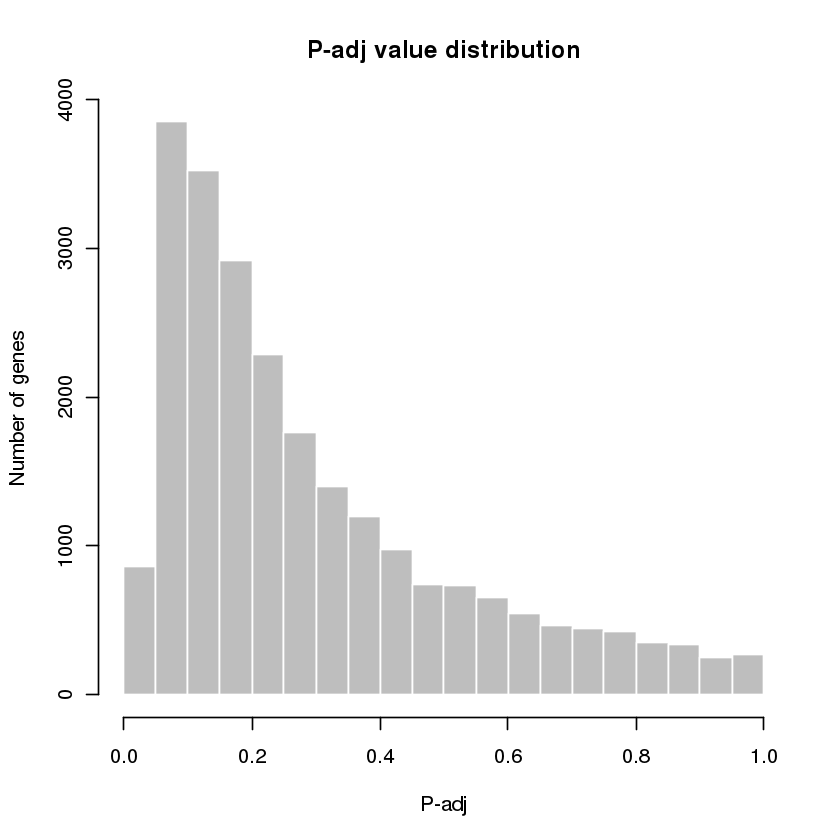

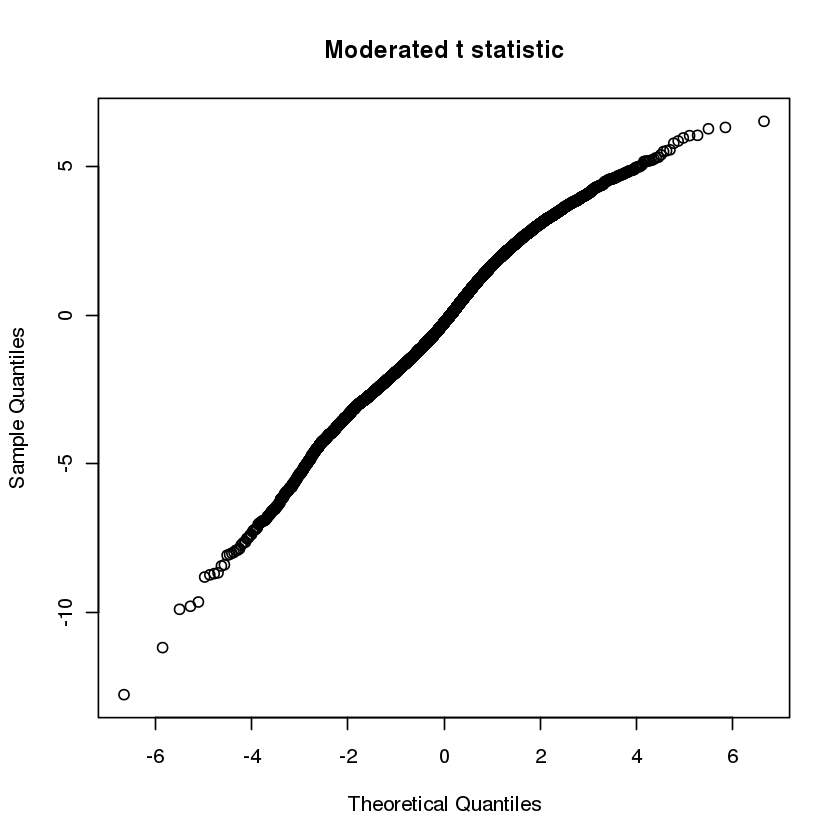

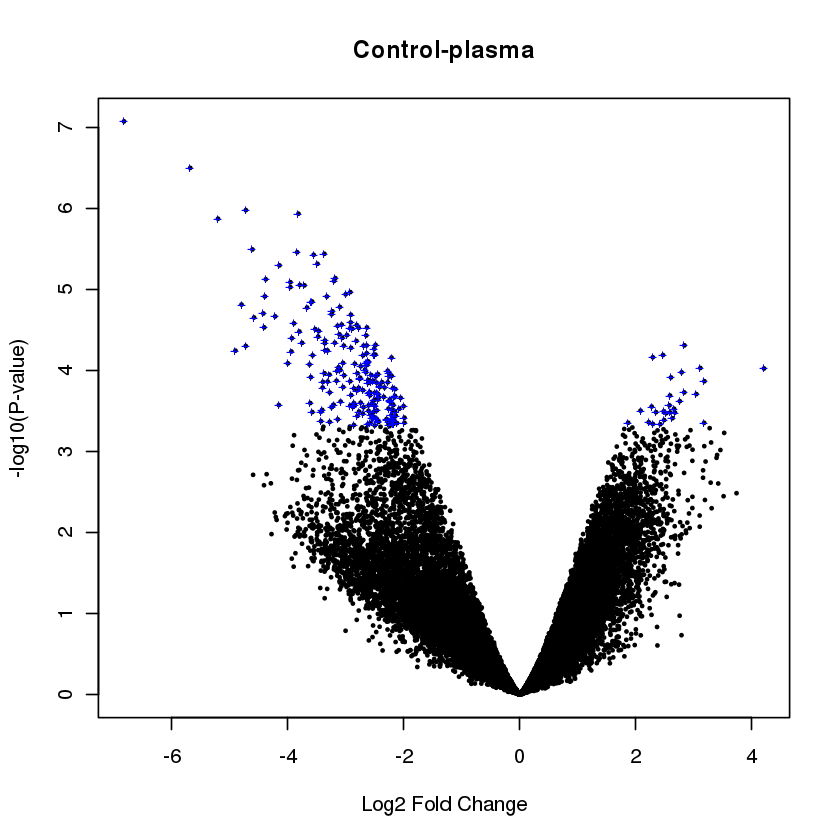

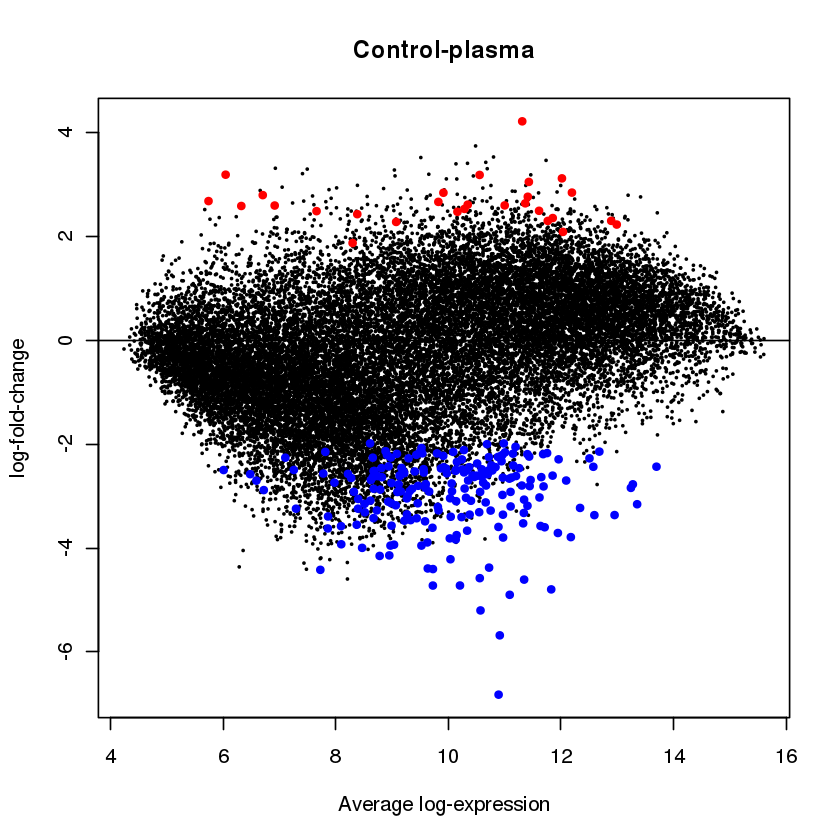

In [15]:
GSE46343_obj <- getDEG("GSE46343", "GPL8971", "00111122223",
                        c("ID"), T,
                       c("Control","plasma","peroxide","negative control"))

#### Gene Expression data analysis

##### box-and-whisker plot

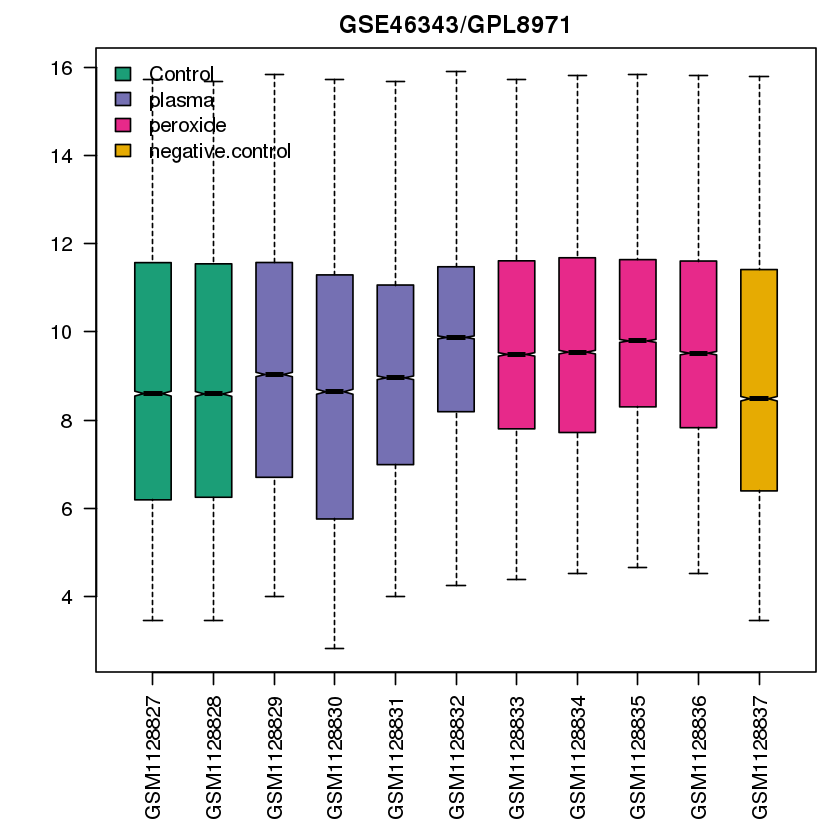

In [16]:
box_and_whisker_gset("GSE46343", GSE46343_obj$gset, GSE46343_obj$sampleGroups, GSE46343_obj$gsetExprs,F)

##### expression value distribution

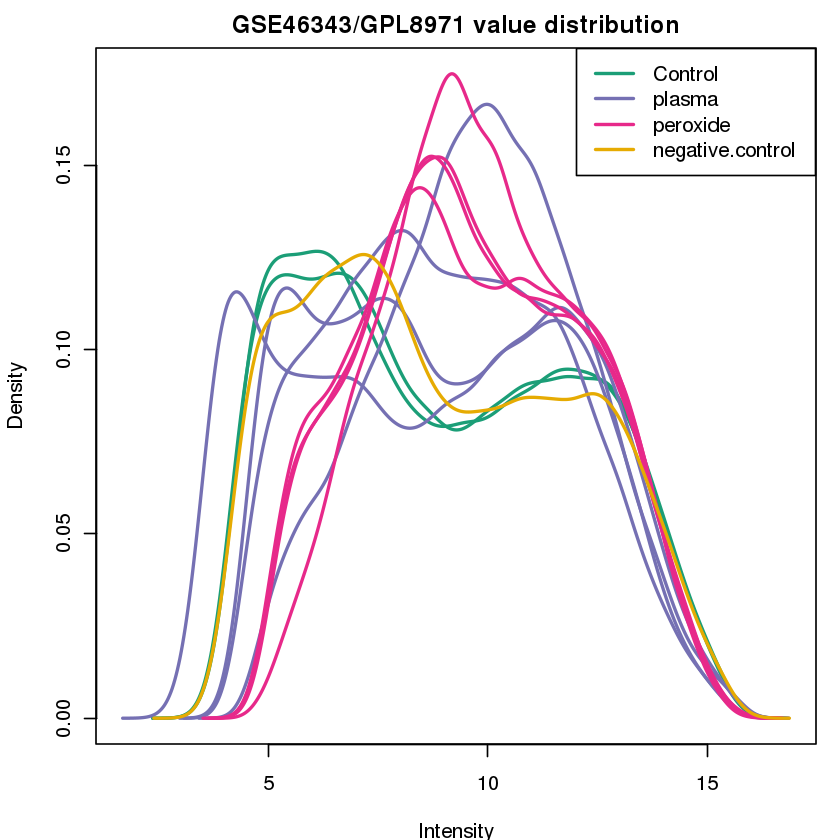

In [17]:
exp_val_dist_gset("GSE46343", GSE46343_obj$gset, GSE46343_obj$sampleGroups, GSE46343_obj$gsetExprs,F)

##### UMAP plot

Loading required package: sp


Attaching package: ‘sp’


The following object is masked from ‘package:IRanges’:

    %over%


Checking rgeos availability: TRUE



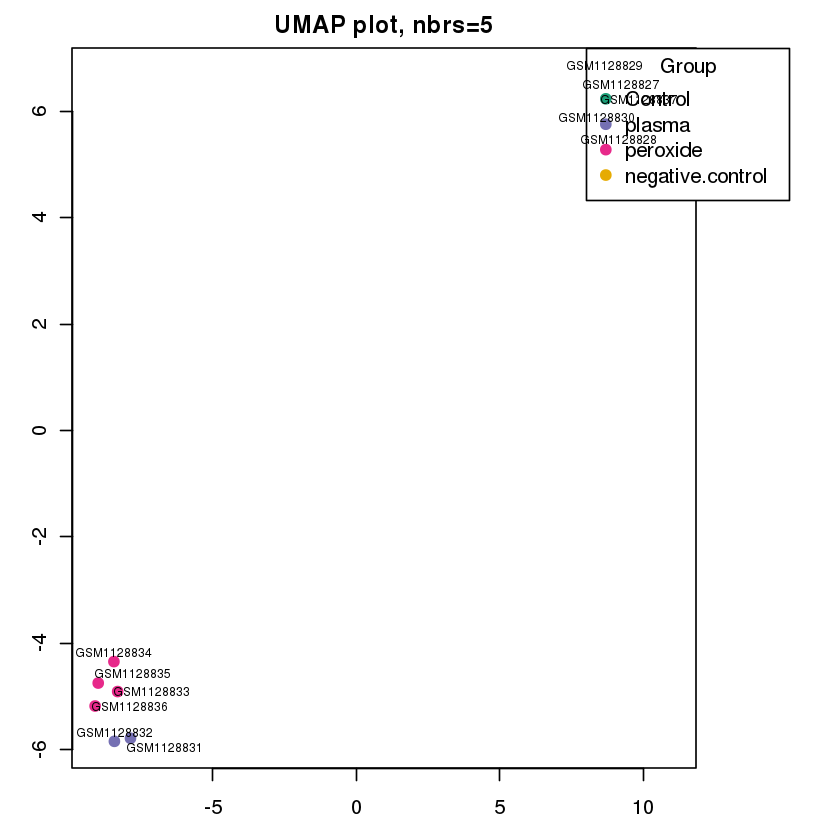

In [18]:
getUMAP_gset(GSE46343_obj$gsetExprs, 5, GSE46343_obj$sampleGroups,F)

##### mean-variance trend

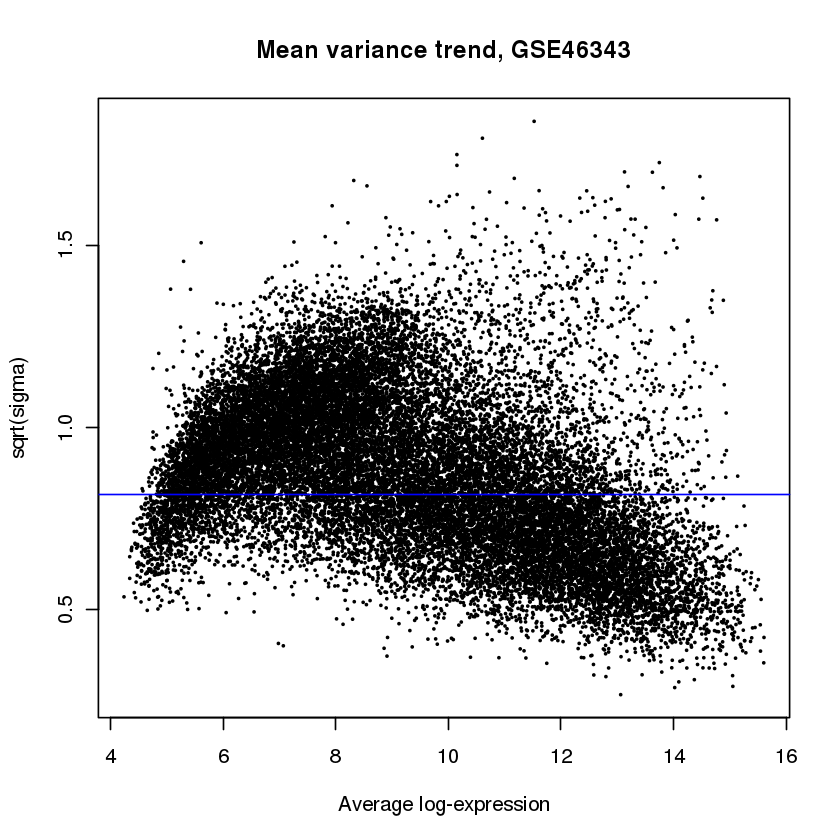

In [19]:
plotSA(GSE46343_obj$fit2, main=paste("Mean variance trend, ", "GSE46343", sep=""))

#### Extracting Human Orthologs of DEGs

In [20]:
head(GSE46343_obj$tT2$ID)

[1] "NM_005322"    "NM_001348"    "NM_005321"    "NM_001001977" "NM_205841"   
[6] "NM_003514"

In [28]:
hatts <-listAttributes(human)
hatts[grep('RefSeq',hatts$description),]

GSE46343_transcript_to_gene <- getLDS(attributes="refseq_mrna", filters="refseq_mrna",
                          values=GSE46343_obj$tT2$ID,
                          mart=human,attributesL=c("hgnc_symbol","ensembl_gene_id"),
                          martL=human)

GSE46343_transcript_id_to_gene_dict <- data.frame("transcriptGenes" = GSE46343_transcript_to_gene$'HGNC.symbol',
                                 "transcriptIDS" = GSE46343_transcript_to_gene$'RefSeq.mRNA.ID')

,name,description,page
,<chr>,<chr>,<chr>
22,transcript_mane_select,RefSeq match transcript (MANE Select),feature_page
23,transcript_mane_plus_clinical,RefSeq match transcript (MANE Plus Clinical),feature_page
86,refseq_mrna,RefSeq mRNA ID,feature_page
87,refseq_mrna_predicted,RefSeq mRNA predicted ID,feature_page
88,refseq_ncrna,RefSeq ncRNA ID,feature_page
89,refseq_ncrna_predicted,RefSeq ncRNA predicted ID,feature_page
90,refseq_peptide,RefSeq peptide ID,feature_page
91,refseq_peptide_predicted,RefSeq peptide predicted ID,feature_page


In [30]:
head(GSE46343_obj$tT2)

,ID,GB_ACC,BUILD,FEAT_TYPE,CHROMOSOME,START,STOP,Control.plasma,Control.peroxide,Control.negative.control,plasma.peroxide,plasma.negative.control,peroxide.negative.control,AveExpr,F,P.Value,adj.P.Val
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
NM_005322,NM_005322,NM_005322,HG18;NCBI Build 36,transcript,chr6,27942548,27943338,-6.8210528,-4.959319,-0.42990465,1.8617335,6.391148,4.529415,10.892949,69.27916,2.740759e-07,0.006577821
NM_001348,NM_001348,NM_001348,HG18;NCBI Build 36,transcript,chr19,3909451,3920826,-3.8144455,-3.172806,0.78870710,0.6416391,4.603153,3.961514,10.026010,52.75041,1.075761e-06,0.008766076
NM_005321,NM_005321,NM_005321,HG18;NCBI Build 36,transcript,chr6,26264537,26265322,-5.6799697,-3.858813,-0.30351808,1.8211566,5.376452,3.555295,10.913822,52.55539,1.095760e-06,0.008766076
NM_001001977,NM_001001977,NM_001001977,HG18;NCBI Build 36,transcript,chr20,57037127,57040817,-3.0693617,1.074110,0.06761111,4.1434722,3.136973,-1.006499,11.345431,47.38485,1.830390e-06,0.009214008
NM_205841,NM_205841,NM_205841,HG18;NCBI Build 36,transcript,chr5,147562596,147574893,-0.7461004,-3.769404,0.54455374,-3.0233040,1.290654,4.313958,6.384978,46.93006,1.919585e-06,0.009214008
NM_003514,NM_003514,NM_003514,HG18;NCBI Build 36,transcript,chr6,27968455,27968942,-4.7210702,-2.423595,-0.42409830,2.2974749,4.296972,1.999497,10.206870,39.92252,4.239768e-06,0.014581430


In [32]:
# access transcript definitions
print(paste("Total Transcripts:", nrow(GSE46343_obj$tT2), sep=" "))
GSE46343_totalGenes <- GSE46343_obj$tT2[,c("ID")]
GSE46343_avail_symbols <- GSE46343_totalGenes[GSE46343_totalGenes !=  ""]
print(paste("Total Transcripts with available symbols:", length(GSE46343_avail_symbols), sep=" "))

GSE46343_lfc_columns<- c("Control.plasma", "Control.peroxide",
                         "Control.negative.control", "plasma.peroxide",
                         "plasma.negative.control", "peroxide.negative.control")

GSE46343_lfc_genes <- filter_transcripts(GSE46343_obj, GSE46343_transcript_id_to_gene_dict,
                                         "hsapiens_stress_GSE46343", human, "hgnc_symbol", "GSE46343",
                                          GSE46343_lfc_columns, pval=.05, homology_confidence = F)

[1] "Total Transcripts: 24000"
[1] "Total Transcripts with available symbols: 24000"
[1] "Total hsapiens_stress_GSE46343 transcripts with Available Human Orthologs: 19562"
[1] "Total hsapiens_stress_GSE46343 transcripts with Available Human Ortholog Gene Symbols: 17251"
[1] "Total hsapiens_stress_GSE46343 genes with Available Human Ortholog Gene Symbols and in Background gene sets: 17135"
[1] "Total transcripts after orthologous mapping and filtering: 19039"
[1] "Total significant transcripts after orthologous mapping and filtering: 674"
[1] "################################"
[1] "Control.plasma LogFC"
[1] "Total transcripts with negative logFC vals: 522"
[1] "Total transcripts with positive logFC vals: 152"
[1] "Total significant downregulated hsapiens_stress_GSE46343 genes after orthologous mapping and filtering: 511"
[1] "Total significant upregulated hsapiens_stress_GSE46343 genes after orthologous mapping and filtering: 148"
[1] "Total significant Final downregulated human otholog